## Imports and Dependencies

In [1]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.offsetbox import AnchoredOffsetbox, TextArea, HPacker, VPacker
import chainanalysis
import glob
import os
import io
import subprocess as sb
import pymongo
import pickle
from scipy.ndimage.filters import uniform_filter1d
from itertools import zip_longest
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import mean_squared_log_error
from sklearn.linear_model import LinearRegression
from scipy.special import kl_div
from scipy.special import rel_entr as kld
from scipy.stats import wasserstein_distance as emd
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import my_rdf
import seaborn as sns

In [2]:
#print(matplotlib.__version__)

## Chain Analysis

In [3]:
trials_num = 3   # number of trials for each simulation type to average over (must be total number no skipping implemented)
path_name = '*copoly*'
#path_name = '210610*copoly*'
#path_name = '210719*copoly*'
run_reader = False
run_bonding = False
calc_RDF = False
full_RDF_trials = [0,1,2,15,16,17,21,22,23,24,25,26] #choose index in glob that correspond to sims with trajs for RDF
cwd = os.getcwd()
simnames = sorted([dir for dir in glob.glob(path_name) if os.path.isdir(dir)])
sims = []
pA_unavg = []
pB_unavg = []
extent_unavg = []
cnt = 0
trial_cnt = 1
for i,simname in enumerate(simnames):
    print(simname)
    #run basic analysis once if needed
    if run_reader:
        reader = chainanalysis.BondReader('./'+simname+'/'+simname)
        reader.calc()
        
        #Manipulating object frames
        probs = [reader.trajs['pAA'],reader.trajs['pBB'],reader.trajs['pAABB'],reader.trajs['pAB']]
        PDI = np.array(reader.trajs['PDI'])
        p = np.array(reader.trajs['extent'])
        tstep = np.array(reader.trajs['step'])
        ChainDist = reader.frames[-1]['chaindist']
        BlockADist = reader.frames[-1]['blockAdist']
        BlockBDist = reader.frames[-1]['blockBdist']
        BlockAErr = reader.frames[-1]['blockAerror']
        BlockBErr = reader.frames[-1]['blockBerror']
        seqs = reader.frames[-1]['seq']
        pA = [0.]
        pB = [0.]
        extent2 = [0.]
        cnt=0
        n = np.linspace(0,50,51)
        TotalBlockXw = np.zeros((len(reader.trajs['PDI'])))
        TotalBlockXn = np.zeros((len(reader.trajs['PDI'])))
        Xn = np.zeros((len(reader.trajs['PDI'])))
        BlockXw = np.zeros((len(reader.trajs['PDI'])))
        BlockXn = np.zeros((len(reader.trajs['PDI'])))
        BlockAXw = np.zeros((len(reader.trajs['PDI'])))
        BlockAXn = np.zeros((len(reader.trajs['PDI'])))
        BlockBXw = np.zeros((len(reader.trajs['PDI'])))
        BlockBXn = np.zeros((len(reader.trajs['PDI'])))
        for frame in reader.frames[:]:
            extent2.append(1-((frame['monoAcount']+frame['monoBcount'])/reader.params['Nmono']))
            pA.append(1-frame['monoAcount']/reader.frames[0]['monoAcount'])
            pB.append(1-frame['monoBcount']/reader.frames[0]['monoBcount'])  
            BlockTotal = np.zeros((len(n)))
            for id, val in enumerate(frame['blockAdist'][0]):
                BlockTotal[val] += frame['blockAdist'][1][id]
            for id, val in enumerate(frame['blockBdist'][0]):
                BlockTotal[val] += frame['blockBdist'][1][id]
            BlockAXw[cnt] = np.sum(np.array(frame['blockAdist'][0])*np.array(frame['blockAdist'][0])*np.array(frame['blockAdist'][1]))/np.sum(np.array(frame['blockAdist'][0])*np.array(frame['blockAdist'][1]))
            BlockAXn[cnt] = np.sum(np.array(frame['blockAdist'][0])*np.array(frame['blockAdist'][1]))/np.sum(np.array(frame['blockAdist'][1]))
            BlockBXw[cnt] = np.sum(np.array(frame['blockBdist'][0])*np.array(frame['blockBdist'][0])*np.array(frame['blockBdist'][1]))/np.sum(np.array(frame['blockBdist'][0])*np.array(frame['blockBdist'][1]))
            BlockBXn[cnt] = np.sum(np.array(frame['blockBdist'][0])*np.array(frame['blockBdist'][1]))/np.sum(np.array(frame['blockBdist'][1]))
            Xn[cnt] = np.sum(np.array(frame['chaindist'][0])*np.array(frame['chaindist'][1]))/np.sum(np.array(frame['chaindist'][1]))
            TotalBlockXw[cnt] = np.sum(n*n*BlockTotal)/np.sum(n*BlockTotal) 
            TotalBlockXn[cnt] = np.sum(n*BlockTotal)/np.sum(BlockTotal)
            cnt+=1
        TotalBlock_PDI = np.array(TotalBlockXw/TotalBlockXn)        
        BlockA_PDI = np.array(BlockAXw/BlockAXn)
        BlockB_PDI = np.array(BlockBXw/BlockBXn)

        #Saving results
        with open('./'+simname+'/jar/'+simname+'_probs.pickle','wb') as f1:
            pickle.dump(probs,f1)
        with open('./'+simname+'/jar/'+simname+'_extent.pickle','wb') as f1:
            pickle.dump(p,f1)
        with open('./'+simname+'/jar/'+simname+'_tstep.pickle','wb') as f1:
            pickle.dump(tstep,f1)
        with open('./'+simname+'/jar/'+simname+'_PDI.pickle','wb') as f1:
            pickle.dump(PDI,f1)
        with open('./'+simname+'/jar/'+simname+'_DOP.pickle','wb') as f1:
            pickle.dump(Xn,f1)
        with open('./'+simname+'/jar/'+simname+'_BlockPDI.pickle','wb') as f1:
            pickle.dump(TotalBlock_PDI,f1)
        with open('./'+simname+'/jar/'+simname+'_BlockAPDI.pickle','wb') as f1:
            pickle.dump(BlockA_PDI,f1)
        with open('./'+simname+'/jar/'+simname+'_BlockBPDI.pickle','wb') as f1:
            pickle.dump(BlockB_PDI,f1)
        with open('./'+simname+'/jar/'+simname+'_BlockA.pickle','wb') as f1:
            pickle.dump(BlockADist,f1)
        with open('./'+simname+'/jar/'+simname+'_BlockB.pickle','wb') as f1:
            pickle.dump(BlockBDist,f1)
        with open('./'+simname+'/jar/'+simname+'_ChainDist.pickle','wb') as f1:
            pickle.dump(ChainDist,f1)
        with open('./'+simname+'/jar/'+simname+'_seqs.pickle','wb') as f:
            pickle.dump(seqs,f)  
        with open('./'+simname+'/jar/'+simname+'_extent2.pickle','wb') as f:
            pickle.dump(extent2,f)  
        with open('./'+simname+'/jar/'+simname+'_pA.pickle','wb') as f:
            pickle.dump(pA,f)  
        with open('./'+simname+'/jar/'+simname+'_pB.pickle','wb') as f:
            pickle.dump(pB,f)  

    
    
    # Reader already run, just load in data
    else:
        with open('./'+simname+'/jar/'+simname+'_probs.pickle','rb') as f1:
            probs = pickle.load(f1)
        with open('./'+simname+'/jar/'+simname+'_extent.pickle','rb') as f1:
            p = pickle.load(f1)
        with open('./'+simname+'/jar/'+simname+'_tstep.pickle','rb') as f1:
            tstep = pickle.load(f1)
        with open('./'+simname+'/jar/'+simname+'_PDI.pickle','rb') as f1:
            PDI = pickle.load(f1)
        with open('./'+simname+'/jar/'+simname+'_DOP.pickle','rb') as f1:
            Xn = pickle.load(f1)
        with open('./'+simname+'/jar/'+simname+'_BlockPDI.pickle','rb') as f1:
            TotalBlock_PDI = pickle.load(f1)
        with open('./'+simname+'/jar/'+simname+'_BlockAPDI.pickle','rb') as f1:
            BlockA_PDI = pickle.load(f1)
        with open('./'+simname+'/jar/'+simname+'_BlockBPDI.pickle','rb') as f1:
            BlockB_PDI = pickle.load(f1)
        with open('./'+simname+'/jar/'+simname+'_BlockA.pickle','rb') as f1:
            BlockADist = pickle.load(f1)
        with open('./'+simname+'/jar/'+simname+'_BlockB.pickle','rb') as f1:
            BlockBDist = pickle.load(f1)
        with open('./'+simname+'/jar/'+simname+'_ChainDist.pickle','rb') as f1:
            ChainDist = pickle.load(f1)
#         with open('./'+simname+'/jar/'+simname+'_monos.pickle','rb') as f1:
#             monos_rxn = pickle.load(f1)
#         with open('./'+simname+'/jar/'+simname+'_dimers.pickle','rb') as f2:
#             dimers_rxn = pickle.load(f2)
#         with open('./'+simname+'/jar/'+simname+'_oligos.pickle','rb') as f3:
#             oligos_rxn = pickle.load(f3)
#         with open('./'+simname+'/jar/'+simname+'_rxn.pickle','rb') as f4:
#             all_rxn = pickle.load(f4)
#         with open('./'+simname+'/jar/'+simname+'_bond_pairs.pickle','rb') as f5:
#             all_bond_pairs = pickle.load(f5)
        with open('./'+simname+'/jar/'+simname+'_seqs.pickle','rb') as f:
            seqs = pickle.load(f)
        with open('./'+simname+'/jar/'+simname+'_pA.pickle','rb') as f:
            pA = pickle.load(f)
        with open('./'+simname+'/jar/'+simname+'_pB.pickle','rb') as f:
            pB = pickle.load(f)
        with open('./'+simname+'/jar/'+simname+'_int-ext.pickle','rb') as f:
            monos_int_ext = pickle.load(f)
            
    
    #Always get 1 trial RDF, calculated
    if calc_RDF and trial_cnt==1:
        rdf_step = 15000000 #Timestep 1: before emergent rate change
        rdf_step2 = 20000000 #Timestep 2: after emergent rate change
        BOX_SIZE = 50
        my_rdf.fetch('./'+simname+'/'+simname+'.lammpstrj', rdf_step, './'+simname+'/'+simname+'_end.lammpstrj')
        my_rdf.fetch('./'+simname+'/'+simname+'-bond', rdf_step, './'+simname+'/'+simname+'-bond_end')
        sb.call('ghead -n -1 ./'+simname+'/'+simname+'-bond_end > tmp && mv tmp ./'+simname+'/'+simname+'-bond_end',shell=True)
        sb.call('ghead -n -1 ./'+simname+'/'+simname+'_end.lammpstrj > tmp && mv tmp ./'+simname+'/'+simname+'_end.lammpstrj',shell=True)
        x, rdf_all = my_rdf.rdf('./'+simname+'/'+simname)
        x, rdf_AA = my_rdf.rdf_pairAA('./'+simname+'/'+simname)
        x, rdf_BB = my_rdf.rdf_pairBB('./'+simname+'/'+simname)
        x, rdf_AB = my_rdf.rdf_pairAB('./'+simname+'/'+simname)
        RDFs = [rdf_step,x,rdf_all,rdf_AA,rdf_BB,rdf_AB]
        my_rdf.fetch('./'+simname+'/'+simname+'.lammpstrj', rdf_step2, './'+simname+'/'+simname+'_end.lammpstrj')
        my_rdf.fetch('./'+simname+'/'+simname+'-bond', rdf_step2, './'+simname+'/'+simname+'-bond_end')
        sb.call('ghead -n -1 ./'+simname+'/'+simname+'-bond_end > tmp && mv tmp ./'+simname+'/'+simname+'-bond_end',shell=True)
        sb.call('ghead -n -1 ./'+simname+'/'+simname+'_end.lammpstrj > tmp && mv tmp ./'+simname+'/'+simname+'_end.lammpstrj',shell=True)
        x, rdf_all = my_rdf.rdf('./'+simname+'/'+simname)
        x, rdf_AA = my_rdf.rdf_pairAA('./'+simname+'/'+simname)
        x, rdf_BB = my_rdf.rdf_pairBB('./'+simname+'/'+simname)
        x, rdf_AB = my_rdf.rdf_pairAB('./'+simname+'/'+simname)
        RDF2 = [rdf_step2,x,rdf_all,rdf_AA,rdf_BB,rdf_AB]
        with open('./'+simname+'/jar/'+simname+'_RDFs.pickle','wb') as f:
            pickle.dump(RDFs,f)
        with open('./'+simname+'/jar/'+simname+'_RDF2.pickle','wb') as f:
            pickle.dump(RDF2,f)
    
    
    #Sometimes get 3 trials RDF, calculated
    elif calc_RDF and i in full_RDF_trials:
        rdf_step = 15000000 #Timestep 1: before emergent rate change
        rdf_step2 = 20000000 #Timestep 2: after emergent rate change
        BOX_SIZE = 50
        my_rdf.fetch('./'+simname+'/'+simname+'.lammpstrj', rdf_step, './'+simname+'/'+simname+'_end.lammpstrj')
        my_rdf.fetch('./'+simname+'/'+simname+'-bond', rdf_step, './'+simname+'/'+simname+'-bond_end')
        sb.call('ghead -n -1 ./'+simname+'/'+simname+'-bond_end > tmp && mv tmp ./'+simname+'/'+simname+'-bond_end',shell=True)
        sb.call('ghead -n -1 ./'+simname+'/'+simname+'_end.lammpstrj > tmp && mv tmp ./'+simname+'/'+simname+'_end.lammpstrj',shell=True)
        x, rdf_all = my_rdf.rdf('./'+simname+'/'+simname)
        x, rdf_AA = my_rdf.rdf_pairAA('./'+simname+'/'+simname)
        x, rdf_BB = my_rdf.rdf_pairBB('./'+simname+'/'+simname)
        x, rdf_AB = my_rdf.rdf_pairAB('./'+simname+'/'+simname)
        RDFs = [rdf_step,x,rdf_all,rdf_AA,rdf_BB,rdf_AB]
        my_rdf.fetch('./'+simname+'/'+simname+'.lammpstrj', rdf_step2, './'+simname+'/'+simname+'_end.lammpstrj')
        my_rdf.fetch('./'+simname+'/'+simname+'-bond', rdf_step2, './'+simname+'/'+simname+'-bond_end')
        sb.call('ghead -n -1 ./'+simname+'/'+simname+'-bond_end > tmp && mv tmp ./'+simname+'/'+simname+'-bond_end',shell=True)
        sb.call('ghead -n -1 ./'+simname+'/'+simname+'_end.lammpstrj > tmp && mv tmp ./'+simname+'/'+simname+'_end.lammpstrj',shell=True)
        x, rdf_all = my_rdf.rdf('./'+simname+'/'+simname)
        x, rdf_AA = my_rdf.rdf_pairAA('./'+simname+'/'+simname)
        x, rdf_BB = my_rdf.rdf_pairBB('./'+simname+'/'+simname)
        x, rdf_AB = my_rdf.rdf_pairAB('./'+simname+'/'+simname)
        RDF2 = [rdf_step2,x,rdf_all,rdf_AA,rdf_BB,rdf_AB]
        with open('./'+simname+'/jar/'+simname+'_RDFs.pickle','wb') as f:
            pickle.dump(RDFs,f)
        with open('./'+simname+'/jar/'+simname+'_RDF2.pickle','wb') as f:
            pickle.dump(RDF2,f)
        
        
        
    #Always get 1 trial RDF, loaded from file    
    elif trial_cnt==1 and not calc_RDF:
        rdf_step = 15000000 #Timestep 1: before emergent rate change
        rdf_step2 = 20000000 #Timestep 2: after emergent rate change
        with open('./'+simname+'/jar/'+simname+'_RDFs.pickle','rb') as f:
            RDFs = pickle.load(f)
        with open('./'+simname+'/jar/'+simname+'_RDF2.pickle','rb') as f:
            RDF2 = pickle.load(f)



    elif i in full_RDF_trials and not calc_RDF:
        rdf_step = 15000000 #Timestep 1: before emergent rate change
        rdf_step2 = 20000000 #Timestep 2: after emergent rate change
        with open('./'+simname+'/jar/'+simname+'_RDFs.pickle','rb') as f:
            RDFs = pickle.load(f)
        with open('./'+simname+'/jar/'+simname+'_RDF2.pickle','rb') as f:
            RDF2 = pickle.load(f)


    
    order = []
    with open('./'+simname+'/'+simname+".lammpstrj.ordertraj.txt") as orderfile:
        for i,line in enumerate(orderfile):
            if i == 0:
                split = str.split(line)
                order.append(float(split[1]))
            elif not i%10:
                split = str.split(line)
                order.append(float(split[1]))
    if trial_cnt == 1:
        # initialize for simulation set
        order_lists = []
        extent_lists = [] 
        tstep_lists = []
        BlockA_PDI_lists = []
        BlockB_PDI_lists = []
        TotalBlock_PDI_lists = []
        PDI_lists = []
        pAA_lists = []
        pAB_lists = []
        pBB_lists = []
        pA_lists = []
        pB_lists = []
        seqs_all = []
        Xn_lists = []
        RDFx = RDFs[1]
        RDFstep = RDFs[0]
        RDFstep2 = RDF2[0]
        RDF_all_lists = []
        RDF_AA_lists = []
        RDF_BB_lists = []
        RDF_AB_lists = []
        RDF2_all_lists = []
        RDF2_AA_lists = []
        RDF2_BB_lists = []
        RDF2_AB_lists = []
        monos_int_ext_lists = []
        blockAtotal = np.zeros(51)
        blockBtotal = np.zeros(51)
        chaindist = np.zeros(151)
    
    # gather relevant data (have to average at end to account for possible length differences in arrays)
    extent_lists.append(p)
    order_lists.append(order)
    tstep_lists.append(tstep)
    TotalBlock_PDI_lists.append(TotalBlock_PDI)
    BlockA_PDI_lists.append(BlockA_PDI)
    BlockB_PDI_lists.append(BlockB_PDI)
    PDI_lists.append(PDI)
    pAA_lists.append(probs[0])
    pBB_lists.append(probs[1])
    pAB_lists.append(probs[3])
    pA_lists.append(pA)
    pB_lists.append(pB)
    extent_unavg.append(p)
    pA_unavg.append(pA)
    pB_unavg.append(pB)
    Xn_lists.append(Xn)
    RDF_all_lists.append(RDFs[2])
    RDF_AA_lists.append(RDFs[3])
    RDF_BB_lists.append(RDFs[4])
    RDF_AB_lists.append(RDFs[5])
    RDF2_all_lists.append(RDF2[2])
    RDF2_AA_lists.append(RDF2[3])
    RDF2_BB_lists.append(RDF2[4])
    RDF2_AB_lists.append(RDF2[5])
    monos_int_ext_lists.append(monos_int_ext)
    
    # combine block and chain distributions for trial w/ previous trials
    for id,val in enumerate(BlockADist[0]):
        blockAtotal[val] += BlockADist[1][id]
    for id,val in enumerate(BlockBDist[0]):
        blockBtotal[val] += BlockBDist[1][id]
    for id,val in enumerate(ChainDist[0]):
        chaindist[val] += ChainDist[1][id]
        
    #combine all seqs from trials
    for seq in seqs:
        seqs_all.append(seq)
    
    # Average and advance to next simulation set
    if trial_cnt==trials_num:
        order_avg = np.nanmean(np.array(list(zip_longest(*order_lists)),dtype=float),axis=1)
        extent_avg = np.nanmean(np.array(list(zip_longest(*extent_lists)),dtype=float),axis=1)
        tstep_avg = np.nanmean(np.array(list(zip_longest(*tstep_lists)),dtype=float),axis=1)
        TotalBlock_PDI_avg = np.nanmean(np.array(list(zip_longest(*TotalBlock_PDI_lists)),dtype=float),axis=1)
        BlockA_PDI_avg = np.nanmean(np.array(list(zip_longest(*BlockA_PDI_lists)),dtype=float),axis=1)
        BlockB_PDI_avg = np.nanmean(np.array(list(zip_longest(*BlockB_PDI_lists)),dtype=float),axis=1)
        PDI_avg = np.nanmean(np.array(list(zip_longest(*PDI_lists)),dtype=float),axis=1)
        pAA_avg = np.nanmean(np.array(list(zip_longest(*pAA_lists)),dtype=float),axis=1)
        pAB_avg = np.nanmean(np.array(list(zip_longest(*pAB_lists)),dtype=float),axis=1)
        pBB_avg = np.nanmean(np.array(list(zip_longest(*pBB_lists)),dtype=float),axis=1)
        pA_avg = np.nanmean(np.array(list(zip_longest(*pA_lists)),dtype=float),axis=1)
        pB_avg = np.nanmean(np.array(list(zip_longest(*pB_lists)),dtype=float),axis=1)
        Xn_avg = np.nanmean(np.array(list(zip_longest(*Xn_lists)),dtype=float),axis=1)
        RDF_all_avg = np.nanmean(np.array(list(zip_longest(*RDF_all_lists)),dtype=float),axis=1)
        RDF_AA_avg = np.nanmean(np.array(list(zip_longest(*RDF_AA_lists)),dtype=float),axis=1)
        RDF_BB_avg = np.nanmean(np.array(list(zip_longest(*RDF_BB_lists)),dtype=float),axis=1)
        RDF_AB_avg = np.nanmean(np.array(list(zip_longest(*RDF_AB_lists)),dtype=float),axis=1)
        RDF2_all_avg = np.nanmean(np.array(list(zip_longest(*RDF2_all_lists)),dtype=float),axis=1)
        RDF2_AA_avg = np.nanmean(np.array(list(zip_longest(*RDF2_AA_lists)),dtype=float),axis=1)
        RDF2_BB_avg = np.nanmean(np.array(list(zip_longest(*RDF2_BB_lists)),dtype=float),axis=1)
        RDF2_AB_avg = np.nanmean(np.array(list(zip_longest(*RDF2_AB_lists)),dtype=float),axis=1)
        probs_avg = [pAA_avg,pAB_avg,pBB_avg]
        RDFs_avg = [RDFs[0],RDFs[1],RDF_all_avg,RDF_AA_avg,RDF_BB_avg,RDF_AB_avg]
        RDF2_avg = [RDF2[0],RDF2[1],RDF2_all_avg,RDF2_AA_avg,RDF2_BB_avg,RDF2_AB_avg]
        monos_int_ext_total = np.sum(np.array(list(zip_longest(*monos_int_ext_lists)),dtype=float),axis=1)
        data = [extent_avg,order_avg,tstep_avg,probs_avg,blockAtotal,blockBtotal,chaindist,BlockA_PDI_avg,BlockB_PDI_avg,PDI_avg,pA_avg,pB_avg,seqs_all,Xn_avg,TotalBlock_PDI_avg,RDFs_avg,RDF2_avg,monos_int_ext_total]
        sims.append(data)
        cnt += 1
        trial_cnt = 1
    else:
        trial_cnt += 1




with open('./stiff_sims.pickle','wb') as f:
    pickle.dump(sims,f)

with open('./flexible_sims.pickle','rb') as f:
    flexible_sims = pickle.load(f)






210610_copoly_1.5epsAA_0.6epsAB_0.3epsBB_stiff-1
210610_copoly_1.5epsAA_0.6epsAB_0.3epsBB_stiff-2
210610_copoly_1.5epsAA_0.6epsAB_0.3epsBB_stiff-3


/Users/labuser/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:317: RuntimeWarning: Mean of empty slice
/Users/labuser/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:318: RuntimeWarning: Mean of empty slice
/Users/labuser/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:319: RuntimeWarning: Mean of empty slice


210610_copoly_1.5epsAA_1.2epsAB_0.9epsBB_stiff-1
210610_copoly_1.5epsAA_1.2epsAB_0.9epsBB_stiff-2
210610_copoly_1.5epsAA_1.2epsAB_0.9epsBB_stiff-3
210610_copoly_2.25epsAA_0.8epsAB_0.3epsBB_stiff-1
210610_copoly_2.25epsAA_0.8epsAB_0.3epsBB_stiff-2
210610_copoly_2.25epsAA_0.8epsAB_0.3epsBB_stiff-3
210610_copoly_2.25epsAA_1.4epsAB_0.9epsBB_stiff-1
210610_copoly_2.25epsAA_1.4epsAB_0.9epsBB_stiff-2
210610_copoly_2.25epsAA_1.4epsAB_0.9epsBB_stiff-3
210610_copoly_2.25epsAA_1.8epsAB_1.5epsBB_stiff-1
210610_copoly_2.25epsAA_1.8epsAB_1.5epsBB_stiff-2
210610_copoly_2.25epsAA_1.8epsAB_1.5epsBB_stiff-3
210610_copoly_3.0epsAA_0.9epsAB_0.3epsBB_stiff-1
210610_copoly_3.0epsAA_0.9epsAB_0.3epsBB_stiff-2
210610_copoly_3.0epsAA_0.9epsAB_0.3epsBB_stiff-3
210610_copoly_3.0epsAA_1.6epsAB_0.9epsBB_stiff-1
210610_copoly_3.0epsAA_1.6epsAB_0.9epsBB_stiff-2
210610_copoly_3.0epsAA_1.6epsAB_0.9epsBB_stiff-3
210610_copoly_3.0epsAA_2.1epsAB_1.5epsBB_stiff-1
210610_copoly_3.0epsAA_2.1epsAB_1.5epsBB_stiff-2
210610_copo

## Figure Properties

In [4]:
smallsize = 20
largesize = 28
font = {'size'   : smallsize}
matplotlib.rcParams['figure.dpi'] = 300
matplotlib.rc('font',**font)
matplotlib.rc('axes',labelsize=largesize)

# labels = ['$\epsilon_{AA} = 0.5 k_{B}T$, $\epsilon_{BB} = 0.1 k_{B}T$',
#           '$\epsilon_{AA} = 0.5 k_{B}T$, $\epsilon_{BB} = 0.3 k_{B}T$',
#           '$\epsilon_{AA} = 0.75 k_{B}T$, $\epsilon_{BB} = 0.1 k_{B}T$',
#           '$\epsilon_{AA} = 0.75 k_{B}T$, $\epsilon_{BB} = 0.3 k_{B}T$',
#           '$\epsilon_{AA} = 0.75 k_{B}T$, $\epsilon_{BB} = 0.5 k_{B}T$',
#           '$\epsilon_{AA} = 1.0 k_{B}T$, $\epsilon_{BB} = 0.1 k_{B}T$',
#           '$\epsilon_{AA} = 1.0 k_{B}T$, $\epsilon_{BB} = 0.3 k_{B}T$',
#           '$\epsilon_{AA} = 1.0 k_{B}T$, $\epsilon_{BB} = 0.5 k_{B}T$',
#           '$\epsilon_{AA} = 0.5 k_{B}T$, $\epsilon_{BB} = 0.5 k_{B}T$',
#           '$\epsilon_{AA} + \epsilon_{BB} \ (k_BT)$']


labels = ['$\epsilon_{AA} , \epsilon_{BB} : 0.5 , 0.1$',
          '$\epsilon_{AA} , \epsilon_{BB} : 0.5 , 0.3$',
          '$\epsilon_{AA} , \epsilon_{BB} : 0.75 , 0.1$',
          '$\epsilon_{AA} , \epsilon_{BB} : 0.75 , 0.3$',
          '$\epsilon_{AA} , \epsilon_{BB} : 0.75 , 0.5$',
          '$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.1$',
          '$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.3$',
          '$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.5$',
          '$\epsilon_{AA} , \epsilon_{BB} : 0.5 , 0.5$',
          '$\epsilon_{AA} + \epsilon_{BB} \ (k_BT)$']


cb_labels=["$\Delta \epsilon$","$\epsilon_{AA}$"]

mrkrs = ['X','P','X','P','d','X','P','d','d'] #epsBB grouping
mrkrsizes = [100,100,100,100,100,100,100,100,100]
mrkrs3 = ['o','o','s','s','s','^','^','^','o'] #epsAA grouping
mrkrsizes3 = [50,50,50,50,50,75,75,75,50]
colors = ['k','k','c','c','c','b','b','b','k']
epsAA_linestyles= [':',':','--','--','--','-','-','-',':']
epsAA_dashes = [(0,(1,8)),(0,(1,8)),(0,(5,8)),(0,(5,8)),(0,(5,8)),'-','-','-',(0,(1,8))]
#epsAA_dashes = [[1,10],[1,10],[5,10],[5,10],[5,10],None,None,None,[1,10]]


#eAA + eBB colors
c_id = (np.array([0.6,0.8,0.85,1.05,1.25,1.1,1.3,1.5,1.0])-0.6)/(1.5-0.6)
cmap = plt.cm.cool
#cmap = sns.cubehelix_palette(as_cmap=True)


#Arrays for plotting epsilon trends
eps_sum = np.array([0.6,0.8,0.85,1.05,1.25,1.1,1.3,1.5,1.0])
delta_eps = np.array([0.4,0.2,0.65,0.45,0.25,0.9,0.7,0.5,0.0])
eps_max = np.array([0.5,0.5,0.75,0.75,0.75,1.,1.,1.,0.5])
eps_min = eps_max-delta_eps
eps_mix = (eps_max*eps_min)**(0.5)
eps_sum2 = eps_sum + eps_mix


def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    new_cmap = matplotlib.colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap




#Colormaps for Delta Epsilon and EpsilonAA
c_id2 = (np.array([0.9,0.6,0.5])-0.5)/(0.9-0.5)
cmap2 = truncate_colormap(matplotlib.cm.turbo,0.1,0.9)
norm2 = matplotlib.colors.Normalize(vmin=0.5,vmax=0.9)
sm2 = plt.cm.ScalarMappable(norm=norm2,cmap=cmap2)
sm2.set_array([])

#Colormaps for EpsilonAA
c_id3 = (np.array([1.0,0.75,0.5])-0.5)/(1.0-0.5)
cmap3 = truncate_colormap(plt.cm.plasma,0.,0.85)
norm3 = matplotlib.colors.Normalize(vmin=0.5,vmax=1.)
sm3 = plt.cm.ScalarMappable(norm=norm3,cmap=cmap3)
sm3.set_array([])

#Colormaps for EpsilonBB
c_id7 = (np.array([0.5,0.3,0.1])-0.1)/(0.5-0.1)
cmap7 = truncate_colormap(plt.cm.viridis,0.,0.85)
norm7 = matplotlib.colors.Normalize(vmin=0.1,vmax=0.5)
sm7 = plt.cm.ScalarMappable(norm=norm7,cmap=cmap7)
sm7.set_array([])



# #Colormap for full Delta Epsilon
c_id4 = (delta_eps-np.min(delta_eps))/(np.max(delta_eps)-np.min(delta_eps))
cmap4 = truncate_colormap(matplotlib.cm.turbo,0.1,1.0)
norm4 = matplotlib.colors.Normalize(vmin=np.min(delta_eps),vmax=np.max(delta_eps))
sm4 = plt.cm.ScalarMappable(norm=norm4,cmap=cmap4)
sm4.set_array([])

# #Colormap for pAA
# range_pAAs = np.zeros(len(flexible_sims))
# for i,sim in enumerate(flexible_sims):
#     range_pAAs[i] = sim[3][0][-1]
# c_id5 = (range_pAAs-np.min(range_pAAs))/(np.max(range_pAAs)-np.min(range_pAAs))
# cmap5 = matplotlib.cm.magma
# norm5 = matplotlib.colors.Normalize(vmin=np.min(range_pAAs),vmax=np.max(range_pAAs))
# sm5 = plt.cm.ScalarMappable(norm=norm5,cmap=cmap5)
# sm5.set_array([])

range_pAAs = np.zeros(len(flexible_sims))
for i,sim in enumerate(flexible_sims):
    range_pAAs[i] = sim[3][0][-1]
c_id5 = (range_pAAs-0.25)/(0.4-0.25)
cmap5 = matplotlib.cm.magma
norm5 = matplotlib.colors.Normalize(vmin=0.25,vmax=0.4)
sm5 = plt.cm.ScalarMappable(norm=norm5,cmap=cmap5)
sm5.set_array([])




#Colormap for sum all attractions
# c_id6 = (eps_sum2-np.min(eps_sum2))/(np.max(eps_sum2)-np.min(eps_sum2))
# cmap6 = plt.cm.cool
# norm6 = matplotlib.colors.Normalize(vmin=np.min(eps_sum2),vmax=np.max(eps_sum2))
# sm6 = plt.cm.ScalarMappable(norm=norm6,cmap=cmap6)
# sm6.set_array([])

# range extention for visibility
c_id6 = ((eps_sum2-0.5)/(2.5-0.5))
cmap6 = plt.cm.cool
norm6 = matplotlib.colors.Normalize(vmin=0.5,vmax=2.5)
sm6 = plt.cm.ScalarMappable(norm=norm6,cmap=cmap6)
sm6.set_array([])

In [5]:
#print(eps_sum2)

## Orientational Ordering

$\overline{S_{\rm local}}$ for stiff chains only, vs. both extent and time.

In [6]:
# fig, host = plt.subplots(1,2,figsize = (20,8))
# host[0].set_xlim(-0.1, 1)
# host[0].set_ylim(0, 1)
# host[1].set_ylim(0, 1)
# host[0].set_xlabel("$p$")
# host[1].set_xlabel(r"Time/$ \tau$")
# host[0].set_ylabel("$S_{local}$")


# for i,sim in enumerate(sims):
#     host[0].plot(sim[0],sim[1],label=labels[i], color=cmap(c_id[i]))#color=colors[i], marker=mrkrs[i], markevery=1.5)
#     host[1].plot(sim[2],sim[1],label=labels[i], color=cmap(c_id[i]))



# host[0].legend(loc='upper left', prop={'size':14})
# norm = matplotlib.colors.Normalize(vmin=0.6,vmax=1.5)
# sm = plt.cm.ScalarMappable(norm=norm,cmap=cmap)
# sm.set_array([])
# #host[0].axhline(y=np.max(sims[0][1]) ,xmin=host[0].get_xlim()[0], xmax=host[0].get_xlim()[1],color='k',linestyle='--')
# #host[1].axhline(y=np.max(sims[0][1]) ,xmin=host[1].get_xlim()[0], xmax=host[1].get_xlim()[1],color='k',linestyle='--')
# host[0].axhline(y=np.max(flexible_sims[-2][1]) ,xmin=host[0].get_xlim()[0], xmax=host[0].get_xlim()[1],color='k',linestyle='--')
# host[1].axhline(y=np.max(flexible_sims[-2][1]) ,xmin=host[1].get_xlim()[0], xmax=host[1].get_xlim()[1],color='k',linestyle='--')
# plt.colorbar(sm,ax=host.ravel().tolist(),label=labels[-1]);

$\overline{S_{\rm local}}$ for stiff chains only.

In [7]:
# fig, host = plt.subplots(1,1,figsize = (20,12))
# host.set_xlim(-0.1, 1)
# host.set_ylim(0, 1)
# host.set_xlabel("$p$")
# host.set_ylabel("$S_{local}$")


# for i,sim in enumerate(sims):
#     host.plot(sim[0],sim[1],label=labels[i], color=cmap(c_id[i]))#color=colors[i], marker=mrkrs[i], markevery=1.5)



# host.legend(*([x[i] for i in [0,1,8,2,3,4,5,6,7]] for x in host.get_legend_handles_labels()),loc='lower left', ncol = 3, bbox_to_anchor=(0.025,1.02), prop={'size':16});
# norm = matplotlib.colors.Normalize(vmin=0.6,vmax=1.5)
# sm = plt.cm.ScalarMappable(norm=norm,cmap=cmap)
# sm.set_array([])
# host.axhline(y=np.max(flexible_sims[-2][1]) ,xmin=host.get_xlim()[0], xmax=host.get_xlim()[1],color='k',linestyle='--')
# plt.colorbar(sm,ax=host,label=labels[-1]);

$\overline{S_{\rm local}}$ for flexible chains only, vs. both extent and time.

In [8]:
# fig, host = plt.subplots(1,2,figsize = (20,8))
# host[0].set_xlim(-0.1, 1)
# host[0].set_ylim(0, 1)
# host[1].set_ylim(0, 1)
# host[0].set_xlabel("$p$")
# host[1].set_xlabel(r"Time/$ \tau$")
# host[0].set_ylabel("$S_{local}$")
# for i,sim in enumerate(flexible_sims):
#     host[0].plot(sim[0],sim[1],label=labels[i], color=cmap(c_id[i]))#color=colors[i], marker=mrkrs[i], markevery=1.5)
#     host[1].plot(sim[2],sim[1],label=labels[i], color=cmap(c_id[i]))



# host[0].legend(loc='upper left', prop={'size':14})
# norm = matplotlib.colors.Normalize(vmin=0.6,vmax=1.5)
# sm = plt.cm.ScalarMappable(norm=norm,cmap=cmap)
# sm.set_array([])
# #host[0].axhline(y=np.max(sims[0][1]) ,xmin=host[0].get_xlim()[0], xmax=host[0].get_xlim()[1],color='k',linestyle='--')
# #host[1].axhline(y=np.max(sims[0][1]) ,xmin=host[1].get_xlim()[0], xmax=host[1].get_xlim()[1],color='k',linestyle='--')
# host[0].axhline(y=np.max(flexible_sims[-2][1]) ,xmin=host[0].get_xlim()[0], xmax=host[0].get_xlim()[1],color='k',linestyle='--')
# host[1].axhline(y=np.max(flexible_sims[-2][1]) ,xmin=host[1].get_xlim()[0], xmax=host[1].get_xlim()[1],color='k',linestyle='--')
# plt.colorbar(sm,ax=host.ravel().tolist(),label=labels[-1]);

$\overline{S_{\rm local}}$ for flexible chains only.

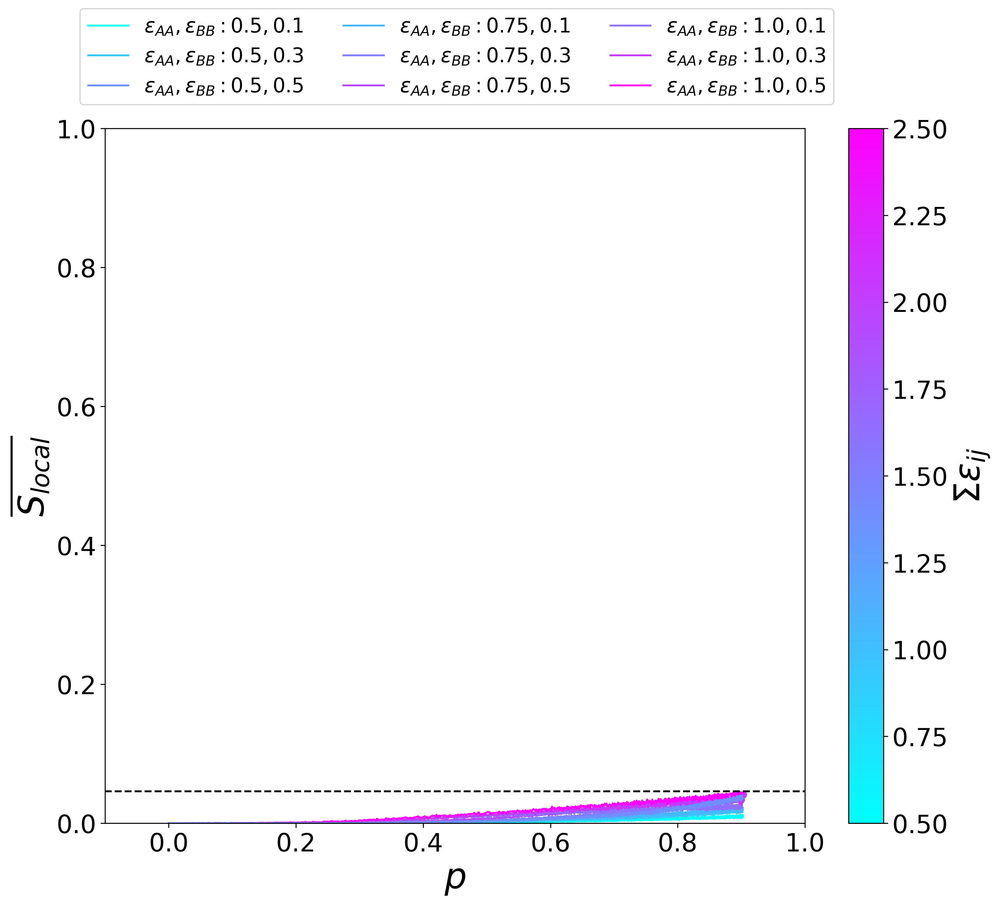

In [9]:
fig, host = plt.subplots(1,1,figsize = (12.5,10))
host.set_xlim(-0.1, 1)
host.set_ylim(0, 1)
host.set_xlabel("$p$")
host.set_ylabel("$\overline{S_{local}}$")

for i,sim in enumerate(flexible_sims):
    host.plot(sim[0],sim[1],label=labels[i], color=cmap(c_id[i]))#color=colors[i], marker=mrkrs[i], markevery=1.5)



host.legend(*([x[i] for i in [0,1,8,2,3,4,5,6,7]] for x in host.get_legend_handles_labels()),loc='lower left', ncol = 3, bbox_to_anchor=(-0.05,1.02), prop={'size':16});
norm = matplotlib.colors.Normalize(vmin=0.6,vmax=1.5)
sm = plt.cm.ScalarMappable(norm=norm,cmap=cmap)
sm.set_array([])
host.axhline(y=np.max(flexible_sims[-2][1]) ,xmin=host.get_xlim()[0], xmax=host.get_xlim()[1],color='k',linestyle='--')
plt.colorbar(sm6,ax=host,label='$\Sigma \epsilon_{ij}$');
plt.show()

Calculating $\overline{S_{\rm local}}$ feature trends.

In [10]:

epsAA_colorids = [2,2,1,1,1,0,0,0,2]
epsBB_colorids = [2,1,2,1,0,2,1,0,0]

#Threshold and max calculation
order_threshold = np.max(flexible_sims[-2][1])
order_emergence = []
#order_emergence_flex = []
order_max = []
order_max_index = []
order_max_p = []
#order_max_flex = []
for i,sim in enumerate(sims):
    try:
        threshold_index = list(map(lambda k: k > order_threshold,sim[1])).index(True)
    except:
        threshold_index = int(len(sim[1]) - 1)
    order_emergence.append(sim[0][threshold_index])
    order_max.append(np.max(sim[1]))
    order_max_index.append(np.argmax(sim[1]))
    order_max_p.append(sim[0][np.argmax(sim[1])])
    
# for i,sim in enumerate(flexible_sims):
#     threshold_index = list(map(lambda k: k > order_threshold,sim[1])).index(True)
#     order_emergence_flex.append(sim[0][threshold_index])
#     order_max_flex.append(np.max(sim[1]))
    

In [11]:
# print(order_max_p)
# print(len(sim[1]))
# print(order_max_index)

$\overline{S_{\rm local}}$ feature trends in $\varepsilon_{\rm AA}$ and $\varepsilon_{\rm AA} + \varepsilon_{\rm BB}$.

In [12]:
# fig, host = plt.subplots(1,2,figsize = (20,8))
# host[0].set_xlim(0.45, 1.05)
# host[1].set_xlim(0.45, 1.55)
# host[0].set_ylim(-0.1, 1.1)
# host[1].set_ylim(-0.1, 1.1)
# host[0].set_xlabel("$\epsilon_{AA}$")
# host[1].set_xlabel(labels[-1])
# host[0].set_ylabel("Reaction Extent at Order Emergence")
# host[1].set_ylabel('Maximum '+"$S_{local}$")
# host[0].scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = 'x')
# host[0].scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = '+')
# host[0].scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = 'o')


# mrkrs = ['x','+','x','+','o','x','+','o','o']
# #colors = ['k','k','c','c','c','b','b','b','k']
# for i in range(len(eps_max)):
#     host[0].scatter(eps_max[i],order_emergence[i],color=cmap3(c_id3[int(epsAA_colorids[i])]),marker=mrkrs[i])
#     host[1].scatter(eps_sum[i],order_max[i],color=cmap3(c_id3[int(epsAA_colorids[i])]),marker=mrkrs[i])
#     #host[1].scatter(eps_sum2[i],order_max[i],color=colors[i],marker=mrkrs[i])
# plt.colorbar(sm3,ax=host.ravel().tolist(),label=cb_labels[1]);
# host[0].legend((r'$\epsilon_{BB} = 0.1 k_{B}T$',r'$\epsilon_{BB} = 0.3 k_{B}T$',r'$\epsilon_{BB} = 0.5 k_{B}T$'),loc='lower left', ncol = 3, bbox_to_anchor=(0.5,1.02));

$\overline{S_{\rm local}}$ feature trends in $\varepsilon_{\rm AA} + \varepsilon_{\rm BB}$ only.

In [13]:
# fig, host = plt.subplots(1,2,figsize = (20,8))
# host[0].set_xlim(0.45, 1.55)
# host[1].set_xlim(0.45, 1.55)
# host[0].set_ylim(-0.1, 1.1)
# host[1].set_ylim(-0.1, 1.1)
# host[0].set_xlabel(labels[-1])
# host[1].set_xlabel(labels[-1])
# host[0].set_ylabel("Reaction Extent at Order Emergence")
# host[1].set_ylabel('Maximum '+"$S_{local}$")
# host[0].scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = 'x')
# host[0].scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = '+')
# host[0].scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = 'o')


# mrkrs = ['x','+','x','+','o','x','+','o','o']
# #colors = ['k','k','c','c','c','b','b','b','k']
# for i in range(len(eps_max)):
#     host[0].scatter(eps_sum[i],order_emergence[i],color=cmap3(c_id3[int(epsAA_colorids[i])]),marker=mrkrs[i])
#     host[1].scatter(eps_sum[i],order_max[i],color=cmap3(c_id3[int(epsAA_colorids[i])]),marker=mrkrs[i])
#     #host[1].scatter(eps_sum2[i],order_max[i],color=colors[i],marker=mrkrs[i])
# plt.colorbar(sm3,ax=host.ravel().tolist(),label=cb_labels[1]);
# host[0].legend((r'$\epsilon_{BB} = 0.1 k_{B}T$',r'$\epsilon_{BB} = 0.3 k_{B}T$',r'$\epsilon_{BB} = 0.5 k_{B}T$'),loc='lower left', ncol = 3, bbox_to_anchor=(0.5,1.02));

Combined $\overline{S_{\rm local}}$ figure.

In [14]:
# fig = plt.figure(figsize=(24,12))
# gs = fig.add_gridspec(2,2, width_ratios=[2,1], height_ratios = [1,1])
# ax1 = fig.add_subplot(gs[:,0])
# ax2 = fig.add_subplot(gs[0,1])
# ax3 = fig.add_subplot(gs[1,1])



# ax1.set_xlim(-0.1, 1)
# ax1.set_ylim(0, 1)
# ax1.set_xlabel("$p$")
# ax1.set_ylabel("$\overline{S_{local}}$")


# for i,sim in enumerate(sims):
#     ax1.plot(sim[0],sim[1],label=labels[i], color=cmap(c_id[i]))#color=colors[i], marker=mrkrs[i], markevery=1.5)



# ax1.legend(*([x[i] for i in [0,1,8,2,3,4,5,6,7]] for x in ax1.get_legend_handles_labels()),loc='lower left', ncol = 3, bbox_to_anchor=(0.04,1.02), prop={'size':16});
# norm = matplotlib.colors.Normalize(vmin=0.6,vmax=1.5)
# sm = plt.cm.ScalarMappable(norm=norm,cmap=cmap)
# sm.set_array([])
# ax1.axhline(y=np.max(flexible_sims[-2][1]) ,xmin=ax1.get_xlim()[0], xmax=ax1.get_xlim()[1],color='k',linestyle='--')
# plt.colorbar(sm,ax=ax1,label=labels[-1]);
    


# #sim index:
# #    0         1          2         3         4            5          6          7                 8           9      10     11       12    13          14            15
# #[extent_avg,order_avg,tstep_avg,probs_avg,blockAtotal,blockBtotal,chaindist,BlockA_PDI_avg,BlockB_PDI_avg,PDI_avg,pA_avg,pB_avg,seqs_all,Xn_avg,TotalBlock_PDI_avg, RDFs]
# # probs_avg index
# #[pAA_avg,pAB_avg,pBB_avg]
# # RDFs index
# # [step,x,rdf_all,rdf_AA,rdf_BB,rdf_AB]



# ax2.set_xlim(0.45, 1.05)
# ax3.set_xlim(0.45, 1.55)
# ax2.set_ylim(0.3, 1.1)
# ax3.set_ylim(-0.1, 1.1)
# ax2.set_xlabel("$\epsilon_{AA}$")
# ax3.set_xlabel(labels[-1])
# ax2.set_ylabel("$p$ at $ \ \overline{S_{local}}$ Threshold")
# ax3.set_ylabel('Peak '+"$\overline{S_{local}}$")
# ax2.scatter([-1.,-1.],[-1.,-1.],s=150, color = 'k', marker = 'x')
# ax2.scatter([-1.,-1.],[-1.,-1.],s=150, color = 'k', marker = '+')
# ax2.scatter([-1.,-1.],[-1.,-1.],s=75, color = 'k', marker = 'o')


# mrkrs = ['x','+','x','+','o','x','+','o','o']
# mrkrsizes = [150,150,150,150,75,150,150,75,75]
# #colors = ['k','k','c','c','c','b','b','b','k']
# for i in range(len(eps_max)):
#     ax2.scatter(eps_max[i],order_emergence[i],color=cmap3(c_id3[int(epsAA_colorids[i])]),marker=mrkrs[i],s=mrkrsizes[i])
#     ax3.scatter(eps_sum[i],order_max[i],color=cmap3(c_id3[int(epsAA_colorids[i])]),marker=mrkrs[i],s=mrkrsizes[i])
#     #ax3.scatter(eps_sum2[i],order_max[i],color=colors[i],marker=mrkrs[i])
# plt.colorbar(sm3,ax=[ax2,ax3],label=cb_labels[1]);
# ax2.legend((r'$\epsilon_{BB} = 0.1 k_{B}T$',r'$\epsilon_{BB} = 0.3 k_{B}T$',r'$\epsilon_{BB} = 0.5 k_{B}T$'),loc='lower left', ncol = 3, bbox_to_anchor=(-0.25,1.02), prop={'size':16});

# plt.show()

With $\Sigma \varepsilon_{ij}$ representation.

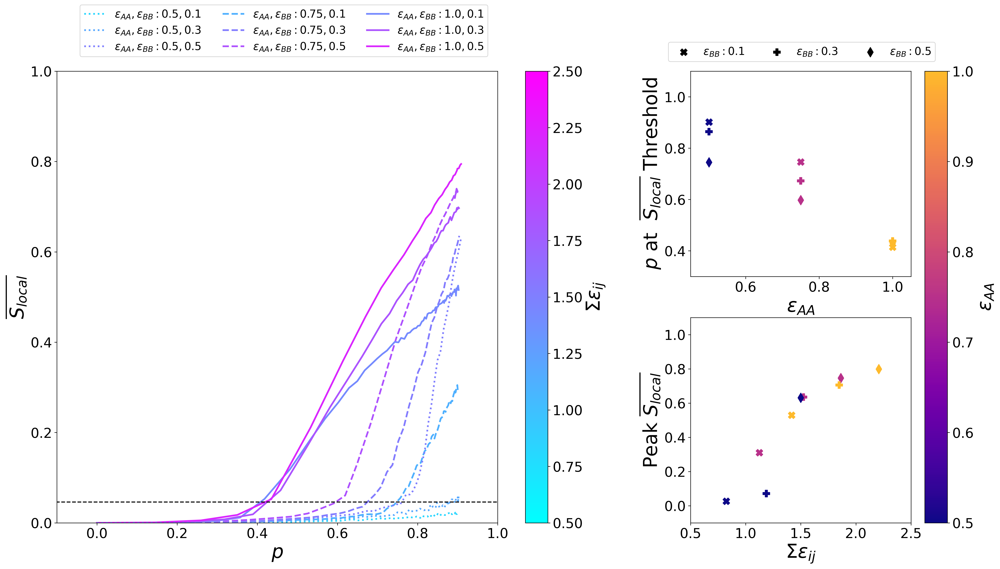

In [15]:
fig = plt.figure(figsize=(24,12))
gs = fig.add_gridspec(2,2, width_ratios=[2,1], height_ratios = [1,1])
ax1 = fig.add_subplot(gs[:,0])
ax2 = fig.add_subplot(gs[0,1])
ax3 = fig.add_subplot(gs[1,1])



ax1.set_xlim(-0.1, 1)
ax1.set_ylim(0, 1)
ax1.set_xlabel("$p$")
ax1.set_ylabel("$\overline{S_{local}}$")


for i,sim in enumerate(sims):
    ax1.plot(sim[0][::50],sim[1][::50],label=labels[i], color=cmap6(c_id6[i]), linestyle=epsAA_linestyles[i], linewidth = 2.5) #,linestyle=epsAA_dashes[i], linewidth=2.5)



ax1.legend(*([x[i] for i in [0,1,8,2,3,4,5,6,7]] for x in ax1.get_legend_handles_labels()),loc='lower left', ncol = 3, bbox_to_anchor=(0.04,1.02), prop={'size':16});
ax1.axhline(y=np.max(flexible_sims[-2][1]) ,xmin=ax1.get_xlim()[0], xmax=ax1.get_xlim()[1],color='k',linestyle='--')
plt.colorbar(sm6,ax=ax1,label='$\Sigma \epsilon_{ij}$');
    


#sim index:
#    0         1          2         3         4            5          6          7                 8           9      10     11       12    13          14            15
#[extent_avg,order_avg,tstep_avg,probs_avg,blockAtotal,blockBtotal,chaindist,BlockA_PDI_avg,BlockB_PDI_avg,PDI_avg,pA_avg,pB_avg,seqs_all,Xn_avg,TotalBlock_PDI_avg, RDFs]
# probs_avg index
#[pAA_avg,pAB_avg,pBB_avg]
# RDFs index
# [step,x,rdf_all,rdf_AA,rdf_BB,rdf_AB]



ax2.set_xlim(0.45, 1.05)
ax3.set_xlim(0.5, 2.5)
ax2.set_ylim(0.3, 1.1)
ax3.set_ylim(-0.1, 1.1)
ax2.set_xlabel("$\epsilon_{AA}$")
ax3.set_xlabel("$\Sigma \epsilon_{ij}$")
ax2.set_ylabel("$p$ at $ \ \overline{S_{local}}$ Threshold")
ax3.set_ylabel('Peak '+"$\overline{S_{local}}$")
ax2.scatter([-1.,-1.],[-1.,-1.],s=100, color = 'k', marker = 'X')
ax2.scatter([-1.,-1.],[-1.,-1.],s=100, color = 'k', marker = 'P')
ax2.scatter([-1.,-1.],[-1.,-1.],s=100, color = 'k', marker = 'd')


#mrkrs = ['x','+','x','+','o','x','+','o','o']
#mrkrsizes = [150,150,150,150,75,150,150,75,75]
#colors = ['k','k','c','c','c','b','b','b','k']
for i in range(len(eps_max)):
    ax2.scatter(eps_max[i],order_emergence[i],color=cmap3(c_id3[int(epsAA_colorids[i])]),marker=mrkrs[i],s=mrkrsizes[i])
    ax3.scatter(eps_sum2[i],order_max[i],color=cmap3(c_id3[int(epsAA_colorids[i])]),marker=mrkrs[i],s=mrkrsizes[i])
    #ax3.scatter(eps_sum2[i],order_max[i],color=colors[i],marker=mrkrs[i])
plt.colorbar(sm3,ax=[ax2,ax3],label=cb_labels[1]);
ax2.legend((r'$\epsilon_{BB}:0.1$',r'$\epsilon_{BB}:0.3$',r'$\epsilon_{BB}:0.5$'),loc='lower left', ncol = 3, bbox_to_anchor=(-0.125,1.02), prop={'size':16});

plt.show()

## Error Metrics

In [16]:
#Calculating metrics (testing alternatives)

#Initializing arrays
delta_eps = [0.4,0.2,0.65,0.45,0.25,0.9,0.7,0.5,0.0]
eps_max = [0.5,0.5,0.75,0.75,0.75,1.,1.,1.,0.5]
blockA_dkl = []
blockB_dkl = []
chain_dkl = []
blockA_emd = []
blockB_emd = []
chain_emd = []


blockA_dkl_sum = []
blockB_dkl_sum = []
chain_dkl_sum = []
blockA_cdf = []
blockB_cdf = []
chain_cdf = []
blockA_Flory_cdf = []
blockB_Flory_cdf = []
chain_Flory_cdf = []
n_chain = np.linspace(0,150,151)
n_chain_flexible = np.linspace(0,350,351)
n_block = np.linspace(0,50,51)


blockA_PDIerr = []
blockB_PDIerr = []
chain_PDIerr = []
blockA_PDImape = []
blockB_PDImape = []
chain_PDImape = []
blockA_PDIlogerr = []
blockB_PDIlogerr = []
chain_PDIlogerr = []


#sim index:
#    0         1          2         3         4            5          6          7                 8           9      10     11       12    13          14
#[extent_avg,order_avg,tstep_avg,probs_avg,blockAtotal,blockBtotal,chaindist,BlockA_PDI_avg,BlockB_PDI_avg,PDI_avg,pA_avg,pB_avg,seqs_all,Xn_avg,TotalBlock_PDI_avg]
# probs_avg index
#[pAA_avg,pAB_avg,pBB_avg]


for i,sim in enumerate(sims):
    #distributions 
    FloryBlockA = ((1-2*sim[0][-1]*sim[3][0][-1])*(2*sim[0][-1]*sim[3][0][-1])**(n_block[1:]-1))
    FloryBlockB = ((1-2*sim[0][-1]*sim[3][2][-1])*(2*sim[0][-1]*sim[3][2][-1])**(n_block[1:]-1))
    FloryChain = ((1-sim[0][-1])*sim[0][-1]**(n_chain[1:]-1))

    
    
    
    
    #entropy 
#     blockA_dkl.append(kl_div(sim[4][1:]/np.sum(sim[4][1:]),FloryBlockA))
#     blockB_dkl.append(kl_div(sim[5][1:]/np.sum(sim[5][1:]),FloryBlockB))
#     chain_dkl.append(kl_div(sim[6][1:]/np.sum(sim[6][1:]),FloryChain))
#     blockA_dkl_sum.append(np.sum(kl_div(sim[4][1:]/np.sum(sim[4][1:]),FloryBlockA)))
#     blockB_dkl_sum.append(np.sum(kl_div(sim[5][1:]/np.sum(sim[5][1:]),FloryBlockB)))
#     chain_dkl_sum.append(np.sum(kl_div(sim[6][1:]/np.sum(sim[6][1:]),FloryChain)))
    blockA_dkl.append(kld(sim[4][1:]/np.sum(sim[4][1:]),FloryBlockA))
    blockB_dkl.append(kld(sim[5][1:]/np.sum(sim[5][1:]),FloryBlockB))
    chain_dkl.append(kld(sim[6][1:]/np.sum(sim[6][1:]),FloryChain))
    blockA_dkl_sum.append(np.sum(kld(sim[4][1:]/np.sum(sim[4][1:]),FloryBlockA)))
    blockB_dkl_sum.append(np.sum(kld(sim[5][1:]/np.sum(sim[5][1:]),FloryBlockB)))
    chain_dkl_sum.append(np.sum(kld(sim[6][1:]/np.sum(sim[6][1:]),FloryChain)))
    
    
#         #entropy swapped
# #     blockA_dkl.append(kl_div(FloryBlockA,sim[4][1:]/np.sum(sim[4][1:])))
# #     blockB_dkl.append(kl_div(FloryBlockB,sim[5][1:]/np.sum(sim[5][1:])))
# #     chain_dkl.append(kl_div(FloryChain,sim[6][1:]/np.sum(sim[6][1:])))
# #     blockA_dkl_sum.append(np.sum(kl_div(FloryBlockA,sim[4][1:]/np.sum(sim[4][1:]))))
# #     blockB_dkl_sum.append(np.sum(kl_div(FloryBlockB,sim[5][1:]/np.sum(sim[5][1:]))))
# #     chain_dkl_sum.append(np.sum(kl_div(FloryChain,sim[6][1:]/np.sum(sim[6][1:]))))
#     blockA_dkl.append(kld(FloryBlockA,sim[4][1:]/np.sum(sim[4][1:])))
#     blockB_dkl.append(kld(FloryBlockB,sim[5][1:]/np.sum(sim[5][1:])))
#     chain_dkl.append(kld(FloryChain,sim[6][1:]/np.sum(sim[6][1:])))
#     blockA_dkl_sum.append(np.sum(kld(FloryBlockA,sim[4][1:]/np.sum(sim[4][1:]))))
#     blockB_dkl_sum.append(np.sum(kld(FloryBlockB,sim[5][1:]/np.sum(sim[5][1:]))))
#     chain_dkl_sum.append(np.sum(kld(FloryChain,sim[6][1:]/np.sum(sim[6][1:]))))


    

    #Calculating CDFs
    blockA_cdf.append(np.cumsum(sim[4][1:]/np.sum(sim[4][1:])))
    blockB_cdf.append(np.cumsum(sim[5][1:]/np.sum(sim[5][1:])))
    chain_cdf.append(np.cumsum(sim[6][1:]/np.sum(sim[6][1:])))
    blockA_Flory_cdf.append(np.cumsum(FloryBlockA))
    blockB_Flory_cdf.append(np.cumsum(FloryBlockB))
    chain_Flory_cdf.append(np.cumsum(FloryChain))
                     
                     
#     #EMD
#     blockA_emd.append(emd(sim[4][1:]/np.sum(sim[4][1:]),FloryBlockA))
#     blockB_emd.append(emd(sim[5][1:]/np.sum(sim[5][1:]),FloryBlockB))
#     chain_emd.append(emd(sim[6][1:]/np.sum(sim[6][1:]),FloryChain))
    
    #EMD - weighted
    blockA_emd.append(emd(np.arange(len(FloryBlockA)),np.arange(len(FloryBlockA)),sim[4][1:]/np.sum(sim[4][1:]),FloryBlockA))
    blockB_emd.append(emd(np.arange(len(FloryBlockB)),np.arange(len(FloryBlockB)),sim[5][1:]/np.sum(sim[5][1:]),FloryBlockB))
    chain_emd.append(emd(np.arange(len(FloryChain)),np.arange(len(FloryChain)),sim[6][1:]/np.sum(sim[6][1:]),FloryChain))
    
    

    

    
    #PDI errors
    blockA_PDIerr.append(mean_squared_error((sim[0]*sim[3][0][-1])+1,sim[7]))
    blockB_PDIerr.append(mean_squared_error((sim[0]*sim[3][2][-1])+1,sim[8]))
    chain_PDIerr.append(mean_squared_error(sim[0]+1,sim[9]))
    blockA_PDImape.append(mean_absolute_percentage_error((sim[0]*sim[3][0][-1])+1,sim[7]))
    blockB_PDImape.append(mean_absolute_percentage_error((sim[0]*sim[3][2][-1])+1,sim[8]))
    chain_PDImape.append(mean_absolute_percentage_error(sim[0]+1,sim[9]))
    blockA_PDIlogerr.append(mean_squared_log_error((sim[0]*sim[3][0][-1])+1,sim[7]))
    blockB_PDIlogerr.append(mean_squared_log_error((sim[0]*sim[3][2][-1])+1,sim[8]))
    chain_PDIlogerr.append(mean_squared_log_error(sim[0]+1,sim[9]))
    
    

    

    
# Errors for flexible sims
for i in range(len(flexible_sims)):
    FloryBlockA_flex = ((1-2*flexible_sims[i][0][-1]*flexible_sims[i][3][0][-1])*(2*flexible_sims[i][0][-1]*flexible_sims[i][3][0][-1])**(n_block[1:]-1))
    FloryBlockB_flex = ((1-2*flexible_sims[i][0][-1]*flexible_sims[i][3][2][-1])*(2*flexible_sims[i][0][-1]*flexible_sims[i][3][2][-1])**(n_block[1:]-1))
    FloryChain_flex = ((1-flexible_sims[i][0][-1])*flexible_sims[i][0][-1]**(n_chain_flexible[1:]-1))

#     #Flexible entropy 
#     blockA_dkl.append(kl_div(flexible_sims[i][4][1:]/np.sum(flexible_sims[i][4][1:]),FloryBlockA_flex))
#     blockB_dkl.append(kl_div(flexible_sims[i][5][1:]/np.sum(flexible_sims[i][5][1:]),FloryBlockB_flex))
#     chain_dkl.append(kl_div(flexible_sims[i][6][1:]/np.sum(flexible_sims[i][6][1:]),FloryChain_flex))
#     blockA_dkl_sum.append(np.sum(kl_div(flexible_sims[i][4][1:]/np.sum(flexible_sims[i][4][1:]),FloryBlockA_flex)))
#     blockB_dkl_sum.append(np.sum(kl_div(flexible_sims[i][5][1:]/np.sum(flexible_sims[i][5][1:]),FloryBlockB_flex)))
#     chain_dkl_sum.append(np.sum(kl_div(flexible_sims[i][6][1:]/np.sum(flexible_sims[i][6][1:]),FloryChain_flex)))
    blockA_dkl.append(kld(flexible_sims[i][4][1:]/np.sum(flexible_sims[i][4][1:]),FloryBlockA_flex))
    blockB_dkl.append(kld(flexible_sims[i][5][1:]/np.sum(flexible_sims[i][5][1:]),FloryBlockB_flex))
    chain_dkl.append(kld(flexible_sims[i][6][1:]/np.sum(flexible_sims[i][6][1:]),FloryChain_flex))
    blockA_dkl_sum.append(np.sum(kld(flexible_sims[i][4][1:]/np.sum(flexible_sims[i][4][1:]),FloryBlockA_flex)))
    blockB_dkl_sum.append(np.sum(kld(flexible_sims[i][5][1:]/np.sum(flexible_sims[i][5][1:]),FloryBlockB_flex)))
    chain_dkl_sum.append(np.sum(kld(flexible_sims[i][6][1:]/np.sum(flexible_sims[i][6][1:]),FloryChain_flex)))
    
    
#         #Flexible entropy swapped
# #     blockA_dkl.append(kl_div(FloryBlockA_flex,flexible_sims[i][4][1:]/np.sum(flexible_sims[i][4][1:])))
# #     blockB_dkl.append(kl_div(FloryBlockB_flex,flexible_sims[i][5][1:]/np.sum(flexible_sims[i][5][1:])))
# #     chain_dkl.append(kl_div(FloryChain_flex,flexible_sims[i][6][1:]/np.sum(flexible_sims[i][6][1:])))
# #     blockA_dkl_sum.append(np.sum(kl_div(FloryBlockA_flex,flexible_sims[i][4][1:]/np.sum(flexible_sims[i][4][1:]))))
# #     blockB_dkl_sum.append(np.sum(kl_div(FloryBlockB_flex,flexible_sims[i][5][1:]/np.sum(flexible_sims[i][5][1:]))))
# #     chain_dkl_sum.append(np.sum(kl_div(FloryChain_flex,flexible_sims[i][6][1:]/np.sum(flexible_sims[i][6][1:]))))
#     blockA_dkl.append(kld(FloryBlockA_flex,flexible_sims[i][4][1:]/np.sum(flexible_sims[i][4][1:])))
#     blockB_dkl.append(kld(FloryBlockB_flex,flexible_sims[i][5][1:]/np.sum(flexible_sims[i][5][1:])))
#     chain_dkl.append(kld(FloryChain_flex,flexible_sims[i][6][1:]/np.sum(flexible_sims[i][6][1:])))
#     blockA_dkl_sum.append(np.sum(kld(FloryBlockA_flex,flexible_sims[i][4][1:]/np.sum(flexible_sims[i][4][1:]))))
#     blockB_dkl_sum.append(np.sum(kld(FloryBlockB_flex,flexible_sims[i][5][1:]/np.sum(flexible_sims[i][5][1:]))))
#     chain_dkl_sum.append(np.sum(kld(FloryChain_flex,flexible_sims[i][6][1:]/np.sum(flexible_sims[i][6][1:]))))
    
    
#     #Flexible EMD
#     blockA_emd.append(emd(flexible_sims[i][4][1:]/np.sum(flexible_sims[i][4][1:]),FloryBlockA_flex))
#     blockB_emd.append(emd(flexible_sims[i][5][1:]/np.sum(flexible_sims[i][5][1:]),FloryBlockB_flex))
#     chain_emd.append(emd(flexible_sims[i][6][1:]/np.sum(flexible_sims[i][6][1:]),FloryChain_flex))
    
    
    #Flexible EMD -- weighted
    blockA_emd.append(emd(np.arange(len(FloryBlockA_flex)),np.arange(len(FloryBlockA_flex)),flexible_sims[i][4][1:]/np.sum(flexible_sims[i][4][1:]),FloryBlockA_flex))
    blockB_emd.append(emd(np.arange(len(FloryBlockB_flex)),np.arange(len(FloryBlockB_flex)),flexible_sims[i][5][1:]/np.sum(flexible_sims[i][5][1:]),FloryBlockB_flex))
    chain_emd.append(emd(np.arange(len(FloryChain_flex)),np.arange(len(FloryChain_flex)),flexible_sims[i][6][1:]/np.sum(flexible_sims[i][6][1:]),FloryChain_flex))
    


    #Flexible PDI errors
    blockA_PDIerr.append(mean_squared_error((flexible_sims[i][0]*flexible_sims[i][3][0][-1])+1,flexible_sims[i][7]))
    blockB_PDIerr.append(mean_squared_error((flexible_sims[i][0]*flexible_sims[i][3][2][-1])+1,flexible_sims[i][8]))
    chain_PDIerr.append(mean_squared_error(flexible_sims[i][0]+1,flexible_sims[i][9]))
    blockA_PDImape.append(mean_absolute_percentage_error((flexible_sims[i][0]*flexible_sims[i][3][0][-1])+1,flexible_sims[i][7]))
    blockB_PDImape.append(mean_absolute_percentage_error((flexible_sims[i][0]*flexible_sims[i][3][2][-1])+1,flexible_sims[i][8]))
    chain_PDImape.append(mean_absolute_percentage_error(flexible_sims[i][0]+1,flexible_sims[i][9]))
    blockA_PDIlogerr.append(mean_squared_log_error((flexible_sims[i][0]*flexible_sims[i][3][0][-1])+1,flexible_sims[i][7]))
    blockB_PDIlogerr.append(mean_squared_log_error((flexible_sims[i][0]*flexible_sims[i][3][2][-1])+1,flexible_sims[i][8]))
    chain_PDIlogerr.append(mean_squared_log_error(flexible_sims[i][0]+1,flexible_sims[i][9]))

Error metric plots for stiff and flexible chains.

In [17]:
# # Plotting
# fig, host = plt.subplots(1,2,figsize = (24,8))
# #fig, host = plt.subplots(1,2,figsize = (20,8))

# host[0].set_xlabel("$\Delta \epsilon$")
# host[1].set_xlabel("$\Delta \epsilon$")


# #Dummy markers for legend
# #host[0].scatter([-10],[-10],c='r',marker='s')
# #host[0].scatter([-10],[-10],c='b',marker='s')
# leg1=host[0].bar([-10,-9],[-10,-9],color='r')
# leg2=host[0].bar([-10,-9],[-10,-9],color='b')
# #host[0].scatter([-10],[-10],c='k',marker='s')
# leg3=host[0].scatter([-10],[-10],c='k',marker='^',s=150)
# leg4=host[0].scatter([-10],[-10],c='k',marker='v',s=150)

# # host[1].scatter([-10],[-10],c='r',marker='s')
# # host[1].scatter([-10],[-10],c='b',marker='s')
# # #host[1].scatter([-10],[-10],c='k',marker='s')
# # host[1].scatter([-10],[-10],c='k',marker='^')
# # host[1].scatter([-10],[-10],c='k',marker='v')




# #Trendline fitting
# minepsAA_index = [0,1,-1,0,1,-1] #done twice to add stiff and flexible chain simulations
# midepsAA_index = [2,3,4,2,3,4]
# maxepsAA_index = [5,6,7,5,6,7]
# minepsAA_xfit = np.array([delta_eps[i] for i in minepsAA_index]).reshape(-1,1)
# midepsAA_xfit = np.array([delta_eps[i] for i in midepsAA_index]).reshape(-1,1)
# maxepsAA_xfit = np.array([delta_eps[i] for i in maxepsAA_index]).reshape(-1,1)

# minepsAA_yfit = np.array([blockA_PDIerr[i] for i in minepsAA_index]).reshape(-1,1)
# midepsAA_yfit = np.array([blockA_PDIerr[i] for i in midepsAA_index]).reshape(-1,1)
# maxepsAA_yfit = np.array([blockA_PDIerr[i] for i in maxepsAA_index]).reshape(-1,1)
# minepsAA_yfit2 = np.array([blockA_emd[i] for i in minepsAA_index]).reshape(-1,1)
# midepsAA_yfit2 = np.array([blockA_emd[i] for i in midepsAA_index]).reshape(-1,1)
# maxepsAA_yfit2 = np.array([blockA_emd[i] for i in maxepsAA_index]).reshape(-1,1)

# for j,i in enumerate([3,4,5]):
#     minepsAA_yfit[i] = blockA_PDIerr[int(minepsAA_index[j]+len(delta_eps))]
#     midepsAA_yfit[i] = blockA_PDIerr[int(midepsAA_index[j]+len(delta_eps))]
#     maxepsAA_yfit[i] = blockA_PDIerr[int(maxepsAA_index[j]+len(delta_eps))]
#     minepsAA_yfit2[i] = blockA_emd[int(minepsAA_index[j]+len(delta_eps))]
#     midepsAA_yfit2[i] = blockA_emd[int(midepsAA_index[j]+len(delta_eps))]
#     maxepsAA_yfit2[i] = blockA_emd[int(maxepsAA_index[j]+len(delta_eps))]


# blockB_xfit = np.array(delta_eps+delta_eps).reshape(-1,1)
# blockB_yfit = np.array(blockB_PDIerr)
# blockB_yfit2 = np.array(blockB_emd)

# minepsAA_model = LinearRegression().fit(minepsAA_xfit,minepsAA_yfit)
# minepsAA_model2 = LinearRegression().fit(minepsAA_xfit,minepsAA_yfit2)
# minepsAA_linex = np.linspace(min(minepsAA_xfit),max(minepsAA_xfit),10)
# minepsAA_liney = minepsAA_model.intercept_ + minepsAA_model.coef_ * minepsAA_linex
# minepsAA_liney2 = minepsAA_model2.intercept_ + minepsAA_model2.coef_ * minepsAA_linex

# midepsAA_model = LinearRegression().fit(midepsAA_xfit,midepsAA_yfit)
# midepsAA_model2 = LinearRegression().fit(midepsAA_xfit,midepsAA_yfit2)
# midepsAA_linex = np.linspace(min(midepsAA_xfit),max(midepsAA_xfit),10)
# midepsAA_liney = midepsAA_model.intercept_ + midepsAA_model.coef_ * midepsAA_linex
# midepsAA_liney2 = midepsAA_model2.intercept_ + midepsAA_model2.coef_ * midepsAA_linex

# maxepsAA_model = LinearRegression().fit(maxepsAA_xfit,maxepsAA_yfit)
# maxepsAA_model2 = LinearRegression().fit(maxepsAA_xfit,maxepsAA_yfit2)
# maxepsAA_linex = np.linspace(min(maxepsAA_xfit),max(maxepsAA_xfit),10)
# maxepsAA_liney = maxepsAA_model.intercept_ + maxepsAA_model.coef_ * maxepsAA_linex
# maxepsAA_liney2 = maxepsAA_model2.intercept_ + maxepsAA_model2.coef_ * maxepsAA_linex

# blockB_model = LinearRegression().fit(blockB_xfit , blockB_yfit)
# blockB_model2 = LinearRegression().fit(blockB_xfit , blockB_yfit2)
# blockB_linex = np.linspace(min(blockB_xfit),max(blockB_xfit),10)
# blockB_liney = blockB_model.intercept_ + blockB_model.coef_ * blockB_linex
# blockB_liney2 = blockB_model2.intercept_ + blockB_model2.coef_ * blockB_linex

# host[0].plot(blockB_linex,blockB_liney,':k',label="Trendline - Block B")
# host[1].plot(blockB_linex,blockB_liney2,':k',label="Trendline - Block B")
# host[0].plot(minepsAA_linex,minepsAA_liney.reshape(-1,1),linestyle='--',color=cmap3(c_id3[2]))
# host[1].plot(minepsAA_linex,minepsAA_liney2.reshape(-1,1),linestyle='--',color=cmap3(c_id3[2]))
# host[0].plot(midepsAA_linex,midepsAA_liney.reshape(-1,1),linestyle='--',color=cmap3(c_id3[1]))
# host[1].plot(midepsAA_linex,midepsAA_liney2.reshape(-1,1),linestyle='--',color=cmap3(c_id3[1]))
# host[0].plot(maxepsAA_linex,maxepsAA_liney.reshape(-1,1),linestyle='--',color=cmap3(c_id3[0]))
# host[1].plot(maxepsAA_linex,maxepsAA_liney2.reshape(-1,1),linestyle='--',color=cmap3(c_id3[0]))
# plt.colorbar(sm3,ax=host.ravel().tolist(),label=cb_labels[1]);







# # #PDI errors

# host[0].set_ylabel("MSE ("+u'\u0110'+")")
# host[0].scatter(delta_eps,blockA_PDIerr[:len(delta_eps)],c='r',marker='^',s=150)
# host[0].scatter(delta_eps,blockB_PDIerr[:len(delta_eps)],c='b',marker='^',s=150)
# #host[0].scatter(delta_eps,chain_PDIerr[:len(delta_eps)],c='k',marker='^')
# host[0].scatter(delta_eps,blockA_PDIerr[len(delta_eps):],c='r',marker='v',s=150)
# host[0].scatter(delta_eps,blockB_PDIerr[len(delta_eps):],c='b',marker='v',s=150)
# #host[0].scatter(delta_eps,chain_PDIerr[len(delta_eps):],c='k',marker='v')
# host[0].set_ylim((-0.05,3.0))

# # host[0].set_ylabel("MAPD ("+u'\u0110'+")")
# # host[0].scatter(delta_eps,blockA_PDImape[:len(delta_eps)],c='r',marker='^')
# # host[0].scatter(delta_eps,blockB_PDImape[:len(delta_eps)],c='b',marker='^')
# # #host[0].scatter(delta_eps,chain_PDImape[:len(delta_eps)],c='k',marker='^')
# # host[0].scatter(delta_eps,blockA_PDImape[len(delta_eps):],c='r',marker='v')
# # host[0].scatter(delta_eps,blockB_PDImape[len(delta_eps):],c='b',marker='v')
# # #host[0].scatter(delta_eps,chain_PDImape[len(delta_eps):],c='k',marker='v')
# # host[0].set_ylim((-0.05,1.4))

# #host[0].set_ylabel("MSLE (PDI)")
# # host[0].scatter(delta_eps,blockA_PDIlogerr[:len(delta_eps)],c='r',marker='^')
# # host[0].scatter(delta_eps,blockB_PDIlogerr[:len(delta_eps)],c='b',marker='^')
# # #host[0].scatter(delta_eps,chain_PDIlogerr[:len(delta_eps)],c='k',marker='^')

# # host[0].scatter(delta_eps,blockA_PDIlogerr[len(delta_eps):],c='r',marker='v')
# # host[0].scatter(delta_eps,blockB_PDIlogerr[len(delta_eps):],c='b',marker='v')
# # #host[0].scatter(delta_eps,chain_PDIlogerr[len(delta_eps):],c='k',marker='v')


# #Distribution errors
# host[1].set_ylabel("$W_p$")
# host[1].scatter(delta_eps,blockA_emd[:len(delta_eps)],c='r',marker='^',s=150)
# host[1].scatter(delta_eps,blockB_emd[:len(delta_eps)],c='b',marker='^',s=150)
# #host[1].scatter(delta_eps,chain_emd[:len(delta_eps)],c='k',marker='^')

# host[1].scatter(delta_eps,blockA_emd[len(delta_eps):],c='r',marker='v',s=150)
# host[1].scatter(delta_eps,blockB_emd[len(delta_eps):],c='b',marker='v',s=150)
# #host[1].scatter(delta_eps,chain_emd[len(delta_eps):],c='k',marker='v')
# host[1].set_ylim((-0.0005,0.013))
# plt.ticklabel_format(axis='y', style='sci', scilimits=(-2,3))



# # host[1].set_ylabel("$D_{KL}$ (nats)")
# # host[1].scatter(delta_eps,blockA_dkl_sum[:len(delta_eps)],c='r',marker='^')
# # host[1].scatter(delta_eps,blockB_dkl_sum[:len(delta_eps)],c='b',marker='^')
# # #host[1].scatter(delta_eps,chain_dkl_sum[:len(delta_eps)],c='k',marker='^')

# # host[1].scatter(delta_eps,blockA_dkl_sum[len(delta_eps):],c='r',marker='v')
# # host[1].scatter(delta_eps,blockB_dkl_sum[len(delta_eps):],c='b',marker='v')
# # #host[1].scatter(delta_eps,chain_dkl_sum[len(delta_eps):],c='k',marker='v')
# # host[1].set_ylim((-0.01,0.25))




# #Figure limits and legend
# host[0].set_xlim((-0.05,0.95))
# host[1].set_xlim(host[0].get_xlim())


# #host[0].legend(('A Block','B Block','Chain','Stiff','Flexible'),loc='upper left')
# #host[1].legend(('A Block','B Block','Chain','Stiff','Flexible'),loc='upper left');
# host[0].legend([leg1,leg2,leg3,leg4],('A Block','B Block','Stiff','Flexible'),loc='upper left');
# #host[1].legend(('A Block','B Block','Stiff','Flexible'),loc='upper left');


Trendline fitting for error metrics.

In [18]:
#Trendline fitting
minepsAA_index = [0,1,8,0,1,8] #done twice to add stiff and flexible chain simulations
midepsAA_index = [2,3,4,2,3,4]
maxepsAA_index = [5,6,7,5,6,7]
minepsAA_xfit = np.array([delta_eps[i] for i in minepsAA_index]).reshape(-1,1)
midepsAA_xfit = np.array([delta_eps[i] for i in midepsAA_index]).reshape(-1,1)
maxepsAA_xfit = np.array([delta_eps[i] for i in maxepsAA_index]).reshape(-1,1)

minepsAA_yfit = np.array([blockA_PDIerr[i] for i in minepsAA_index]).reshape(-1,1)
midepsAA_yfit = np.array([blockA_PDIerr[i] for i in midepsAA_index]).reshape(-1,1)
maxepsAA_yfit = np.array([blockA_PDIerr[i] for i in maxepsAA_index]).reshape(-1,1)
minepsAA_yfit2 = np.array([blockA_emd[i] for i in minepsAA_index]).reshape(-1,1)
midepsAA_yfit2 = np.array([blockA_emd[i] for i in midepsAA_index]).reshape(-1,1)
maxepsAA_yfit2 = np.array([blockA_emd[i] for i in maxepsAA_index]).reshape(-1,1)



minepsBB_index = [0,2,5,0,2,5] #done twice to add stiff and flexible chain simulations
midepsBB_index = [1,3,6,1,3,6]
maxepsBB_index = [8,4,7,8,4,7]
minepsBB_xfit = np.array([delta_eps[i] for i in minepsBB_index]).reshape(-1,1) #change to (x)epsAA_index to group B fitting by epsAA values
midepsBB_xfit = np.array([delta_eps[i] for i in midepsBB_index]).reshape(-1,1)
maxepsBB_xfit = np.array([delta_eps[i] for i in maxepsBB_index]).reshape(-1,1)

minepsBB_yfit = np.array([blockB_PDIerr[i] for i in minepsBB_index]).reshape(-1,1)
midepsBB_yfit = np.array([blockB_PDIerr[i] for i in midepsBB_index]).reshape(-1,1)
maxepsBB_yfit = np.array([blockB_PDIerr[i] for i in maxepsBB_index]).reshape(-1,1)
minepsBB_yfit2 = np.array([blockB_emd[i] for i in minepsBB_index]).reshape(-1,1)
midepsBB_yfit2 = np.array([blockB_emd[i] for i in midepsBB_index]).reshape(-1,1)
maxepsBB_yfit2 = np.array([blockB_emd[i] for i in maxepsBB_index]).reshape(-1,1)




#Fixing the values for the other chain stiffness
for j,i in enumerate([3,4,5]):
    minepsAA_yfit[i] = blockA_PDIerr[int(minepsAA_index[j]+len(delta_eps))]
    midepsAA_yfit[i] = blockA_PDIerr[int(midepsAA_index[j]+len(delta_eps))]
    maxepsAA_yfit[i] = blockA_PDIerr[int(maxepsAA_index[j]+len(delta_eps))]
    minepsAA_yfit2[i] = blockA_emd[int(minepsAA_index[j]+len(delta_eps))]
    midepsAA_yfit2[i] = blockA_emd[int(midepsAA_index[j]+len(delta_eps))]
    maxepsAA_yfit2[i] = blockA_emd[int(maxepsAA_index[j]+len(delta_eps))]
    minepsBB_yfit[i] = blockB_PDIerr[int(minepsBB_index[j]+len(delta_eps))]
    midepsBB_yfit[i] = blockB_PDIerr[int(midepsBB_index[j]+len(delta_eps))]
    maxepsBB_yfit[i] = blockB_PDIerr[int(maxepsBB_index[j]+len(delta_eps))]
    minepsBB_yfit2[i] = blockB_emd[int(minepsBB_index[j]+len(delta_eps))]
    midepsBB_yfit2[i] = blockB_emd[int(midepsBB_index[j]+len(delta_eps))]
    maxepsBB_yfit2[i] = blockB_emd[int(maxepsBB_index[j]+len(delta_eps))]


blockB_xfit = np.array(delta_eps+delta_eps).reshape(-1,1)
blockB_yfit = np.array(blockB_PDIerr)
blockB_yfit2 = np.array(blockB_emd)

blockB_model = LinearRegression().fit(blockB_xfit[9:], blockB_yfit[9:])
blockB_model2 = LinearRegression().fit(blockB_xfit[9:], blockB_yfit2[9:])
blockB_linex = np.linspace(min(blockB_xfit),max(blockB_xfit),10)
blockB_liney = blockB_model.intercept_ + blockB_model.coef_ * blockB_linex
blockB_liney2 = blockB_model2.intercept_ + blockB_model2.coef_ * blockB_linex

#A blocks
minepsAA_model = LinearRegression().fit(minepsAA_xfit[3:],minepsAA_yfit[3:])
minepsAA_model2 = LinearRegression().fit(minepsAA_xfit[3:],minepsAA_yfit2[3:])
minepsAA_linex = np.linspace(min(minepsAA_xfit),max(minepsAA_xfit),10)
minepsAA_liney = minepsAA_model.intercept_ + minepsAA_model.coef_ * minepsAA_linex
minepsAA_liney2 = minepsAA_model2.intercept_ + minepsAA_model2.coef_ * minepsAA_linex

midepsAA_model = LinearRegression().fit(midepsAA_xfit[3:],midepsAA_yfit[3:])
midepsAA_model2 = LinearRegression().fit(midepsAA_xfit[3:],midepsAA_yfit2[3:])
midepsAA_linex = np.linspace(min(midepsAA_xfit),max(midepsAA_xfit),10)
midepsAA_liney = midepsAA_model.intercept_ + midepsAA_model.coef_ * midepsAA_linex
midepsAA_liney2 = midepsAA_model2.intercept_ + midepsAA_model2.coef_ * midepsAA_linex

maxepsAA_model = LinearRegression().fit(maxepsAA_xfit[3:],maxepsAA_yfit[3:])
maxepsAA_model2 = LinearRegression().fit(maxepsAA_xfit[3:],maxepsAA_yfit2[3:])
maxepsAA_linex = np.linspace(min(maxepsAA_xfit),max(maxepsAA_xfit),10)
maxepsAA_liney = maxepsAA_model.intercept_ + maxepsAA_model.coef_ * maxepsAA_linex
maxepsAA_liney2 = maxepsAA_model2.intercept_ + maxepsAA_model2.coef_ * maxepsAA_linex

#B blocks
minepsBB_model = LinearRegression().fit(minepsBB_xfit[3:],minepsBB_yfit[3:])
minepsBB_model2 = LinearRegression().fit(minepsBB_xfit[3:],minepsBB_yfit2[3:])
minepsBB_linex = np.linspace(min(minepsBB_xfit),max(minepsBB_xfit),10)
minepsBB_liney = minepsBB_model.intercept_ + minepsBB_model.coef_ * minepsBB_linex
minepsBB_liney2 = minepsBB_model2.intercept_ + minepsBB_model2.coef_ * minepsBB_linex

midepsBB_model = LinearRegression().fit(midepsBB_xfit[3:],midepsBB_yfit[3:])
midepsBB_model2 = LinearRegression().fit(midepsBB_xfit[3:],midepsBB_yfit2[3:])
midepsBB_linex = np.linspace(min(midepsBB_xfit),max(midepsBB_xfit),10)
midepsBB_liney = midepsBB_model.intercept_ + midepsBB_model.coef_ * midepsBB_linex
midepsBB_liney2 = midepsBB_model2.intercept_ + midepsBB_model2.coef_ * midepsBB_linex

maxepsBB_model = LinearRegression().fit(maxepsBB_xfit[3:],maxepsBB_yfit[3:])
maxepsBB_model2 = LinearRegression().fit(maxepsBB_xfit[3:],maxepsBB_yfit2[3:])
maxepsBB_linex = np.linspace(min(maxepsBB_xfit),max(maxepsBB_xfit),10)
maxepsBB_liney = maxepsBB_model.intercept_ + maxepsBB_model.coef_ * maxepsAA_linex
maxepsBB_liney2 = maxepsBB_model2.intercept_ + maxepsBB_model2.coef_ * maxepsBB_linex





#print(minepsBB_linex)
#print(midepsBB_linex)
#print(maxepsBB_linex)

Error metric plots for flexible chains only.

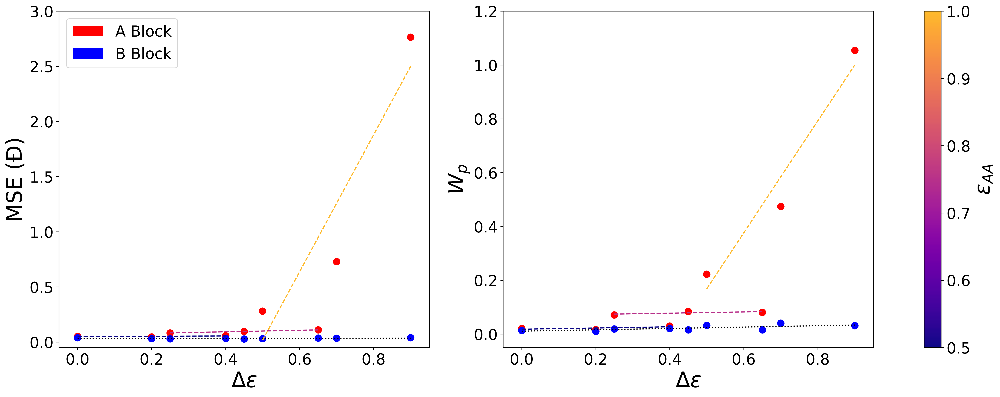

In [19]:
# Plotting
fig, host = plt.subplots(1,2,figsize = (24,8))
#fig, host = plt.subplots(1,2,figsize = (20,8))

host[0].set_xlabel("$\Delta \epsilon$")
host[1].set_xlabel("$\Delta \epsilon$")


#Dummy markers for legend

leg1=host[0].bar([-10,-9],[-10,-9],color='r')
leg2=host[0].bar([-10,-9],[-10,-9],color='b')






#Plotting trendlines
host[0].plot(blockB_linex,blockB_liney,':k',label="Trendline - Block B")
host[1].plot(blockB_linex,blockB_liney2,':k',label="Trendline - Block B")
host[0].plot(minepsAA_linex,minepsAA_liney.reshape(-1,1),linestyle='--',color=cmap3(c_id3[2]))
host[1].plot(minepsAA_linex,minepsAA_liney2.reshape(-1,1),linestyle='--',color=cmap3(c_id3[2]))
host[0].plot(midepsAA_linex,midepsAA_liney.reshape(-1,1),linestyle='--',color=cmap3(c_id3[1]))
host[1].plot(midepsAA_linex,midepsAA_liney2.reshape(-1,1),linestyle='--',color=cmap3(c_id3[1]))
host[0].plot(maxepsAA_linex,maxepsAA_liney.reshape(-1,1),linestyle='--',color=cmap3(c_id3[0]))
host[1].plot(maxepsAA_linex,maxepsAA_liney2.reshape(-1,1),linestyle='--',color=cmap3(c_id3[0]))
plt.colorbar(sm3,ax=host.ravel().tolist(),label=cb_labels[1]);







# #PDI errors
host[0].set_ylabel("MSE ("+u'\u0110'+")")
host[0].scatter(delta_eps,blockA_PDIerr[len(delta_eps):],c='r',marker='o',s=75)
host[0].scatter(delta_eps,blockB_PDIerr[len(delta_eps):],c='b',marker='o',s=75)
host[0].set_ylim((-0.05,3.0))




#Distribution errors
host[1].set_ylabel("$W_p$")
host[1].scatter(delta_eps,blockA_emd[len(delta_eps):],c='r',marker='o',s=75)
host[1].scatter(delta_eps,blockB_emd[len(delta_eps):],c='b',marker='o',s=75)
host[1].set_ylim((-0.05,1.2))
plt.ticklabel_format(axis='y', style='sci', scilimits=(-2,3))




#Figure limits and legend
host[0].set_xlim((-0.05,0.95))
host[1].set_xlim(host[0].get_xlim())



host[0].legend([leg1,leg2],('A Block','B Block'),loc='upper left');
#host[0].legend(('A Block','B Block'),loc='upper left');

plt.show()

Clustered marker styles.

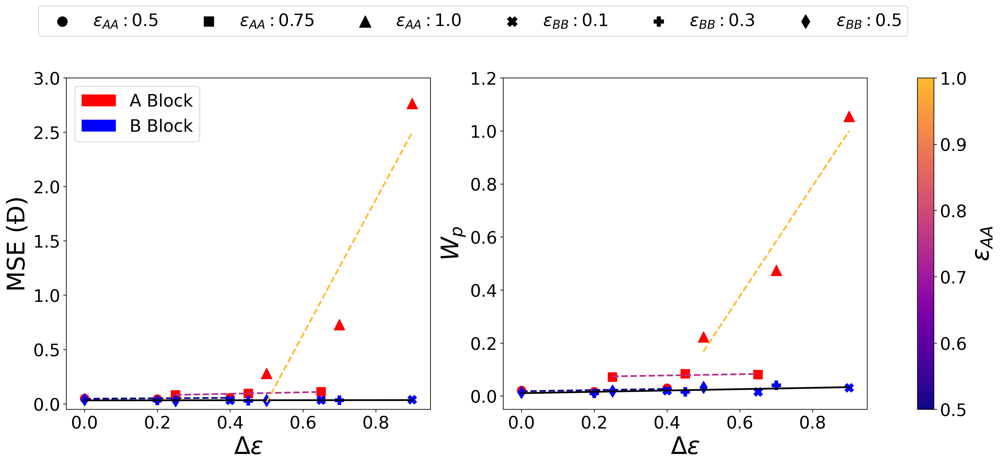

In [20]:
# Plotting
fig, host = plt.subplots(1,2,figsize = (21,7))
#fig, host = plt.subplots(1,2,figsize = (20,8))

host[0].set_xlabel("$\Delta \epsilon$")
host[1].set_xlabel("$\Delta \epsilon$")


#Dummy markers for legend

leg1=host[0].bar([-10,-9],[-10,-9],color='r')
leg2=host[0].bar([-10,-9],[-10,-9],color='b')


host[0].plot(blockB_linex,blockB_liney,'-k',label="Trendline - Block B",linewidth=2.)
host[1].plot(blockB_linex,blockB_liney2,'-k',label="Trendline - Block B",linewidth=2.)


host[0].plot(minepsAA_linex,minepsAA_liney.reshape(-1,1),linestyle='--',color=cmap3(c_id3[2]),linewidth=2.)
host[1].plot(minepsAA_linex,minepsAA_liney2.reshape(-1,1),linestyle='--',color=cmap3(c_id3[2]),linewidth=2.)
host[0].plot(midepsAA_linex,midepsAA_liney.reshape(-1,1),linestyle='--',color=cmap3(c_id3[1]),linewidth=2.)
host[1].plot(midepsAA_linex,midepsAA_liney2.reshape(-1,1),linestyle='--',color=cmap3(c_id3[1]),linewidth=2.)
host[0].plot(maxepsAA_linex,maxepsAA_liney.reshape(-1,1),linestyle='--',color=cmap3(c_id3[0]),linewidth=2.)
host[1].plot(maxepsAA_linex,maxepsAA_liney2.reshape(-1,1),linestyle='--',color=cmap3(c_id3[0]),linewidth=2.)

plt.colorbar(sm3,ax=host.ravel().tolist(),label=cb_labels[1]);


# #PDI errors
host[0].set_ylabel("MSE ("+u'\u0110'+")")
for i in range(len(delta_eps)):
    host[0].scatter(delta_eps[i],blockA_PDIerr[len(delta_eps):][i],c='r',marker=mrkrs3[i],s=2*mrkrsizes3[i])
    host[0].scatter(delta_eps[i],blockB_PDIerr[len(delta_eps):][i],c='b',marker=mrkrs[i],s=mrkrsizes[i])
host[0].set_ylim((-0.05,3.0))


#Distribution errors
host[1].set_ylabel("$W_p$")
for i in range(len(delta_eps)):
    host[1].scatter(delta_eps[i],blockA_emd[len(delta_eps):][i],c='r',marker=mrkrs3[i],s=2*mrkrsizes3[i])
    host[1].scatter(delta_eps[i],blockB_emd[len(delta_eps):][i],c='b',marker=mrkrs[i],s=mrkrsizes[i])
host[1].set_ylim((-0.05,1.2))
plt.ticklabel_format(axis='y', style='sci', scilimits=(-2,3))




#Figure limits and legend
host[0].set_xlim((-0.05,0.95))
host[1].set_xlim(host[0].get_xlim())



host[0].legend([leg1,leg2],('A Block','B Block'),loc='upper left');
#host[0].legend(('A Block','B Block'),loc='upper left');
leg4=host[1].scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = mrkrs3[0], s=2*mrkrsizes3[0]+25)#,facecolor='None')
leg5=host[1].scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = mrkrs3[3], s=2*mrkrsizes3[3]+25)#,facecolor='None')
leg6=host[1].scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = mrkrs3[6], s=2*mrkrsizes3[6]+25)#,facecolor='None')
leg7=host[1].scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = mrkrs[0], s=mrkrsizes[0]+25)#,facecolor='None')
leg8=host[1].scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = mrkrs[3], s=mrkrsizes[3]+25)#,facecolor='None')
leg9=host[1].scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = mrkrs[4], s=mrkrsizes[4]+25)#,facecolor='None')
host[1].legend([leg4,leg5,leg6,leg7,leg8,leg9],(r'$\epsilon_{AA}:0.5$',r'$\epsilon_{AA}:0.75$',r'$\epsilon_{AA}:1.0$',r'$\epsilon_{BB}:0.1$',r'$\epsilon_{BB}:0.3$',r'$\epsilon_{BB}:0.5$'),loc='lower left', ncol = 6, bbox_to_anchor=(-1.3,1.1), prop={'size':20});





plt.show()

Same but vertical layout.

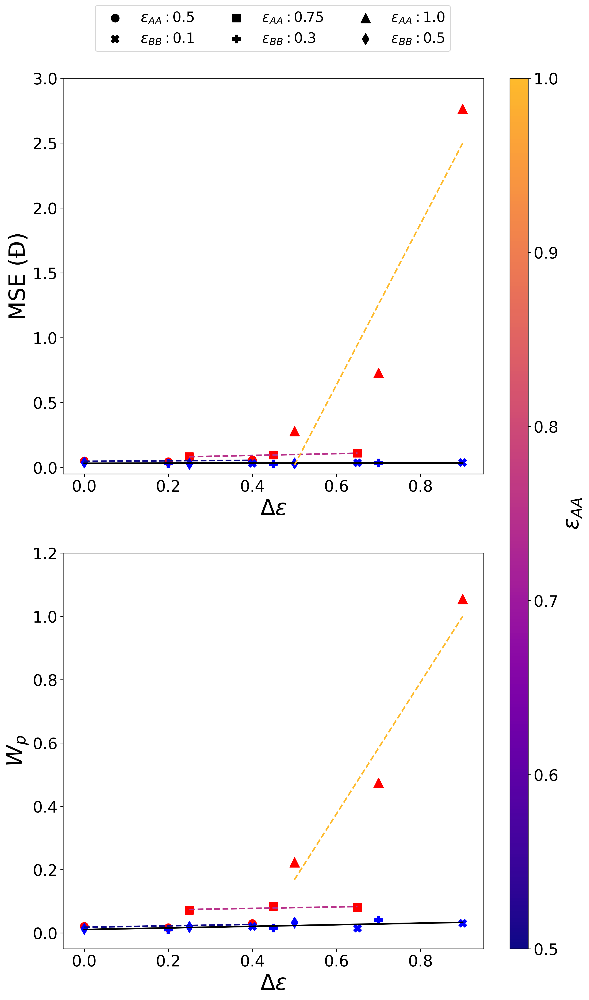

In [21]:
# Plotting
fig, host = plt.subplots(2,1,figsize = (12,20))
#fig, host = plt.subplots(1,2,figsize = (20,8))

host[0].set_xlabel("$\Delta \epsilon$")
host[1].set_xlabel("$\Delta \epsilon$")


#Dummy markers for legend

leg1=host[0].bar([-10,-9],[-10,-9],color='r')
leg2=host[0].bar([-10,-9],[-10,-9],color='b')


host[0].plot(blockB_linex,blockB_liney,'-k',label="Trendline - Block B",linewidth=2.)
host[1].plot(blockB_linex,blockB_liney2,'-k',label="Trendline - Block B",linewidth=2.)


host[0].plot(minepsAA_linex,minepsAA_liney.reshape(-1,1),linestyle='--',color=cmap3(c_id3[2]),linewidth=2.)
host[1].plot(minepsAA_linex,minepsAA_liney2.reshape(-1,1),linestyle='--',color=cmap3(c_id3[2]),linewidth=2.)
host[0].plot(midepsAA_linex,midepsAA_liney.reshape(-1,1),linestyle='--',color=cmap3(c_id3[1]),linewidth=2.)
host[1].plot(midepsAA_linex,midepsAA_liney2.reshape(-1,1),linestyle='--',color=cmap3(c_id3[1]),linewidth=2.)
host[0].plot(maxepsAA_linex,maxepsAA_liney.reshape(-1,1),linestyle='--',color=cmap3(c_id3[0]),linewidth=2.)
host[1].plot(maxepsAA_linex,maxepsAA_liney2.reshape(-1,1),linestyle='--',color=cmap3(c_id3[0]),linewidth=2.)

plt.colorbar(sm3,ax=host.ravel().tolist(),label=cb_labels[1],aspect=48);


# #PDI errors
host[0].set_ylabel("MSE ("+u'\u0110'+")")
for i in range(len(delta_eps)):
    host[0].scatter(delta_eps[i],blockA_PDIerr[len(delta_eps):][i],c='r',marker=mrkrs3[i],s=2*mrkrsizes3[i])
    host[0].scatter(delta_eps[i],blockB_PDIerr[len(delta_eps):][i],c='b',marker=mrkrs[i],s=mrkrsizes[i])
host[0].set_ylim((-0.05,3.0))


#Distribution errors
host[1].set_ylabel("$W_p$")
for i in range(len(delta_eps)):
    host[1].scatter(delta_eps[i],blockA_emd[len(delta_eps):][i],c='r',marker=mrkrs3[i],s=2*mrkrsizes3[i])
    host[1].scatter(delta_eps[i],blockB_emd[len(delta_eps):][i],c='b',marker=mrkrs[i],s=mrkrsizes[i])
host[1].set_ylim((-0.05,1.2))
plt.ticklabel_format(axis='y', style='sci', scilimits=(-2,3))




#Figure limits and legend
host[0].set_xlim((-0.05,0.95))
host[1].set_xlim(host[0].get_xlim())



host[0].legend([leg1,leg2],('A Block','B Block'),loc='upper left');
#host[0].legend(('A Block','B Block'),loc='upper left');
leg4=host[1].scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = mrkrs3[0], s=2*mrkrsizes3[0])#,facecolor='None')
leg5=host[1].scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = mrkrs3[3], s=2*mrkrsizes3[3])#,facecolor='None')
leg6=host[1].scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = mrkrs3[6], s=2*mrkrsizes3[6])#,facecolor='None')
leg7=host[1].scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = mrkrs[0], s=mrkrsizes[0])#,facecolor='None')
leg8=host[1].scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = mrkrs[3], s=mrkrsizes[3])#,facecolor='None')
leg9=host[1].scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = mrkrs[4], s=mrkrsizes[4])#,facecolor='None')
host[0].legend([leg4,leg7,leg5,leg8,leg6,leg9],(r'$\epsilon_{AA}:0.5$',r'$\epsilon_{BB}:0.1$',r'$\epsilon_{AA}:0.75$',r'$\epsilon_{BB}:0.3$',r'$\epsilon_{AA}:1.0$',r'$\epsilon_{BB}:0.5$'),loc='lower left', ncol = 3, bbox_to_anchor=(0.06,1.05), prop={'size':18});





plt.show()

Changed y-axis label.

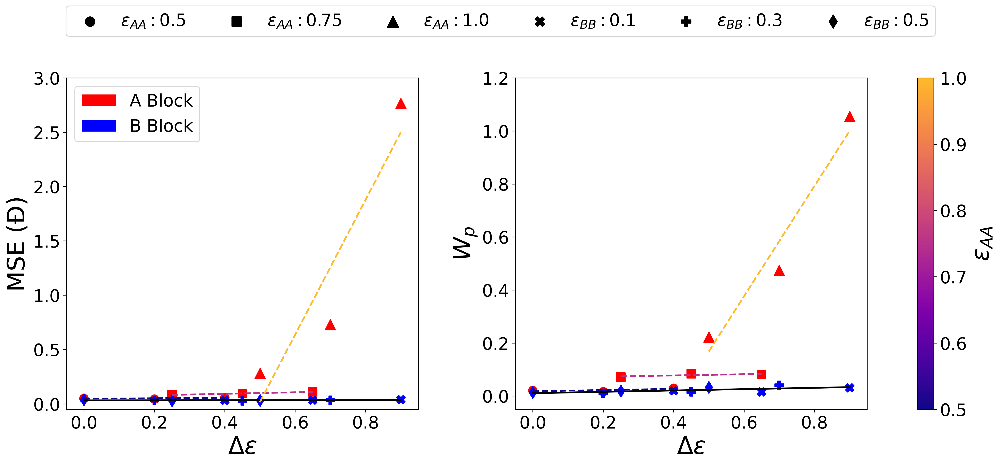

In [22]:
# Plotting
fig, host = plt.subplots(1,2,figsize = (21,7))
#fig, host = plt.subplots(1,2,figsize = (20,8))

host[0].set_xlabel("$\Delta \epsilon$")
host[1].set_xlabel("$\Delta \epsilon$")


#Dummy markers for legend

leg1=host[0].bar([-10,-9],[-10,-9],color='r')
leg2=host[0].bar([-10,-9],[-10,-9],color='b')


host[0].plot(blockB_linex,blockB_liney,'-k',label="Trendline - Block B",linewidth=2.)
host[1].plot(blockB_linex,blockB_liney2,'-k',label="Trendline - Block B",linewidth=2.)


host[0].plot(minepsAA_linex,minepsAA_liney.reshape(-1,1),linestyle='--',color=cmap3(c_id3[2]),linewidth=2.)
host[1].plot(minepsAA_linex,minepsAA_liney2.reshape(-1,1),linestyle='--',color=cmap3(c_id3[2]),linewidth=2.)
host[0].plot(midepsAA_linex,midepsAA_liney.reshape(-1,1),linestyle='--',color=cmap3(c_id3[1]),linewidth=2.)
host[1].plot(midepsAA_linex,midepsAA_liney2.reshape(-1,1),linestyle='--',color=cmap3(c_id3[1]),linewidth=2.)
host[0].plot(maxepsAA_linex,maxepsAA_liney.reshape(-1,1),linestyle='--',color=cmap3(c_id3[0]),linewidth=2.)
host[1].plot(maxepsAA_linex,maxepsAA_liney2.reshape(-1,1),linestyle='--',color=cmap3(c_id3[0]),linewidth=2.)

plt.subplots_adjust(wspace=0.275)

plt.colorbar(sm3,ax=host.ravel().tolist(),label=cb_labels[1]);


# #PDI errors
host[0].set_ylabel("MSE ("+u'\u0110'+")")
for i in range(len(delta_eps)):
    host[0].scatter(delta_eps[i],blockA_PDIerr[len(delta_eps):][i],c='r',marker=mrkrs3[i],s=2*mrkrsizes3[i])
    host[0].scatter(delta_eps[i],blockB_PDIerr[len(delta_eps):][i],c='b',marker=mrkrs[i],s=mrkrsizes[i])
host[0].set_ylim((-0.05,3.0))


#Distribution errors
host[1].set_ylabel("$W_p$")
for i in range(len(delta_eps)):
    host[1].scatter(delta_eps[i],blockA_emd[len(delta_eps):][i],c='r',marker=mrkrs3[i],s=2*mrkrsizes3[i])
    host[1].scatter(delta_eps[i],blockB_emd[len(delta_eps):][i],c='b',marker=mrkrs[i],s=mrkrsizes[i])
host[1].set_ylim((-0.05,1.2))
#plt.ticklabel_format(axis='y', style='sci', scilimits=(-2,3))




#Figure limits and legend
host[0].set_xlim((-0.05,0.95))
host[1].set_xlim(host[0].get_xlim())



host[0].legend([leg1,leg2],('A Block','B Block'),loc='upper left');
#host[0].legend(('A Block','B Block'),loc='upper left');
leg4=host[1].scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = mrkrs3[0], s=2*mrkrsizes3[0]+25)#,facecolor='None')
leg5=host[1].scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = mrkrs3[3], s=2*mrkrsizes3[3]+25)#,facecolor='None')
leg6=host[1].scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = mrkrs3[6], s=2*mrkrsizes3[6]+25)#,facecolor='None')
leg7=host[1].scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = mrkrs[0], s=mrkrsizes[0]+25)#,facecolor='None')
leg8=host[1].scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = mrkrs[3], s=mrkrsizes[3]+25)#,facecolor='None')
leg9=host[1].scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = mrkrs[4], s=mrkrsizes[4]+25)#,facecolor='None')
host[1].legend([leg4,leg5,leg6,leg7,leg8,leg9],(r'$\epsilon_{AA}:0.5$',r'$\epsilon_{AA}:0.75$',r'$\epsilon_{AA}:1.0$',r'$\epsilon_{BB}:0.1$',r'$\epsilon_{BB}:0.3$',r'$\epsilon_{BB}:0.5$'),loc='lower left', ncol = 6, bbox_to_anchor=(-1.3,1.1), prop={'size':20});




plt.show()

Seperate trendlines for B blocks based on $\varepsilon_{BB}$.

In [23]:
# # Plotting
# #fig, host = plt.subplots(1,2,figsize = (24,8))
# fig, host = plt.subplots(1,2,figsize = (20,8))

# host[0].set_xlabel("$\Delta \epsilon$")
# host[1].set_xlabel("$\Delta \epsilon$")


# #Dummy markers for legend

# leg1=host[0].bar([-10,-9],[-10,-9],color='r')
# leg2=host[0].bar([-10,-9],[-10,-9],color='b')


# host[0].plot(minepsAA_linex,minepsAA_liney.reshape(-1,1),linestyle='--', color='k',linewidth=2.)
# host[1].plot(minepsAA_linex,minepsAA_liney2.reshape(-1,1),linestyle='--',color='k',linewidth=2.)
# host[0].plot(midepsAA_linex,midepsAA_liney.reshape(-1,1),linestyle='--',color='k',linewidth=2.)
# host[1].plot(midepsAA_linex,midepsAA_liney2.reshape(-1,1),linestyle='--',color='k',linewidth=2.)
# host[0].plot(maxepsAA_linex,maxepsAA_liney.reshape(-1,1),linestyle='--',color='k',linewidth=2.)
# host[1].plot(maxepsAA_linex,maxepsAA_liney2.reshape(-1,1),linestyle='--',color='k',linewidth=2.)

# host[0].plot(minepsBB_linex,minepsBB_liney.reshape(-1,1),linestyle='--',color='k',linewidth=2.)
# host[1].plot(minepsBB_linex,minepsBB_liney2.reshape(-1,1),linestyle='--',color='k',linewidth=2.)
# host[0].plot(midepsBB_linex,midepsBB_liney.reshape(-1,1),linestyle='--',color='k',linewidth=2.)
# host[1].plot(midepsBB_linex,midepsBB_liney2.reshape(-1,1),linestyle='--',color='k',linewidth=2.)
# host[0].plot(maxepsBB_linex,maxepsBB_liney.reshape(-1,1),linestyle='--',color='k',linewidth=2.)
# host[1].plot(maxepsBB_linex,maxepsBB_liney2.reshape(-1,1),linestyle='--',color='k',linewidth=2.)

# #plt.colorbar(sm3,ax=host.ravel().tolist(),label=cb_labels[1]);


# # #PDI errors
# host[0].set_ylabel("MSE ("+u'\u0110'+")")
# for i in range(len(delta_eps)):
#     host[0].scatter(delta_eps[i],blockA_PDIerr[len(delta_eps):][i],c='r',marker=mrkrs3[i],s=2*mrkrsizes3[i])
#     host[0].scatter(delta_eps[i],blockB_PDIerr[len(delta_eps):][i],c='b',marker=mrkrs[i],s=mrkrsizes[i])
# host[0].set_ylim((-0.05,3.0))


# #Distribution errors
# host[1].set_ylabel("$W_p$")
# for i in range(len(delta_eps)):
#     host[1].scatter(delta_eps[i],blockA_emd[len(delta_eps):][i],c='r',marker=mrkrs3[i],s=2*mrkrsizes3[i])
#     host[1].scatter(delta_eps[i],blockB_emd[len(delta_eps):][i],c='b',marker=mrkrs[i],s=mrkrsizes[i])
# host[1].set_ylim((-0.0005,0.013))
# plt.ticklabel_format(axis='y', style='sci', scilimits=(-2,3))




# #Figure limits and legend
# host[0].set_xlim((-0.05,0.95))
# host[1].set_xlim(host[0].get_xlim())



# host[0].legend([leg1,leg2],('A Block','B Block'),loc='upper left');
# #host[0].legend(('A Block','B Block'),loc='upper left');
# leg4=host[1].scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = mrkrs3[0], s=2*mrkrsizes3[0])#,facecolor='None')
# leg5=host[1].scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = mrkrs3[3], s=2*mrkrsizes3[3])#,facecolor='None')
# leg6=host[1].scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = mrkrs3[6], s=2*mrkrsizes3[6])#,facecolor='None')
# leg7=host[1].scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = mrkrs[0], s=mrkrsizes[0])#,facecolor='None')
# leg8=host[1].scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = mrkrs[3], s=mrkrsizes[3])#,facecolor='None')
# leg9=host[1].scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = mrkrs[4], s=mrkrsizes[4])#,facecolor='None')
# host[1].legend([leg4,leg5,leg6,leg7,leg8,leg9],(r'$\epsilon_{AA}:0.5$',r'$\epsilon_{AA}:0.75$',r'$\epsilon_{AA}:1.0$',r'$\epsilon_{BB}:0.1$',r'$\epsilon_{BB}:0.3$',r'$\epsilon_{BB}:0.5$'),loc='lower left', ncol = 6, bbox_to_anchor=(-0.9,1.05), prop={'size':16});





# plt.show()

Seperate trendlines for $\varepsilon_{BB}$ with unique color scheme.

In [24]:
# # Plotting
# fig, host = plt.subplots(1,2,figsize = (24,8))
# #fig, host = plt.subplots(1,2,figsize = (20,8))

# host[0].set_xlabel("$\Delta \epsilon$")
# host[1].set_xlabel("$\Delta \epsilon$")


# #Dummy markers for legend

# leg1=host[0].bar([-10,-9],[-10,-9],color='r')
# leg2=host[0].bar([-10,-9],[-10,-9],color='b')


# host[0].plot(minepsAA_linex,minepsAA_liney.reshape(-1,1),linestyle='--',color=cmap3(c_id3[2]),linewidth=2.)
# host[1].plot(minepsAA_linex,minepsAA_liney2.reshape(-1,1),linestyle='--',color=cmap3(c_id3[2]),linewidth=2.)
# host[0].plot(midepsAA_linex,midepsAA_liney.reshape(-1,1),linestyle='--',color=cmap3(c_id3[1]),linewidth=2.)
# host[1].plot(midepsAA_linex,midepsAA_liney2.reshape(-1,1),linestyle='--',color=cmap3(c_id3[1]),linewidth=2.)
# host[0].plot(maxepsAA_linex,maxepsAA_liney.reshape(-1,1),linestyle='--',color=cmap3(c_id3[0]),linewidth=2.)
# host[1].plot(maxepsAA_linex,maxepsAA_liney2.reshape(-1,1),linestyle='--',color=cmap3(c_id3[0]),linewidth=2.)

# host[0].plot(minepsBB_linex,minepsBB_liney.reshape(-1,1),linestyle='--',color=cmap7(c_id7[2]),linewidth=2.)
# host[1].plot(minepsBB_linex,minepsBB_liney2.reshape(-1,1),linestyle='--',color=cmap7(c_id7[2]),linewidth=2.)
# host[0].plot(midepsBB_linex,midepsBB_liney.reshape(-1,1),linestyle='--',color=cmap7(c_id7[1]),linewidth=2.)
# host[1].plot(midepsBB_linex,midepsBB_liney2.reshape(-1,1),linestyle='--',color=cmap7(c_id7[1]),linewidth=2.)
# host[0].plot(maxepsBB_linex,maxepsBB_liney.reshape(-1,1),linestyle='--',color=cmap7(c_id7[0]),linewidth=2.)
# host[1].plot(maxepsBB_linex,maxepsBB_liney2.reshape(-1,1),linestyle='--',color=cmap7(c_id7[0]),linewidth=2.)

# cb1 = plt.colorbar(sm3,ax=host.ravel().tolist(),label=cb_labels[1],pad=-0.04);
# cb2 = plt.colorbar(sm7,ax=host.ravel().tolist(),label=r'$\epsilon_{BB}$',pad=0.02,ticks=[0.1,0.2,0.3,0.4,0.5]);


# # #PDI errors
# host[0].set_ylabel("MSE ("+u'\u0110'+")")
# for i in range(len(delta_eps)):
#     host[0].scatter(delta_eps[i],blockA_PDIerr[len(delta_eps):][i],c='r',marker=mrkrs3[i],s=2*mrkrsizes3[i])
#     host[0].scatter(delta_eps[i],blockB_PDIerr[len(delta_eps):][i],c='b',marker=mrkrs[i],s=mrkrsizes[i])
# host[0].set_ylim((-0.05,3.0))


# #Distribution errors
# host[1].set_ylabel("$W_p$")
# for i in range(len(delta_eps)):
#     host[1].scatter(delta_eps[i],blockA_emd[len(delta_eps):][i],c='r',marker=mrkrs3[i],s=2*mrkrsizes3[i])
#     host[1].scatter(delta_eps[i],blockB_emd[len(delta_eps):][i],c='b',marker=mrkrs[i],s=mrkrsizes[i])
# host[1].set_ylim((-0.0005,0.013))
# plt.ticklabel_format(axis='y', style='sci', scilimits=(-2,3))




# #Figure limits and legend
# host[0].set_xlim((-0.05,0.95))
# host[1].set_xlim(host[0].get_xlim())



# host[0].legend([leg1,leg2],('A Block','B Block'),loc='upper left');
# #host[0].legend(('A Block','B Block'),loc='upper left');
# leg4=host[1].scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = mrkrs3[0], s=2*mrkrsizes3[0])#,facecolor='None')
# leg5=host[1].scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = mrkrs3[3], s=2*mrkrsizes3[3])#,facecolor='None')
# leg6=host[1].scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = mrkrs3[6], s=2*mrkrsizes3[6])#,facecolor='None')
# leg7=host[1].scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = mrkrs[0], s=mrkrsizes[0])#,facecolor='None')
# leg8=host[1].scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = mrkrs[3], s=mrkrsizes[3])#,facecolor='None')
# leg9=host[1].scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = mrkrs[4], s=mrkrsizes[4])#,facecolor='None')
# host[1].legend([leg4,leg5,leg6,leg7,leg8,leg9],(r'$\epsilon_{AA}:0.5$',r'$\epsilon_{AA}:0.75$',r'$\epsilon_{AA}:1.0$',r'$\epsilon_{BB}:0.1$',r'$\epsilon_{BB}:0.3$',r'$\epsilon_{BB}:0.5$'),loc='lower left', ncol = 6, bbox_to_anchor=(-0.9,1.05), prop={'size':16});





# plt.show()

Elementwise relative entropy.

In [25]:
# # Plotting
# fig, host = plt.subplots(2,2,figsize = (20,16))


# host[0,0].set_xlabel("Chain Length")
# host[0,1].set_xlabel("Block Length")
# host[0,0].set_ylabel("$D_{KL}$ (nats)")

# host[1,0].set_xlabel("Chain Length")
# host[1,1].set_xlabel("Block Length")
# host[1,0].set_ylabel("$D_{KL}$ (nats)")



# #Distribution relative entropy

# host[0,1].plot([0,0],[0,0],'-k')
# host[0,1].plot([0,0],[0,0],'--k') 
# for j,i in enumerate([5,6,7]):
#     host[0,0].plot(n_chain[1:],chain_dkl[i],label=labels[i], color=cmap2(c_id2[j]))
#     host[0,1].plot(n_block[1:],blockA_dkl[i],label=labels[i], color=cmap2(c_id2[j]))
#     host[0,1].plot(n_block[1:],blockB_dkl[i],label=labels[i], color=cmap2(c_id2[j]),linestyle='--')

# host[1,1].plot([0,0],[0,0],'-k')
# host[1,1].plot([0,0],[0,0],'--k')    
# for j,i in enumerate([5,2,0]):
#     host[1,0].plot(n_chain[1:],chain_dkl[i],label=labels[i], color=cmap3(c_id3[j]))
#     host[1,1].plot(n_block[1:],blockA_dkl[i],label=labels[i], color=cmap3(c_id3[j]))
#     host[1,1].plot(n_block[1:],blockB_dkl[i],label=labels[i], color=cmap3(c_id3[j]),linestyle='--')

# # for ax in host[:,0]:  
# #     ax.set_ylim((-0.025,0.1))
# # for ax in host[:,1]:  
# #     ax.set_ylim((-0.025,0.15))

# host[0,0].legend()
# host[1,0].legend()
# host[0,1].legend(('A Block','B Block'),loc='upper right')
# host[1,1].legend(('A Block','B Block'),loc='upper right')
# plt.colorbar(sm2,ax=host[0,:].ravel().tolist(),label=cb_labels[0]);
# plt.colorbar(sm3,ax=host[1,:].ravel().tolist(),label=cb_labels[1]);



# # #Plot all (messy)
# # for i in range(len(sims)):
# #     host[0,0].plot(n_chain,chain_dkl[i],label=labels[i], color=cmap(c_id[i]))
# #     host[0,1].plot(n_block,blockA_dkl[i],label=labels[i], color=cmap(c_id[i]))
# #     host[0,1].plot(n_block,blockB_dkl[i],label=labels[i], color=cmap(c_id[i]),linestyle='--')
# # plt.colorbar(sm,ax=host[0,:].ravel().tolist(),label=cb_labels[0]);    



    

## Chain and Block Distributions

Chain and Block Distributions - Stiff Chains

In [26]:
# simid=5
# sim = sims[simid]
# # n_chain = np.linspace(0,350,351)
# # n_block = np.linspace(0,50,51)


# fig,ax = plt.subplots(1,2,figsize=(16,7))
# ax[0].plot(n_chain, ((1-sim[0][-1])*(sim[0][-1])**(n_chain-1)),'-k',linewidth=3.)
# ax[0].bar(n_chain,sim[6]/np.sum(sim[6]),align='center')
# ax[0].set_xlabel('Chain Length')
# ax[0].set_ylabel('Probability')
# ax[0].set_xlim((0,100))
# ax[0].set_yscale('log')
# ax[0].set_ylim((9e-5,1))
# #ax[0].text(30,0.2,label)
# ax[0].legend(('Flory-Schulz','Chain Distribution'))
# barwidth=0.5;
# ax[1].bar(n_block-barwidth/4,sim[4]/np.sum(sim[4]),width=barwidth,align='center',color='red')
# ax[1].bar(n_block+barwidth/4,sim[5]/np.sum(sim[5]),width=barwidth,align='center',color='blue')
# ax[1].plot(n_block,((1-2*sim[0][-1]*sim[3][0][-1])*(2*sim[0][-1]*sim[3][0][-1])**(n_block-1)),'-r',linewidth=3.)
# ax[1].plot(n_block,((1-2*sim[0][-1]*sim[3][2][-1])*(2*sim[0][-1]*sim[3][2][-1])**(n_block-1)),'-b',linewidth=3.)
# #ax[1].plot(n_block,((1-sim[0][-1]*(sim[3][2][-1]+sim[3][0][-1]))*(sim[0][-1]*(sim[3][2][-1]+sim[3][0][-1]))**(n_block-1)),'-k',linewidth=3.)
# ax[1].legend(('Markovian - A Block','Markovian - B Block','A Block','B Block'))
# #ax[1].legend(('Flory-Schulz - Block','A Block','B Block'))
# ax[1].set_yscale('log')
# ax[1].set_ylim((9e-5,1))
# ax[1].set_xlim((0,50))
# ax[1].set_xticks([0,10,20,30,40,50])
# ax[1].set_xlabel('Block Length');
# #ax[1].set_ylabel('Probability');


# #insert testing
# axins = inset_axes(ax[0], width='25%', height='20%', loc='center right',borderpad=1)
# axins.set_yscale('log')
# axins.set_ylim((9e-5,9e-3))
# axins.set_xlim((100,len(n_chain)-1))
# axins.set_xticks([100,len(n_chain)-1])
# axins.bar(n_chain,sim[6]/np.sum(sim[6]),align='center');



Chain and Block Distributions - Flexible Chains

In [27]:
# sim = flexible_sims[simid]

# n_chain_flexible = np.linspace(0,350,351)
# fig,ax = plt.subplots(1,2,figsize=(16,7))
# ax[0].plot(n_chain_flexible, ((1-sim[0][-1])*(sim[0][-1])**(n_chain_flexible-1)),'-k',linewidth=3.)
# ax[0].bar(n_chain_flexible,sim[6]/np.sum(sim[6]),align='center')
# ax[0].set_xlabel('Chain Length')
# ax[0].set_ylabel('Probability')
# ax[0].set_xlim((0,100))
# ax[0].set_yscale('log')
# ax[0].set_ylim((9e-5,1))
# #ax[0].text(30,0.2,label)
# ax[0].legend(('Flory-Schulz','Chain Distribution'))
# barwidth=0.5;
# ax[1].bar(n_block-barwidth/4,sim[4]/np.sum(sim[4]),width=barwidth,align='center',color='red',linewidth=3.)
# ax[1].bar(n_block+barwidth/4,sim[5]/np.sum(sim[5]),width=barwidth,align='center',color='blue',linewidth=3.)
# ax[1].plot(n_block,((1-2*sim[0][-1]*sim[3][0][-1])*(2*sim[0][-1]*sim[3][0][-1])**(n_block-1)),'-r',linewidth=3.)
# ax[1].plot(n_block,((1-2*sim[0][-1]*sim[3][2][-1])*(2*sim[0][-1]*sim[3][2][-1])**(n_block-1)),'-b',linewidth=3.)
# #ax[1].plot(n_block,((1-sim[0][-1]*(sim[3][0][-1]+sim[3][2][-1]))*(sim[0][-1]*(sim[3][0][-1]+sim[3][2][-1]))**(n_block-1)),'-k',linewidth=3.)
# ax[1].legend(('Markovian - A Block','Markovian - B Block','A Block','B Block'))
# #ax[1].legend(('Flory-Schulz - Block','A Block','B Block'))
# ax[1].set_yscale('log')
# ax[1].set_ylim((9e-5,1))
# ax[1].set_xlim((0,50))
# ax[1].set_xticks([0,10,20,30,40,50])
# ax[1].set_xlabel('Block Length');
# #ax[1].set_ylabel('Probability');


# #insert testing
# axins = inset_axes(ax[0], width='25%', height='20%', loc='center right',borderpad=1)
# axins.set_yscale('log')
# axins.set_ylim((9e-5,9e-3))
# axins.set_xlim((100,len(n_chain)-1))
# axins.set_xticks([100,len(n_chain)-1])
# axins.bar(n_chain_flexible,sim[6]/np.sum(sim[6]),align='center');

Chain Distribution Only - Flexible Chains

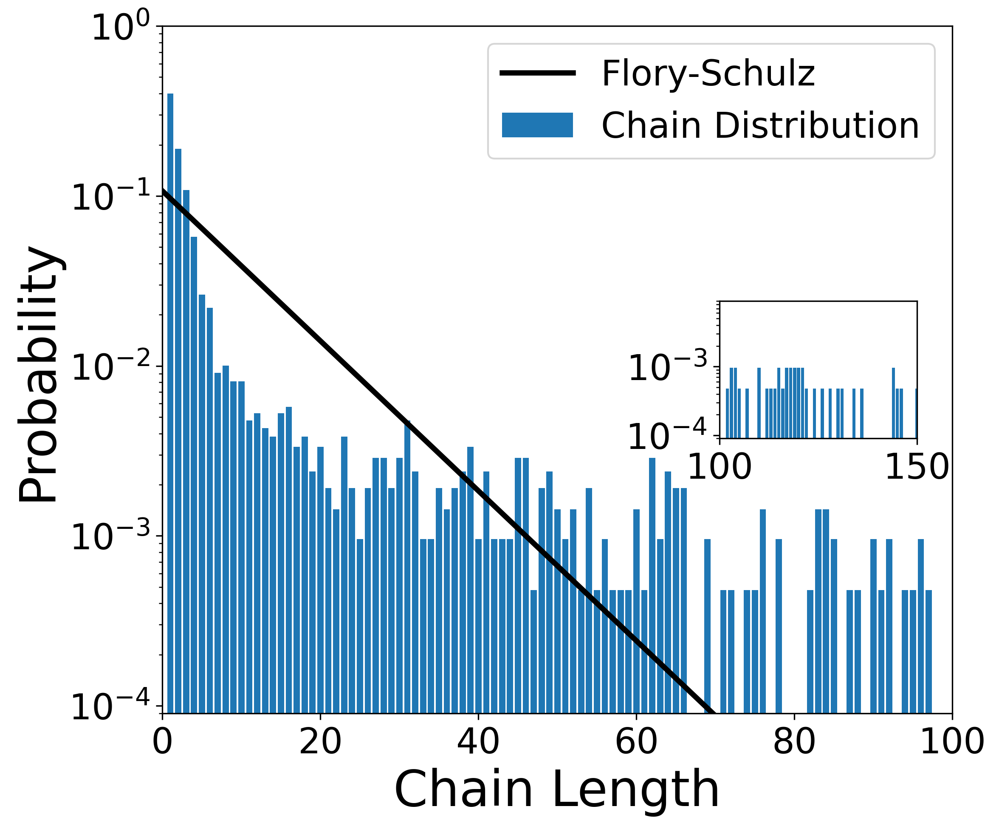

In [28]:
simid=7
sim = flexible_sims[simid]
#sim = sims[simid]
n_chain_flexible = np.linspace(0,350,351)
fig,ax = plt.subplots(1,1,figsize=(8,7))
ax.plot(n_chain_flexible, ((1-sim[0][-1])*(sim[0][-1])**(n_chain_flexible-1)),'-k',linewidth=3.)
ax.bar(n_chain_flexible,sim[6]/np.sum(sim[6]),align='center')
#ax.plot(n_chain, ((1-sim[0][-1])*(sim[0][-1])**(n_chain-1)),'-k',linewidth=3.)
#ax.bar(n_chain,sim[6]/np.sum(sim[6]),align='center')
ax.set_xlabel('Chain Length')
ax.set_ylabel('Probability')
ax.set_xlim((0,100))
ax.set_yscale('log')
ax.set_ylim((9e-5,1))
#ax.text(30,0.2,label)
ax.legend(('Flory-Schulz','Chain Distribution'))



#insert testing
axins = inset_axes(ax, width='25%', height='20%', loc='center right',borderpad=1)
axins.set_yscale('log')
axins.set_ylim((9e-5,9e-3))
axins.set_xlim((100,len(n_chain)-1))
axins.set_xticks([100,len(n_chain)-1])
axins.bar(n_chain_flexible,sim[6]/np.sum(sim[6]),align='center');
#axins.bar(n_chain,sim[6]/np.sum(sim[6]),align='center');

plt.show()

Block Distribution Only - Flexible Chains

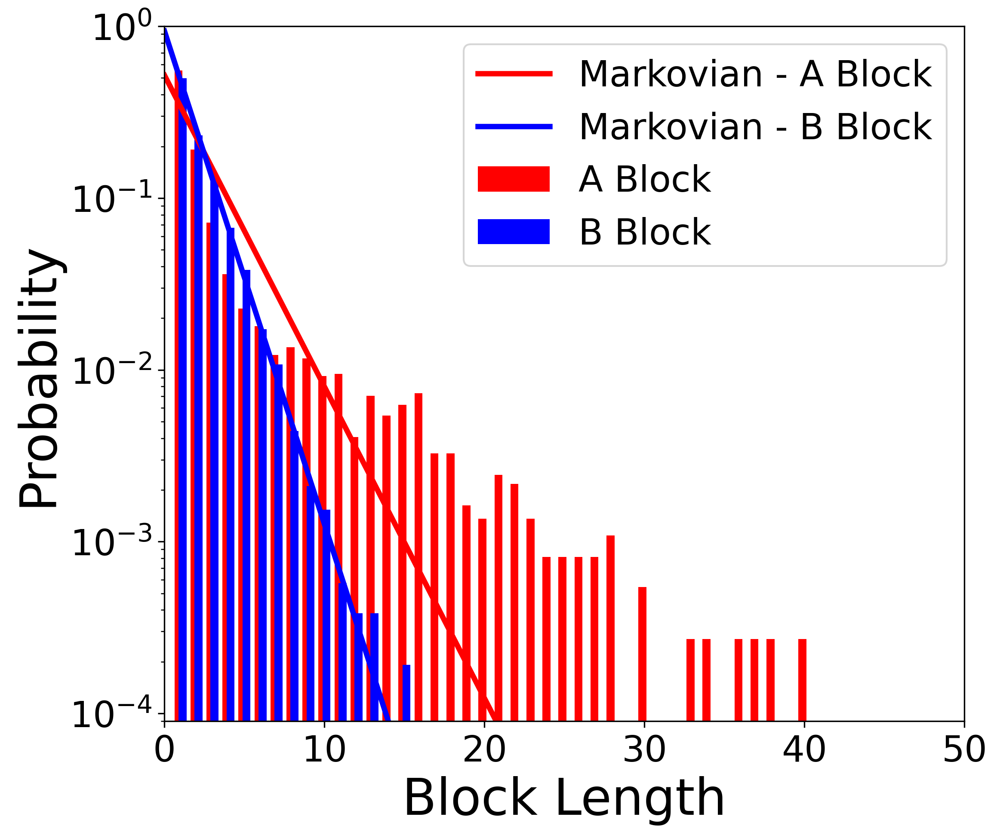

In [29]:
simid=5
sim = flexible_sims[simid]
#sim = sims[simid]
fig,ax = plt.subplots(1,1,figsize=(8,7))
barwidth=0.5;
ax.bar(n_block-barwidth/4,sim[4]/np.sum(sim[4]),width=barwidth,align='center',color='red',linewidth=3.)
ax.bar(n_block+barwidth/4,sim[5]/np.sum(sim[5]),width=barwidth,align='center',color='blue',linewidth=3.)
ax.plot(n_block,((1-2*sim[0][-1]*sim[3][0][-1])*(2*sim[0][-1]*sim[3][0][-1])**(n_block-1)),'-r',linewidth=3.)
ax.plot(n_block,((1-2*sim[0][-1]*sim[3][2][-1])*(2*sim[0][-1]*sim[3][2][-1])**(n_block-1)),'-b',linewidth=3.)

ax.legend(('Markovian - A Block','Markovian - B Block','A Block','B Block'))
#ax.legend(('Flory-Schulz - Block','A Block','B Block'))
ax.set_yscale('log')
ax.set_ylim((9e-5,1))
ax.set_xlim((0,50))
ax.set_xticks([0,10,20,30,40,50])
ax.set_xlabel('Block Length');
ax.set_ylabel('Probability');



# #for Kateri
# print('p = {}'.format(sim[0][-1]))
# print('pAA = {}'.format(sim[3][0][-1]))
# print('pBB = {}'.format(sim[3][2][-1]))
# print(sim[0][-1]*sim[3][0][-1])



plt.show()

## Distribution Shift in Stiff and Flexible Chains

In [30]:
# # Plotting
# fig, host = plt.subplots(1,2,figsize = (24,8))

# simid=7
# sim = flexible_sims[simid]
# n_chain_flexible = np.linspace(0,350,351)
# host[0].plot(n_chain_flexible, ((1-sim[0][-1])*(sim[0][-1])**(n_chain_flexible-1)),'-k',linewidth=3.)
# host[0].plot(n_chain_flexible,sim[6]/np.sum(sim[6]),color='#1f77b4',linestyle='-',linewidth=3.)
# host[0].plot(n_chain,sims[simid][6]/np.sum(sims[simid][6]),color='#1f77b4',linestyle='--',linewidth=3.)
# host[0].set_xlabel('Chain Length')
# host[0].set_ylabel('Probability')
# host[0].set_xlim((0,160))
# host[0].set_yscale('log')
# host[0].set_ylim((9e-5,1))
# #host[0].text(30,0.2,label)
# host[0].legend(('Flory-Schulz','Chain Distribution - $l_p = 3.5$','Chain Distribution - $l_p = 16.5$'))



# simid=5
# sim = flexible_sims[simid]
# host[1].plot(n_block,((1-2*sims[simid][0][-1]*sims[simid][3][0][-1])*(2*sims[simid][0][-1]*sims[simid][3][0][-1])**(n_block-1)),'-k',linewidth=3.)
# #host[1].plot(n_block,((1-2*sim[0][-1]*sim[3][0][-1])*(2*sim[0][-1]*sim[3][0][-1])**(n_block-1)),'--k',linewidth=3.)
# host[1].plot(n_block,sim[4]/np.sum(sim[4]),'-r',linewidth=3.)
# host[1].plot(n_block,sims[simid][4]/np.sum(sims[simid][4]),'--r',linewidth=3.)
# host[1].legend(('Markovian','A Block - $l_p = 3.5$','A Block - $l_p = 16.5$'))
# host[1].set_yscale('log')
# host[1].set_ylim((9e-5,1))
# host[1].set_xlim((0,50))
# host[1].set_xticks([0,10,20,30,40,50])
# host[1].set_xlabel('Block Length');
# host[1].set_ylabel('Probability');


# plt.show()



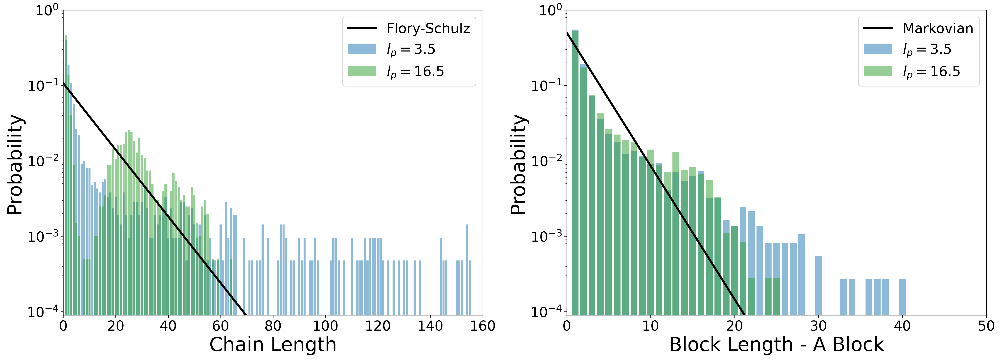

In [31]:
# Plotting
fig, host = plt.subplots(1,2,figsize = (24,8))

simid=7
sim = flexible_sims[simid]
n_chain_flexible = np.linspace(0,350,351)
host[0].plot(n_chain_flexible, ((1-sim[0][-1])*(sim[0][-1])**(n_chain_flexible-1)),'-k',linewidth=3.)
host[0].bar(n_chain_flexible,sim[6]/np.sum(sim[6]),alpha=0.5,color='#1f77b4')
host[0].bar(n_chain,sims[simid][6]/np.sum(sims[simid][6]),alpha=0.5,color='#2ca02c')
host[0].set_xlabel('Chain Length')
host[0].set_ylabel('Probability')
host[0].set_xlim((0,160))
host[0].set_yscale('log')
host[0].set_ylim((9e-5,1))
#host[0].text(30,0.2,label)
host[0].legend(('Flory-Schulz','$l_p = 3.5$','$l_p = 16.5$'))



simid=5
sim = flexible_sims[simid]
host[1].plot(n_block,((1-2*sims[simid][0][-1]*sims[simid][3][0][-1])*(2*sims[simid][0][-1]*sims[simid][3][0][-1])**(n_block-1)),'-k',linewidth=3.)
#host[1].plot(n_block,((1-2*flexible_sims[simid][0][-1]*flexible_sims[simid][3][0][-1])*(2*flexible_sims[simid][0][-1]*flexible_sims[simid][3][0][-1])**(n_block-1)),'--k',linewidth=3.)
host[1].bar(n_block,sim[4]/np.sum(sim[4]),alpha=0.5,color='#1f77b4')
host[1].bar(n_block,sims[simid][4]/np.sum(sims[simid][4]),alpha=0.5,color='#2ca02c')
host[1].legend(('Markovian','$l_p = 3.5$','$l_p = 16.5$'))
#host[1].legend(('Markovian','Markovian-Flex','$l_p = 3.5$','$l_p = 16.5$'))
host[1].set_yscale('log')
host[1].set_ylim((9e-5,1))
host[1].set_xlim((0,50))
host[1].set_xticks([0,10,20,30,40,50])
host[1].set_xlabel('Block Length - A Block');
host[1].set_ylabel('Probability');


plt.show()

#print(sims[simid][3][0][-1])
#print(flexible_sims[simid][3][0][-1])

## Chain and Block Dispersity

In [32]:
# sim = sims[simid]
# fig,ax = plt.subplots(1,2,figsize=(20,8))

# ax[0].text(0.75,0.9,r'$l_p = 16.5$',transform=ax[0].transAxes, bbox = dict(boxstyle='square',facecolor='white'))
# ax[1].text(0.1,0.9,r'$l_p = 3.5$',transform=ax[1].transAxes, bbox = dict(boxstyle='square',facecolor='white'))


# ax[0].plot(sim[0],sim[9],'-k',label='Chain')
# ax[0].plot(sim[0],sim[7],'-r', label='A Block')
# ax[0].plot(sim[0],sim[8],'-b',label='B Block')
# ax[0].plot(sim[0],(sim[0])+1,'--k',label='Flory-Schulz')
# ax[0].plot(sim[0],(2*sim[0]*sim[3][0][-1])+1,'--r',label='Markovian - A Block')
# ax[0].plot(sim[0],(2*sim[0]*sim[3][2][-1])+1,'--b',label='Markovian - B Block')
# #ax[0].plot(sim[0],(sim[0]*(sim[3][2][-1]+sim[3][0][-1]))+1,':k',label='Flory-Schulz - Block')
# ax[0].set_xlabel('$p$')
# ax[0].set_ylabel(u'\u0110')
# ax[0].set_ylim((0.75,6.25))
# ax[0].legend(loc='upper left')


# ax[1].plot(flexible_sims[simid][0],flexible_sims[simid][9],'-k',label='Chain')
# ax[1].plot(flexible_sims[simid][0],flexible_sims[simid][7],'-r', label='Block A')
# ax[1].plot(flexible_sims[simid][0],flexible_sims[simid][8],'-b',label='Block B')
# ax[1].plot(flexible_sims[simid][0],(flexible_sims[simid][0])+1,'--k',label='Flory-Schulz')
# ax[1].plot(flexible_sims[simid][0],(2*flexible_sims[simid][0]*flexible_sims[simid][3][0][-1])+1,'--r',label='Flory-Schulz - Block A')
# ax[1].plot(flexible_sims[simid][0],(2*flexible_sims[simid][0]*flexible_sims[simid][3][2][-1])+1,'--b',label='Flory-Schulz - Block B')
# #ax[1].plot(flexible_sims[simid][0],(flexible_sims[simid][0]*(flexible_sims[simid][3][2][-1]+flexible_sims[simid][3][0][-1]))+1,':k',label='Flory-Schulz - Block')
# ax[1].set_ylim((0.75,6.25))
# ax[1].set_xlabel('$p$');

## Kinetics and RDF

Kinetics only.

In [33]:

# fig, host = plt.subplots(1,1,figsize= (12,8))

# epsAA_colorids = [2,2,1,1,1,0,0,0,2]





# # host.plot([0,0],[0,0],'-k',label='Flexible Chains')
# # host.plot([0,0],[0,0],'--k',label='Stiff Chains') 



# for i,sim in enumerate(flexible_sims):
#     host.plot(0.001*sim[2],sim[13],label=labels[i], color=cmap(c_id[i]))

# # for i,sim in enumerate(sims):
# #     host.plot(0.001*sim[2],sim[13],label=labels[i], color=cmap(c_id[i]), linestyle='--')
    

# host.set_xlabel(r"Time/ $\tau$")
# host.set_ylabel(r'$X_n$')
# host.set_xlim((-0.05e4,5.05e4))
# host.set_ylim((0.95,3.55))

# # host.legend(('Flexible Chains','Stiff Chains',labels[0],labels[1],labels[2],labels[3],labels[4],labels[5],labels[6],labels[7],labels[8]),loc='lower left', prop={'size':14});
# host.legend(*([x[i] for i in [0,1,8,2,3,4,5,6,7]] for x in host.get_legend_handles_labels()),loc='lower left', ncol = 3, bbox_to_anchor=(0.04,1.02), prop={'size':16});
    



# plt.colorbar(sm,ax=host,label=labels[-1]);

# #sim index:
# #    0         1          2         3         4            5          6          7                 8           9      10     11       12    13          14            15
# #[extent_avg,order_avg,tstep_avg,probs_avg,blockAtotal,blockBtotal,chaindist,BlockA_PDI_avg,BlockB_PDI_avg,PDI_avg,pA_avg,pB_avg,seqs_all,Xn_avg,TotalBlock_PDI_avg, RDFs]
# # probs_avg index
# #[pAA_avg,pAB_avg,pBB_avg]
# # RDFs index
# # [step,x,rdf_all,rdf_AA,rdf_BB,rdf_AB]

Kinetics only, alternate coloration.

In [34]:

# fig, host = plt.subplots(1,1,figsize= (12,8))

# epsAA_colorids = [2,2,1,1,1,0,0,0,2]





# host.plot([0,0],[0,0],'-k',label='Flexible Chains')
# host.plot([0,0],[0,0],'--k',label='Stiff Chains') 



# for i,sim in enumerate(flexible_sims):
#     host.plot(0.001*sim[2],sim[13],label=labels[i], color=cmap3(c_id3[int(epsAA_colorids[i])]))

# for i,sim in enumerate(sims):
#     host.plot(0.001*sim[2],sim[13],label=labels[i], color=cmap3(c_id3[int(epsAA_colorids[i])]), linestyle='--')
    

# host.set_xlabel(r"Time/ $\tau$")
# host.set_ylabel(r'$X_n$')
# host.set_xlim((-0.25e4,1.0e5))
# host.set_ylim((0.95,5.05))

# host.legend(('Flexible Chains','Stiff Chains',labels[0],labels[1],labels[2],labels[3],labels[4],labels[5],labels[6],labels[7],labels[8]),loc='lower right', prop={'size':14});
# plt.colorbar(sm3,ax=host,label=cb_labels[-1]);

# #sim index:
# #    0         1          2         3         4            5          6          7                 8           9      10     11       12    13          14            15
# #[extent_avg,order_avg,tstep_avg,probs_avg,blockAtotal,blockBtotal,chaindist,BlockA_PDI_avg,BlockB_PDI_avg,PDI_avg,pA_avg,pB_avg,seqs_all,Xn_avg,TotalBlock_PDI_avg, RDFs]
# # probs_avg index
# #[pAA_avg,pAB_avg,pBB_avg]
# # RDFs index
# # [step,x,rdf_all,rdf_AA,rdf_BB,rdf_AB]

RDFs only.

In [35]:
# # RDFs index
# # [step,x,rdf_all,rdf_AA,rdf_BB,rdf_AB]
# fig,axes = plt.subplots(2,1,figsize=(8,16))
# for ax in axes:
#     ax.set_xlabel('$r/\sigma$')
#     ax.set_ylabel('$g(r)$')
    
# axes[0].plot([0,0],[0,0],'-k',label='Flexible Chains')
# axes[0].plot([0,0],[0,0],'--k',label='Stiff Chains')
# axes[1].plot([0,0],[0,0],'-k',label='Flexible Chains')
# axes[1].plot([0,0],[0,0],'--k',label='Stiff Chains')

# axes[0].plot(flexible_sims[8][15][1],flexible_sims[8][15][3],label='AA',color='r')
# axes[0].plot(flexible_sims[8][15][1],flexible_sims[8][15][4],label='BB',color='b')
# axes[0].plot(flexible_sims[8][15][1],flexible_sims[8][15][5],label='AB',color='purple')
# axes[0].plot(sims[8][15][1],sims[8][15][3],label='AA',color='r',linestyle='--')
# axes[0].plot(sims[8][15][1],sims[8][15][4],label='BB',color='b',linestyle='--')
# axes[0].plot(sims[8][15][1],sims[8][15][5],label='AB',color='purple',linestyle='--')
# #axes[0].set_xlim((-0.1,10.1))
# axes[0].set_ylim((-0.1,8.5))
# axes[0].text(0.0,7.5,labels[8]+'\n'+r'${} (Time/\tau)$'.format(0.001*rdf_step))
# axes[0].legend(('Flexible Chains','Stiff Chains','AA','BB','AB'),loc='upper right')

# axes[1].plot(flexible_sims[5][15][1],flexible_sims[5][15][3],label='AA',color='r')
# axes[1].plot(flexible_sims[5][15][1],flexible_sims[5][15][4],label='BB',color='b')
# axes[1].plot(flexible_sims[5][15][1],flexible_sims[5][15][5],label='AB',color='purple')
# axes[1].plot(sims[5][15][1],sims[5][15][3],label='AA',color='r',linestyle='--')
# axes[1].plot(sims[5][15][1],sims[5][15][4],label='BB',color='b',linestyle='--')
# axes[1].plot(sims[5][15][1],sims[5][15][5],label='AB',color='purple',linestyle='--')
# #axes[1].set_xlim((-0.1,10.1))
# axes[1].set_ylim((-0.1,8.5))
# axes[1].text(0.0,7.5,labels[5]+'\n'+r'${} (Time/\tau)$'.format(0.001*rdf_step))
# axes[1].legend(('Flexible Chains','Stiff Chains','AA','BB','AB'),loc='upper right');

Kinetics with RDFs, stiff and flexible chains.

In [36]:
# fig = plt.figure(figsize=(24,12))
# gs = fig.add_gridspec(2,2, width_ratios=[2,1], height_ratios = [1,1])
# ax1 = fig.add_subplot(gs[:,0])
# ax2 = fig.add_subplot(gs[0,1])
# ax3 = fig.add_subplot(gs[1,1])



# epsAA_colorids = [2,2,1,1,1,0,0,0,2]
# ax1.plot([0,0],[0,0],'-k',label='Flexible Chains')
# ax1.plot([0,0],[0,0],'--k',label='Stiff Chains') 

# for i,sim in enumerate(flexible_sims):
#     #ax1.plot(0.001*sim[2],sim[13],label=labels[i], color=cmap3(c_id3[int(epsAA_colorids[i])]))
#     ax1.plot(0.001*sim[2],sim[13],label=labels[i], color=cmap(c_id[i]))
    

# ax1.legend(*([x[i] for i in [0,1,2,3,10,4,5,6,7,8,9]] for x in ax1.get_legend_handles_labels()),loc='lower left', ncol = 3, bbox_to_anchor=(-0.1,1.02), prop={'size':16});
    
    
# for i,sim in enumerate(sims):
#     #ax1.plot(0.001*sim[2],sim[13],label=labels[i], color=cmap3(c_id3[int(epsAA_colorids[i])]), linestyle='--')
#     ax1.plot(0.001*sim[2],sim[13],label=labels[i], color=cmap(c_id[i]), linestyle='--')
    

# ax1.set_xlabel(r"Time/ $\tau$")
# ax1.set_ylabel(r'$X_n$')
# ax1.set_xlim((-0.25e4,1.0e5))
# ax1.set_ylim((0.95,5.05))
# #plt.colorbar(sm3,ax=ax1,label=cb_labels[-1]);
# plt.colorbar(sm,ax=ax1,label=labels[-1]);

# #sim index:
# #    0         1          2         3         4            5          6          7                 8           9      10     11       12    13          14            15
# #[extent_avg,order_avg,tstep_avg,probs_avg,blockAtotal,blockBtotal,chaindist,BlockA_PDI_avg,BlockB_PDI_avg,PDI_avg,pA_avg,pB_avg,seqs_all,Xn_avg,TotalBlock_PDI_avg, RDFs]
# # probs_avg index
# #[pAA_avg,pAB_avg,pBB_avg]
# # RDFs index
# # [step,x,rdf_all,rdf_AA,rdf_BB,rdf_AB]




# ax2.set_xlabel('$r/\sigma$')
# ax2.set_ylabel('$g(r)$')
# ax3.set_xlabel('$r/\sigma$')
# ax3.set_ylabel('$g(r)$')
    



# ax2.plot(flexible_sims[8][15][1],flexible_sims[8][15][3],label='AA',color='r')
# ax2.plot(flexible_sims[8][15][1],flexible_sims[8][15][4],label='BB',color='b')
# ax2.plot(flexible_sims[8][15][1],flexible_sims[8][15][5],label='AB',color='purple')
# ax2.plot([0,0],[0,0],'-k',label='Flexible Chains')
# ax2.plot([0,0],[0,0],'--k',label='Stiff Chains')
# ax2.plot(sims[8][15][1],sims[8][15][3],label='AA',color='r',linestyle='--')
# ax2.plot(sims[8][15][1],sims[8][15][4],label='BB',color='b',linestyle='--')
# ax2.plot(sims[8][15][1],sims[8][15][5],label='AB',color='purple',linestyle='--')

# #ax2.set_xlim((-0.1,10.1))
# ax2.set_ylim((-0.1,8.5))
# ax2.text(0.05,0.85,labels[8]+'\n'+r'${} \ (Time/\tau)$'.format(0.001*rdf_step),transform = ax2.transAxes)
# ax2.legend(('AA','BB','AB','Flexible Chains','Stiff Chains'),loc='lower left', ncol = 2, bbox_to_anchor=(0.15,1.05), prop={'size':16})

# ax3.plot(flexible_sims[5][15][1],flexible_sims[5][15][3],label='AA',color='r')
# ax3.plot(flexible_sims[5][15][1],flexible_sims[5][15][4],label='BB',color='b')
# ax3.plot(flexible_sims[5][15][1],flexible_sims[5][15][5],label='AB',color='purple')
# #ax3.plot([0,0],[0,0],'-k',label='Flexible Chains')
# #ax3.plot([0,0],[0,0],'--k',label='Stiff Chains')
# ax3.plot(sims[5][15][1],sims[5][15][3],label='AA',color='r',linestyle='--')
# ax3.plot(sims[5][15][1],sims[5][15][4],label='BB',color='b',linestyle='--')
# ax3.plot(sims[5][15][1],sims[5][15][5],label='AB',color='purple',linestyle='--')

# #ax3.set_xlim((-0.1,10.1))
# ax3.set_ylim((-0.1,8.5))
# ax3.text(0.05,0.85,labels[5]+'\n'+r'${} \ (Time/\tau)$'.format(0.001*rdf_step), transform = ax3.transAxes);
# #ax3.legend(('Flexible Chains','Stiff Chains','AA','BB','AB'),loc='upper right');

Coordination number calculation from Nhu:

In [37]:
coordnum = []

#Flexible chains
#Integration limits: first minima after peak for largest peak trial as r' for all trials @20000 Tau
coordnum.append([0.229,0.166,0.180]) #0.5epsAA_0.1epsBB (AA,BB,AB)
coordnum.append([0.235,0.204,0.219]) #0.5epsAA_0.3epsBB
coordnum.append([0.319,0.171,0.197]) #0.75epsAA_0.1epsBB
coordnum.append([0.316,0.202,0.244]) #0.75epsAA_0.3epsBB
coordnum.append([0.359,0.264,0.305]) #0.75epsAA_0.5epsBB
coordnum.append([0.899,0.164,0.219]) #1.0epsAA_0.1epsBB
coordnum.append([0.899,0.225,0.328]) #1.0epsAA_0.3epsBB
coordnum.append([1.642,0.376,0.662]) #1.0epsAA_0.5epsBB
coordnum.append([0.242,0.234,0.246]) #0.5epsAA_0.5epsBB



# #Checking values from Nhu for consistency
# blah_coordnum = []
# def blah_n1(g,r):
#     n1 = (3600/(50**3))*4*np.pi*np.trapz(g,r)
#     return n1

# max_index = flexible_sims[7][16][3].tolist().index(max(flexible_sims[7][16][3]))
# minima = []
# for i,val in enumerate(flexible_sims[7][16][3][max_index:-1:1]):
#     if val < flexible_sims[7][16][3][max_index:][i-1] and val < flexible_sims[7][16][3][max_index:][i+1]:
#         minima.append(i + max_index)
# min_index = minima[0]
        

# for i, sim in enumerate(flexible_sims):
#     blah_r = flexible_sims[i][16][1][:min_index]
#     blah_dr = blah_r[1]-blah_r[0]
#     blah_AA = flexible_sims[i][16][3][:min_index]
#     blah_AB = flexible_sims[i][16][5][:min_index]
#     blah_BB = flexible_sims[i][16][4][:min_index]
#     blah_n1AA = blah_n1(blah_AA*blah_r**2,blah_r)
#     blah_n1AB = blah_n1(blah_AB*blah_r**2,blah_r)
#     blah_n1BB = blah_n1(blah_BB*blah_r**2,blah_r)
#     blah_n1set = [blah_n1AA,blah_n1BB,blah_n1AB]
#     print(blah_n1set)
#     blah_coordnum.append(blah_n1set)

Kinetics and RDFs, flexible chains only.

In [38]:
# fig = plt.figure(figsize=(24,18))
# gs = fig.add_gridspec(ncols=2,nrows=3, width_ratios=[2,1], height_ratios = [1,1,0.6], hspace = 0.25)
# ax1 = fig.add_subplot(gs[:2,0])
# ax2 = fig.add_subplot(gs[0,1])
# ax3 = fig.add_subplot(gs[1,1])
# ax4 = fig.add_subplot(gs[2,:])


# epsAA_colorids = [2,2,1,1,1,0,0,0,2]


# for i,sim in enumerate(flexible_sims):
#     #ax1.plot(0.001*sim[2],sim[13],label=labels[i], color=cmap3(c_id3[int(epsAA_colorids[i])]))
#     ax1.plot(0.001*sim[2],sim[13],label=labels[i], color=cmap(c_id[i]))
    

# ax1.legend(*([x[i] for i in [0,1,8,2,3,4,5,6,7]] for x in ax1.get_legend_handles_labels()),loc='lower left', ncol = 3, bbox_to_anchor=(0.04,1.02), prop={'size':16});
    
    
    

# ax1.set_xlabel(r"Time/ $\tau$")
# ax1.set_ylabel(r'$X_n$')
# ax1.set_xlim((-0.25e4,1.0e5))
# ax1.set_ylim((0.95,5.05))
# #plt.colorbar(sm3,ax=ax1,label=cb_labels[-1]);
# plt.colorbar(sm,ax=ax1,label=labels[-1]);

# #sim index:
# #    0         1          2         3         4            5          6          7                 8           9      10     11       12    13          14            15
# #[extent_avg,order_avg,tstep_avg,probs_avg,blockAtotal,blockBtotal,chaindist,BlockA_PDI_avg,BlockB_PDI_avg,PDI_avg,pA_avg,pB_avg,seqs_all,Xn_avg,TotalBlock_PDI_avg, RDFs]
# # probs_avg index
# #[pAA_avg,pAB_avg,pBB_avg]
# # RDFs index
# # [step,x,rdf_all,rdf_AA,rdf_BB,rdf_AB]




# ax2.set_xlabel('$r/\sigma$')
# ax2.set_ylabel('$g(r)$')
# ax3.set_xlabel('$r/\sigma$')
# ax3.set_ylabel('$g(r)$')
    



# ax2.plot(flexible_sims[8][15][1],flexible_sims[8][15][3],label='AA',color='r')
# ax2.plot(flexible_sims[8][15][1],flexible_sims[8][15][5],label='AB',color='purple')
# ax2.plot(flexible_sims[8][15][1],flexible_sims[8][15][4],label='BB',color='b')
# ax2.set_ylim((-0.1,8.5))
# ax2.text(0.05,0.85,labels[8]+'\n'+r'${} \ (Time/\tau)$'.format(0.001*rdf_step),transform = ax2.transAxes)
# ax2.legend(('AA','AB','BB'),loc='lower left', ncol = 3, bbox_to_anchor=(0.15,1.05), prop={'size':16})

# ax3.plot(flexible_sims[5][15][1],flexible_sims[5][15][3],label='AA',color='r')
# ax3.plot(flexible_sims[5][15][1],flexible_sims[5][15][4],label='BB',color='b')
# ax3.plot(flexible_sims[5][15][1],flexible_sims[5][15][5],label='AB',color='purple')
# ax3.set_ylim((-0.1,8.5))
# ax3.text(0.05,0.85,labels[5]+'\n'+r'${} \ (Time/\tau)$'.format(0.001*rdf_step), transform = ax3.transAxes);



# leg1=ax4.bar([-10,-9],[-10,-9],color='r')
# leg2=ax4.bar([-10,-9],[-10,-9],color='purple')
# leg3=ax4.bar([-10,-9],[-10,-9],color='b')
# leg4=ax4.scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = 'x',s=150)
# leg5=ax4.scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = '+',s=150)
# leg6=ax4.scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = 'o',s=75)
# ax4.set_xlim(-0.05, 1.05)
# ax4.set_ylim(1.8,10.2)
# ax4.set_yticks([2,6,10])
# ax4.set_xlabel("$\Delta \epsilon$")
# ax4.set_ylabel("$n_1$")
# for i in range(len(delta_eps)):
#     ax4.scatter(delta_eps[i],coordnum[i][0],color='r',marker=mrkrs[i],s=mrkrsizes[i])
#     ax4.scatter(delta_eps[i],coordnum[i][1],color='b',marker=mrkrs[i],s=mrkrsizes[i])
#     ax4.scatter(delta_eps[i],coordnum[i][2],color='purple',marker=mrkrs[i],s=mrkrsizes[i])

# #ax4.legend([leg1,leg4,leg2,leg5,leg3,leg6],('AA',r'$\epsilon_{BB} = 0.1 k_{B}T$','AB',r'$\epsilon_{BB} = 0.3 k_{B}T$','BB',r'$\epsilon_{BB} = 0.5 k_{B}T$'),loc='lower left', ncol = 3, bbox_to_anchor=(0.35,1.05), prop={'size':16});
# ax4.legend([leg1,leg4,leg2,leg5,leg3,leg6],('AA',r'$\epsilon_{BB} = 0.1 k_{B}T$','AB',r'$\epsilon_{BB} = 0.3 k_{B}T$','BB',r'$\epsilon_{BB} = 0.5 k_{B}T$'),loc='upper left', ncol = 3, prop={'size':16});



Alternate with total attractions coordination number plot as well:

In [39]:
# fig = plt.figure(figsize=(24,18))
# gs = fig.add_gridspec(ncols=2,nrows=4, width_ratios=[2,1], height_ratios = [1,1,0.6,0.6], hspace = 0.3)
# ax1 = fig.add_subplot(gs[:2,0])
# ax2 = fig.add_subplot(gs[0,1])
# ax3 = fig.add_subplot(gs[1,1])
# ax4 = fig.add_subplot(gs[2,:])
# ax5 = fig.add_subplot(gs[3,:])


# epsAA_colorids = [2,2,1,1,1,0,0,0,2]


# for i,sim in enumerate(flexible_sims):
#     #if i==4 or i == 5 or i==6 or i==7:
#     ax1.plot(0.001*sim[2],sim[13],label=labels[i], color=cmap(c_id[i]))
    

# ax1.legend(*([x[i] for i in [0,1,8,2,3,4,5,6,7]] for x in ax1.get_legend_handles_labels()),loc='lower left', ncol = 3, bbox_to_anchor=(0.04,1.02), prop={'size':16});
    
    
    

# ax1.set_xlabel(r"Time/ $\tau$")
# ax1.set_ylabel(r'$X_n$')
# ax1.set_xlim((-0.05e4,4.05e4))
# ax1.set_ylim((0.95,3.05))
# #plt.colorbar(sm3,ax=ax1,label=cb_labels[-1]);
# plt.colorbar(sm,ax=ax1,label=labels[-1]);

# #sim index:
# #    0         1          2         3         4            5          6          7                 8           9      10     11       12    13          14            15
# #[extent_avg,order_avg,tstep_avg,probs_avg,blockAtotal,blockBtotal,chaindist,BlockA_PDI_avg,BlockB_PDI_avg,PDI_avg,pA_avg,pB_avg,seqs_all,Xn_avg,TotalBlock_PDI_avg, RDFs]
# # probs_avg index
# #[pAA_avg,pAB_avg,pBB_avg]
# # RDFs index
# # [step,x,rdf_all,rdf_AA,rdf_BB,rdf_AB]




# ax2.set_xlabel('$r/\sigma$')
# ax2.set_ylabel('$g(r)$')
# ax3.set_xlabel('$r/\sigma$')
# ax3.set_ylabel('$g(r)$')
    


# leg1,=ax2.plot([0.,10.],[-10.,-10.],'--k')
# leg2,=ax2.plot([0.,10.],[-10.,-10.],'k')
# leg3=ax4.bar([-10,-9],[-10,-9],color='r')
# leg4=ax4.bar([-10,-9],[-10,-9],color='purple')
# leg5=ax4.bar([-10,-9],[-10,-9],color='b')
# ax2.plot(flexible_sims[0][16][1],flexible_sims[0][16][3],label='AA',color='r')
# ax2.plot(flexible_sims[0][16][1],flexible_sims[0][16][5],label='AB',color='purple')
# ax2.plot(flexible_sims[0][16][1],flexible_sims[0][16][4],label='BB',color='b')
# ax2.plot(flexible_sims[0][15][1],flexible_sims[0][15][3],label='AA',color='r', linestyle = '--')
# ax2.plot(flexible_sims[0][15][1],flexible_sims[0][15][5],label='AB',color='purple', linestyle = '--')
# ax2.plot(flexible_sims[0][15][1],flexible_sims[0][15][4],label='BB',color='b', linestyle = '--')
# ax2.set_ylim((-0.1,25.1))
# ax2.set_xlim((-0.05,2.55))
# ax2.text(0.025,0.85,labels[0],transform = ax2.transAxes)
# #ax2.text(0.05,0.85,labels[8]+'\n'+r'${} \ (Time/\tau)$'.format(0.001*rdf_step),transform = ax2.transAxes)
# ax2.legend([leg3,leg1,leg4,leg2,leg5],('AA',r'${} \ (Time/\tau)$'.format(0.001*rdf_step),'AB',r'${} \ (Time/\tau)$'.format(0.001*rdf_step2),'BB'),loc='lower left', ncol = 3, bbox_to_anchor=(-0.15,1.05), prop={'size':16})

# ax3.plot(flexible_sims[7][16][1],flexible_sims[7][16][3],label='AA',color='r')
# ax3.plot(flexible_sims[7][16][1],flexible_sims[7][16][4],label='BB',color='b')
# ax3.plot(flexible_sims[7][16][1],flexible_sims[7][16][5],label='AB',color='purple')
# ax3.plot(flexible_sims[7][15][1],flexible_sims[7][15][3],label='AA',color='r', linestyle = '--')
# ax3.plot(flexible_sims[7][15][1],flexible_sims[7][15][4],label='BB',color='b', linestyle = '--')
# ax3.plot(flexible_sims[7][15][1],flexible_sims[7][15][5],label='AB',color='purple', linestyle = '--')
# ax3.set_ylim((-0.1,25.1))
# ax3.set_xlim((-0.05,2.55))
# ax3.text(0.025,0.85,labels[7], transform = ax3.transAxes);
# #ax3.text(0.05,0.85,labels[5]+'\n'+r'${} \ (Time/\tau)$'.format(0.001*rdf_step), transform = ax3.transAxes);



# leg1=ax4.bar([-10,-9],[-10,-9],color='r')
# leg2=ax4.bar([-10,-9],[-10,-9],color='purple')
# leg3=ax4.bar([-10,-9],[-10,-9],color='b')
# leg4=ax4.scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = 'x',s=150)
# leg5=ax4.scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = '+',s=150)
# leg6=ax4.scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = 'o',s=75)
# ax4.set_xlim(-0.05, 1.05)
# ax4.set_ylim(1.8,10.2)
# ax4.set_yticks([2,6,10])
# ax4.set_xlabel("$\Delta \epsilon$")
# ax4.set_ylabel("$n_1$")
# for i in range(len(delta_eps)):
#     ax4.scatter(delta_eps[i],coordnum[i][0],color='r',marker=mrkrs[i],s=mrkrsizes[i])
#     ax4.scatter(delta_eps[i],coordnum[i][1],color='b',marker=mrkrs[i],s=mrkrsizes[i])
#     ax4.scatter(delta_eps[i],coordnum[i][2],color='purple',marker=mrkrs[i],s=mrkrsizes[i])

# #ax4.legend([leg1,leg4,leg2,leg5,leg3,leg6],('AA',r'$\epsilon_{BB} = 0.1 k_{B}T$','AB',r'$\epsilon_{BB} = 0.3 k_{B}T$','BB',r'$\epsilon_{BB} = 0.5 k_{B}T$'),loc='lower left', ncol = 3, bbox_to_anchor=(0.35,1.05), prop={'size':16});
# ax4.legend([leg1,leg4,leg2,leg5,leg3,leg6],('AA',r'$\epsilon_{BB} = 0.1 k_{B}T$','AB',r'$\epsilon_{BB} = 0.3 k_{B}T$','BB',r'$\epsilon_{BB} = 0.5 k_{B}T$'),loc='upper left', ncol = 3, prop={'size':16});

# ax5.set_xlim(0.55, 1.55)
# ax5.set_ylim(1.8,10.2)
# ax5.set_yticks([2,6,10])
# ax5.set_xlabel("$\epsilon_{AA} + \epsilon_{BB}$")
# ax5.set_ylabel("$n_1$")
# for i in range(len(delta_eps)):
#     ax5.scatter(eps_sum[i],coordnum[i][0],color='r',marker=mrkrs[i],s=mrkrsizes[i])
#     ax5.scatter(eps_sum[i],coordnum[i][1],color='b',marker=mrkrs[i],s=mrkrsizes[i])
#     ax5.scatter(eps_sum[i],coordnum[i][2],color='purple',marker=mrkrs[i],s=mrkrsizes[i])

In [40]:
# fig = plt.figure(figsize=(24,18))
# gs = fig.add_gridspec(ncols=2,nrows=3, width_ratios=[2,1], height_ratios = [1,1,1], hspace = 0.3)
# ax1 = fig.add_subplot(gs[:2,0])
# ax2 = fig.add_subplot(gs[0,1])
# ax3 = fig.add_subplot(gs[1,1])
# ax4 = fig.add_subplot(gs[2,0])
# ax5 = fig.add_subplot(gs[2,1])


# epsAA_colorids = [2,2,1,1,1,0,0,0,2]


# for i,sim in enumerate(flexible_sims):
#     #if i==4 or i == 5 or i==6 or i==7:
#     ax1.plot(0.001*sim[2],sim[13],label=labels[i], color=cmap(c_id[i]))
    

# ax1.legend(*([x[i] for i in [0,1,8,2,3,4,5,6,7]] for x in ax1.get_legend_handles_labels()),loc='lower left', ncol = 3, bbox_to_anchor=(0.04,1.02), prop={'size':16});
    
    
    

# ax1.set_xlabel(r"Time/ $\tau$")
# ax1.set_ylabel(r'$X_n$')
# ax1.set_xlim((-0.05e4,4.05e4))
# ax1.set_ylim((0.95,3.05))
# #plt.colorbar(sm3,ax=ax1,label=cb_labels[-1]);
# plt.colorbar(sm,ax=ax1,label=labels[-1]);

# #sim index:
# #    0         1          2         3         4            5          6          7                 8           9      10     11       12    13          14            15
# #[extent_avg,order_avg,tstep_avg,probs_avg,blockAtotal,blockBtotal,chaindist,BlockA_PDI_avg,BlockB_PDI_avg,PDI_avg,pA_avg,pB_avg,seqs_all,Xn_avg,TotalBlock_PDI_avg, RDFs]
# # probs_avg index
# #[pAA_avg,pAB_avg,pBB_avg]
# # RDFs index
# # [step,x,rdf_all,rdf_AA,rdf_BB,rdf_AB]




# ax2.set_xlabel('$r/\sigma$')
# ax2.set_ylabel('$g(r)$')
# ax3.set_xlabel('$r/\sigma$')
# ax3.set_ylabel('$g(r)$')
    


# leg1,=ax2.plot([0.,10.],[-10.,-10.],'--k')
# leg2,=ax2.plot([0.,10.],[-10.,-10.],'k')
# leg3=ax4.bar([-10,-9],[-10,-9],color='r')
# leg4=ax4.bar([-10,-9],[-10,-9],color='purple')
# leg5=ax4.bar([-10,-9],[-10,-9],color='b')
# ax2.plot(flexible_sims[0][16][1],flexible_sims[0][16][3],label='AA',color='r')
# ax2.plot(flexible_sims[0][16][1],flexible_sims[0][16][5],label='AB',color='purple')
# ax2.plot(flexible_sims[0][16][1],flexible_sims[0][16][4],label='BB',color='b')
# ax2.plot(flexible_sims[0][15][1],flexible_sims[0][15][3],label='AA',color='r', linestyle = '--')
# ax2.plot(flexible_sims[0][15][1],flexible_sims[0][15][5],label='AB',color='purple', linestyle = '--')
# ax2.plot(flexible_sims[0][15][1],flexible_sims[0][15][4],label='BB',color='b', linestyle = '--')
# ax2.set_ylim((-0.1,25.1))
# ax2.set_xlim((-0.05,2.55))
# ax2.text(0.025,0.85,labels[0],transform = ax2.transAxes)
# #ax2.text(0.05,0.85,labels[8]+'\n'+r'${} \ (Time/\tau)$'.format(0.001*rdf_step),transform = ax2.transAxes)
# ax2.legend([leg3,leg1,leg4,leg2,leg5],('AA',r'${} \ (Time/\tau)$'.format(0.001*rdf_step),'AB',r'${} \ (Time/\tau)$'.format(0.001*rdf_step2),'BB'),loc='lower left', ncol = 3, bbox_to_anchor=(-0.15,1.05), prop={'size':16})

# ax3.plot(flexible_sims[7][16][1],flexible_sims[7][16][3],label='AA',color='r')
# ax3.plot(flexible_sims[7][16][1],flexible_sims[7][16][4],label='BB',color='b')
# ax3.plot(flexible_sims[7][16][1],flexible_sims[7][16][5],label='AB',color='purple')
# ax3.plot(flexible_sims[7][15][1],flexible_sims[7][15][3],label='AA',color='r', linestyle = '--')
# ax3.plot(flexible_sims[7][15][1],flexible_sims[7][15][4],label='BB',color='b', linestyle = '--')
# ax3.plot(flexible_sims[7][15][1],flexible_sims[7][15][5],label='AB',color='purple', linestyle = '--')
# ax3.set_ylim((-0.1,25.1))
# ax3.set_xlim((-0.05,2.55))
# ax3.text(0.025,0.85,labels[7], transform = ax3.transAxes);
# #ax3.text(0.05,0.85,labels[5]+'\n'+r'${} \ (Time/\tau)$'.format(0.001*rdf_step), transform = ax3.transAxes);



# leg1=ax4.bar([-10,-9],[-10,-9],color='r')
# leg2=ax4.bar([-10,-9],[-10,-9],color='purple')
# leg3=ax4.bar([-10,-9],[-10,-9],color='b')
# leg4=ax4.scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = 'x',s=150)
# leg5=ax4.scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = '+',s=150)
# leg6=ax4.scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = 'o',s=75)
# ax4.set_xlim(-0.05, 1.05)
# ax4.set_ylim(1.8,10.2)
# ax4.set_yticks([2,6,10])
# ax4.set_xlabel("$\Delta \epsilon$")
# ax4.set_ylabel("$n_1$")
# for i in range(len(delta_eps)):
#     ax4.scatter(delta_eps[i],coordnum[i][0],color='r',marker=mrkrs[i],s=mrkrsizes[i])
#     ax4.scatter(delta_eps[i],coordnum[i][1],color='b',marker=mrkrs[i],s=mrkrsizes[i])
#     ax4.scatter(delta_eps[i],coordnum[i][2],color='purple',marker=mrkrs[i],s=mrkrsizes[i])

# #ax4.legend([leg1,leg4,leg2,leg5,leg3,leg6],('AA',r'$\epsilon_{BB} = 0.1 k_{B}T$','AB',r'$\epsilon_{BB} = 0.3 k_{B}T$','BB',r'$\epsilon_{BB} = 0.5 k_{B}T$'),loc='lower left', ncol = 3, bbox_to_anchor=(0.35,1.05), prop={'size':16});
# ax4.legend([leg1,leg4,leg2,leg5,leg3,leg6],('AA',r'$\epsilon_{BB} = 0.1 k_{B}T$','AB',r'$\epsilon_{BB} = 0.3 k_{B}T$','BB',r'$\epsilon_{BB} = 0.5 k_{B}T$'),loc='upper left', ncol = 3, prop={'size':16});

# ax5.set_xlim(0.45, 1.05)
# ax5.set_ylim(1.8,10.2)
# ax5.set_yticks([2,6,10])
# ax5.set_xlabel("$\epsilon_{AA}$")
# ax5.set_ylabel("$n_1$")
# for i in range(len(delta_eps)):
#     ax5.scatter(eps_max[i],coordnum[i][0],color='r',marker=mrkrs[i],s=mrkrsizes[i])
#     #ax5.scatter(eps_max[i],coordnum[i][1],color='b',marker=mrkrs[i],s=mrkrsizes[i])
#     #ax5.scatter(eps_max[i],coordnum[i][2],color='purple',marker=mrkrs[i],s=mrkrsizes[i])

With $\varepsilon_{ij}$ trend in $n_1$.

In [41]:
# fig = plt.figure(figsize=(24,13.5))
# gs = fig.add_gridspec(ncols=4,nrows=3, width_ratios=[1,1,1,1], height_ratios = [1,1,1], hspace = 0.6, wspace=0.3)
# ax1 = fig.add_subplot(gs[:3,:3])
# ax2 = fig.add_subplot(gs[0,3])
# ax3 = fig.add_subplot(gs[1,3])
# ax4 = fig.add_subplot(gs[2,3])



# epsAA_colorids = [2,2,1,1,1,0,0,0,2]


# for i,sim in enumerate(flexible_sims):
#     #if i==4 or i == 5 or i==6 or i==7:
#     ax1.plot(0.001*sim[2],sim[13],label=labels[i], color=cmap(c_id[i]))
    

# ax1.legend(*([x[i] for i in [0,1,8,2,3,4,5,6,7]] for x in ax1.get_legend_handles_labels()),loc='lower left', ncol = 3, bbox_to_anchor=(0.04,1.02), prop={'size':18});
    
    
    

# ax1.set_xlabel(r"Time/ $\tau$")
# ax1.set_ylabel(r'$X_n$')
# ax1.set_xlim((-0.05e4,4.05e4))
# ax1.set_ylim((0.95,3.05))
# #plt.colorbar(sm3,ax=ax1,label=cb_labels[-1]);
# plt.colorbar(sm,ax=ax1,label=labels[-1]);

# #sim index:
# #    0         1          2         3         4            5          6          7                 8           9      10     11       12    13          14            15
# #[extent_avg,order_avg,tstep_avg,probs_avg,blockAtotal,blockBtotal,chaindist,BlockA_PDI_avg,BlockB_PDI_avg,PDI_avg,pA_avg,pB_avg,seqs_all,Xn_avg,TotalBlock_PDI_avg, RDFs]
# # probs_avg index
# #[pAA_avg,pAB_avg,pBB_avg]
# # RDFs index
# # [step,x,rdf_all,rdf_AA,rdf_BB,rdf_AB]




# ax2.set_xlabel('$r/\sigma$')
# ax2.set_ylabel('$g(r)$')
# ax3.set_xlabel('$r/\sigma$')
# ax3.set_ylabel('$g(r)$')
    


# #leg1,=ax2.plot([0.,10.],[-10.,-10.],'--k')
# #leg2,=ax2.plot([0.,10.],[-10.,-10.],'k')
# leg3=ax4.bar([-10,-9],[-10,-9],color='r')
# leg4=ax4.bar([-10,-9],[-10,-9],color='purple')
# leg5=ax4.bar([-10,-9],[-10,-9],color='b')
# ax2.plot(flexible_sims[0][16][1],flexible_sims[0][16][3],label='AA',color='r')
# ax2.plot(flexible_sims[0][16][1],flexible_sims[0][16][5],label='AB',color='purple')
# ax2.plot(flexible_sims[0][16][1],flexible_sims[0][16][4],label='BB',color='b')
# #ax2.plot(flexible_sims[0][15][1],flexible_sims[0][15][3],label='AA',color='r', linestyle = '--')
# #ax2.plot(flexible_sims[0][15][1],flexible_sims[0][15][5],label='AB',color='purple', linestyle = '--')
# #ax2.plot(flexible_sims[0][15][1],flexible_sims[0][15][4],label='BB',color='b', linestyle = '--')
# ax2.set_ylim((-0.1,15.1))
# ax2.set_xlim((-0.05,2.55))
# ax2.text(0.025,0.75,labels[0]+'\n'+r'${} \ (Time/\tau)$'.format(0.001*rdf_step2),transform = ax2.transAxes)
# #ax2.text(0.05,1.05,labels[0]+'\n'+r'${} \ (Time/\tau)$'.format(0.001*rdf_step2),transform = ax2.transAxes)
# #ax2.legend([leg3,leg1,leg4,leg2,leg5],('AA',r'${} \ (Time/\tau)$'.format(0.001*rdf_step),'AB',r'${} \ (Time/\tau)$'.format(0.001*rdf_step2),'BB'),loc='lower left', ncol = 3, bbox_to_anchor=(-0.15,1.05), prop={'size':16})
# ax2.legend([leg3,leg4,leg5],('AA','AB','BB'),loc='lower left', ncol = 3, bbox_to_anchor=(-0.05,1.05), prop={'size':16})



# ax3.plot(flexible_sims[7][16][1],flexible_sims[7][16][3],label='AA',color='r')
# ax3.plot(flexible_sims[7][16][1],flexible_sims[7][16][4],label='BB',color='b')
# ax3.plot(flexible_sims[7][16][1],flexible_sims[7][16][5],label='AB',color='purple')
# #ax3.plot(flexible_sims[7][15][1],flexible_sims[7][15][3],label='AA',color='r', linestyle = '--')
# #ax3.plot(flexible_sims[7][15][1],flexible_sims[7][15][4],label='BB',color='b', linestyle = '--')
# #ax3.plot(flexible_sims[7][15][1],flexible_sims[7][15][5],label='AB',color='purple', linestyle = '--')
# ax3.set_ylim((-0.1,15.1))
# ax3.set_xlim((-0.05,2.55))
# ax3.text(0.025,0.75,labels[7]+'\n'+r'${} \ (Time/\tau)$'.format(0.001*rdf_step2), transform = ax3.transAxes);
# #ax3.text(0.05,1.05,labels[7]+'\n'+r'${} \ (Time/\tau)$'.format(0.001*rdf_step2), transform = ax3.transAxes);



# leg1=ax4.bar([-10,-9],[-10,-9],color='r')
# leg2=ax4.bar([-10,-9],[-10,-9],color='purple')
# leg3=ax4.bar([-10,-9],[-10,-9],color='b')
# #leg4=ax4.scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = 'x',s=150)
# #leg5=ax4.scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = '+',s=150)
# #leg6=ax4.scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = 'o',s=75)
# ax4.set_xlim(-0.05, 1.05)
# ax4.set_ylim(1.9,8.1)
# ax4.set_yticks([2,4,6,8])
# ax4.set_xlabel("$\epsilon_{ij}$")
# ax4.set_ylabel("$n_1$")
# for i in range(len(delta_eps)):
#     ax4.scatter(eps_max[i],coordnum[i][0],color='r',marker=mrkrs[-1],s=mrkrsizes[-1])
#     ax4.scatter(eps_min[i],coordnum[i][1],color='b',marker=mrkrs[-1],s=mrkrsizes[-1])
#     ax4.scatter(eps_mix[i],coordnum[i][2],color='purple',marker=mrkrs[-1],s=mrkrsizes[-1])

# #ax4.legend([leg1,leg4,leg2,leg5,leg3,leg6],('AA',r'$\epsilon_{BB} = 0.1 k_{B}T$','AB',r'$\epsilon_{BB} = 0.3 k_{B}T$','BB',r'$\epsilon_{BB} = 0.5 k_{B}T$'),loc='lower left', ncol = 3, bbox_to_anchor=(0.35,1.05), prop={'size':16});
# #ax4.legend([leg1,leg4,leg2,leg5,leg3,leg6],('AA',r'$\epsilon_{BB} = 0.1 k_{B}T$','AB',r'$\epsilon_{BB} = 0.3 k_{B}T$','BB',r'$\epsilon_{BB} = 0.5 k_{B}T$'),loc='upper left', ncol = 3, prop={'size':16});
# ax4.text(0.025,0.85,r'${} \ (Time/\tau)$'.format(0.001*rdf_step2), transform = ax4.transAxes);
# #ax4.legend([leg1,leg2,leg3],('AA','AB','BB'),loc='lower left', ncol = 3, bbox_to_anchor=(-0.025,1.05), prop={'size':16});

# plt.show()

With $\Sigma \varepsilon_{ij}$ representation.

In [42]:
# fig = plt.figure(figsize=(24,13.5))
# gs = fig.add_gridspec(ncols=4,nrows=3, width_ratios=[1,1,1,1], height_ratios = [1,1,1], hspace = 0.6, wspace=0.3)
# ax1 = fig.add_subplot(gs[:3,:3])
# ax2 = fig.add_subplot(gs[0,3])
# ax3 = fig.add_subplot(gs[1,3])
# ax4 = fig.add_subplot(gs[2,3])



# epsAA_colorids = [2,2,1,1,1,0,0,0,2]


# for i,sim in enumerate(flexible_sims):
#     #if i==4 or i == 5 or i==6 or i==7:
#     ax1.plot(0.001*sim[2],sim[13],label=labels[i], color=cmap6(c_id6[i]))
    

# ax1.legend(*([x[i] for i in [0,1,8,2,3,4,5,6,7]] for x in ax1.get_legend_handles_labels()),loc='lower left', ncol = 3, bbox_to_anchor=(0.04,1.02), prop={'size':18});
    
    
    

# ax1.set_xlabel(r"Time/ $\tau$")
# ax1.set_ylabel(r'$X_n$')
# ax1.set_xlim((-0.05e4,4.05e4))
# ax1.set_ylim((0.95,3.05))
# plt.colorbar(sm6,ax=ax1,label=r'$\Sigma \epsilon_{ij}$');

# #sim index:
# #    0         1          2         3         4            5          6          7                 8           9      10     11       12    13          14            15
# #[extent_avg,order_avg,tstep_avg,probs_avg,blockAtotal,blockBtotal,chaindist,BlockA_PDI_avg,BlockB_PDI_avg,PDI_avg,pA_avg,pB_avg,seqs_all,Xn_avg,TotalBlock_PDI_avg, RDFs]
# # probs_avg index
# #[pAA_avg,pAB_avg,pBB_avg]
# # RDFs index
# # [step,x,rdf_all,rdf_AA,rdf_BB,rdf_AB]




# ax2.set_xlabel('$r/\sigma$')
# ax2.set_ylabel('$g(r)$')
# ax3.set_xlabel('$r/\sigma$')
# ax3.set_ylabel('$g(r)$')
    


# #leg1,=ax2.plot([0.,10.],[-10.,-10.],'--k')
# #leg2,=ax2.plot([0.,10.],[-10.,-10.],'k')
# leg3=ax4.bar([-10,-9],[-10,-9],color='r')
# leg4=ax4.bar([-10,-9],[-10,-9],color='purple')
# leg5=ax4.bar([-10,-9],[-10,-9],color='b')
# ax2.plot(flexible_sims[0][16][1],flexible_sims[0][16][3],label='AA',color='r')
# ax2.plot(flexible_sims[0][16][1],flexible_sims[0][16][5],label='AB',color='purple')
# ax2.plot(flexible_sims[0][16][1],flexible_sims[0][16][4],label='BB',color='b')
# #ax2.plot(flexible_sims[0][15][1],flexible_sims[0][15][3],label='AA',color='r', linestyle = '--')
# #ax2.plot(flexible_sims[0][15][1],flexible_sims[0][15][5],label='AB',color='purple', linestyle = '--')
# #ax2.plot(flexible_sims[0][15][1],flexible_sims[0][15][4],label='BB',color='b', linestyle = '--')
# ax2.set_ylim((-0.1,15.1))
# ax2.set_xlim((-0.05,2.55))
# ax2.text(0.025,0.75,labels[0]+'\n'+r'${} \ (Time/\tau)$'.format(0.001*rdf_step2),transform = ax2.transAxes)
# #ax2.text(0.05,1.05,labels[0]+'\n'+r'${} \ (Time/\tau)$'.format(0.001*rdf_step2),transform = ax2.transAxes)
# #ax2.legend([leg3,leg1,leg4,leg2,leg5],('AA',r'${} \ (Time/\tau)$'.format(0.001*rdf_step),'AB',r'${} \ (Time/\tau)$'.format(0.001*rdf_step2),'BB'),loc='lower left', ncol = 3, bbox_to_anchor=(-0.15,1.05), prop={'size':16})
# ax2.legend([leg3,leg4,leg5],('AA','AB','BB'),loc='lower left', ncol = 3, bbox_to_anchor=(-0.05,1.05), prop={'size':16})



# ax3.plot(flexible_sims[7][16][1],flexible_sims[7][16][3],label='AA',color='r')
# ax3.plot(flexible_sims[7][16][1],flexible_sims[7][16][4],label='BB',color='b')
# ax3.plot(flexible_sims[7][16][1],flexible_sims[7][16][5],label='AB',color='purple')
# #ax3.plot(flexible_sims[7][15][1],flexible_sims[7][15][3],label='AA',color='r', linestyle = '--')
# #ax3.plot(flexible_sims[7][15][1],flexible_sims[7][15][4],label='BB',color='b', linestyle = '--')
# #ax3.plot(flexible_sims[7][15][1],flexible_sims[7][15][5],label='AB',color='purple', linestyle = '--')
# ax3.set_ylim((-0.1,15.1))
# ax3.set_xlim((-0.05,2.55))
# ax3.text(0.025,0.75,labels[7]+'\n'+r'${} \ (Time/\tau)$'.format(0.001*rdf_step2), transform = ax3.transAxes);
# #ax3.text(0.05,1.05,labels[7]+'\n'+r'${} \ (Time/\tau)$'.format(0.001*rdf_step2), transform = ax3.transAxes);



# leg1=ax4.bar([-10,-9],[-10,-9],color='r')
# leg2=ax4.bar([-10,-9],[-10,-9],color='purple')
# leg3=ax4.bar([-10,-9],[-10,-9],color='b')
# #leg4=ax4.scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = 'x',s=150)
# #leg5=ax4.scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = '+',s=150)
# #leg6=ax4.scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = 'o',s=75)
# ax4.set_xlim(-0.05, 1.05)
# ax4.set_ylim(1.9,8.1)
# ax4.set_yticks([2,4,6,8])
# ax4.set_xlabel("$\epsilon_{ij}$")
# ax4.set_ylabel("$n_1$")
# for i in range(len(delta_eps)):
#     ax4.scatter(eps_max[i],coordnum[i][0],color='r',marker=mrkrs[-1],s=mrkrsizes[-1])
#     ax4.scatter(eps_min[i],coordnum[i][1],color='b',marker=mrkrs[-1],s=mrkrsizes[-1])
#     ax4.scatter(eps_mix[i],coordnum[i][2],color='purple',marker=mrkrs[-1],s=mrkrsizes[-1])

# #ax4.legend([leg1,leg4,leg2,leg5,leg3,leg6],('AA',r'$\epsilon_{BB} = 0.1 k_{B}T$','AB',r'$\epsilon_{BB} = 0.3 k_{B}T$','BB',r'$\epsilon_{BB} = 0.5 k_{B}T$'),loc='lower left', ncol = 3, bbox_to_anchor=(0.35,1.05), prop={'size':16});
# #ax4.legend([leg1,leg4,leg2,leg5,leg3,leg6],('AA',r'$\epsilon_{BB} = 0.1 k_{B}T$','AB',r'$\epsilon_{BB} = 0.3 k_{B}T$','BB',r'$\epsilon_{BB} = 0.5 k_{B}T$'),loc='upper left', ncol = 3, prop={'size':16});
# ax4.text(0.025,0.85,r'${} \ (Time/\tau)$'.format(0.001*rdf_step2), transform = ax4.transAxes);
# #ax4.legend([leg1,leg2,leg3],('AA','AB','BB'),loc='lower left', ncol = 3, bbox_to_anchor=(-0.025,1.05), prop={'size':16});

# plt.show()

Altered y-range for different placement of snapshots:

In [43]:
# fig = plt.figure(figsize=(24,13.5))
# gs = fig.add_gridspec(ncols=4,nrows=3, width_ratios=[1,1,1,1], height_ratios = [1,1,1], hspace = 0.6, wspace=0.3)
# ax1 = fig.add_subplot(gs[:3,:3])
# ax2 = fig.add_subplot(gs[0,3])
# ax3 = fig.add_subplot(gs[1,3])
# ax4 = fig.add_subplot(gs[2,3])



# epsAA_colorids = [2,2,1,1,1,0,0,0,2]


# for i,sim in enumerate(flexible_sims):
#     #if i==4 or i == 5 or i==6 or i==7:
#     ax1.plot(0.001*sim[2],sim[13],label=labels[i], color=cmap(c_id[i]))
    

# ax1.legend(*([x[i] for i in [0,1,8,2,3,4,5,6,7]] for x in ax1.get_legend_handles_labels()),loc='lower left', ncol = 3, bbox_to_anchor=(0.04,1.02), prop={'size':18});
    
    
    

# ax1.set_xlabel(r"Time/ $\tau$")
# ax1.set_ylabel(r'$X_n$')
# ax1.set_xlim((-0.05e4,4.05e4))
# ax1.set_ylim((0.95,2.55))
# #plt.colorbar(sm3,ax=ax1,label=cb_labels[-1]);
# plt.colorbar(sm,ax=ax1,label=labels[-1]);

# #sim index:
# #    0         1          2         3         4            5          6          7                 8           9      10     11       12    13          14            15
# #[extent_avg,order_avg,tstep_avg,probs_avg,blockAtotal,blockBtotal,chaindist,BlockA_PDI_avg,BlockB_PDI_avg,PDI_avg,pA_avg,pB_avg,seqs_all,Xn_avg,TotalBlock_PDI_avg, RDFs]
# # probs_avg index
# #[pAA_avg,pAB_avg,pBB_avg]
# # RDFs index
# # [step,x,rdf_all,rdf_AA,rdf_BB,rdf_AB]




# ax2.set_xlabel('$r/\sigma$')
# ax2.set_ylabel('$g(r)$')
# ax3.set_xlabel('$r/\sigma$')
# ax3.set_ylabel('$g(r)$')
    


# #leg1,=ax2.plot([0.,10.],[-10.,-10.],'--k')
# #leg2,=ax2.plot([0.,10.],[-10.,-10.],'k')
# leg3=ax4.bar([-10,-9],[-10,-9],color='r')
# leg4=ax4.bar([-10,-9],[-10,-9],color='purple')
# leg5=ax4.bar([-10,-9],[-10,-9],color='b')
# ax2.plot(flexible_sims[0][16][1],flexible_sims[0][16][3],label='AA',color='r')
# ax2.plot(flexible_sims[0][16][1],flexible_sims[0][16][5],label='AB',color='purple')
# ax2.plot(flexible_sims[0][16][1],flexible_sims[0][16][4],label='BB',color='b')
# #ax2.plot(flexible_sims[0][15][1],flexible_sims[0][15][3],label='AA',color='r', linestyle = '--')
# #ax2.plot(flexible_sims[0][15][1],flexible_sims[0][15][5],label='AB',color='purple', linestyle = '--')
# #ax2.plot(flexible_sims[0][15][1],flexible_sims[0][15][4],label='BB',color='b', linestyle = '--')
# ax2.set_ylim((-0.1,15.1))
# ax2.set_xlim((-0.05,2.55))
# ax2.text(0.025,0.75,labels[0]+'\n'+r'${} \ (Time/\tau)$'.format(0.001*rdf_step2),transform = ax2.transAxes)
# #ax2.text(0.05,1.05,labels[0]+'\n'+r'${} \ (Time/\tau)$'.format(0.001*rdf_step2),transform = ax2.transAxes)
# #ax2.legend([leg3,leg1,leg4,leg2,leg5],('AA',r'${} \ (Time/\tau)$'.format(0.001*rdf_step),'AB',r'${} \ (Time/\tau)$'.format(0.001*rdf_step2),'BB'),loc='lower left', ncol = 3, bbox_to_anchor=(-0.15,1.05), prop={'size':16})
# ax2.legend([leg3,leg4,leg5],('AA','AB','BB'),loc='lower left', ncol = 3, bbox_to_anchor=(-0.05,1.05), prop={'size':16})



# ax3.plot(flexible_sims[7][16][1],flexible_sims[7][16][3],label='AA',color='r')
# ax3.plot(flexible_sims[7][16][1],flexible_sims[7][16][4],label='BB',color='b')
# ax3.plot(flexible_sims[7][16][1],flexible_sims[7][16][5],label='AB',color='purple')
# #ax3.plot(flexible_sims[7][15][1],flexible_sims[7][15][3],label='AA',color='r', linestyle = '--')
# #ax3.plot(flexible_sims[7][15][1],flexible_sims[7][15][4],label='BB',color='b', linestyle = '--')
# #ax3.plot(flexible_sims[7][15][1],flexible_sims[7][15][5],label='AB',color='purple', linestyle = '--')
# ax3.set_ylim((-0.1,15.1))
# ax3.set_xlim((-0.05,2.55))
# ax3.text(0.025,0.75,labels[7]+'\n'+r'${} \ (Time/\tau)$'.format(0.001*rdf_step2), transform = ax3.transAxes);
# #ax3.text(0.05,1.05,labels[7]+'\n'+r'${} \ (Time/\tau)$'.format(0.001*rdf_step2), transform = ax3.transAxes);



# leg1=ax4.bar([-10,-9],[-10,-9],color='r')
# leg2=ax4.bar([-10,-9],[-10,-9],color='purple')
# leg3=ax4.bar([-10,-9],[-10,-9],color='b')
# #leg4=ax4.scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = 'x',s=150)
# #leg5=ax4.scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = '+',s=150)
# #leg6=ax4.scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = 'o',s=75)
# ax4.set_xlim(-0.05, 1.05)
# ax4.set_ylim(1.9,8.1)
# ax4.set_yticks([2,4,6,8])
# ax4.set_xlabel("$\epsilon_{ij}$")
# ax4.set_ylabel("$n_1$")
# for i in range(len(delta_eps)):
#     ax4.scatter(eps_max[i],coordnum[i][0],color='r',marker=mrkrs[-1],s=mrkrsizes[-1])
#     ax4.scatter(eps_min[i],coordnum[i][1],color='b',marker=mrkrs[-1],s=mrkrsizes[-1])
#     ax4.scatter(eps_mix[i],coordnum[i][2],color='purple',marker=mrkrs[-1],s=mrkrsizes[-1])

# #ax4.legend([leg1,leg4,leg2,leg5,leg3,leg6],('AA',r'$\epsilon_{BB} = 0.1 k_{B}T$','AB',r'$\epsilon_{BB} = 0.3 k_{B}T$','BB',r'$\epsilon_{BB} = 0.5 k_{B}T$'),loc='lower left', ncol = 3, bbox_to_anchor=(0.35,1.05), prop={'size':16});
# #ax4.legend([leg1,leg4,leg2,leg5,leg3,leg6],('AA',r'$\epsilon_{BB} = 0.1 k_{B}T$','AB',r'$\epsilon_{BB} = 0.3 k_{B}T$','BB',r'$\epsilon_{BB} = 0.5 k_{B}T$'),loc='upper left', ncol = 3, prop={'size':16});
# ax4.text(0.025,0.85,r'${} \ (Time/\tau)$'.format(0.001*rdf_step2), transform = ax4.transAxes);
# #ax4.legend([leg1,leg2,leg3],('AA','AB','BB'),loc='lower left', ncol = 3, bbox_to_anchor=(-0.025,1.05), prop={'size':16});

# ax1.plot([20000.0,20000.0],[0.0,3.0],'--k',linewidth=1.)

# plt.show()

Altered y-range for different placement of snapshots. $\Sigma \varepsilon_{ij}$ representation for coloration.

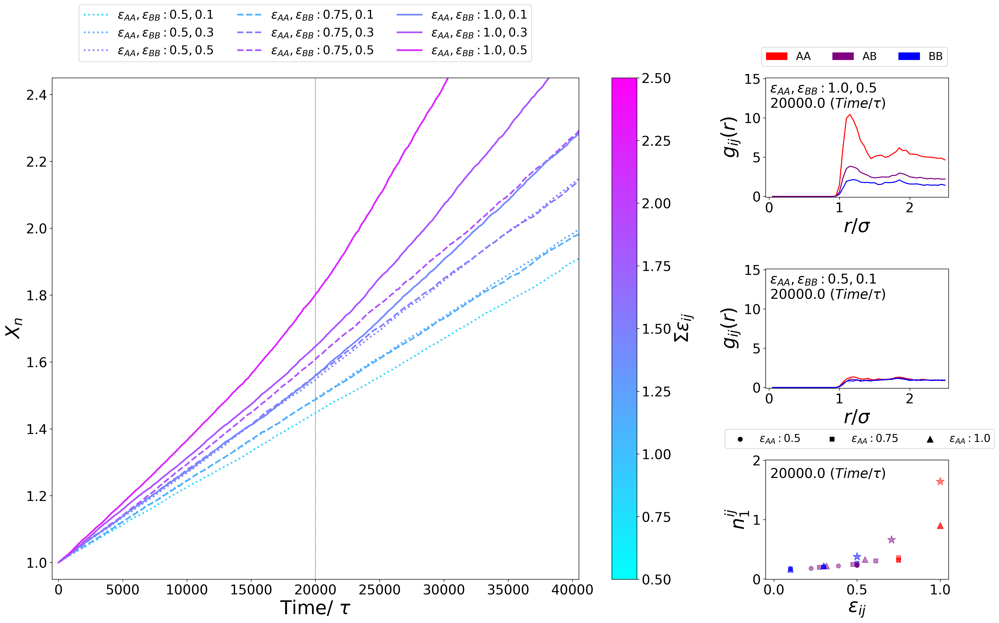

In [44]:
fig = plt.figure(figsize=(24,13.5))
gs = fig.add_gridspec(ncols=4,nrows=3, width_ratios=[1,1,1,1], height_ratios = [1,1,1], hspace = 0.6, wspace=0.3)
ax1 = fig.add_subplot(gs[:3,:3])
ax2 = fig.add_subplot(gs[0,3])
ax3 = fig.add_subplot(gs[1,3])
ax4 = fig.add_subplot(gs[2,3])



epsAA_colorids = [2,2,1,1,1,0,0,0,2]


for i,sim in enumerate(flexible_sims):
    ax1.plot(0.001*sim[2],sim[13],label=labels[i], color=cmap6(c_id6[i]), linestyle=epsAA_linestyles[i],linewidth=2.5)
    

ax1.legend(*([x[i] for i in [0,1,8,2,3,4,5,6,7]] for x in ax1.get_legend_handles_labels()),loc='lower left', ncol = 3, bbox_to_anchor=(0.04,1.02), prop={'size':18});
    
    
    

ax1.set_xlabel(r"Time/ $\tau$")
ax1.set_ylabel(r'$X_n$')
ax1.set_xlim((-0.05e4,4.05e4))
ax1.set_ylim((0.95,2.45))
plt.colorbar(sm6,ax=ax1,label=r'$\Sigma \epsilon_{ij}$');

#sim index:
#    0         1          2         3         4            5          6          7                 8           9      10     11       12    13          14            15
#[extent_avg,order_avg,tstep_avg,probs_avg,blockAtotal,blockBtotal,chaindist,BlockA_PDI_avg,BlockB_PDI_avg,PDI_avg,pA_avg,pB_avg,seqs_all,Xn_avg,TotalBlock_PDI_avg, RDFs]
# probs_avg index
#[pAA_avg,pAB_avg,pBB_avg]
# RDFs index
# [step,x,rdf_all,rdf_AA,rdf_BB,rdf_AB]




ax2.set_xlabel('$r/\sigma$')
ax2.set_ylabel('$g_{ij}(r)$')
ax3.set_xlabel('$r/\sigma$')
ax3.set_ylabel('$g_{ij}(r)$')
    


#leg1,=ax2.plot([0.,10.],[-10.,-10.],'--k')
#leg2,=ax2.plot([0.,10.],[-10.,-10.],'k')
leg3=ax4.bar([-10,-9],[-10,-9],color='r')
leg4=ax4.bar([-10,-9],[-10,-9],color='purple')
leg5=ax4.bar([-10,-9],[-10,-9],color='b')
ax3.plot(flexible_sims[0][16][1],flexible_sims[0][16][3],label='AA',color='r')
ax3.plot(flexible_sims[0][16][1],flexible_sims[0][16][5],label='AB',color='purple')
ax3.plot(flexible_sims[0][16][1],flexible_sims[0][16][4],label='BB',color='b')
#ax3.plot(flexible_sims[0][15][1],flexible_sims[0][15][3],label='AA',color='r', linestyle = '--')
#ax3.plot(flexible_sims[0][15][1],flexible_sims[0][15][5],label='AB',color='purple', linestyle = '--')
#ax3.plot(flexible_sims[0][15][1],flexible_sims[0][15][4],label='BB',color='b', linestyle = '--')
ax3.set_ylim((-0.1,15.1))
ax3.set_xlim((-0.05,2.55))
ax3.text(0.025,0.75,labels[0]+'\n'+r'${} \ (Time/\tau)$'.format(0.001*rdf_step2),transform = ax3.transAxes)
#ax3.text(0.05,1.05,labels[0]+'\n'+r'${} \ (Time/\tau)$'.format(0.001*rdf_step2),transform = ax3.transAxes)
#ax3.legend([leg3,leg1,leg4,leg2,leg5],('AA',r'${} \ (Time/\tau)$'.format(0.001*rdf_step),'AB',r'${} \ (Time/\tau)$'.format(0.001*rdf_step2),'BB'),loc='lower left', ncol = 3, bbox_to_anchor=(-0.15,1.05), prop={'size':16})
ax2.legend([leg3,leg4,leg5],('AA','AB','BB'),loc='lower left', ncol = 3, bbox_to_anchor=(-0.05,1.05), prop={'size':16})



ax2.plot(flexible_sims[7][16][1],flexible_sims[7][16][3],label='AA',color='r')
ax2.plot(flexible_sims[7][16][1],flexible_sims[7][16][4],label='BB',color='b')
ax2.plot(flexible_sims[7][16][1],flexible_sims[7][16][5],label='AB',color='purple')
#ax2.plot(flexible_sims[7][15][1],flexible_sims[7][15][3],label='AA',color='r', linestyle = '--')
#ax2.plot(flexible_sims[7][15][1],flexible_sims[7][15][4],label='BB',color='b', linestyle = '--')
#ax2.plot(flexible_sims[7][15][1],flexible_sims[7][15][5],label='AB',color='purple', linestyle = '--')
ax2.set_ylim((-0.1,15.1))
ax2.set_xlim((-0.05,2.55))
ax2.text(0.025,0.75,labels[7]+'\n'+r'${} \ (Time/\tau)$'.format(0.001*rdf_step2), transform = ax2.transAxes);
#ax2.text(0.05,1.05,labels[7]+'\n'+r'${} \ (Time/\tau)$'.format(0.001*rdf_step2), transform = ax2.transAxes);



leg1=ax4.bar([-10,-9],[-10,-9],color='r')
leg2=ax4.bar([-10,-9],[-10,-9],color='purple')
leg3=ax4.bar([-10,-9],[-10,-9],color='b')
ax4.set_xlim(-0.05, 1.05)
ax4.set_ylim(-0.005,2.005)
#ax4.set_ylim(-0.005,2.005)
#ax4.set_yticks([2,4,6,8])
ax4.set_xlabel("$\epsilon_{ij}$")
ax4.set_ylabel("$n^{ij}_1$")
mrkrs2 = ['o','o','s','s','s','^','^','*','o']
mrkrsizes2 = [40,40,40,40,40,80,80,160,40]
for i in range(len(delta_eps)):
    ax4.scatter(eps_max[i],coordnum[i][0],color='r',marker=mrkrs2[i],s=mrkrsizes2[i],alpha=0.5)#,facecolor='None')
    ax4.scatter(eps_min[i],coordnum[i][1],color='b',marker=mrkrs2[i],s=mrkrsizes2[i],alpha=0.5)#,facecolor='None')
    ax4.scatter(eps_mix[i],coordnum[i][2],color='purple',marker=mrkrs2[i],s=mrkrsizes2[i],alpha=0.5)#,facecolor='None')
#     if i == 7:
#         ax4.scatter(eps_max[i],coordnum[i][0],color='r',marker=mrkrs2[i],s=mrkrsizes2[i])
#         ax4.scatter(eps_min[i],coordnum[i][1],color='b',marker=mrkrs2[i],s=mrkrsizes2[i])
#         ax4.scatter(eps_mix[i],coordnum[i][2],color='purple',marker=mrkrs2[i],s=mrkrsizes2[i])
#     else:
#         ax4.scatter(eps_max[i],coordnum[i][0],color='r',marker=mrkrs2[i],s=mrkrsizes2[i],facecolor='None')
#         ax4.scatter(eps_min[i],coordnum[i][1],color='b',marker=mrkrs2[i],s=mrkrsizes2[i],facecolor='None')
#         ax4.scatter(eps_mix[i],coordnum[i][2],color='purple',marker=mrkrs2[i],s=mrkrsizes2[i],facecolor='None')

        

leg4=ax4.scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = mrkrs2[0], s=mrkrsizes2[0])#,facecolor='None')
leg5=ax4.scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = mrkrs2[3], s=mrkrsizes2[3])#,facecolor='None')
leg6=ax4.scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = mrkrs2[6], s=mrkrsizes2[6])#,facecolor='None')
ax4.text(0.025,0.85,r'${} \ (Time/\tau)$'.format(0.001*rdf_step2), transform = ax4.transAxes);
ax4.legend([leg4,leg5,leg6],(r'$\epsilon_{AA}:0.5$',r'$\epsilon_{AA}:0.75$',r'$\epsilon_{AA}:1.0$'),loc='lower left', ncol = 3, bbox_to_anchor=(-0.25,1.05), prop={'size':16});


ax1.plot([20000.0,20000.0],[0.0,3.0],'--k',linewidth=0.5,zorder=0)

plt.show()

In [45]:
blahdop = []
for i,sim in enumerate(flexible_sims):
    blahdop.append(sim[13][-1])
    blahdop.append(sims[i][13][-1])

print(np.mean(blahdop))
print(np.std(blahdop))
    

10.354743913767244
0.26866419852608425


In [46]:
# fig = plt.figure(figsize=(24,13.5))
# gs = fig.add_gridspec(ncols=4,nrows=3, width_ratios=[1,1,1,1], height_ratios = [1,1,1], hspace = 0.6, wspace=0.3)
# ax1 = fig.add_subplot(gs[:3,:3])
# ax2 = fig.add_subplot(gs[0,3])
# ax3 = fig.add_subplot(gs[1,3])
# ax4 = fig.add_subplot(gs[2,3])



# epsAA_colorids = [2,2,1,1,1,0,0,0,2]


# for i,sim in enumerate(flexible_sims):
#     ax1.plot(0.001*sim[2],sim[13],label=labels[i], color=cmap6(c_id6[i]), linestyle=epsAA_linestyles[i],linewidth=2.5)
    

# ax1.legend(*([x[i] for i in [0,1,8,2,3,4,5,6,7]] for x in ax1.get_legend_handles_labels()),loc='lower left', ncol = 3, bbox_to_anchor=(0.04,1.02), prop={'size':18});
    
    
    

# ax1.set_xlabel(r"Time/ $\tau$")
# ax1.set_ylabel(r'$X_n$')
# ax1.set_xlim((-0.05e4,4.05e4))
# ax1.set_ylim((0.95,2.45))
# plt.colorbar(sm6,ax=ax1,label=r'$\Sigma \epsilon_{ij}$');

# #sim index:
# #    0         1          2         3         4            5          6          7                 8           9      10     11       12    13          14            15
# #[extent_avg,order_avg,tstep_avg,probs_avg,blockAtotal,blockBtotal,chaindist,BlockA_PDI_avg,BlockB_PDI_avg,PDI_avg,pA_avg,pB_avg,seqs_all,Xn_avg,TotalBlock_PDI_avg, RDFs]
# # probs_avg index
# #[pAA_avg,pAB_avg,pBB_avg]
# # RDFs index
# # [step,x,rdf_all,rdf_AA,rdf_BB,rdf_AB]




# ax2.set_xlabel('$r/\sigma$')
# ax2.set_ylabel('$g(r)$')
# ax3.set_xlabel('$r/\sigma$')
# ax3.set_ylabel('$g(r)$')
    


# #leg1,=ax2.plot([0.,10.],[-10.,-10.],'--k')
# #leg2,=ax2.plot([0.,10.],[-10.,-10.],'k')
# leg3=ax4.bar([-10,-9],[-10,-9],color='r')
# leg4=ax4.bar([-10,-9],[-10,-9],color='purple')
# leg5=ax4.bar([-10,-9],[-10,-9],color='b')
# ax2.plot(flexible_sims[0][16][1],flexible_sims[0][16][3],label='AA',color='r')
# ax2.plot(flexible_sims[0][16][1],flexible_sims[0][16][5],label='AB',color='purple')
# ax2.plot(flexible_sims[0][16][1],flexible_sims[0][16][4],label='BB',color='b')
# #ax2.plot(flexible_sims[0][15][1],flexible_sims[0][15][3],label='AA',color='r', linestyle = '--')
# #ax2.plot(flexible_sims[0][15][1],flexible_sims[0][15][5],label='AB',color='purple', linestyle = '--')
# #ax2.plot(flexible_sims[0][15][1],flexible_sims[0][15][4],label='BB',color='b', linestyle = '--')
# ax2.set_ylim((-0.1,15.1))
# ax2.set_xlim((-0.05,2.55))
# ax2.text(0.025,0.75,labels[0]+'\n'+r'${} \ (Time/\tau)$'.format(0.001*rdf_step2),transform = ax2.transAxes)
# #ax2.text(0.05,1.05,labels[0]+'\n'+r'${} \ (Time/\tau)$'.format(0.001*rdf_step2),transform = ax2.transAxes)
# #ax2.legend([leg3,leg1,leg4,leg2,leg5],('AA',r'${} \ (Time/\tau)$'.format(0.001*rdf_step),'AB',r'${} \ (Time/\tau)$'.format(0.001*rdf_step2),'BB'),loc='lower left', ncol = 3, bbox_to_anchor=(-0.15,1.05), prop={'size':16})
# ax2.legend([leg3,leg4,leg5],('AA','AB','BB'),loc='lower left', ncol = 3, bbox_to_anchor=(-0.05,1.05), prop={'size':16})



# ax3.plot(flexible_sims[7][16][1],flexible_sims[7][16][3],label='AA',color='r')
# ax3.plot(flexible_sims[7][16][1],flexible_sims[7][16][4],label='BB',color='b')
# ax3.plot(flexible_sims[7][16][1],flexible_sims[7][16][5],label='AB',color='purple')
# #ax3.plot(flexible_sims[7][15][1],flexible_sims[7][15][3],label='AA',color='r', linestyle = '--')
# #ax3.plot(flexible_sims[7][15][1],flexible_sims[7][15][4],label='BB',color='b', linestyle = '--')
# #ax3.plot(flexible_sims[7][15][1],flexible_sims[7][15][5],label='AB',color='purple', linestyle = '--')
# ax3.set_ylim((-0.1,15.1))
# ax3.set_xlim((-0.05,2.55))
# ax3.text(0.025,0.75,labels[7]+'\n'+r'${} \ (Time/\tau)$'.format(0.001*rdf_step2), transform = ax3.transAxes);
# #ax3.text(0.05,1.05,labels[7]+'\n'+r'${} \ (Time/\tau)$'.format(0.001*rdf_step2), transform = ax3.transAxes);



# leg1=ax4.bar([-10,-9],[-10,-9],color='r')
# leg2=ax4.bar([-10,-9],[-10,-9],color='purple')
# leg3=ax4.bar([-10,-9],[-10,-9],color='b')
# #leg4=ax4.scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = 'x',s=150)
# #leg5=ax4.scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = '+',s=150)
# #leg6=ax4.scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = 'o',s=75)
# ax4.set_xlim(-0.05, 1.05)
# ax4.set_ylim(-0.005,2.005)
# #ax4.set_ylim(-0.005,2.005)
# #ax4.set_yticks([2,4,6,8])
# ax4.set_xlabel("$\Delta \epsilon$")
# ax4.set_ylabel("$n_1$")
# for i in range(len(delta_eps)):
#     if i == 7:
#         ax4.scatter(delta_eps[i],coordnum[i][0],color='r',marker='*',s=mrkrsizes[-1]*2)
#         ax4.scatter(delta_eps[i],coordnum[i][1],color='b',marker='*',s=mrkrsizes[-1]*2)
#         ax4.scatter(delta_eps[i],coordnum[i][2],color='purple',marker='*',s=mrkrsizes[-1]*2)
#     else:
#         ax4.scatter(delta_eps[i],coordnum[i][0],color='r',marker=mrkrs[-1],s=mrkrsizes[-1])
#         ax4.scatter(delta_eps[i],coordnum[i][1],color='b',marker=mrkrs[-1],s=mrkrsizes[-1])
#         ax4.scatter(delta_eps[i],coordnum[i][2],color='purple',marker=mrkrs[-1],s=mrkrsizes[-1])

# #ax4.legend([leg1,leg4,leg2,leg5,leg3,leg6],('AA',r'$\epsilon_{BB} = 0.1 k_{B}T$','AB',r'$\epsilon_{BB} = 0.3 k_{B}T$','BB',r'$\epsilon_{BB} = 0.5 k_{B}T$'),loc='lower left', ncol = 3, bbox_to_anchor=(0.35,1.05), prop={'size':16});
# #ax4.legend([leg1,leg4,leg2,leg5,leg3,leg6],('AA',r'$\epsilon_{BB} = 0.1 k_{B}T$','AB',r'$\epsilon_{BB} = 0.3 k_{B}T$','BB',r'$\epsilon_{BB} = 0.5 k_{B}T$'),loc='upper left', ncol = 3, prop={'size':16});
# ax4.text(0.025,0.85,r'${} \ (Time/\tau)$'.format(0.001*rdf_step2), transform = ax4.transAxes);
# #ax4.legend([leg1,leg2,leg3],('AA','AB','BB'),loc='lower left', ncol = 3, bbox_to_anchor=(-0.025,1.05), prop={'size':16});



# ax1.plot([20000.0,20000.0],[0.0,3.0],'--k',linewidth=0.5,zorder=0)

# plt.show()

## Chain Dispersity

Dispersity: stiff and flexible.

In [47]:
# fig, host = plt.subplots(1,2,figsize = (20,8))

# for i,sim in enumerate(sims):
#     host[0].plot(sim[0],sim[9],label=labels[i], color=cmap(c_id[i]))
#     host[1].plot(flexible_sims[i][0],flexible_sims[i][9],label=labels[i], color=cmap(c_id[i]))

# host[0].text(0.1,0.9,r'$l_p = 16.5$',transform=host[0].transAxes, bbox = dict(boxstyle='square',facecolor='white'))
# host[1].text(0.1,0.9,r'$l_p = 3.5$',transform=host[1].transAxes, bbox = dict(boxstyle='square',facecolor='white'))
    
    
# host[0].plot(sim[0],(sim[0])+1,'--k',label='Flory-Schulz')
# host[1].plot(sim[0],(sim[0])+1,'--k',label='Flory-Schulz')
# host[0].set_xlabel('$p$')
# host[1].set_xlabel('$p$')
# host[0].set_ylabel(u'\u0110')
# host[0].set_xlim((-0.01,1.0))
# host[1].set_xlim((-0.01,1.0))
# host[0].set_ylim((0.75,8.0))
# host[1].set_ylim((0.75,8.0))
# host[0].legend(*([x[i] for i in [0,1,8,2,3,4,5,6,7,9]] for x in plt.gca().get_legend_handles_labels()),loc='lower left', ncol = 4, bbox_to_anchor=(-0.2,1.02), prop={'size':16});
# plt.colorbar(sm,ax=host.ravel().tolist(),label=labels[-1]);

Dispersity: stiff and flexible, alternate chain coloration.

In [48]:
# eps_sum = np.array([0.6,0.8,0.85,1.05,1.25,1.1,1.3,1.5,1.0])
# delta_eps = np.array([0.4,0.2,0.65,0.45,0.25,0.9,0.7,0.5,0.0])
# eps_max = np.array([0.5,0.5,0.75,0.75,0.75,1.,1.,1.,0.5])
# eps_min = eps_max-delta_eps
# eps_mix = (eps_max@eps_min)**(0.5)
# eps_sum2 = eps_sum + eps_mix

# #Colormaps for full Delta Epsilon
# c_id4 = (delta_eps-np.min(delta_eps))/(np.max(delta_eps)+0.1-np.min(delta_eps))
# cmap4 = plt.cm.viridis
# norm4 = matplotlib.colors.Normalize(vmin=np.min(delta_eps),vmax=np.max(delta_eps)+0.1)
# sm4 = plt.cm.ScalarMappable(norm=norm4,cmap=cmap4)
# sm4.set_array([])



# fig, host = plt.subplots(1,2,figsize = (20,8))

# host[0].text(0.75,0.9,r'$l_p = 16.5$',transform=host[0].transAxes, bbox = dict(boxstyle='square',facecolor='white'))
# host[1].text(0.1,0.9,r'$l_p = 3.5$',transform=host[1].transAxes, bbox = dict(boxstyle='square',facecolor='white'))
 

# for i,sim in enumerate(sims):
#     host[0].plot(sim[0],sim[9],label=labels[i], color=cmap4(c_id4[i]))
#     host[1].plot(flexible_sims[i][0],flexible_sims[i][9],label=labels[i], color=cmap4(c_id4[i]))
    
# host[0].plot(sim[0],(sim[0])+1,'--k',label='Flory-Schulz')
# host[1].plot(sim[0],(sim[0])+1,'--k',label='Flory-Schulz')
# host[0].set_xlabel('$p$')
# host[1].set_xlabel('$p$')
# host[0].set_ylabel(u'\u0110')
# host[0].set_xlim((-0.01,1.0))
# host[1].set_xlim((-0.01,1.0))
# host[0].set_ylim((0.75,8.0))
# host[1].set_ylim((0.75,8.0))
# host[0].legend(loc='upper left', prop={'size':14});
# #plt.colorbar(sm,ax=host.ravel().tolist(),label=labels[-1]);
# plt.colorbar(sm4,ax=host.ravel().tolist(),label=cb_labels[0]);

Dispersity: flexible only.

In [49]:
# fig, host = plt.subplots(1,1,figsize = (10,8))

# for i,sim in enumerate(sims):
#     host.plot(flexible_sims[i][0],flexible_sims[i][9],label=labels[i], color=cmap(c_id[i]))


    
# host.plot(sim[0],(sim[0])+1,'--k',label='Flory-Schulz')
# host.set_xlabel('$p$')
# host.set_ylabel(u'\u0110')
# host.set_xlim((-0.01,1.0))
# host.set_ylim((0.75,8.0))

# host.legend(*([x[i] for i in [0,1,8,2,3,4,5,6,7]] for x in plt.gca().get_legend_handles_labels()),loc='lower left', ncol = 3, bbox_to_anchor=(-0.15,1.02), prop={'size':16});
# plt.colorbar(sm,ax=host,label=labels[-1]);

In [50]:
# fig = plt.figure(figsize=(24,12))
# gs = fig.add_gridspec(2,2, width_ratios=[2,1], height_ratios = [1,1])
# ax1 = fig.add_subplot(gs[:,0])
# ax2 = fig.add_subplot(gs[1,1])
# ax3 = fig.add_subplot(gs[0,1])



# epsAA_colorids = [2,2,1,1,1,0,0,0,2]


# for i,sim in enumerate(sims):
#     ax1.plot(flexible_sims[i][0],flexible_sims[i][9],label=labels[i], color=cmap(c_id[i]),linestyle=epsAA_linestyles[i],linewidth=2.)

    
# ax1.plot(sim[0],(sim[0])+1,'--k',label='Flory-Schulz')
# ax1.legend(*([x[i] for i in [0,1,8,2,3,4,5,6,7]] for x in ax1.get_legend_handles_labels()),loc='lower left', ncol = 3, bbox_to_anchor=(0.04,1.02), prop={'size':16});
    
    
    

# ax1.set_xlabel(r"p")
# ax1.set_ylabel(u'\u0110')
# ax1.set_xlim((-0.01,1.0))
# ax1.set_ylim((0.75,8.0))
# #plt.colorbar(sm3,ax=ax1,label=cb_labels[-1]);
# plt.colorbar(sm,ax=ax1,label=labels[-1]);

# #sim index:
# #    0         1          2         3         4            5          6          7                 8           9      10     11       12    13          14            15
# #[extent_avg,order_avg,tstep_avg,probs_avg,blockAtotal,blockBtotal,chaindist,BlockA_PDI_avg,BlockB_PDI_avg,PDI_avg,pA_avg,pB_avg,seqs_all,Xn_avg,TotalBlock_PDI_avg, RDFs]
# # probs_avg index
# #[pAA_avg,pAB_avg,pBB_avg]
# # RDFs index
# # [step,x,rdf_all,rdf_AA,rdf_BB,rdf_AB]


# sim = flexible_sims[0]
# ax2.plot(n_chain_flexible, ((1-sim[0][-1])*(sim[0][-1])**(n_chain_flexible-1)),'-k',linewidth=3.)
# ax2.bar(n_chain_flexible,sim[6]/np.sum(sim[6]),align='center',color=cmap(c_id[0]))
# ax2.set_xlabel('Chain Length')
# ax2.set_ylabel('Probability')
# ax2.set_xlim((0,100))
# ax2.set_yscale('log')
# ax2.set_ylim((9e-5,1))
# ax2.text(0.05,0.85,labels[0],transform = ax2.transAxes)
# #ax2.legend(('Flory-Schulz','Chain Distribution'))



# #insert testing
# axins = inset_axes(ax2, width='25%', height='20%', loc='upper right',borderpad=1)
# axins.set_yscale('log')
# axins.set_ylim((9e-5,9e-3))
# axins.set_xlim((100,len(n_chain)-1))
# axins.set_xticks([100,len(n_chain)-1])
# axins.bar(n_chain_flexible,sim[6]/np.sum(sim[6]),align='center',color=cmap(c_id[0]));




# sim = flexible_sims[7]
# ax3.plot(n_chain_flexible, ((1-sim[0][-1])*(sim[0][-1])**(n_chain_flexible-1)),'-k',linewidth=3.)
# ax3.bar(n_chain_flexible,sim[6]/np.sum(sim[6]),align='center',color=cmap(c_id[7]))
# ax3.set_xlabel('Chain Length')
# ax3.set_ylabel('Probability')
# ax3.set_xlim((0,100))
# ax3.set_yscale('log')
# ax3.set_ylim((9e-5,1))
# ax3.text(0.05,0.85,labels[7],transform = ax3.transAxes)
# #ax3.legend(('Flory-Schulz','Chain Distribution'))


# #insert testing
# axins3 = inset_axes(ax3, width='25%', height='20%', loc='upper right',borderpad=1)
# axins3.set_yscale('log')
# axins3.set_ylim((9e-5,9e-3))
# axins3.set_xlim((100,len(n_chain)-1))
# axins3.set_xticks([100,len(n_chain)-1])
# axins3.bar(n_chain_flexible,sim[6]/np.sum(sim[6]),align='center',color=cmap(c_id[7]));

# plt.show()

With $\Sigma \varepsilon_{ij}$ representation.

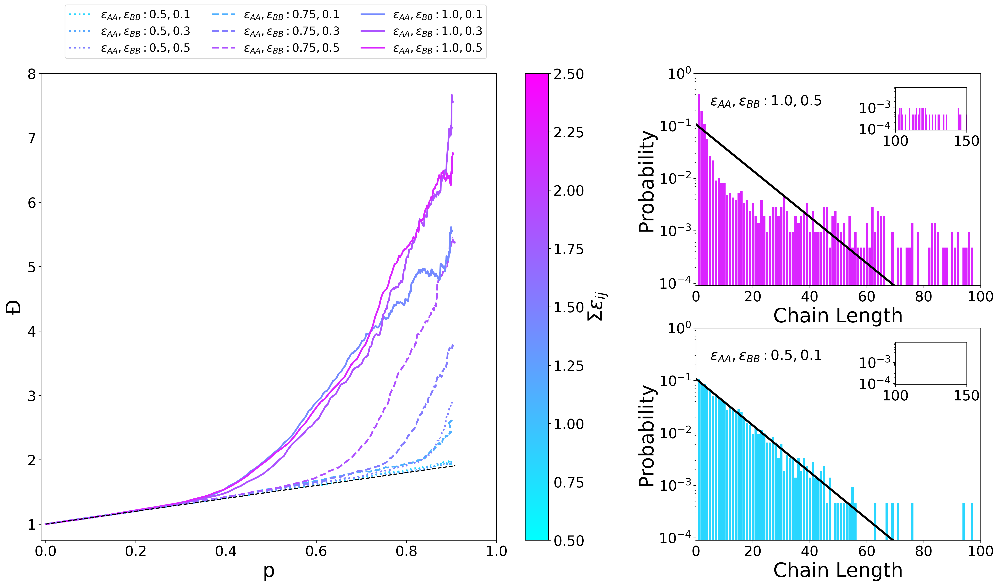

In [51]:
fig = plt.figure(figsize=(24,12))
gs = fig.add_gridspec(2,2, width_ratios=[2,1], height_ratios = [1,1])
ax1 = fig.add_subplot(gs[:,0])
ax2 = fig.add_subplot(gs[1,1])
ax3 = fig.add_subplot(gs[0,1])



epsAA_colorids = [2,2,1,1,1,0,0,0,2]


for i,sim in enumerate(sims):
    ax1.plot(flexible_sims[i][0][::10],flexible_sims[i][9][::10],label=labels[i], color=cmap6(c_id6[i]),linestyle=epsAA_linestyles[i],linewidth=2.5)

    
ax1.plot(sim[0],(sim[0])+1,'--k',label='Flory-Schulz')
ax1.legend(*([x[i] for i in [0,1,8,2,3,4,5,6,7]] for x in ax1.get_legend_handles_labels()),loc='lower left', ncol = 3, bbox_to_anchor=(0.04,1.02), prop={'size':16});
    
    
    

ax1.set_xlabel(r"p")
ax1.set_ylabel(u'\u0110')
ax1.set_xlim((-0.01,1.0))
ax1.set_ylim((0.75,8.0))
#plt.colorbar(sm3,ax=ax1,label=cb_labels[-1]);
plt.colorbar(sm6,ax=ax1,label=r'$\Sigma \epsilon_{ij}$');

#sim index:
#    0         1          2         3         4            5          6          7                 8           9      10     11       12    13          14            15
#[extent_avg,order_avg,tstep_avg,probs_avg,blockAtotal,blockBtotal,chaindist,BlockA_PDI_avg,BlockB_PDI_avg,PDI_avg,pA_avg,pB_avg,seqs_all,Xn_avg,TotalBlock_PDI_avg, RDFs]
# probs_avg index
#[pAA_avg,pAB_avg,pBB_avg]
# RDFs index
# [step,x,rdf_all,rdf_AA,rdf_BB,rdf_AB]


sim = flexible_sims[0]
ax2.plot(n_chain_flexible, ((1-sim[0][-1])*(sim[0][-1])**(n_chain_flexible-1)),'-k',linewidth=3.)
ax2.bar(n_chain_flexible,sim[6]/np.sum(sim[6]),align='center',color=cmap6(c_id6[0]))
ax2.set_xlabel('Chain Length')
ax2.set_ylabel('Probability')
ax2.set_xlim((0,100))
ax2.set_yscale('log')
ax2.set_ylim((9e-5,1))
ax2.text(0.05,0.85,labels[0],transform = ax2.transAxes)
#ax2.legend(('Flory-Schulz','Chain Distribution'))



#insert testing
axins = inset_axes(ax2, width='25%', height='20%', loc='upper right',borderpad=1)
axins.set_yscale('log')
axins.set_ylim((9e-5,9e-3))
axins.set_xlim((100,len(n_chain)-1))
axins.set_xticks([100,len(n_chain)-1])
axins.bar(n_chain_flexible,sim[6]/np.sum(sim[6]),align='center',color=cmap6(c_id6[0]));




sim = flexible_sims[7]
ax3.plot(n_chain_flexible, ((1-sim[0][-1])*(sim[0][-1])**(n_chain_flexible-1)),'-k',linewidth=3.)
ax3.bar(n_chain_flexible,sim[6]/np.sum(sim[6]),align='center',color=cmap6(c_id6[7]))
ax3.set_xlabel('Chain Length')
ax3.set_ylabel('Probability')
ax3.set_xlim((0,100))
ax3.set_yscale('log')
ax3.set_ylim((9e-5,1))
ax3.text(0.05,0.85,labels[7],transform = ax3.transAxes)
#ax3.legend(('Flory-Schulz','Chain Distribution'))


#insert testing
axins3 = inset_axes(ax3, width='25%', height='20%', loc='upper right',borderpad=1)
axins3.set_yscale('log')
axins3.set_ylim((9e-5,9e-3))
axins3.set_xlim((100,len(n_chain)-1))
axins3.set_xticks([100,len(n_chain)-1])
axins3.bar(n_chain_flexible,sim[6]/np.sum(sim[6]),align='center',color=cmap6(c_id6[7]));

plt.show()

## Fluctuations Metric

Metric definition.

In [52]:
def fluctuations(seqs):
    #returns [xlist, ylist]; where x is the distance in l and y is the fluctuation
    maxlen = max(map(len,seqs))
    diff = {i:[] for i in range(1,maxlen)}
    ABnumber = {
        'A': 1,
        'B': -1
    }
    for seq in seqs:
        if seq[-1] == 'c':
            seq = seq[:-1]
        coord = np.cumsum(list(map(lambda x: ABnumber[x], seq)))
        for i in range(len(coord)):
            for j in range(i):
                diff[i-j].append(coord[i]-coord[j])
    rms = {i: np.std(diff[i]) for i in diff}
    return list(zip(*rms.items()))

Random figure for group meeting presentation explaining fluctuation plots.

In [53]:
# fig, host = plt.subplots(1,1,figsize=(10,10))


    
# host.plot(n_chain_flexible[1:],n_chain_flexible[1:]**0.5,':k',label='$l^{1/2}$')
# host.plot(n_chain_flexible[1:16],n_chain_flexible[1:16]**0.8,'g',label='$l^{1/2}$')
# #host.plot([n_chain_flexible[15],n_chain_flexible[15]],[0.001,20.0],'--k')
# #host.plot(n_chain_flexible[15:20],[n_chain_flexible[15]**0.8,6,3,1,0.001],'g',label='$l^{1/2}$')



# host.set_xlabel('$l$ (Monomer Distance)')
# host.set_ylabel('Fluctuation $F(l)$')
# host.set_xscale('log')
# host.set_yscale('log')
# host.set_xlim((0.9,len(n_chain_flexible)))
# host.set_ylim((0.9,20.0))


All trials, stiff and flexible, $\varepsilon_{AA} + \varepsilon_{BB}$ coloration.

In [54]:
# #sim index:
# #    0         1          2         3         4            5          6          7                 8           9      10     11       12    13          14
# #[extent_avg,order_avg,tstep_avg,probs_avg,blockAtotal,blockBtotal,chaindist,BlockA_PDI_avg,BlockB_PDI_avg,PDI_avg,pA_avg,pB_avg,seqs_all,Xn_avg,TotalBlock_PDI_avg]
# # probs_avg index
# #[pAA_avg,pAB_avg,pBB_avg]

# fig, host = plt.subplots(1,2,figsize = (20,8))

# host[0].text(0.1,0.9,r'$l_p = 16.5$',transform=host[0].transAxes, bbox = dict(boxstyle='square',facecolor='white'))
# host[1].text(0.1,0.9,r'$l_p = 3.5$',transform=host[1].transAxes, bbox = dict(boxstyle='square',facecolor='white'))
 

# for i,sim in enumerate(sims):
#     seq_fluc = fluctuations(sim[12])
#     seq_fluc_flex = fluctuations(flexible_sims[i][12])
#     host[0].plot(seq_fluc[0],seq_fluc[1],label=labels[i], color=cmap(c_id[i]))
#     host[1].plot(seq_fluc_flex[0],seq_fluc_flex[1],label=labels[i], color=cmap(c_id[i]))
    
# host[0].plot(n_chain_flexible[1:],n_chain_flexible[1:]**0.5,':k',label='$l^{1/2}$')
# host[1].plot(n_chain_flexible[1:],n_chain_flexible[1:]**0.5,':k',label='$l^{1/2}$')
# host[0].set_xlabel('$l$ (Monomer Distance)')
# host[1].set_xlabel('$l$ (Monomer Distance)')
# host[0].set_ylabel('Fluctuation $F(l)$')
# host[0].set_xscale('log')
# host[1].set_xscale('log')
# host[0].set_yscale('log')
# host[1].set_yscale('log')
# host[0].set_xlim((0.9,len(n_chain_flexible)))
# host[1].set_xlim((0.9,len(n_chain_flexible)))
# host[0].set_ylim((0.9,20.0))
# host[1].set_ylim((0.9,20.0))
# host[0].legend(*([x[i] for i in [0,1,8,2,3,4,5,6,7,9]] for x in plt.gca().get_legend_handles_labels()),loc='lower left', ncol = 4, bbox_to_anchor=(-0.2,1.02), prop={'size':16});
# plt.colorbar(sm,ax=host.ravel().tolist(),label=labels[-1]);

All trials, stiff and flexible, $\Delta \varepsilon$ coloration.

In [55]:
# fig, host = plt.subplots(1,2,figsize = (20,8))

# host[0].text(0.1,0.9,r'$l_p = 16.5$',transform=host[0].transAxes, bbox = dict(boxstyle='square',facecolor='white'))
# host[1].text(0.1,0.9,r'$l_p = 3.5$',transform=host[1].transAxes, bbox = dict(boxstyle='square',facecolor='white'))
 

# for i,sim in enumerate(sims):
#     seq_fluc = fluctuations(sim[12])
#     seq_fluc_flex = fluctuations(flexible_sims[i][12])
#     host[0].plot(seq_fluc[0],seq_fluc[1],label=labels[i], color=cmap4(c_id4[i]))
#     host[1].plot(seq_fluc_flex[0],seq_fluc_flex[1],label=labels[i], color=cmap4(c_id4[i]))
    
# host[0].plot(n_chain_flexible[1:],n_chain_flexible[1:]**0.5,':k',label='$l^{1/2}$')
# host[1].plot(n_chain_flexible[1:],n_chain_flexible[1:]**0.5,':k',label='$l^{1/2}$')
# host[0].set_xlabel('$l$ (Monomer Distance)')
# host[1].set_xlabel('$l$ (Monomer Distance)')
# host[0].set_ylabel('Fluctuation $F(l)$')
# host[0].set_xscale('log')
# host[1].set_xscale('log')
# host[0].set_yscale('log')
# host[1].set_yscale('log')
# host[0].set_xlim((0.9,len(n_chain_flexible)))
# host[1].set_xlim((0.9,len(n_chain_flexible)))
# host[0].set_ylim((0.9,20.0))
# host[1].set_ylim((0.9,20.0))
# host[0].legend(*([x[i] for i in [0,1,8,2,3,4,5,6,7,9]] for x in plt.gca().get_legend_handles_labels()),loc='lower left', ncol = 4, bbox_to_anchor=(-0.2,1.02), prop={'size':16});
# plt.colorbar(sm4,ax=host.ravel().tolist(),label=cb_labels[0]);

Specific trials highlighting trends in attractive interactions. Stiff and flexible chains.

In [56]:
# fig, host = plt.subplots(1,2,figsize = (20,8))

# host[0].plot([0,0],[0,0],'-k',label='Flexible Chains')
# host[0].plot([0,0],[0,0],'--k',label='Stiff Chains') 

# host[1].plot([0,0],[0,0],'-k',label='Flexible Chains')
# host[1].plot([0,0],[0,0],'--k',label='Stiff Chains')    

# for j,i in enumerate([5,6,7]):
#     seq_fluc_flex = fluctuations(flexible_sims[i][12])
#     host[0].plot(seq_fluc_flex[0],seq_fluc_flex[1],label=labels[i], color=cmap2(c_id2[j]))

# for j,i in enumerate([5,2,0]):
#     seq_fluc_flex = fluctuations(flexible_sims[i][12])
#     host[1].plot(seq_fluc_flex[0],seq_fluc_flex[1],label=labels[i], color=cmap3(c_id3[j]))

# host[0].plot(n_chain_flexible[1:],n_chain_flexible[1:]**0.5,':k',label='$l^{1/2}$')
# host[1].plot(n_chain_flexible[1:],n_chain_flexible[1:]**0.5,':k',label='$l^{1/2}$')
    
# for j,i in enumerate([5,6,7]):
#     seq_fluc = fluctuations(sims[i][12])
#     host[0].plot(seq_fluc[0],seq_fluc[1],label=labels[i], color=cmap2(c_id2[j]),linestyle='--')
    
# for j,i in enumerate([5,2,0]):
#     seq_fluc = fluctuations(sims[i][12])
#     host[1].plot(seq_fluc[0],seq_fluc[1],label=labels[i], color=cmap3(c_id3[j]),linestyle='--')

    


    

# host[0].set_xlabel('$l$ (Monomer Distance)')
# host[1].set_xlabel('$l$ (Monomer Distance)')
# host[0].set_ylabel('Fluctuation $F(l)$')
# host[0].set_xscale('log')
# host[1].set_xscale('log')
# host[0].set_yscale('log')
# host[1].set_yscale('log')
# host[0].set_xlim((0.9,len(n_chain_flexible)))
# host[1].set_xlim((0.9,len(n_chain_flexible)))
# host[0].set_ylim((0.9,20.0))
# host[1].set_ylim((0.9,20.0))
# host[0].legend(*([x[i] for i in [2,3,4,0,1,5]] for x in host[0].get_legend_handles_labels()),loc='lower left', ncol = 2, bbox_to_anchor=(-0.05,1.02), prop={'size':14});
# host[1].legend(*([x[i] for i in [2,3,4,0,1,5]] for x in host[1].get_legend_handles_labels()),loc='lower left', ncol = 2, bbox_to_anchor=(-0.05,1.02), prop={'size':14});

# plt.colorbar(sm2,ax=host[0],label=cb_labels[0]);
# plt.colorbar(sm3,ax=host[1],label=cb_labels[1]);


All trials, flexible only, $\Delta \varepsilon$ coloration.

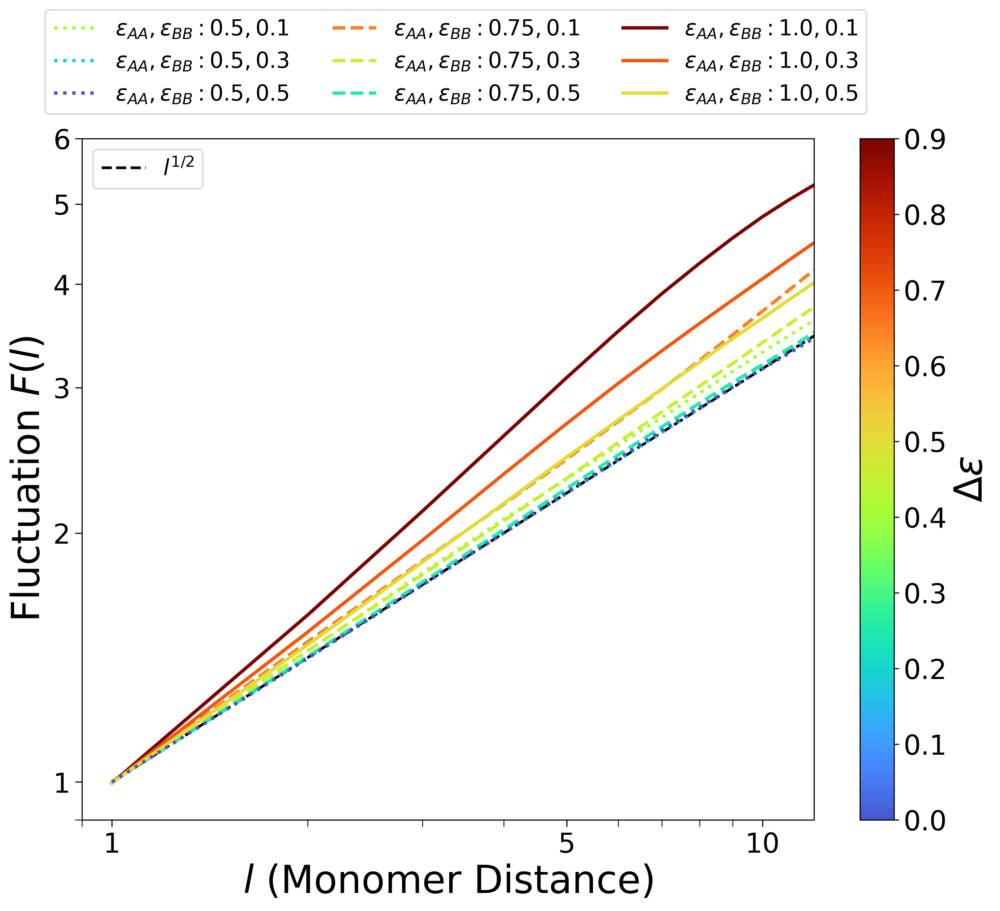

In [57]:
fig, host = plt.subplots(1,1,figsize = (12,9))

for i,sim in enumerate(sims):
    seq_fluc_flex = fluctuations(flexible_sims[i][12])
    host.plot(seq_fluc_flex[0],seq_fluc_flex[1],label=labels[i], color=cmap4(c_id4[i]), linestyle=epsAA_linestyles[i], linewidth=2.5)
    
trendline, = host.plot(n_chain_flexible[1:],n_chain_flexible[1:]**0.5,'--k',label=r'$l^{1/2}$',linewidth=2.,zorder=0)



host.set_xlabel('$l$ (Monomer Distance)')
host.set_ylabel('Fluctuation $F(l)$')
host.set_xscale('log')
host.get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
host.set_xticks([1,5,10])
host.set_yscale('log')
host.get_yaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
host.set_yticks([1,2,3,4,5,6])

host.get_xaxis().set_tick_params(which='minor', size=5)
host.get_xaxis().set_tick_params(which='major', size=5) 
host.get_yaxis().set_tick_params(which='minor', size=5)
host.get_yaxis().set_tick_params(which='major', size=5) 



#host.set_xlim((0.9,len(n_chain_flexible)))
#host.set_ylim((0.9,20.0))

host.set_xlim((0.9,12))
host.set_ylim((0.9,6.0))



#trendline_label = plt.gca().get_legend_handles_labels()[1][9]


legend1 = host.legend(*([x[i] for i in [0,1,8,2,3,4,5,6,7]] for x in plt.gca().get_legend_handles_labels()),loc='lower left', ncol = 3, bbox_to_anchor=(-0.065,1.02), prop={'size':16});
plt.gca().add_artist(legend1)
legend2 = plt.legend([trendline],(r'$l^{1/2}$',),loc='upper left', prop={'size':16});
plt.colorbar(sm4,ax=host,label=cb_labels[0]);

plt.show()

## Bonding Probabilities Plots

Pie plot.

In [58]:
# def drawPieMarker(axis, xs, ys, ratios, sizes, colors):
#     #assert sum(ratios) <= 1, 'sum of ratios needs to be < 1'
#     if sum(ratios) >=1:
#         for i in range(len(ratios)):
#             ratios[i] = ratios[i]-((sum(ratios)-1)/len(ratios))
    
#     markers = []
#     previous = 0
#     # calculate the points of the pie pieces
#     for color, ratio in zip(colors, ratios):
#         this = 2 * np.pi * ratio + previous
#         x  = [0] + np.cos(np.linspace(previous, this, 10)).tolist() + [0]
#         y  = [0] + np.sin(np.linspace(previous, this, 10)).tolist() + [0]
#         xy = np.column_stack([x, y])
#         previous = this
#         markers.append({'marker':xy, 's':np.abs(xy).max()**2*np.array(sizes), 'facecolor':color})

#     # scatter each of the pie pieces to create pies
#     for marker in markers:
#         axis.scatter(xs, ys, **marker)


        
# x = [0.1,0.3,0.1,0.3,0.5,0.1,0.3,0.5,0.5]
# y = [0.5,0.5,0.75,0.75,0.75,1.0,1.0,1.0,0.5]        
# vals_epsAA = [0.50,0.75,1.00]
# vals_epsBB = [0.1,0.3,0.5]        
# colors = ['red','purple','blue']
# sizes=[5000,5000,5000]
# fig, ax = plt.subplots(1,2,figsize=(24, 10))
# pie_str = '{0:.2f}'
# big_buffer = 0.08
# small_buffer = big_buffer/2.2
# tiny_buffer = big_buffer/10

# for i in range(len(sims)):
#     drawPieMarker(ax[0],x[i],y[i],[sims[i][3][0][-1],sims[i][3][1][-1],sims[i][3][2][-1]],sizes,colors)
#     ax[0].text(x[i]-big_buffer,y[i]-tiny_buffer,pie_str.format(sims[i][3][1][-1]))
#     ax[0].text(x[i]+small_buffer,y[i]+small_buffer-tiny_buffer,pie_str.format(sims[i][3][0][-1]))
#     ax[0].text(x[i]+small_buffer,y[i]-small_buffer-tiny_buffer,pie_str.format(sims[i][3][2][-1]))

#     drawPieMarker(ax[1],x[i],y[i],[flexible_sims[i][3][0][-1],flexible_sims[i][3][1][-1],flexible_sims[i][3][2][-1]],sizes,colors)
#     ax[1].text(x[i]-big_buffer,y[i],pie_str.format(flexible_sims[i][3][1][-1]))
#     ax[1].text(x[i]+small_buffer,y[i]+small_buffer-tiny_buffer,pie_str.format(flexible_sims[i][3][0][-1]))
#     ax[1].text(x[i]+small_buffer,y[i]-small_buffer-tiny_buffer,pie_str.format(flexible_sims[i][3][2][-1]))





# pie_labels=['$p_{AA}$','$p_{AB}$','$p_{BB}$']

# leg1=ax[0].bar([-10,-9],[-10,-9],color='r')
# leg2=ax[0].bar([-10,-9],[-10,-9],color='purple')
# leg3=ax[0].bar([-10,-9],[-10,-9],color='b')
# leg1=ax[1].bar([-10,-9],[-10,-9],color='r')
# leg2=ax[1].bar([-10,-9],[-10,-9],color='purple')
# leg3=ax[1].bar([-10,-9],[-10,-9],color='b')


# ax[0].title.set_text('Stiff Chains')
# ax[0].legend([leg1,leg2,leg3],pie_labels,loc='lower center', ncol=3)
# ax[0].set_xlim((0.,0.6))
# ax[0].set_ylim((0.35,1.1))
# ax[0].set_xticks(vals_epsBB)
# ax[0].set_yticks(vals_epsAA)
# ax[0].set_ylabel('$\epsilon_{AA}$')
# ax[0].set_xlabel('$\epsilon_{BB}$');

# ax[1].title.set_text('Flexible Chains')
# ax[1].legend([leg1,leg2,leg3],pie_labels,loc='lower center',ncol = 3)
# ax[1].set_xlim((0.,0.6))
# ax[1].set_ylim((0.35,1.1))
# ax[1].set_xticks(vals_epsBB)
# ax[1].set_yticks(vals_epsAA)
# ax[1].set_ylabel('$\epsilon_{AA}$')
# ax[1].set_xlabel('$\epsilon_{BB}$');

Scatter plot with colormap.

In [59]:
# x = [0.1,0.3,0.1,0.3,0.5,0.1,0.3,0.5,0.5]
# y = [0.5,0.5,0.75,0.75,0.75,1.0,1.0,1.0,0.5]        
# vals_epsAA = [0.50,0.75,1.00]
# vals_epsBB = [0.1,0.3,0.5]        
# colors = ['red','purple','blue']
# sizes=[5000,5000,5000]
# fig, host = plt.subplots(1,1,figsize = (10,8))


# for i in range(len(delta_eps)):
#     host.scatter(x[i],y[i],color=cmap5(c_id5[i]),marker='o',s=5000)
    
# plt.colorbar(sm5,ax=host,label='$p_{AA}$')
# host.set_xlim((0.,0.6))
# host.set_ylim((0.35,1.1))
# host.set_xticks(vals_epsBB)
# host.set_yticks(vals_epsAA)
# host.set_ylabel('$\epsilon_{AA}$')
# host.set_xlabel('$\epsilon_{BB}$');

# plt.show()

In [60]:
# Getting the values in appropriate matrix form for imshow
# probs_avg index
#[pAA_avg,pAB_avg,pBB_avg]
probs_array = np.zeros((3*len(flexible_sims),1))

for i,sim in enumerate(flexible_sims):
    probs_array[3*i] = sim[3][0][-1]
    probs_array[3*i+1] = sim[3][1][-1]
    probs_array[3*i+2] = sim[3][2][-1]


probs_matrix = np.array([[probs_array[15],probs_array[18],probs_array[21]]
                         ,[probs_array[16],probs_array[19],probs_array[22]]
                         ,[probs_array[17],probs_array[20],probs_array[23]]
                         ,[probs_array[6],probs_array[9],probs_array[12]]
                         ,[probs_array[7],probs_array[10],probs_array[13]]
                         ,[probs_array[8],probs_array[11],probs_array[14]]
                         ,[probs_array[0],probs_array[3],probs_array[24]]
                         ,[probs_array[1],probs_array[4],probs_array[25]]
                         ,[probs_array[2],probs_array[5],probs_array[26]]])



#Matrices for each bonding pair seperately for seperate colormaps
probs_AAonly_mat = np.array([[probs_array[15],probs_array[18],probs_array[21]],[probs_array[6],probs_array[9],probs_array[12]],[probs_array[0],probs_array[3],probs_array[24]]])
probs_ABonly_mat = np.array([[probs_array[16],probs_array[19],probs_array[22]],[probs_array[7],probs_array[10],probs_array[13]],[probs_array[1],probs_array[4],probs_array[25]]])
probs_BBonly_mat = np.array([[probs_array[17],probs_array[20],probs_array[23]],[probs_array[8],probs_array[11],probs_array[14]],[probs_array[2],probs_array[5],probs_array[26]]])


#Masking values by bonding pair so we can use multiple colormaps
AA_mask =[[0,0,0],[1,1,1],[1,1,1],[0,0,0],[1,1,1],[1,1,1],[0,0,0],[1,1,1],[1,1,1]]
AB_mask =[[1,1,1],[0,0,0],[1,1,1],[1,1,1],[0,0,0],[1,1,1],[1,1,1],[0,0,0],[1,1,1]]
BB_mask =[[1,1,1],[1,1,1],[0,0,0],[1,1,1],[1,1,1],[0,0,0],[1,1,1],[1,1,1],[0,0,0]]
probs_matrix_AA = np.ma.masked_array(probs_matrix, mask = AA_mask)
probs_matrix_AB = np.ma.masked_array(probs_matrix, mask = AB_mask)
probs_matrix_BB = np.ma.masked_array(probs_matrix, mask = BB_mask)

M, N = 3, 3  # M columns and N rows of large cells
K, L = 1, 3  # K columns and L rows to subdivide each of the cells

       
vals_epsAA = [0.50,0.75,1.00]
vals_epsBB = [0.1,0.3,0.5]        
vals_epsAA = vals_epsAA[::-1]

Shared heatmap for bonding probabilities.

In [61]:
# fig, host = plt.subplots(1,1,figsize = (10,10))




# # thin lines between the sub cells
# for i in range(M):
#     for j in range(1, K):
#         host.axvline(i - 0.5 + j / K, color='white', lw=2)
# for i in range(N):
#     for j in range(1, L):
#         host.axhline(i - 0.5 + j / L, color='white', lw=2)
# # thick line between the large cells
# # use clip_on=False and hide the spines to avoid that the border cells look different
# for i in range(M + 1):
#     host.axvline(i - 0.5, color='white', lw=4, clip_on=False)
# for i in range(N + 1):
#     host.axhline(i - 0.5, color='white', lw=4, clip_on=False)

# host.tick_params(length=0)
# for s in host.spines:
#     host.spines[s].set_visible(False)

# # We want to show integer ticks...
# host.set_xticks(np.arange(0, M))
# host.set_yticks(np.arange(0, N))
# # ... and label them with the respective list entries.
# host.set_xticklabels(vals_epsBB)
# host.set_yticklabels(vals_epsAA)

# host.set_ylabel('$\epsilon_{AA}$')
# host.set_xlabel('$\epsilon_{BB}$')






# #imshow to heatmap from the masked array
# pixAA=host.imshow(probs_matrix_AA, extent=[-0.5, M - 0.5, N - 0.5, -0.5], interpolation='none', cmap=matplotlib.cm.Reds,vmin=0.2,vmax=0.4)
# pixAB=host.imshow(probs_matrix_AB, extent=[-0.5, M - 0.5, N - 0.5, -0.5], interpolation='none', cmap=matplotlib.cm.Purples,vmin=0.3,vmax=0.5)
# pixBB=host.imshow(probs_matrix_BB, extent=[-0.5, M - 0.5, N - 0.5, -0.5], interpolation='none', cmap=matplotlib.cm.Blues,vmin=0.2,vmax=0.3)

# cb_AA = plt.colorbar(pixAA,shrink=0.5,orientation='vertical',location='left',pad=0.15,anchor=(0.,0.6))
# cb_AB = plt.colorbar(pixAB,shrink=0.5,orientation='vertical',location='right',pad=0.15,anchor=(0.,0.6))
# cb_BB = plt.colorbar(pixBB,orientation='horizontal',location='bottom')
# cb_AA.set_label(r'$pAA$',size=smallsize)
# cb_AB.set_label(r'$pAB$',size=smallsize)
# cb_BB.set_label(r'$pBB$',size=smallsize)
# cb_AA.set_ticks([0.2,0.3,0.4])
# cb_AB.set_ticks([0.3,0.4,0.5])
# cb_BB.set_ticks([0.2,0.25,0.3])


# plt.show()

Alternate colorbar positions.

In [62]:
# fig, host = plt.subplots(1,1,figsize = (16,9))




# # thin lines between the sub cells
# for i in range(M):
#     for j in range(1, K):
#         host.axvline(i - 0.5 + j / K, color='white', lw=2)
# for i in range(N):
#     for j in range(1, L):
#         host.axhline(i - 0.5 + j / L, color='white', lw=2)
# # thick line between the large cells
# # use clip_on=False and hide the spines to avoid that the border cells look different
# for i in range(M + 1):
#     host.axvline(i - 0.5, color='white', lw=4, clip_on=False)
# for i in range(N + 1):
#     host.axhline(i - 0.5, color='white', lw=4, clip_on=False)

# host.tick_params(length=0)
# for s in host.spines:
#     host.spines[s].set_visible(False)

# # We want to show integer ticks...
# host.set_xticks(np.arange(0, M))
# host.set_yticks(np.arange(0, N))
# # ... and label them with the respective list entries.
# host.set_xticklabels(vals_epsBB)
# host.set_yticklabels(vals_epsAA)

# host.set_ylabel('$\epsilon_{AA}$')
# host.set_xlabel('$\epsilon_{BB}$')






# #imshow to heatmap from the masked array
# pixAA=host.imshow(probs_matrix_AA, extent=[-0.5, M - 0.5, N - 0.5, -0.5], interpolation='none', cmap=matplotlib.cm.Reds,vmin=0.2,vmax=0.4)
# pixAB=host.imshow(probs_matrix_AB, extent=[-0.5, M - 0.5, N - 0.5, -0.5], interpolation='none', cmap=matplotlib.cm.Purples,vmin=0.3,vmax=0.5)
# pixBB=host.imshow(probs_matrix_BB, extent=[-0.5, M - 0.5, N - 0.5, -0.5], interpolation='none', cmap=matplotlib.cm.Blues,vmin=0.2,vmax=0.3)

# cb_AA = plt.colorbar(pixAA,shrink=0.7,orientation='vertical',location='right',pad=0.05,anchor=(0.,0.5))
# cb_AB = plt.colorbar(pixAB,shrink=0.7,orientation='vertical',location='right',pad=0.1,anchor=(0.,0.5))
# cb_BB = plt.colorbar(pixBB, shrink = 0.7, orientation='vertical',location='right',pad=0.15,anchor=(0.,0.5))
# cb_AA.set_label(r'$pAA$',size=smallsize)
# cb_AB.set_label(r'$pAB$',size=smallsize)
# cb_BB.set_label(r'$pBB$',size=smallsize)
# cb_AA.set_ticks([0.2,0.3,0.4])
# cb_AB.set_ticks([0.3,0.4,0.5])
# cb_BB.set_ticks([0.2,0.25,0.3])


# plt.show()


Separate axes.

In [63]:
# fig, (ax1,ax2,ax3) = plt.subplots(1,3,figsize = (36,9))

# for host in [ax1,ax2,ax3]:
#     host.tick_params(length=0)
#     for s in host.spines:
#         host.spines[s].set_visible(False)

#     # We want to show integer ticks...
#     host.set_xticks(np.arange(0, M))
#     host.set_yticks(np.arange(0, N))
#     # ... and label them with the respective list entries.
#     host.set_xticklabels(vals_epsBB)
#     host.set_yticklabels(vals_epsAA)

#     host.set_ylabel('$\epsilon_{AA}$')
#     host.set_xlabel('$\epsilon_{BB}$')

# pixAA=ax1.imshow(probs_AAonly_mat, interpolation='none', cmap=matplotlib.cm.Reds,vmin=0.2,vmax=0.4)
# pixAB=ax2.imshow(probs_ABonly_mat, interpolation='none', cmap=matplotlib.cm.Purples,vmin=0.3,vmax=0.5)
# pixBB=ax3.imshow(probs_BBonly_mat, interpolation='none', cmap=matplotlib.cm.Blues,vmin=0.2,vmax=0.3)


# cb_AA = plt.colorbar(pixAA, ax=ax1, shrink=0.75, orientation='horizontal',location='bottom',pad=0.15,anchor=(0.5,0.5))
# cb_AB = plt.colorbar(pixAB, ax=ax2, shrink=0.75, orientation='horizontal',location='bottom',pad=0.15,anchor=(0.5,0.5))
# cb_BB = plt.colorbar(pixBB, ax=ax3, shrink=0.75, orientation='horizontal',location='bottom',pad=0.15,anchor=(0.5,0.5))
# cb_AA.set_label(r'$pAA$',size=smallsize)
# cb_AB.set_label(r'$pAB$',size=smallsize)
# cb_BB.set_label(r'$pBB$',size=smallsize)
# cb_AA.set_ticks([0.2,0.3,0.4])
# cb_AB.set_ticks([0.3,0.4,0.5])
# cb_BB.set_ticks([0.2,0.25,0.3])


# plt.show()

Shared color normalization.

In [64]:
# fig, (ax1,ax2,ax3) = plt.subplots(3,1,figsize = (16,18))

# for host in [ax1,ax2,ax3]:
#     host.tick_params(length=0)
#     for s in host.spines:
#         host.spines[s].set_visible(False)

#     # We want to show integer ticks...
#     host.set_xticks(np.arange(0, M))
#     host.set_yticks(np.arange(0, N))
#     # ... and label them with the respective list entries.
#     host.set_xticklabels(vals_epsBB)
#     host.set_yticklabels(vals_epsAA)

#     host.set_ylabel('$\epsilon_{AA}$')
#     host.set_xlabel('$\epsilon_{BB}$')

# pixAA=ax1.imshow(probs_AAonly_mat, interpolation='none', cmap=matplotlib.cm.Reds,vmin=0.2,vmax=0.5)
# pixAB=ax2.imshow(probs_ABonly_mat, interpolation='none', cmap=matplotlib.cm.Purples,vmin=0.2,vmax=0.5)
# pixBB=ax3.imshow(probs_BBonly_mat, interpolation='none', cmap=matplotlib.cm.Blues,vmin=0.2,vmax=0.5)


# cb_AA = plt.colorbar(pixAA, ax=ax1, shrink=1., orientation='vertical',location='right',pad=0.025,anchor=(0.5,0.5))
# cb_AB = plt.colorbar(pixAB, ax=ax2, shrink=1., orientation='vertical',location='right',pad=0.025,anchor=(0.5,0.5))
# cb_BB = plt.colorbar(pixBB, ax=ax3, shrink=1., orientation='vertical',location='right',pad=0.025,anchor=(0.5,0.5))
# cb_AA.set_label(r'$p_{AA}$',size=smallsize)
# cb_AB.set_label(r'$p_{AB}$',size=smallsize)
# cb_BB.set_label(r'$p_{BB}$',size=smallsize)
# cb_AA.set_ticks([0.2,0.3,0.4,0.5])
# cb_AB.set_ticks([0.2,0.3,0.4,0.5])
# cb_BB.set_ticks([0.2,0.3,0.4,0.5])


# plt.show()

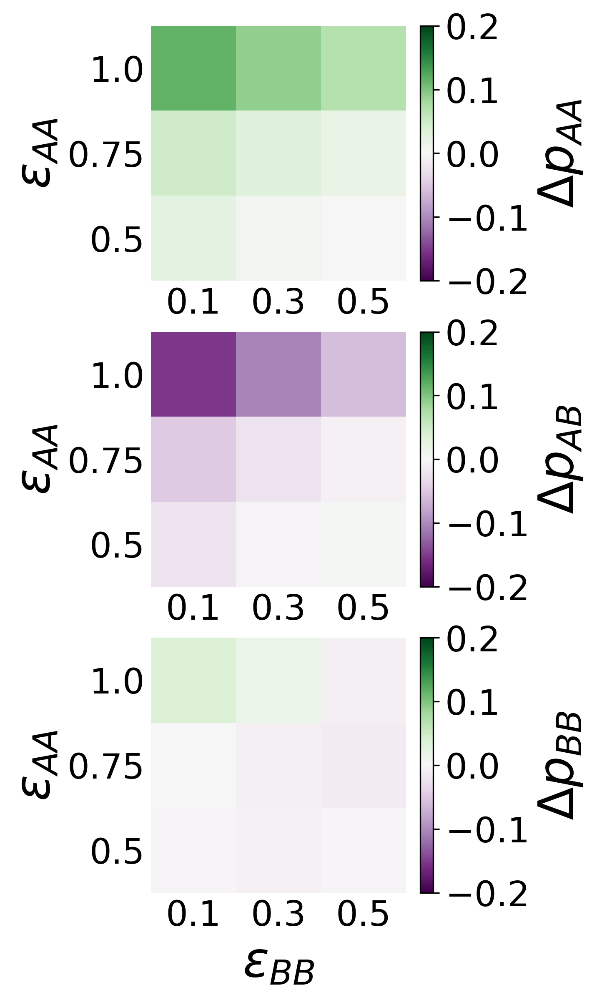

In [65]:

fig, (ax1,ax2,ax3) = plt.subplots(3,1,figsize = (6,9))

for host in [ax1,ax2,ax3]:
    host.tick_params(length=0)
    for s in host.spines:
        host.spines[s].set_visible(False)

    # We want to show integer ticks...
    host.set_xticks(np.arange(0, M))
    host.set_yticks(np.arange(0, N))
    # ... and label them with the respective list entries.
    host.set_xticklabels(vals_epsBB)
    host.set_yticklabels(vals_epsAA)

    host.set_ylabel('$\epsilon_{AA}$')
    host.set_xlabel('$\epsilon_{BB}$')

pixAA=ax1.imshow(probs_AAonly_mat-0.25, interpolation='none', cmap=matplotlib.cm.PRGn,vmin=-0.2,vmax=0.2)
pixAB=ax2.imshow(probs_ABonly_mat-0.5, interpolation='none', cmap=matplotlib.cm.PRGn,vmin=-0.2,vmax=0.2)
pixBB=ax3.imshow(probs_BBonly_mat-0.25, interpolation='none', cmap=matplotlib.cm.PRGn,vmin=-0.2,vmax=0.2)


cb_AA = plt.colorbar(pixAA, ax=ax1, shrink=1., orientation='vertical',location='right',pad=0.025,anchor=(0.5,0.5))
cb_AB = plt.colorbar(pixAB, ax=ax2, shrink=1., orientation='vertical',location='right',pad=0.025,anchor=(0.5,0.5))
cb_BB = plt.colorbar(pixBB, ax=ax3, shrink=1., orientation='vertical',location='right',pad=0.025,anchor=(0.5,0.5))
cb_AA.set_label(r'$\Delta p_{AA}$',size=largesize)
cb_AB.set_label(r'$\Delta p_{AB}$',size=largesize)
cb_BB.set_label(r'$\Delta p_{BB}$',size=largesize)
cb_AA.set_ticks([-0.2,-0.1,0.0,0.1,0.2])
cb_AB.set_ticks([-0.2,-0.1,0.0,0.1,0.2])
cb_BB.set_ticks([-0.2,-0.1,0.0,0.1,0.2])


plt.show()

Both?

In [66]:
# fig, (ax1,ax2,ax3) = plt.subplots(3,2,figsize = (12,9))

# for row in [ax1,ax2,ax3]:
#     for host in row:
#         host.tick_params(length=0)
#         for s in host.spines:
#             host.spines[s].set_visible(False)

#         # We want to show integer ticks...
#         host.set_xticks(np.arange(0, M))
#         host.set_yticks(np.arange(0, N))
#         # ... and label them with the respective list entries.
#         host.set_xticklabels(vals_epsBB)
#         host.set_yticklabels(vals_epsAA)

#         host.set_ylabel('$\epsilon_{AA}$')
#         host.set_xlabel('$\epsilon_{BB}$')

    
# pixAA=ax1[0].imshow(probs_AAonly_mat, interpolation='none', cmap=matplotlib.cm.Reds,vmin=0.2,vmax=0.5)
# pixAB=ax2[0].imshow(probs_ABonly_mat, interpolation='none', cmap=matplotlib.cm.Purples,vmin=0.2,vmax=0.5)
# pixBB=ax3[0].imshow(probs_BBonly_mat, interpolation='none', cmap=matplotlib.cm.Blues,vmin=0.2,vmax=0.5)

# pixdelAA=ax1[1].imshow(probs_AAonly_mat-0.25, interpolation='none', cmap=matplotlib.cm.PRGn,vmin=-0.2,vmax=0.2)
# pixdelAB=ax2[1].imshow(probs_ABonly_mat-0.5, interpolation='none', cmap=matplotlib.cm.PRGn,vmin=-0.2,vmax=0.2)
# pixdelBB=ax3[1].imshow(probs_BBonly_mat-0.25, interpolation='none', cmap=matplotlib.cm.PRGn,vmin=-0.2,vmax=0.2)


# cb_AA = plt.colorbar(pixAA, ax=ax1[0], shrink=1., orientation='vertical',location='right',pad=0.025,anchor=(0.5,0.5))
# cb_AB = plt.colorbar(pixAB, ax=ax2[0], shrink=1., orientation='vertical',location='right',pad=0.025,anchor=(0.5,0.5))
# cb_BB = plt.colorbar(pixBB, ax=ax3[0], shrink=1., orientation='vertical',location='right',pad=0.025,anchor=(0.5,0.5))
# cb_AA.set_label(r'$p_{AA}$',size=largesize)
# cb_AB.set_label(r'$p_{AB}$',size=largesize)
# cb_BB.set_label(r'$p_{BB}$',size=largesize)
# cb_AA.set_ticks([0.2,0.3,0.4,0.5])
# cb_AB.set_ticks([0.2,0.3,0.4,0.5])
# cb_BB.set_ticks([0.2,0.3,0.4,0.5])



# cb_delAA = plt.colorbar(pixdelAA, ax=ax1[1], shrink=1., orientation='vertical',location='right',pad=0.025,anchor=(0.5,0.5))
# cb_delAB = plt.colorbar(pixdelAB, ax=ax2[1], shrink=1., orientation='vertical',location='right',pad=0.025,anchor=(0.5,0.5))
# cb_delBB = plt.colorbar(pixdelBB, ax=ax3[1], shrink=1., orientation='vertical',location='right',pad=0.025,anchor=(0.5,0.5))
# cb_delAA.set_label(r'$\Delta p_{AA}$',size=largesize)
# cb_delAB.set_label(r'$\Delta p_{AB}$',size=largesize)
# cb_delBB.set_label(r'$\Delta p_{BB}$',size=largesize)
# cb_delAA.set_ticks([-0.2,-0.1,0.0,0.1,0.2])
# cb_delAB.set_ticks([-0.2,-0.1,0.0,0.1,0.2])
# cb_delBB.set_ticks([-0.2,-0.1,0.0,0.1,0.2])

# plt.show()

In [67]:
# fig, (ax1,ax2,ax3) = plt.subplots(3,2,figsize = (12,9))

# for row in [ax1,ax2,ax3]:
#     for host in row:
#         host.tick_params(length=0)
#         for s in host.spines:
#             host.spines[s].set_visible(False)

#         # We want to show integer ticks...
#         host.set_xticks(np.arange(0, M))
#         host.set_yticks(np.arange(0, N))
#         # ... and label them with the respective list entries.
#         host.set_xticklabels(vals_epsBB)
#         host.set_yticklabels(vals_epsAA)

#         host.set_ylabel('$\epsilon_{AA}$')
#         host.set_xlabel('$\epsilon_{BB}$')

    
# pixAA=ax1[1].imshow(probs_AAonly_mat, interpolation='none', cmap=matplotlib.cm.Reds,vmin=0.2,vmax=0.5)
# pixAB=ax2[1].imshow(probs_ABonly_mat, interpolation='none', cmap=matplotlib.cm.Purples,vmin=0.2,vmax=0.5)
# pixBB=ax3[1].imshow(probs_BBonly_mat, interpolation='none', cmap=matplotlib.cm.Blues,vmin=0.2,vmax=0.5)

# pixdelAA=ax1[0].imshow(probs_AAonly_mat-0.25, interpolation='none', cmap=matplotlib.cm.PRGn,vmin=-0.2,vmax=0.2)
# pixdelAB=ax2[0].imshow(probs_ABonly_mat-0.5, interpolation='none', cmap=matplotlib.cm.PRGn,vmin=-0.2,vmax=0.2)
# pixdelBB=ax3[0].imshow(probs_BBonly_mat-0.25, interpolation='none', cmap=matplotlib.cm.PRGn,vmin=-0.2,vmax=0.2)


# cb_AA = plt.colorbar(pixAA, ax=ax1[1], shrink=1., orientation='vertical',location='right',pad=0.025,anchor=(0.5,0.5))
# cb_AB = plt.colorbar(pixAB, ax=ax2[1], shrink=1., orientation='vertical',location='right',pad=0.025,anchor=(0.5,0.5))
# cb_BB = plt.colorbar(pixBB, ax=ax3[1], shrink=1., orientation='vertical',location='right',pad=0.025,anchor=(0.5,0.5))
# cb_AA.set_label(r'$p_{AA}$',size=largesize)
# cb_AB.set_label(r'$p_{AB}$',size=largesize)
# cb_BB.set_label(r'$p_{BB}$',size=largesize)
# cb_AA.set_ticks([0.2,0.3,0.4,0.5])
# cb_AB.set_ticks([0.2,0.3,0.4,0.5])
# cb_BB.set_ticks([0.2,0.3,0.4,0.5])



# cb_delAA = plt.colorbar(pixdelAA, ax=ax1[0], shrink=1., orientation='vertical',location='right',pad=0.025,anchor=(0.5,0.5))
# cb_delAB = plt.colorbar(pixdelAB, ax=ax2[0], shrink=1., orientation='vertical',location='right',pad=0.025,anchor=(0.5,0.5))
# cb_delBB = plt.colorbar(pixdelBB, ax=ax3[0], shrink=1., orientation='vertical',location='right',pad=0.025,anchor=(0.5,0.5))
# cb_delAA.set_label(r'$\Delta p_{AA}$',size=largesize)
# cb_delAB.set_label(r'$\Delta p_{AB}$',size=largesize)
# cb_delBB.set_label(r'$\Delta p_{BB}$',size=largesize)
# cb_delAA.set_ticks([-0.2,-0.1,0.0,0.1,0.2])
# cb_delAB.set_ticks([-0.2,-0.1,0.0,0.1,0.2])
# cb_delBB.set_ticks([-0.2,-0.1,0.0,0.1,0.2])

# plt.show()

In [68]:
# print(probs_AAonly_mat-0.25)
# print(probs_ABonly_mat-0.5)
# print(probs_BBonly_mat-0.25)

Seperate axes shared colormap

In [69]:
# fig, (ax1,ax2,ax3) = plt.subplots(1,3,figsize = (36,9))

# for host in [ax1,ax2,ax3]:
#     host.tick_params(length=0)
#     for s in host.spines:
#         host.spines[s].set_visible(False)

#     # We want to show integer ticks...
#     host.set_xticks(np.arange(0, M))
#     host.set_yticks(np.arange(0, N))
#     # ... and label them with the respective list entries.
#     host.set_xticklabels(vals_epsBB)
#     host.set_yticklabels(vals_epsAA)

#     host.set_ylabel('$\epsilon_{AA}$')
#     host.set_xlabel('$\epsilon_{BB}$')

# pixAA=ax1.imshow(probs_AAonly_mat, interpolation='none', cmap=matplotlib.cm.viridis,vmin=0.2,vmax=0.5)
# pixAB=ax2.imshow(probs_ABonly_mat, interpolation='none', cmap=matplotlib.cm.viridis,vmin=0.2,vmax=0.5)
# pixBB=ax3.imshow(probs_BBonly_mat, interpolation='none', cmap=matplotlib.cm.viridis,vmin=0.2,vmax=0.5)


# cb_AA = plt.colorbar(pixAA, ax=ax1, shrink=0.75, orientation='horizontal',location='bottom',pad=0.15,anchor=(0.5,0.5))
# cb_AB = plt.colorbar(pixAB, ax=ax2, shrink=0.75, orientation='horizontal',location='bottom',pad=0.15,anchor=(0.5,0.5))
# cb_BB = plt.colorbar(pixBB, ax=ax3, shrink=0.75, orientation='horizontal',location='bottom',pad=0.15,anchor=(0.5,0.5))
# cb_AA.set_label(r'$pAA$',size=smallsize)
# cb_AB.set_label(r'$pAB$',size=smallsize)
# cb_BB.set_label(r'$pBB$',size=smallsize)
# cb_AA.set_ticks([0.2,0.3,0.4,0.5])
# cb_AB.set_ticks([0.2,0.3,0.4,0.5])
# cb_BB.set_ticks([0.2,0.3,0.4,0.5])


# plt.show()

Seperate axes, with interpolation.

In [70]:
# fig, (ax1,ax2,ax3) = plt.subplots(1,3,figsize = (36,9))

# for host in [ax1,ax2,ax3]:
#     host.tick_params(length=0)
#     for s in host.spines:
#         host.spines[s].set_visible(False)

#     # We want to show integer ticks...
#     host.set_xticks(np.arange(0, M))
#     host.set_yticks(np.arange(0, N))
#     # ... and label them with the respective list entries.
#     host.set_xticklabels(vals_epsBB)
#     host.set_yticklabels(vals_epsAA)

#     host.set_ylabel('$\epsilon_{AA}$')
#     host.set_xlabel('$\epsilon_{BB}$')

# pixAA=ax1.imshow(probs_AAonly_mat, interpolation='sinc', cmap=matplotlib.cm.Reds,vmin=0.2,vmax=0.4)
# pixAB=ax2.imshow(probs_ABonly_mat, interpolation='sinc', cmap=matplotlib.cm.Purples,vmin=0.3,vmax=0.5)
# pixBB=ax3.imshow(probs_BBonly_mat, interpolation='sinc', cmap=matplotlib.cm.Blues,vmin=0.2,vmax=0.3)


# cb_AA = plt.colorbar(pixAA, ax=ax1, shrink=0.75, orientation='horizontal',location='bottom',pad=0.15,anchor=(0.5,0.5))
# cb_AB = plt.colorbar(pixAB, ax=ax2, shrink=0.75, orientation='horizontal',location='bottom',pad=0.15,anchor=(0.5,0.5))
# cb_BB = plt.colorbar(pixBB, ax=ax3, shrink=0.75, orientation='horizontal',location='bottom',pad=0.15,anchor=(0.5,0.5))
# cb_AA.set_label(r'$pAA$',size=smallsize)
# cb_AB.set_label(r'$pAB$',size=smallsize)
# cb_BB.set_label(r'$pBB$',size=smallsize)
# cb_AA.set_ticks([0.2,0.3,0.4])
# cb_AB.set_ticks([0.3,0.4,0.5])
# cb_BB.set_ticks([0.2,0.25,0.3])


# plt.show()

In [71]:
# fig, (ax1,ax2,ax3) = plt.subplots(1,3,figsize = (36,9))

# for host in [ax1,ax2,ax3]:
#     host.tick_params(length=0)
#     for s in host.spines:
#         host.spines[s].set_visible(False)

#     # We want to show integer ticks...
#     host.set_xticks(np.arange(0, M))
#     host.set_yticks(np.arange(0, N))
#     # ... and label them with the respective list entries.
#     host.set_xticklabels(vals_epsBB)
#     host.set_yticklabels(vals_epsAA)

#     host.set_ylabel('$\epsilon_{AA}$')
#     host.set_xlabel('$\epsilon_{BB}$')

# pixAA=ax1.imshow(probs_AAonly_mat, interpolation='sinc', cmap=matplotlib.cm.viridis,vmin=0.2,vmax=0.5)
# pixAB=ax2.imshow(probs_ABonly_mat, interpolation='sinc', cmap=matplotlib.cm.viridis,vmin=0.2,vmax=0.5)
# pixBB=ax3.imshow(probs_BBonly_mat, interpolation='sinc', cmap=matplotlib.cm.viridis,vmin=0.2,vmax=0.5)


# cb_AA = plt.colorbar(pixAA, ax=ax1, shrink=0.75, orientation='horizontal',location='bottom',pad=0.15,anchor=(0.5,0.5))
# cb_AB = plt.colorbar(pixAB, ax=ax2, shrink=0.75, orientation='horizontal',location='bottom',pad=0.15,anchor=(0.5,0.5))
# cb_BB = plt.colorbar(pixBB, ax=ax3, shrink=0.75, orientation='horizontal',location='bottom',pad=0.15,anchor=(0.5,0.5))
# cb_AA.set_label(r'$pAA$',size=smallsize)
# cb_AB.set_label(r'$pAB$',size=smallsize)
# cb_BB.set_label(r'$pBB$',size=smallsize)
# cb_AA.set_ticks([0.2,0.3,0.4,0.5])
# cb_AB.set_ticks([0.2,0.3,0.4,0.5])
# cb_BB.set_ticks([0.2,0.3,0.4,0.5])


# plt.show()

Scatter plot with trends in $\Delta \varepsilon$ for stiff and flexible.

In [72]:
# #sim index:
# #    0         1          2         3         4            5          6          7                 8           9      10     11       12    13          14
# #[extent_avg,order_avg,tstep_avg,probs_avg,blockAtotal,blockBtotal,chaindist,BlockA_PDI_avg,BlockB_PDI_avg,PDI_avg,pA_avg,pB_avg,seqs_all,Xn_avg,TotalBlock_PDI_avg]
# # probs_avg index
# #[pAA_avg,pAB_avg,pBB_avg]

# fig, host = plt.subplots(1,2,figsize = (20,8))
# host[0].text(0.75,0.9,r'$l_p = 16.5$',transform=host[0].transAxes, bbox = dict(boxstyle='square',facecolor='white'))
# host[1].text(0.1,0.9,r'$l_p = 3.5$',transform=host[1].transAxes, bbox = dict(boxstyle='square',facecolor='white'))
# leg4=host[1].scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = 'x',s=150)
# leg5=host[1].scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = '+',s=150)
# leg6=host[1].scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = 'o',s=75)
# host[0].plot([-1.5,1.5],[0,0],':k')
# host[1].plot([-1.5,1.5],[0,0],':k')
# leg1=host[0].bar([-10,-9],[-10,-9],color='r')
# leg2=host[0].bar([-10,-9],[-10,-9],color='purple')
# leg3=host[0].bar([-10,-9],[-10,-9],color='b')

# host[0].set_xlim(-0.05, 1.05)
# host[1].set_xlim(-0.05, 1.05)
# host[0].set_ylim(-0.2, 0.2)
# host[1].set_ylim(-0.2, 0.2)
# host[0].set_yticks([-0.2,-0.1,0.0,0.1,0.2])
# host[1].set_yticks([-0.2,-0.1,0.0,0.1,0.2])
# host[0].set_xlabel("$\Delta \epsilon$")
# host[1].set_xlabel("$\Delta \epsilon$")
# host[0].set_ylabel("Deviation From Random (Probability)")


# for i in range(len(delta_eps)):
#     host[0].scatter(delta_eps[i],sims[i][3][0][-1]-0.25,color='r',marker=mrkrs[i],s=mrkrsizes[i])
#     host[0].scatter(delta_eps[i],sims[i][3][1][-1]-0.5,color='purple',marker=mrkrs[i],s=mrkrsizes[i])
#     host[0].scatter(delta_eps[i],sims[i][3][2][-1]-0.25,color='blue',marker=mrkrs[i],s=mrkrsizes[i])
#     host[1].scatter(delta_eps[i],flexible_sims[i][3][0][-1]-0.25,color='r',marker=mrkrs[i],s=mrkrsizes[i])
#     host[1].scatter(delta_eps[i],flexible_sims[i][3][1][-1]-0.5,color='purple',marker=mrkrs[i],s=mrkrsizes[i])
#     host[1].scatter(delta_eps[i],flexible_sims[i][3][2][-1]-0.25,color='b',marker=mrkrs[i],s=mrkrsizes[i])

# pie_labels=['$p_{AA}$','$p_{AB}$','$p_{BB}$']
# host[0].legend([leg1,leg2,leg3],pie_labels,loc='upper left', ncol=1)    
# host[1].legend([leg4,leg5,leg6],(r'$\epsilon_{BB} = 0.1 k_{B}T$',r'$\epsilon_{BB} = 0.3 k_{B}T$',r'$\epsilon_{BB} = 0.5 k_{B}T$'),loc='lower left', ncol = 3, bbox_to_anchor=(-0.75,1.02));

Scatter plot with trends in $\Delta \varepsilon$ for flexible only.

In [73]:
# #sim index:
# #    0         1          2         3         4            5          6          7                 8           9      10     11       12    13          14
# #[extent_avg,order_avg,tstep_avg,probs_avg,blockAtotal,blockBtotal,chaindist,BlockA_PDI_avg,BlockB_PDI_avg,PDI_avg,pA_avg,pB_avg,seqs_all,Xn_avg,TotalBlock_PDI_avg]
# # probs_avg index
# #[pAA_avg,pAB_avg,pBB_avg]

# fig, host = plt.subplots(1,1,figsize = (10,8))
# leg1=host.bar([-10,-9],[-10,-9],color='r')
# leg2=host.bar([-10,-9],[-10,-9],color='purple')
# leg3=host.bar([-10,-9],[-10,-9],color='b')
# leg4=host.scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = 'x',s=150)
# leg5=host.scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = '+',s=150)
# leg6=host.scatter([-1.,-1.],[-1.,-1.], color = 'k', marker = 'o',s=75)
# host.plot([-1.5,1.5],[0,0],':k')


# host.set_xlim(-0.05, 1.05)
# host.set_ylim(-0.25, 0.25)
# host.set_yticks([-0.2,-0.1,0.0,0.1,0.2])
# host.set_xlabel("$\Delta \epsilon$")
# host.set_ylabel("Deviation From Random (Probability)")


# for i in range(len(delta_eps)):
#     host.scatter(delta_eps[i],flexible_sims[i][3][0][-1]-0.25,color='r',marker=mrkrs[i],s=mrkrsizes[i])
#     host.scatter(delta_eps[i],flexible_sims[i][3][1][-1]-0.5,color='purple',marker=mrkrs[i],s=mrkrsizes[i])
#     host.scatter(delta_eps[i],flexible_sims[i][3][2][-1]-0.25,color='b',marker=mrkrs[i],s=mrkrsizes[i])

# host.legend([leg1,leg2,leg3,leg4,leg5,leg6],('$p_{AA}$','$p_{AB}$','$p_{BB}$',r'$\epsilon_{BB} = 0.1 k_{B}T$',r'$\epsilon_{BB} = 0.3 k_{B}T$',r'$\epsilon_{BB} = 0.5 k_{B}T$'),loc='upper left', ncol=2);
# plt.show()

## Kinetics Figures for SI

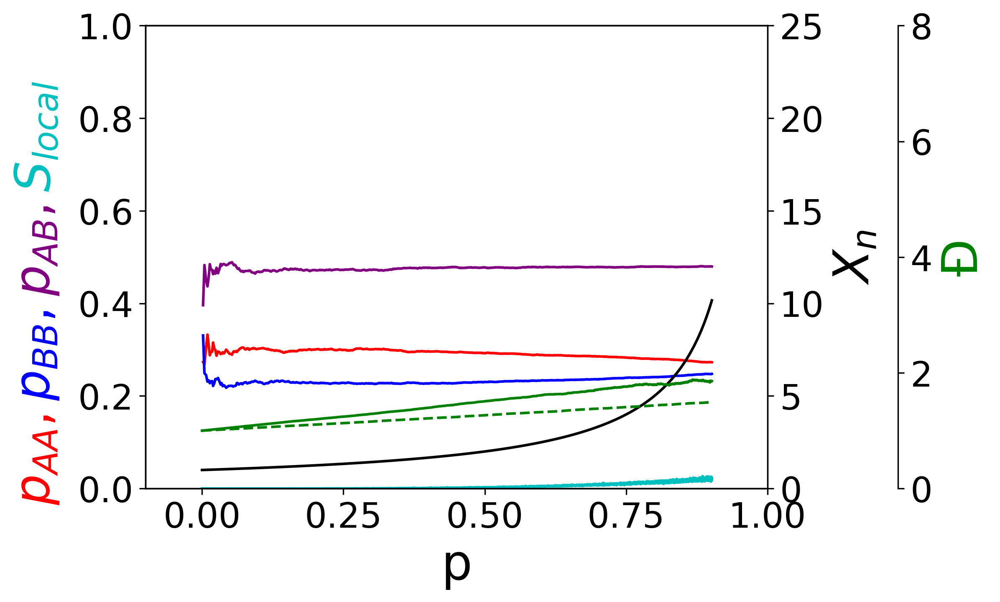

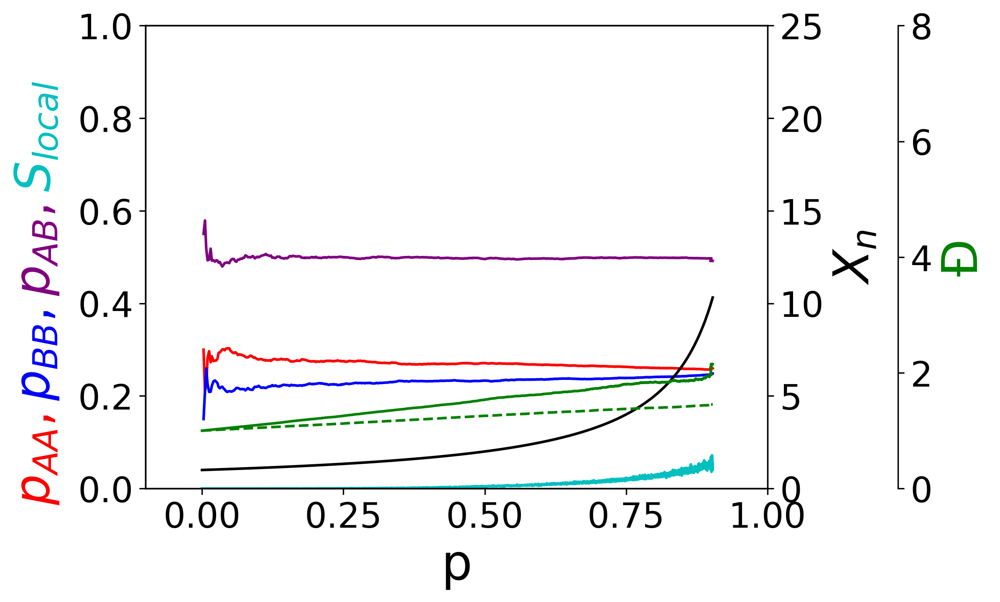

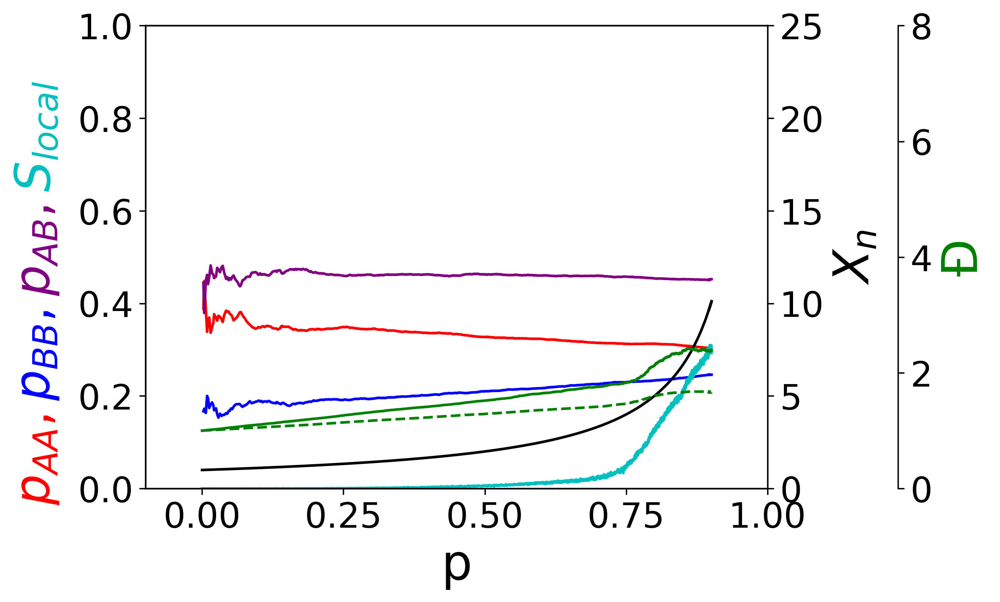

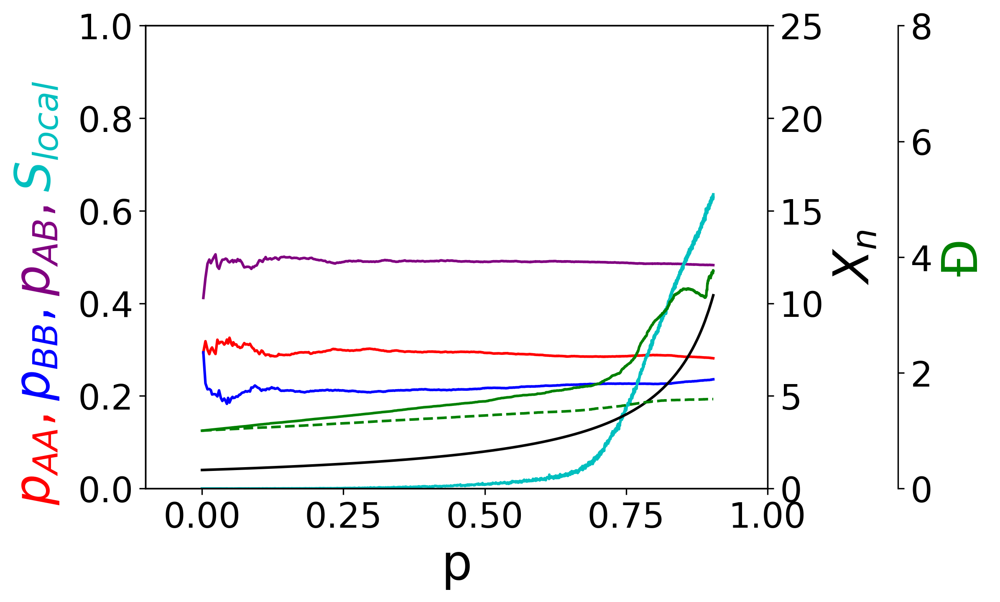

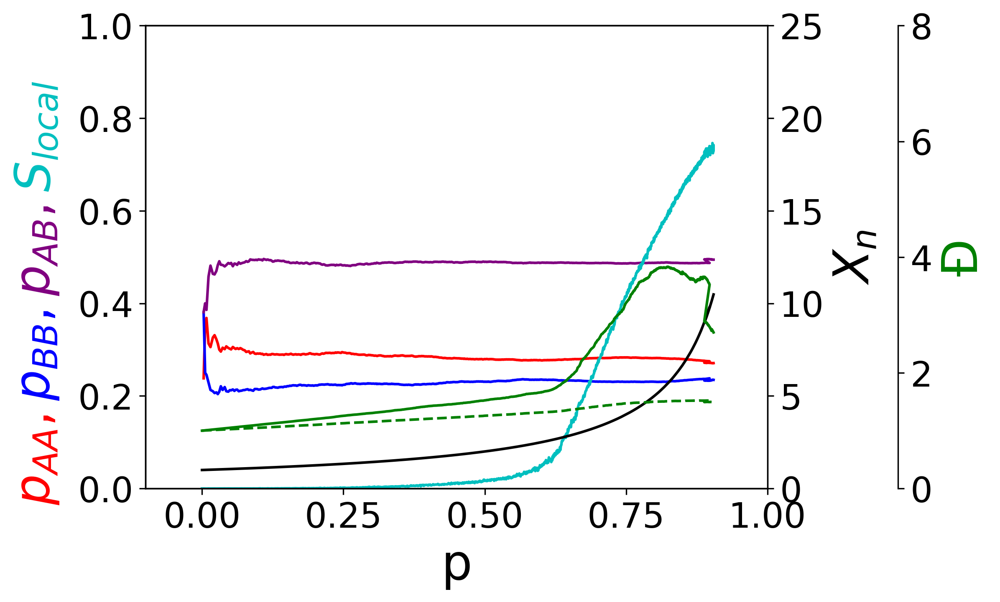

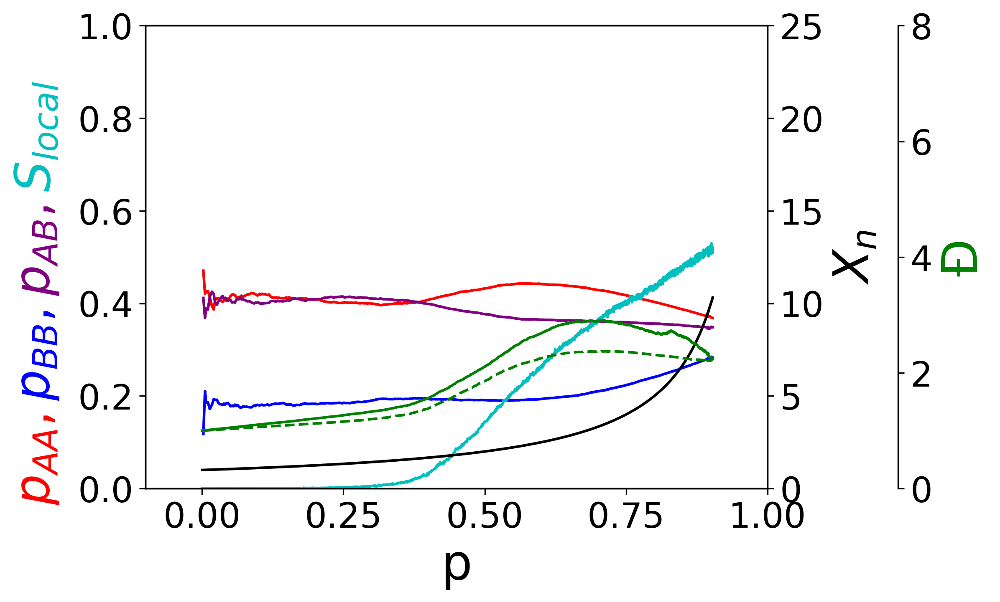

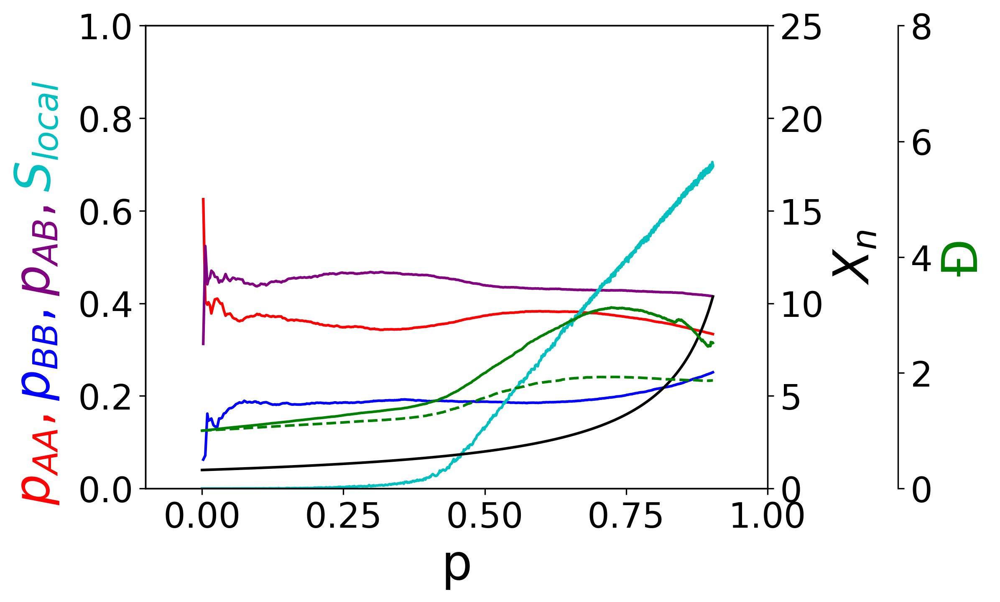

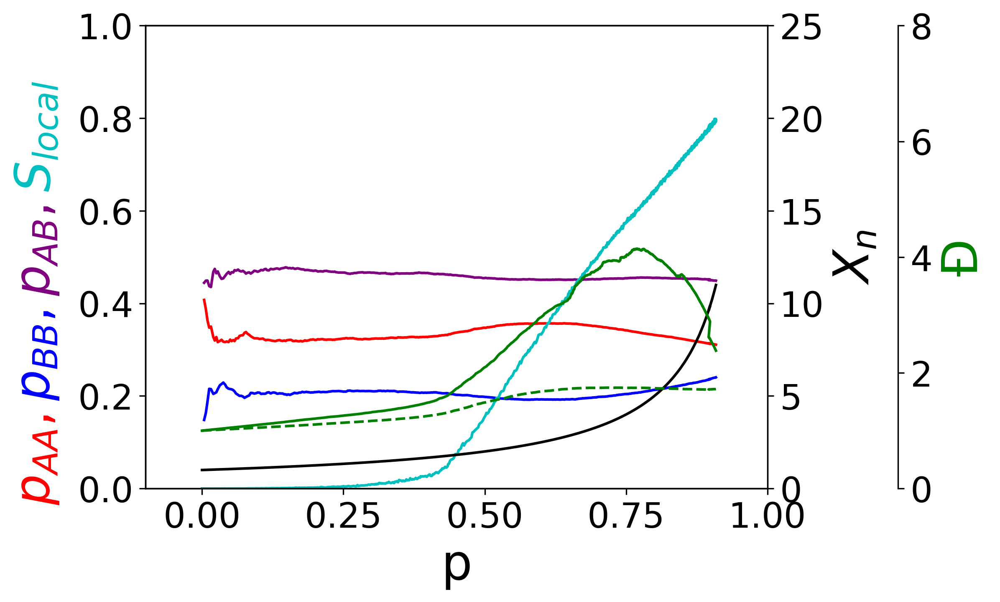

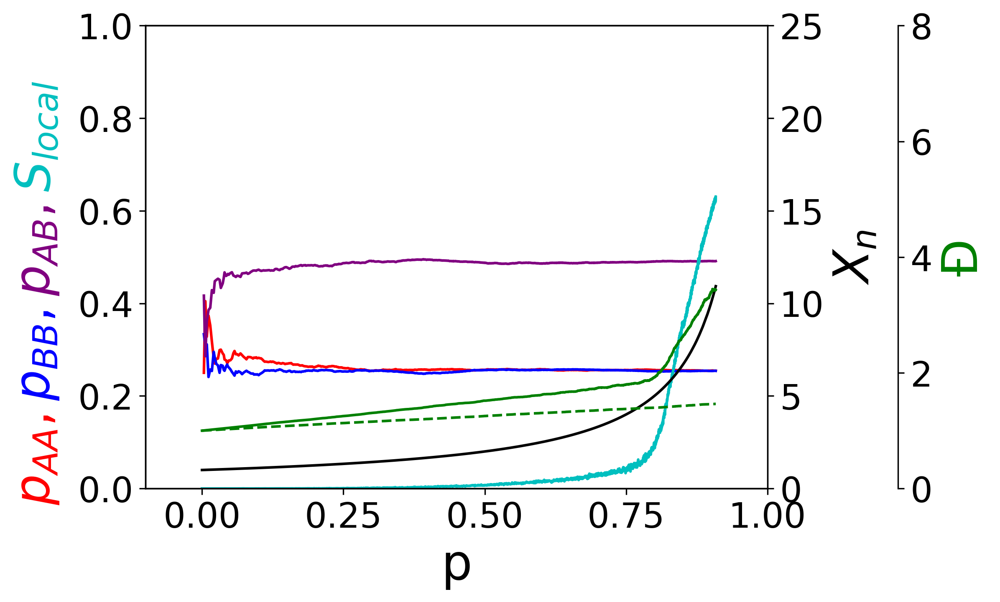

In [74]:
files = sorted(glob.glob('/Users/labuser/Documents/Ryan/210701_plots/*Stiff*'))
#files = sorted(glob.glob('/Users/labuser/Documents/Ryan/210701_plots/*Flex*'))

for i, file in enumerate(files):
    if not i%2:
        simid = int(i/2)
        sim = sims[simid]
        #sim = flexible_sims[simid]


        fig, host = plt.subplots(1,1)
        #fig.suptitle('$\epsilon_{AA} = 0.5 k_BT$, $\epsilon_{AB} = 0.2 k_BT$,  $\epsilon_{BB} = 0.1 k_BT$',fontsize=20)

        par1 = host.twinx()
        par2 = host.twinx()


        host.set_xlim(-0.1, 1)
        host.set_ylim(0, 1)
        par1.set_ylim(0, 25)
        par2.set_ylim(0, 8)

        host.set_xlabel("p")
        par1.set_ylabel(r"$X_n$")
        par2.set_ylabel(u'\u0110')



        # y-axis label
        ybox1 = TextArea("$p_{AA}$,", textprops=dict(color="r", size=largesize ,rotation='vertical',ha='left',va='bottom'))
        ybox2 = TextArea("$p_{BB}$,", textprops=dict(color="b", size=largesize,rotation='vertical',ha='left',va='bottom'))
        ybox3 = TextArea("$p_{AB},$", textprops=dict(color="purple", size=largesize,rotation='vertical',ha='left',va='bottom'))
        #ybox4 = TextArea("OligoRxn", textprops=dict(color="orange", size=15,rotation='vertical',ha='left',va='bottom'))
        ybox5 = TextArea("$S_{local}$", textprops=dict(color="c", size=largesize,rotation='vertical',ha='left',va='bottom'))
        ybox = VPacker(children= [ybox5, ybox3, ybox2, ybox1], align="center", pad=0, sep=8)


        anchored_ybox = AnchoredOffsetbox(loc='center', child=ybox, pad=0., frameon=False,bbox_to_anchor=(-0.175, 0.4),bbox_transform=host.transAxes, borderpad=1.)



        #sim index:
        #    0         1          2         3         4            5          6          7                 8           9      10     11       12    13          14
        #[extent_avg,order_avg,tstep_avg,probs_avg,blockAtotal,blockBtotal,chaindist,BlockA_PDI_avg,BlockB_PDI_avg,PDI_avg,pA_avg,pB_avg,seqs_all,Xn_avg,TotalBlock_PDI_avg]
        # probs_avg index
        #[pAA_avg,pAB_avg,pBB_avg]


        p1, = host.plot(sim[0], sim[3][0], label="pAA", color='r')
        p2, = host.plot(sim[0], sim[3][2], label="pBB", color='b')
        p_extra, = host.plot(sim[0], sim[3][1], label="pAB", color = 'purple')
        p_extra3, = host.plot(sim[0], sim[1], label="$S_{local}$", color = 'c')
        p3, = par1.plot(sim[0],sim[13] , label=r"X_n", color='k') 
        p4, = par2.plot(sim[0], sim[9], label=u"\u0110", color='g')
        p5, = par2.plot(sim[0],sim[14], label="Block PDI", color='g', linestyle='dashed')
        lns = [p1, p2, p_extra, p_extra3, p3, p4, p5]







        # right, left, top, bottom
        par2.spines['right'].set_position(('outward', 75))

        host.add_artist(anchored_ybox)
        par1.yaxis.label.set_color(p3.get_color())
        par2.yaxis.label.set_color(p4.get_color())
        #host.legend(handles=lns, loc='best');

        fig.savefig(file,transparent=True,bbox_inches='tight')
        
plt.show()

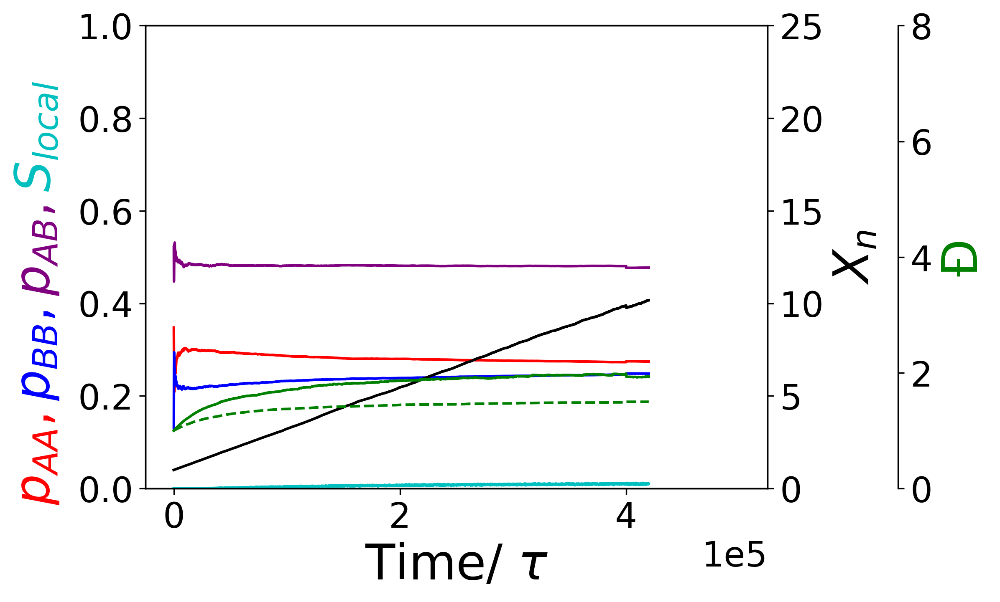

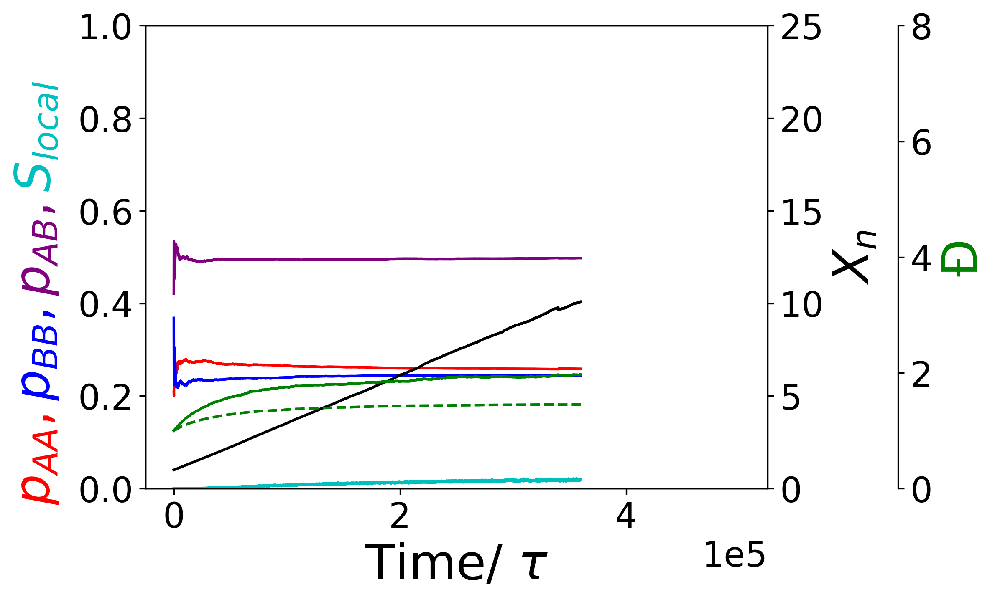

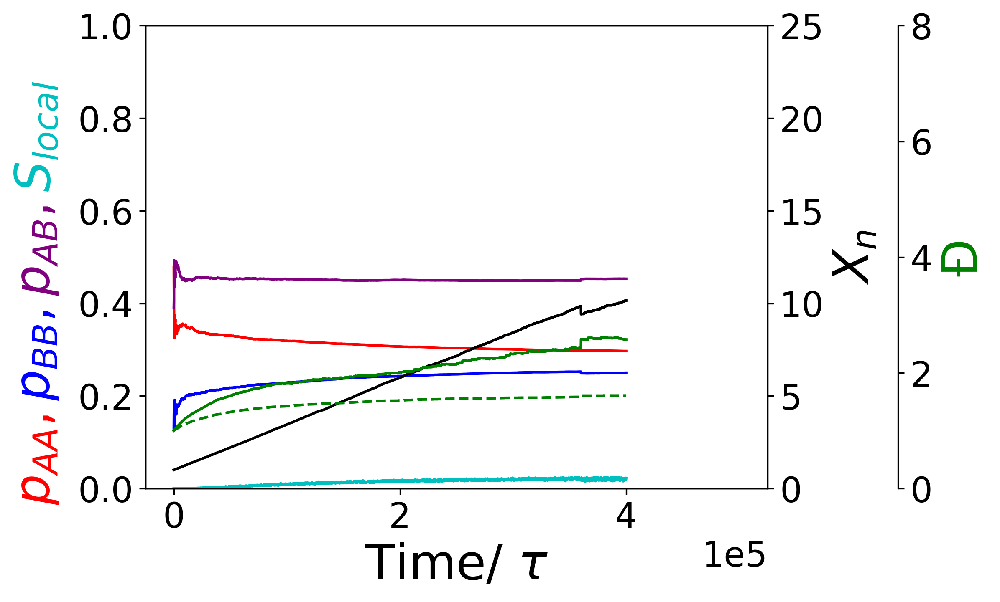

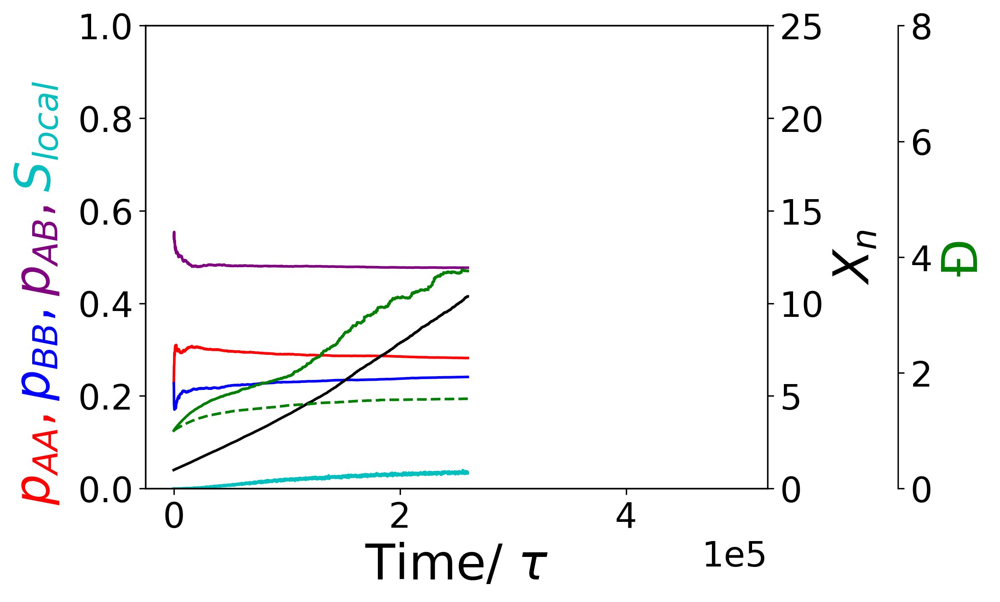

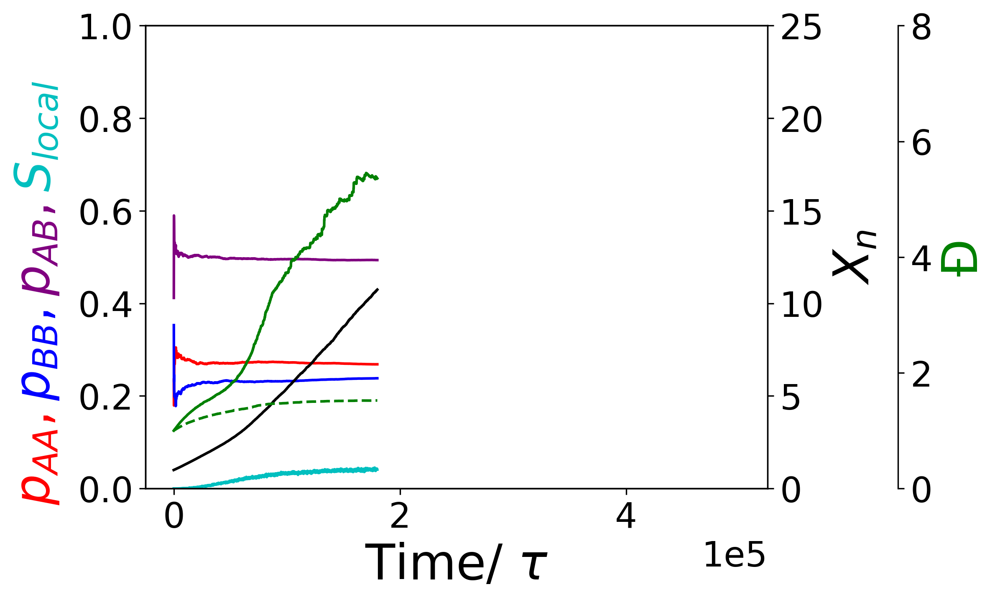

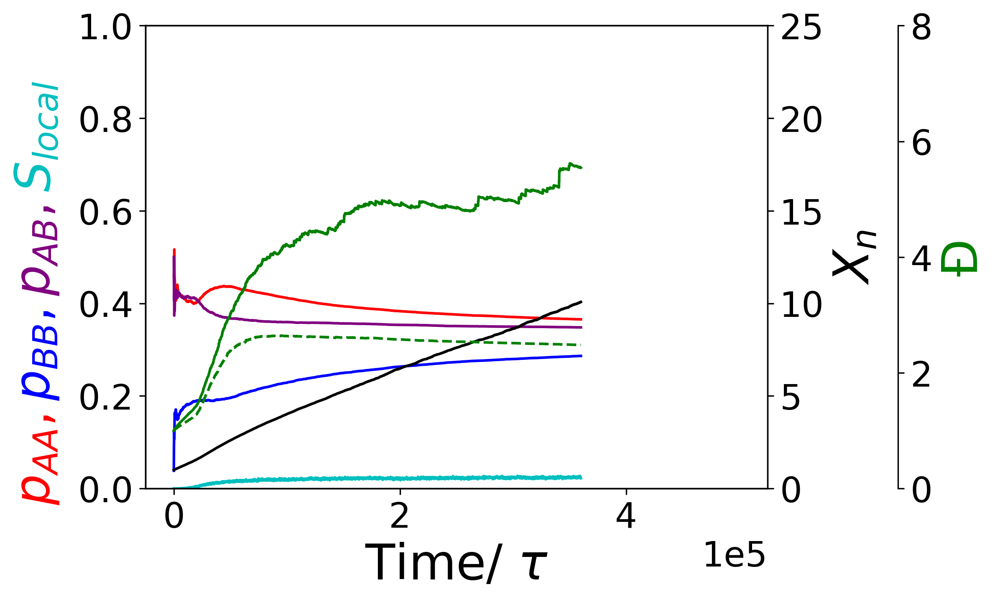

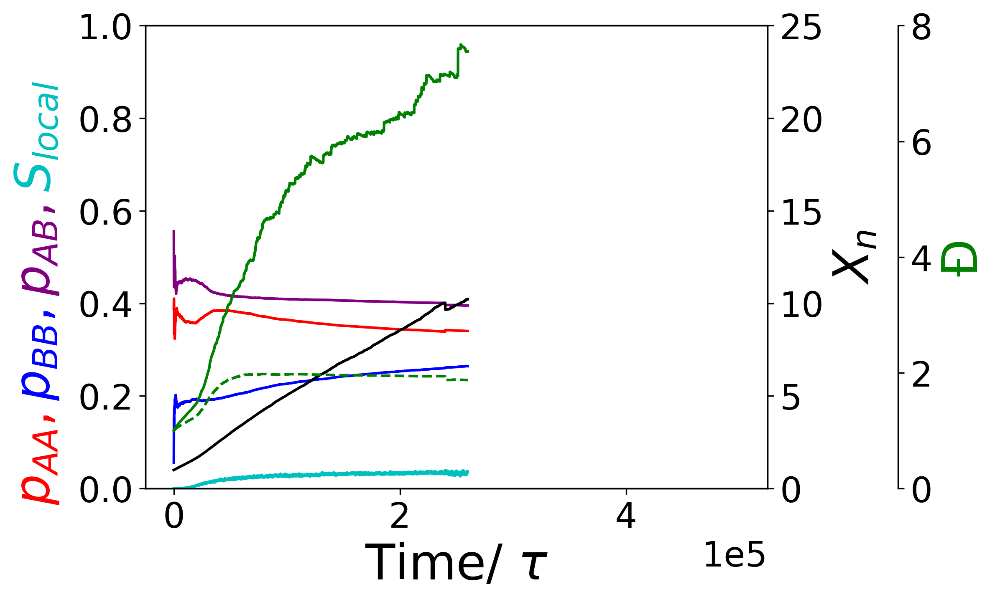

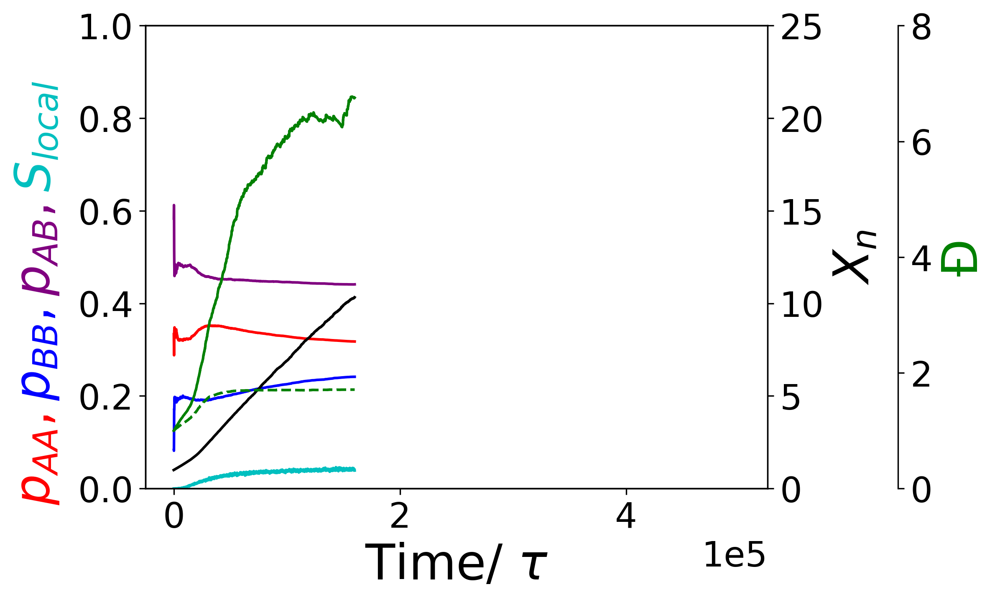

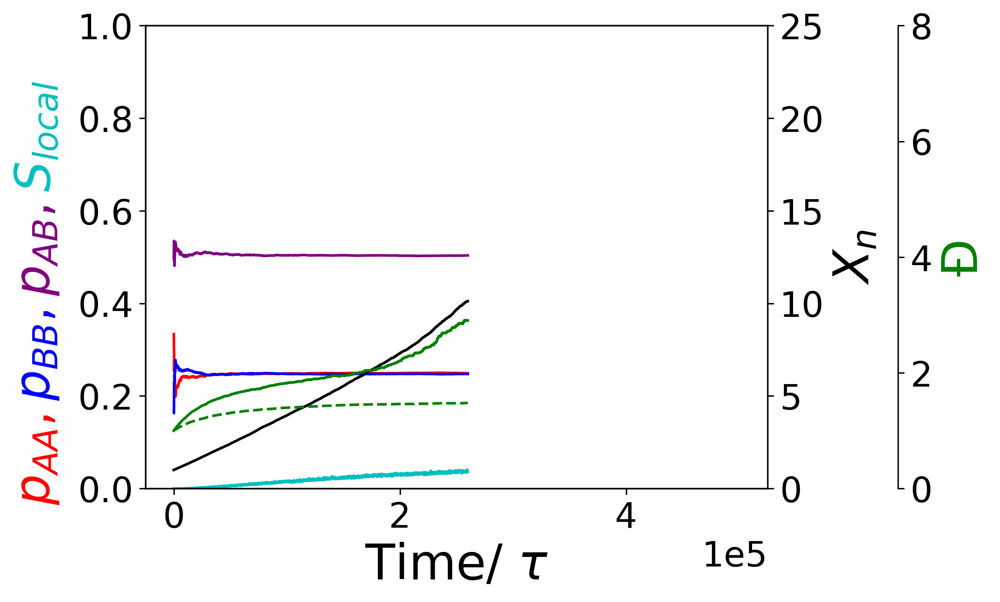

In [75]:
#files = sorted(glob.glob('/Users/labuser/Documents/Ryan/210701_plots/*Stiff*'))
files = sorted(glob.glob('/Users/labuser/Documents/Ryan/210701_plots/*Flex*'))

for i, file in enumerate(files):
    if i%2:
        simid = int((i-1)/2)
        #sim = sims[simid]
        sim = flexible_sims[simid]

        fig, host = plt.subplots(1,1)
        #fig.suptitle('$\epsilon_{AA} = 0.5 k_BT$, $\epsilon_{AB} = 0.2 k_BT$,  $\epsilon_{BB} = 0.1 k_BT$',fontsize=20)

        par1 = host.twinx()
        par2 = host.twinx()


        host.set_xlim(-0.25e5, 5.25e5)
        host.set_ylim(0, 1)
        par1.set_ylim(0, 25)
        par2.set_ylim(0, 8)

        host.set_xlabel(r"Time/ $\tau$")
        par1.set_ylabel(r"$X_n$")
        par2.set_ylabel(u'\u0110')



        # y-axis label
        ybox1 = TextArea("$p_{AA}$,", textprops=dict(color="r", size=largesize ,rotation='vertical',ha='left',va='bottom'))
        ybox2 = TextArea("$p_{BB}$,", textprops=dict(color="b", size=largesize,rotation='vertical',ha='left',va='bottom'))
        ybox3 = TextArea("$p_{AB},$", textprops=dict(color="purple", size=largesize,rotation='vertical',ha='left',va='bottom'))
        #ybox4 = TextArea("OligoRxn", textprops=dict(color="orange", size=15,rotation='vertical',ha='left',va='bottom'))
        ybox5 = TextArea("$S_{local}$", textprops=dict(color="c", size=largesize,rotation='vertical',ha='left',va='bottom'))
        ybox = VPacker(children= [ybox5, ybox3, ybox2, ybox1], align="center", pad=0, sep=8)


        anchored_ybox = AnchoredOffsetbox(loc='center', child=ybox, pad=0., frameon=False,
                                              bbox_to_anchor=(-0.175, 0.4),
                                              bbox_transform=host.transAxes, borderpad=1.)


        #sim index:
        #    0         1          2         3         4            5          6          7                 8           9      10     11       12    13          14
        #[extent_avg,order_avg,tstep_avg,probs_avg,blockAtotal,blockBtotal,chaindist,BlockA_PDI_avg,BlockB_PDI_avg,PDI_avg,pA_avg,pB_avg,seqs_all,Xn_avg,TotalBlock_PDI_avg]
        # probs_avg index
        #[pAA_avg,pAB_avg,pBB_avg]


        p1, = host.plot(0.001*sim[2], sim[3][0], label="pAA", color='r')
        p2, = host.plot(0.001*sim[2], sim[3][2], label="pBB", color='b')
        p_extra, = host.plot(0.001*sim[2], sim[3][1], label="pAB", color = 'purple')
        p_extra3, = host.plot(0.001*sim[2], sim[1], label="$S_{local}$", color = 'c')
        p3, = par1.plot(0.001*sim[2],sim[13] , label="DOP", color='k') 
        p4, = par2.plot(0.001*sim[2], sim[9], label="PDI", color='g')
        p5, = par2.plot(0.001*sim[2],sim[14], label="Block PDI", color='g', linestyle='dashed')
        lns = [p1, p2, p_extra, p_extra3, p3, p4, p5]





        host.ticklabel_format(style='sci',scilimits=(3,0))

        # right, left, top, bottom
        par2.spines['right'].set_position(('outward', 75))

        host.add_artist(anchored_ybox)
        par1.yaxis.label.set_color(p3.get_color())
        par2.yaxis.label.set_color(p4.get_color())
        #host.legend(handles=lns, loc='best');


        fig.savefig(file,transparent=True,bbox_inches='tight')
        
plt.show()

## Reaction Barrier Figure for SI

51961
24.99180554402501
12.006760507895773


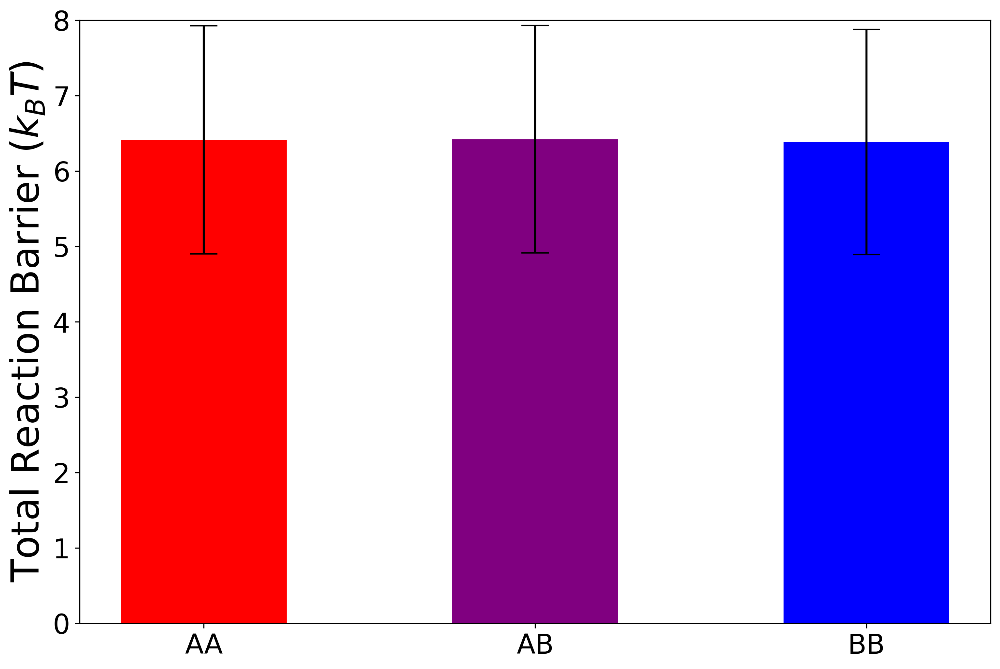

In [76]:
import json
barrier_path = './barrier_calc/*.json'
barfiles = sorted(glob.glob(barrier_path))
barAA_list = []
barAB_list = []
barBB_list = []
cos_list = []

for cntr, barfile in enumerate(barfiles):
    with open(barfile,'r') as f:
        record = json.load(f)
    barAA_list.append(np.array([i['energy']['total'] for i in record if i['type']==[2,2]]))
    barAB_list.append(np.array([i['energy']['total'] for i in record if i['type']==[2,3] or i['type']==[3,2]]))
    barBB_list.append(np.array([i['energy']['total'] for i in record if i['type']==[3,3]]))
    cos_list.append(np.array([i['cos'] for i in record]))


angles = [np.arccos(val) for i in cos_list for val in i]
barAA=[val/3 for i in barAA_list for val in i]
barAB=[val/3 for i in barAB_list for val in i]  
barBB=[val/3 for i in barBB_list for val in i]  

    
# barAA_avg = np.array([np.mean(i) for i in barAA_list])
# barAA_std = np.array([np.std(i) for i in barAA_list])
# barAB_avg = np.array([np.mean(i) for i in barAB_list])
# barAB_std = np.array([np.std(i) for i in barAB_list])
# barBB_avg = np.array([np.mean(i) for i in barBB_list])
# barBB_std = np.array([np.std(i) for i in barBB_list])

barAA_avg = np.mean(np.array(barAA))
barAA_std = np.std(np.array(barAA))
barAB_avg = np.mean(np.array(barAB))
barAB_std = np.std(np.array(barAB))
barBB_avg = np.mean(np.array(barBB))
barBB_std = np.std(np.array(barBB))

angles_avg = np.mean(np.array(angles))
angles_std = np.std(np.array(angles))


matplotlib.rcParams.update({'errorbar.capsize': 10})
fig, ax = plt.subplots(1,1,figsize= (12,8))

ax.bar(0,barAA_avg,width=0.5,yerr=barAA_std,color='r')
ax.bar(1,barAB_avg,width=0.5, yerr=barAB_std,color='purple')
ax.bar(2,barBB_avg,width=0.5,yerr=barBB_std, color='b')
#ax.legend([leg1,leg2,leg3],pie_labels,loc='upper center', ncol=3)
ax.set_xticks([0,1,2])
ax.set_xticklabels(['AA','AB','BB'])
ax.set_ylabel('Total Reaction Barrier ($k_{B}T$)')
ax.set_ylim((0,8));

print(len(barAA)+len(barAB)+len(barBB))
print(angles_avg * (180/3.1415926535))
print(angles_std * (180/3.1415926535))

plt.show()

With angular contribution

51961


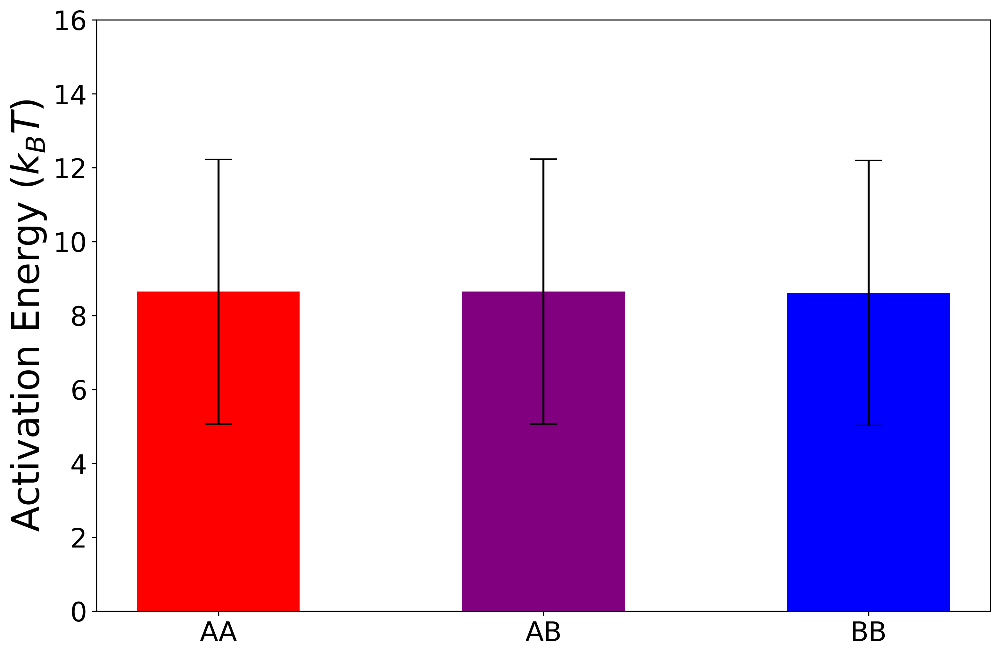

In [77]:
import json
barrier_path = './barrier_calc_v2/*.json'
barfiles = sorted(glob.glob(barrier_path))
barAA_list = []
barAB_list = []
barBB_list = []

for cntr, barfile in enumerate(barfiles):
    with open(barfile,'r') as f:
        record = json.load(f)
    barAA_list.append(np.array([i['energy']['total'] for i in record if i['type']==[2,2]]))
    barAB_list.append(np.array([i['energy']['total'] for i in record if i['type']==[2,3] or i['type']==[3,2]]))
    barBB_list.append(np.array([i['energy']['total'] for i in record if i['type']==[3,3]]))



barAA=[val/3 for i in barAA_list for val in i]
barAB=[val/3 for i in barAB_list for val in i]  
barBB=[val/3 for i in barBB_list for val in i]  

    
# barAA_avg = np.array([np.mean(i) for i in barAA_list])
# barAA_std = np.array([np.std(i) for i in barAA_list])
# barAB_avg = np.array([np.mean(i) for i in barAB_list])
# barAB_std = np.array([np.std(i) for i in barAB_list])
# barBB_avg = np.array([np.mean(i) for i in barBB_list])
# barBB_std = np.array([np.std(i) for i in barBB_list])

barAA_avg = np.mean(np.array(barAA))
barAA_std = np.std(np.array(barAA))
barAB_avg = np.mean(np.array(barAB))
barAB_std = np.std(np.array(barAB))
barBB_avg = np.mean(np.array(barBB))
barBB_std = np.std(np.array(barBB))


matplotlib.rcParams.update({'errorbar.capsize': 10})
fig, ax = plt.subplots(1,1,figsize= (12,8))

ax.bar(0,barAA_avg,width=0.5,yerr=barAA_std,color='r')
ax.bar(1,barAB_avg,width=0.5, yerr=barAB_std,color='purple')
ax.bar(2,barBB_avg,width=0.5,yerr=barBB_std, color='b')
#ax.legend([leg1,leg2,leg3],pie_labels,loc='upper center', ncol=3)
ax.set_xticks([0,1,2])
ax.set_xticklabels(['AA','AB','BB'])
ax.set_ylabel('Activation Energy ($k_{B}T$)')
ax.set_ylim((0,16));

print(len(barAA)+len(barAB)+len(barBB))

plt.show()

## Interior and Exterior Monomer Fractions

Density cutoffs: interior region $\rho \ \geq \ \frac{36 \ {\rm monomers}}{(2.5\sigma)^3}$ and exterior region $\rho \ \geq \ \frac{12 \ {\rm monomers}}{(2.5\sigma)^3}$.

Same density cutoff for stiff and flexible chains. Might be better if stiff chains interior cutoff was 60 monomers.

In [78]:
FA_int_int = []
FB_int_int = []
FA_ext_ext = []
FB_ext_ext = []
FA_int_struc = []
FB_int_struc = []
FA_ext_struc = []
FB_ext_struc = []
FA_struc = []
FB_struc = []
f_agg = []

# structure for sims[i][17] - coding gods forgive me for this data structure and lack of dictionary
#[int_As,int_Bs,mono_int,ext_As,ext_Bs,mono_ext,both_As,both_Bs,mono_both]

for i in range(len(sims)):
    FA_int_int.append(sims[i][17][0]/sims[i][17][2])
    FB_int_int.append(sims[i][17][1]/sims[i][17][2])
    FA_ext_ext.append(sims[i][17][3]/sims[i][17][5])
    FB_ext_ext.append(sims[i][17][4]/sims[i][17][5])
    FA_int_struc.append(sims[i][17][0]/sims[i][17][8])
    FB_int_struc.append(sims[i][17][1]/sims[i][17][8])
    FA_ext_struc.append(sims[i][17][3]/sims[i][17][8])
    FB_ext_struc.append(sims[i][17][4]/sims[i][17][8])
    FA_struc.append(sims[i][17][6]/sims[i][17][8])
    FB_struc.append(sims[i][17][7]/sims[i][17][8])
    f_agg.append(sims[i][17][8]/(3*7200))
    
    
for i in range(len(sims)):
    FA_int_int.append(flexible_sims[i][17][0]/flexible_sims[i][17][2])
    FB_int_int.append(flexible_sims[i][17][1]/flexible_sims[i][17][2])
    FA_ext_ext.append(flexible_sims[i][17][3]/flexible_sims[i][17][5])
    FB_ext_ext.append(flexible_sims[i][17][4]/flexible_sims[i][17][5])
    FA_int_struc.append(flexible_sims[i][17][0]/flexible_sims[i][17][8])
    FB_int_struc.append(flexible_sims[i][17][1]/flexible_sims[i][17][8])
    FA_ext_struc.append(flexible_sims[i][17][3]/flexible_sims[i][17][8])
    FB_ext_struc.append(flexible_sims[i][17][4]/flexible_sims[i][17][8])
    FA_struc.append(flexible_sims[i][17][6]/flexible_sims[i][17][8])
    FB_struc.append(flexible_sims[i][17][7]/flexible_sims[i][17][8])
    f_agg.append(flexible_sims[i][17][8]/(3*7200))
    
    


In [79]:
deltaeps_xfit = np.array(delta_eps+delta_eps).reshape(-1,1)
FA_yfit = np.array(FA_int_int)
FA_model = LinearRegression().fit(deltaeps_xfit[:9], FA_yfit[:9])
FA_model2 = LinearRegression().fit(deltaeps_xfit[9:], FA_yfit[9:])
FA_linex = np.linspace(min(deltaeps_xfit),max(deltaeps_xfit),10)
FA_liney = FA_model.intercept_ + FA_model.coef_ * FA_linex
FA_liney2 = FA_model2.intercept_ + FA_model2.coef_ * FA_linex
FB_liney = 1-FA_liney
FB_liney2 = 1-FA_liney2

In [80]:
# # Plotting
# fig, host = plt.subplots(1,2,figsize = (24,8))
# #fig, host = plt.subplots(1,2,figsize = (20,8))
# host[0].set_xlabel('$\Delta \epsilon$')
# host[1].set_xlabel('$\Delta \epsilon$')
# host[0].set_ylabel('Species Fraction')
# host[0].set_xlim((-0.01,1.0))
# host[1].set_xlim((-0.01,1.0))
# host[0].set_ylim((-0.01,1.0))
# host[1].set_ylim((-0.01,1.0))

# leg1=ax4.bar([-10,-9],[-10,-9],color='r')
# leg2=ax4.bar([-10,-9],[-10,-9],color='b')
# leg3 = host[1].scatter([-1,-1],[-1,-1],marker='^',color='k',s=75)
# leg4 = host[1].scatter([-1,-1],[-1,-1],marker='v',color='k',s=75)
# host[0].legend([leg1,leg2],('A','B'),loc='upper left', prop={'size':16});
# host[1].legend([leg3,leg4],(r'$l_p = 16.5$',r'$l_p = 3.5$'),loc='upper left', prop={'size':16});
# #host[1].legend([leg3,leg4],(r'$l_p = 16.5$',r'$l_p = 3.5$'),loc='lower left', ncol = 3, bbox_to_anchor=(-0.25,1.05), prop={'size':16});
# host[0].set_title('Dense Phase - Interior')
# host[1].set_title('Dense Phase - Exterior')



# for i in range(len(sims)):
#     if i not in [0,1]:
#         host[0].scatter(delta_eps[i],FA_int_int[i],c='r',marker='^',s=75)
#         host[0].scatter(delta_eps[i],FB_int_int[i],c='b',marker='^',s=75)
#         host[0].scatter(delta_eps[i],FA_int_int[i+len(sims)],c='r',marker='v',s=75)
#         host[0].scatter(delta_eps[i],FB_int_int[i+len(sims)],c='b',marker='v',s=75)
#         host[1].scatter(delta_eps[i],FA_ext_ext[i],c='r',marker='^',s=75)
#         host[1].scatter(delta_eps[i],FB_ext_ext[i],c='b',marker='^',s=75)
#         host[1].scatter(delta_eps[i],FA_ext_ext[i+len(sims)],c='r',marker='v',s=75)
#         host[1].scatter(delta_eps[i],FB_ext_ext[i+len(sims)],c='b',marker='v',s=75)
    
# plt.show()

In [81]:
# # Plotting
# fig, host = plt.subplots(1,2,figsize = (24,8))
# #fig, host = plt.subplots(1,2,figsize = (20,8))
# host[0].set_xlabel('$\Delta \epsilon$')
# host[1].set_xlabel('$\Delta \epsilon$')
# host[0].set_ylabel('Species Fraction')
# host[0].set_xlim((-0.01,1.0))
# host[1].set_xlim((-0.01,1.0))
# host[0].set_ylim((-0.01,1.0))
# host[1].set_ylim((-0.01,1.0))

# leg1=ax4.bar([-10,-9],[-10,-9],color='r')
# leg2=ax4.bar([-10,-9],[-10,-9],color='b')
# leg3 = host[1].scatter([-1,-1],[-1,-1],marker='^',color='k',s=75)
# leg4 = host[1].scatter([-1,-1],[-1,-1],marker='v',color='k',s=75)
# host[0].legend([leg1,leg2],('A','B'),loc='upper left', prop={'size':16});
# host[1].legend([leg3,leg4],(r'$l_p = 16.5$',r'$l_p = 3.5$'),loc='upper left', prop={'size':16});
# #host[1].legend([leg3,leg4],(r'$l_p = 16.5$',r'$l_p = 3.5$'),loc='lower left', ncol = 3, bbox_to_anchor=(-0.25,1.05), prop={'size':16});
# host[0].set_title('Dense Phase - Interior')
# host[1].set_title('Dense Phase - Exterior')

# host[0].plot(FA_linex,FA_liney,'--r')
# host[0].plot(FA_linex,FA_liney2,':r')
# host[0].plot(FA_linex,FB_liney,'--b')
# host[0].plot(FA_linex,FB_liney2,':b')

# for i in range(len(sims)):
#     if i not in [11,12]:
#         host[0].scatter(delta_eps[i],FA_int_int[i],c='r',marker='^',s=75)
#         host[0].scatter(delta_eps[i],FB_int_int[i],c='b',marker='^',s=75)
#         host[0].scatter(delta_eps[i],FA_int_int[i+len(sims)],c='r',marker='v',s=75)
#         host[0].scatter(delta_eps[i],FB_int_int[i+len(sims)],c='b',marker='v',s=75)
#         host[1].scatter(delta_eps[i],FA_ext_ext[i],c='r',marker='^',s=75)
#         host[1].scatter(delta_eps[i],FB_ext_ext[i],c='b',marker='^',s=75)
#         host[1].scatter(delta_eps[i],FA_ext_ext[i+len(sims)],c='r',marker='v',s=75)
#         host[1].scatter(delta_eps[i],FB_ext_ext[i+len(sims)],c='b',marker='v',s=75)
    
# plt.show()

With $\varepsilon_{\rm AB}$ rather than $\Delta \varepsilon$.

In [82]:
# # Plotting
# fig, host = plt.subplots(1,2,figsize = (24,8))
# #fig, host = plt.subplots(1,2,figsize = (20,8))
# host[0].set_xlabel('$\epsilon_{AB}$')
# host[1].set_xlabel('$\epsilon_{AB}$')
# host[0].set_ylabel('Species Fraction')
# host[0].set_xlim((-0.01,1.0))
# host[1].set_xlim((-0.01,1.0))
# host[0].set_ylim((-0.01,1.0))
# host[1].set_ylim((-0.01,1.0))

# leg1=ax4.bar([-10,-9],[-10,-9],color='r')
# leg2=ax4.bar([-10,-9],[-10,-9],color='b')
# leg3 = host[1].scatter([-1,-1],[-1,-1],marker='^',color='k',s=75)
# leg4 = host[1].scatter([-1,-1],[-1,-1],marker='v',color='k',s=75)
# host[0].legend([leg1,leg2],('A','B'),loc='upper left', prop={'size':16});
# host[1].legend([leg3,leg4],(r'$l_p = 16.5$',r'$l_p = 3.5$'),loc='upper left', prop={'size':16});
# #host[1].legend([leg3,leg4],(r'$l_p = 16.5$',r'$l_p = 3.5$'),loc='lower left', ncol = 3, bbox_to_anchor=(-0.25,1.05), prop={'size':16});
# host[0].set_title('Dense Phase - Interior')
# host[1].set_title('Dense Phase - Exterior')



# for i in range(len(sims)):
#     if i not in [0,1]:
#         host[0].scatter(eps_mix[i],FA_int_int[i],c='r',marker='^',s=75)
#         host[0].scatter(eps_mix[i],FB_int_int[i],c='b',marker='^',s=75)
#         host[0].scatter(eps_mix[i],FA_int_int[i+len(sims)],c='r',marker='v',s=75)
#         host[0].scatter(eps_mix[i],FB_int_int[i+len(sims)],c='b',marker='v',s=75)
#         host[1].scatter(eps_mix[i],FA_ext_ext[i],c='r',marker='^',s=75)
#         host[1].scatter(eps_mix[i],FB_ext_ext[i],c='b',marker='^',s=75)
#         host[1].scatter(eps_mix[i],FA_ext_ext[i+len(sims)],c='r',marker='v',s=75)
#         host[1].scatter(eps_mix[i],FB_ext_ext[i+len(sims)],c='b',marker='v',s=75)
    
# plt.show()

In [83]:
# # Plotting
# fig, host = plt.subplots(1,2,figsize = (24,8))
# #fig, host = plt.subplots(1,2,figsize = (20,8))
# host[0].set_xlabel('$\Delta \epsilon$')
# host[1].set_xlabel('$\Delta \epsilon$')
# host[0].set_ylabel('$F_{A}$')
# host[1].set_ylabel('$F_{A}$')
# host[0].set_xlim((-0.05,1.05))
# host[1].set_xlim((-0.05,1.05))
# host[0].set_ylim((0.25,1.0))
# host[1].set_ylim((0.25,1.0))


# leg3 = host[1].scatter([-1,-1],[-1,-1],marker='.',color='k',s=500)
# leg4 = host[1].scatter([-1,-1],[-1,-1],marker='o',color='k',s=250, linewidth=2.5, facecolor="None")

# host[0].legend([leg3,leg4],('Dense Phase - Interior','Dense Phase - Exterior'),loc='upper left', prop={'size':16});

# host[0].set_title(r'Flexible Chains - $l_p = 3.5$')
# host[1].set_title(r'Stiff Chains - $l_p = 16.5$')



# for i in range(len(sims)):
#     if i not in [0,1]:
#         host[0].scatter(delta_eps[i],FA_int_int[i+len(sims)],color=cmap3(c_id3[epsAA_colorids[i]]),marker='.',s=500)
#         host[1].scatter(delta_eps[i],FA_int_int[i],color=cmap3(c_id3[epsAA_colorids[i]]),marker='.',s=500)
#         host[0].scatter(delta_eps[i],FA_ext_ext[i+len(sims)],color=cmap3(c_id3[epsAA_colorids[i]]),marker='o',s=250, linewidth=2.5, facecolor="None")
#         host[1].scatter(delta_eps[i],FA_ext_ext[i],color=cmap3(c_id3[epsAA_colorids[i]]),marker='o',s=250, linewidth=2.5, facecolor="None")

# plt.colorbar(sm3,ax=host.ravel().tolist(),label=cb_labels[1]);
# plt.show()

In [84]:
# # Plotting
# fig, host = plt.subplots(1,1,figsize = (12,9))
# host.set_xlabel('$\Delta \epsilon$')
# host.set_ylabel('$F_{A}$')
# host.set_xlim((-0.05,1.05))
# host.set_ylim((0.25,1.0))


# leg3 = host.scatter([-1,-1],[-1,-1],marker='.',color='k',s=500)
# leg4 = host.scatter([-1,-1],[-1,-1],marker='o',color='k',s=250, linewidth=2.5, facecolor="None")
# leg5 = host.scatter([-1,-1],[-1,-1],marker='D',color='k',s=100)
# leg6 = host.scatter([-1,-1],[-1,-1],marker='D',color='k',s=175, linewidth=2.5, facecolor="None")

# host.legend([leg3,leg4,leg5,leg6],('Flexible Chains - Interior','Flexible Chains - Exterior','Stiff Chains - Interior','Stiff Chains - Exterior'),loc='upper left', prop={'size':16});

# for i in range(len(sims)):
#     if i not in [0,1]:
#         #Flexible
#         host.scatter(delta_eps[i],FA_int_int[i+len(sims)],color=cmap3(c_id3[epsAA_colorids[i]]),marker='.',s=500)
#         host.scatter(delta_eps[i],FA_ext_ext[i+len(sims)],color=cmap3(c_id3[epsAA_colorids[i]]),marker='o',s=250, linewidth=2.5, facecolor="None")
#         #Stiff
#         host.scatter(delta_eps[i],FA_int_int[i],color=cmap3(c_id3[epsAA_colorids[i]]),marker='D',s=100)
#         host.scatter(delta_eps[i],FA_ext_ext[i],color=cmap3(c_id3[epsAA_colorids[i]]),marker='D',s=175, linewidth=2.5, facecolor="None")

# plt.colorbar(sm3,ax=host,label=cb_labels[1]);
# plt.show()


In [85]:
# # Plotting
# fig, host = plt.subplots(1,1,figsize = (12,9))
# host.set_xlabel('$\Delta \epsilon$')
# host.set_ylabel('$F_{A}$')
# host.set_xlim((-0.05,1.05))
# host.set_ylim((0.25,1.0))


# leg3 = host.scatter([-1,-1],[-1,-1],marker='.',color='k',s=500)
# leg4 = host.scatter([-1,-1],[-1,-1],marker='o',color='k',s=250, linewidth=2.5, facecolor="None")
# leg5 = host.scatter([-1,-1],[-1,-1],marker='D',color='k',s=100)
# leg6 = host.scatter([-1,-1],[-1,-1],marker='D',color='k',s=175, linewidth=2.5, facecolor="None")

# host.legend([leg3,leg4,leg5,leg6],('$l_p = 3.5$ - Interior','$l_p = 3.5$ - Exterior','$l_p = 16.5$ - Interior','$l_p = 16.5$ - Exterior'),loc='upper left', prop={'size':16});

# for i in range(len(sims)):
#     if i not in [0,1]:
#         #Flexible
#         host.scatter(delta_eps[i],FA_int_int[i+len(sims)],color=cmap3(c_id3[epsAA_colorids[i]]),marker='.',s=500)
#         host.scatter(delta_eps[i],FA_ext_ext[i+len(sims)],color=cmap3(c_id3[epsAA_colorids[i]]),marker='o',s=250, linewidth=2.5, facecolor="None")
#         #Stiff
#         host.scatter(delta_eps[i],FA_int_int[i],color=cmap3(c_id3[epsAA_colorids[i]]),marker='D',s=100)
#         host.scatter(delta_eps[i],FA_ext_ext[i],color=cmap3(c_id3[epsAA_colorids[i]]),marker='D',s=175, linewidth=2.5, facecolor="None")

# plt.colorbar(sm3,ax=host,label=cb_labels[1]);
# plt.show()


In [86]:
# fig = plt.figure(figsize=(12,18))
# gs = fig.add_gridspec(ncols=1,nrows=2, height_ratios = [1,1])#, hspace = 0.6, wspace=0.3)
# host = fig.add_subplot(gs[0,0])
# ax2 = fig.add_subplot(gs[1,0])


# host.set_xlabel('$\Delta \epsilon$')
# host.set_ylabel('$F_{A}$')
# host.set_xlim((-0.05,1.05))
# host.set_ylim((0.25,1.0))
# ax2.set_xlabel('$\Sigma \epsilon_{ij}$')
# ax2.set_ylabel(r'$f_{agg}$')
# ax2.set_xlim((0.95,2.55))
# ax2.set_ylim((0.25,1.0))

# leg3 = host.scatter([-1,-1],[-1,-1],marker='.',color='k',s=500)
# leg4 = host.scatter([-1,-1],[-1,-1],marker='o',color='k',s=250, linewidth=2.5, facecolor="None")
# leg5 = host.scatter([-1,-1],[-1,-1],marker='D',color='k',s=100)
# leg6 = host.scatter([-1,-1],[-1,-1],marker='D',color='k',s=175, linewidth=2.5, facecolor="None")
# leg1 = ax2.scatter([-1,-1],[-1,-1],marker='.',color='k',s=500)
# leg2 = ax2.scatter([-1,-1],[-1,-1],marker='D',color='k',s=100)

# host.legend([leg3,leg4,leg5,leg6],('$l_p = 3.5$ - Interior','$l_p = 3.5$ - Exterior','$l_p = 16.5$ - Interior','$l_p = 16.5$ - Exterior'),loc='upper left', prop={'size':16});
# ax2.legend([leg1,leg2],('$l_p = 3.5$','$l_p = 16.5$'),loc='upper left', prop={'size':16});



# for i in range(len(sims)):
#     if i not in [0,1]:
#         #Flexible
#         host.scatter(delta_eps[i],FA_int_int[i+len(sims)],color=cmap3(c_id3[epsAA_colorids[i]]),marker='.',s=500)
#         host.scatter(delta_eps[i],FA_ext_ext[i+len(sims)],color=cmap3(c_id3[epsAA_colorids[i]]),marker='o',s=250, linewidth=2.5, facecolor="None")
#         ax2.scatter(eps_sum2[i],f_agg[i+len(sims)],color=cmap3(c_id3[epsAA_colorids[i]]),marker='.',s=500)
#         #Stiff
#         host.scatter(delta_eps[i],FA_int_int[i],color=cmap3(c_id3[epsAA_colorids[i]]),marker='D',s=100)
#         host.scatter(delta_eps[i],FA_ext_ext[i],color=cmap3(c_id3[epsAA_colorids[i]]),marker='D',s=175, linewidth=2.5, facecolor="None")
#         ax2.scatter(eps_sum2[i],f_agg[i],color=cmap3(c_id3[epsAA_colorids[i]]),marker='D',s=100)


        
        
# plt.colorbar(sm3,ax=host,label=cb_labels[1]);
# plt.colorbar(sm3,ax=ax2,label=cb_labels[1]);




# plt.show()

In [87]:
# print(f_agg)
# for i in range(len(sims)):
#    print(flexible_sims[i][17][-1])
#    print(sims[i][17][-1])

In [88]:
# fig = plt.figure(figsize=(12,18))
# gs = fig.add_gridspec(ncols=1,nrows=2, height_ratios = [1,1])#, hspace = 0.6, wspace=0.3)
# host = fig.add_subplot(gs[0,0])
# ax2 = fig.add_subplot(gs[1,0])


# host.set_xlabel('$\Delta \epsilon$')
# host.set_ylabel('$F_{A}$')
# host.set_xlim((-0.05,1.05))
# host.set_ylim((0.25,1.0))
# ax2.set_xlabel('$\Delta \epsilon$')
# ax2.set_ylabel(r'$f_{agg}$')
# ax2.set_xlim((-0.05,1.05))
# ax2.set_ylim((0.25,1.0))

# leg3 = host.scatter([-1,-1],[-1,-1],marker='.',color='k',s=500)
# leg4 = host.scatter([-1,-1],[-1,-1],marker='o',color='k',s=250, linewidth=2.5, facecolor="None")
# leg5 = host.scatter([-1,-1],[-1,-1],marker='D',color='k',s=100)
# leg6 = host.scatter([-1,-1],[-1,-1],marker='D',color='k',s=175, linewidth=2.5, facecolor="None")
# leg1 = ax2.scatter([-1,-1],[-1,-1],marker='.',color='k',s=500)
# leg2 = ax2.scatter([-1,-1],[-1,-1],marker='D',color='k',s=100)

# host.legend([leg3,leg4,leg5,leg6],('$l_p = 3.5$ - Interior','$l_p = 3.5$ - Exterior','$l_p = 16.5$ - Interior','$l_p = 16.5$ - Exterior'),loc='upper left', prop={'size':16});
# ax2.legend([leg1,leg2],('$l_p = 3.5$','$l_p = 16.5$'),loc='lower left', prop={'size':16});



# for i in range(len(sims)):
#     if i not in [0,1]:
#         #Flexible
#         host.scatter(delta_eps[i],FA_int_int[i+len(sims)],color=cmap3(c_id3[epsAA_colorids[i]]),marker='.',s=500)
#         host.scatter(delta_eps[i],FA_ext_ext[i+len(sims)],color=cmap3(c_id3[epsAA_colorids[i]]),marker='o',s=250, linewidth=2.5, facecolor="None")
#         ax2.scatter(delta_eps[i],f_agg[i+len(sims)],color=cmap3(c_id3[epsAA_colorids[i]]),marker='.',s=500)
#         #Stiff
#         host.scatter(delta_eps[i],FA_int_int[i],color=cmap3(c_id3[epsAA_colorids[i]]),marker='D',s=100)
#         host.scatter(delta_eps[i],FA_ext_ext[i],color=cmap3(c_id3[epsAA_colorids[i]]),marker='D',s=175, linewidth=2.5, facecolor="None")
#         ax2.scatter(delta_eps[i],f_agg[i],color=cmap3(c_id3[epsAA_colorids[i]]),marker='D',s=100)


        
        
# plt.colorbar(sm3,ax=host,label=cb_labels[1]);
# plt.colorbar(sm3,ax=ax2,label=cb_labels[1]);




# plt.show()

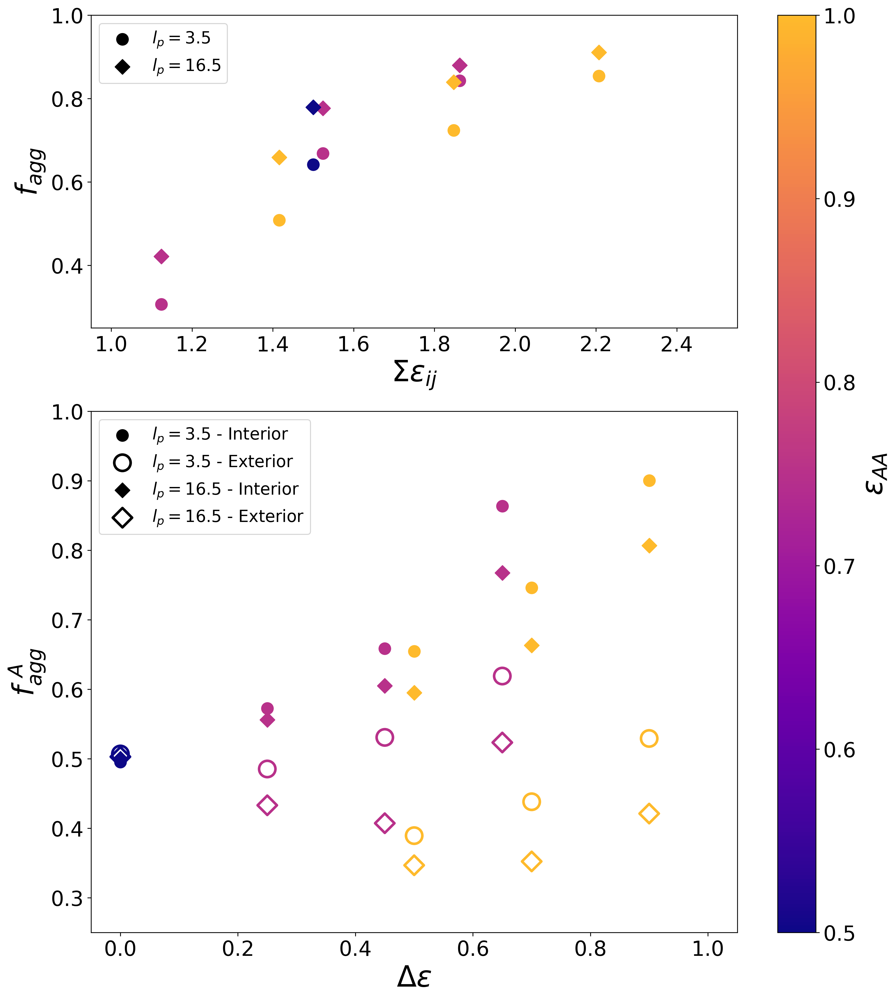

In [89]:
fig = plt.figure(figsize=(14,16))
gs = fig.add_gridspec(ncols=1,nrows=2, height_ratios = [0.6,1])#, hspace = 0.6, wspace=0.3)
host = fig.add_subplot(gs[1,0])
ax2 = fig.add_subplot(gs[0,0])


host.set_xlabel('$\Delta \epsilon$')
host.set_ylabel('$f_{agg}^{\ A}$')
host.set_xlim((-0.05,1.05))
host.set_ylim((0.25,1.0))
ax2.set_xlabel('$\Sigma \epsilon_{ij}$')
ax2.set_ylabel(r'$f_{agg}$')
ax2.set_xlim((0.95,2.55))
ax2.set_ylim((0.25,1.0))

leg3 = host.scatter([-1,-1],[-1,-1],marker='.',color='k',s=500)
leg4 = host.scatter([-1,-1],[-1,-1],marker='o',color='k',s=250, linewidth=2.5, facecolor="None")
leg5 = host.scatter([-1,-1],[-1,-1],marker='D',color='k',s=100)
leg6 = host.scatter([-1,-1],[-1,-1],marker='D',color='k',s=175, linewidth=2.5, facecolor="None")
leg1 = ax2.scatter([-1,-1],[-1,-1],marker='.',color='k',s=500)
leg2 = ax2.scatter([-1,-1],[-1,-1],marker='D',color='k',s=100)

host.legend([leg3,leg4,leg5,leg6],('$l_p = 3.5$ - Interior','$l_p = 3.5$ - Exterior','$l_p = 16.5$ - Interior','$l_p = 16.5$ - Exterior'),loc='upper left', prop={'size':16});
ax2.legend([leg1,leg2],('$l_p = 3.5$','$l_p = 16.5$'),loc='upper left', prop={'size':16});



for i in range(len(sims)):
    if i not in [0,1]:
        #Flexible
        host.scatter(delta_eps[i],FA_int_int[i+len(sims)],color=cmap3(c_id3[epsAA_colorids[i]]),marker='.',s=500)
        host.scatter(delta_eps[i],FA_ext_ext[i+len(sims)],color=cmap3(c_id3[epsAA_colorids[i]]),marker='o',s=250, linewidth=2.5, facecolor="None")
        ax2.scatter(eps_sum2[i],f_agg[i+len(sims)],color=cmap3(c_id3[epsAA_colorids[i]]),marker='.',s=500)
        #Stiff
        host.scatter(delta_eps[i],FA_int_int[i],color=cmap3(c_id3[epsAA_colorids[i]]),marker='D',s=100)
        host.scatter(delta_eps[i],FA_ext_ext[i],color=cmap3(c_id3[epsAA_colorids[i]]),marker='D',s=175, linewidth=2.5, facecolor="None")
        ax2.scatter(eps_sum2[i],f_agg[i],color=cmap3(c_id3[epsAA_colorids[i]]),marker='D',s=100)


        
        
#plt.colorbar(sm3,ax=host,label=cb_labels[1]);
#plt.colorbar(sm3,ax=ax2,label=cb_labels[1]);
plt.colorbar(sm3,ax=[ax2,host],label=cb_labels[1],aspect=24);




plt.show()

In [115]:
print(FA_int_int)
print(FA_ext_ext)

[0.512987012987013, 0.5942028985507246, 0.7677318784099766, 0.6052276157940732, 0.556083916083916, 0.8067300338686769, 0.6632100294072125, 0.5951550260022381, 0.5000447747828423, 0.7209302325581395, 0.5672514619883041, 0.86375, 0.6587334437086093, 0.5727301620934421, 0.9002653347900733, 0.7459910198845414, 0.6548440065681445, 0.4954039671020803]
[0.5856655290102389, 0.525756600128783, 0.5234375, 0.4072926596758818, 0.4330926083262532, 0.4211769336744735, 0.35232067510548526, 0.34679758982370007, 0.5029115934356803, 0.5545918367346939, 0.5404319437468609, 0.6190803019903912, 0.5307948397836039, 0.4853427626325995, 0.5292576419213973, 0.4382058215365039, 0.3894200127469726, 0.5069538670284939]


In [90]:
# fig = plt.figure(figsize=(14,16))
# gs = fig.add_gridspec(ncols=1,nrows=2, height_ratios = [0.6,1])#, hspace = 0.6, wspace=0.3)
# host = fig.add_subplot(gs[1,0])
# ax2 = fig.add_subplot(gs[0,0])


# host.set_xlabel('$\Delta \epsilon$')
# host.set_ylabel('$F_{A}$')
# host.set_xlim((-0.05,1.05))
# host.set_ylim((0.25,1.0))
# ax2.set_xlabel('$\Delta \epsilon$')
# ax2.set_ylabel(r'$f_{agg}$')
# ax2.set_xlim((-0.05,1.0))
# ax2.set_ylim((0.25,1.0))

# leg3 = host.scatter([-1,-1],[-1,-1],marker='.',color='k',s=500)
# leg4 = host.scatter([-1,-1],[-1,-1],marker='o',color='k',s=250, linewidth=2.5, facecolor="None")
# leg5 = host.scatter([-1,-1],[-1,-1],marker='D',color='k',s=100)
# leg6 = host.scatter([-1,-1],[-1,-1],marker='D',color='k',s=175, linewidth=2.5, facecolor="None")
# leg1 = ax2.scatter([-1,-1],[-1,-1],marker='.',color='k',s=500)
# leg2 = ax2.scatter([-1,-1],[-1,-1],marker='D',color='k',s=100)

# host.legend([leg3,leg4,leg5,leg6],('$l_p = 3.5$ - Interior','$l_p = 3.5$ - Exterior','$l_p = 16.5$ - Interior','$l_p = 16.5$ - Exterior'),loc='upper left', prop={'size':16});
# ax2.legend([leg1,leg2],('$l_p = 3.5$','$l_p = 16.5$'),loc='lower left', prop={'size':16});



# for i in range(len(sims)):
#     if i not in [0,1]:
#         #Flexible
#         host.scatter(delta_eps[i],FA_int_int[i+len(sims)],color=cmap3(c_id3[epsAA_colorids[i]]),marker='.',s=500)
#         host.scatter(delta_eps[i],FA_ext_ext[i+len(sims)],color=cmap3(c_id3[epsAA_colorids[i]]),marker='o',s=250, linewidth=2.5, facecolor="None")
#         ax2.scatter(delta_eps[i],f_agg[i+len(sims)],color=cmap3(c_id3[epsAA_colorids[i]]),marker='.',s=500)
#         #Stiff
#         host.scatter(delta_eps[i],FA_int_int[i],color=cmap3(c_id3[epsAA_colorids[i]]),marker='D',s=100)
#         host.scatter(delta_eps[i],FA_ext_ext[i],color=cmap3(c_id3[epsAA_colorids[i]]),marker='D',s=175, linewidth=2.5, facecolor="None")
#         ax2.scatter(delta_eps[i],f_agg[i],color=cmap3(c_id3[epsAA_colorids[i]]),marker='D',s=100)


        
        
# #plt.colorbar(sm3,ax=host,label=cb_labels[1]);
# #plt.colorbar(sm3,ax=ax2,label=cb_labels[1]);
# plt.colorbar(sm3,ax=[ax2,host],label=cb_labels[1],aspect=24);




# plt.show()

In [91]:
# fig, host = plt.subplots(1,1,figsize = (10,8))

# for i,sim in enumerate(sims):
#     #host.plot(flexible_sims[i][0],flexible_sims[i][10][1:],label=labels[i], color=cmap(c_id[i]))
#     host.plot(sims[i][0],sims[i][10][1:],label=labels[i], color=cmap(c_id[i]))



# host.set_xlabel('$p$')
# host.set_ylabel('$p_{A}$')
# host.set_xlim((-0.01,1.0))
# host.set_ylim((-0.01,1.0))

# host.legend(*([x[i] for i in [0,1,8,2,3,4,5,6,7]] for x in plt.gca().get_legend_handles_labels()),loc='lower left', ncol = 3, bbox_to_anchor=(-0.15,1.02), prop={'size':16});
# plt.colorbar(sm6,ax=host,label=labels[-1]);

# plt.show()

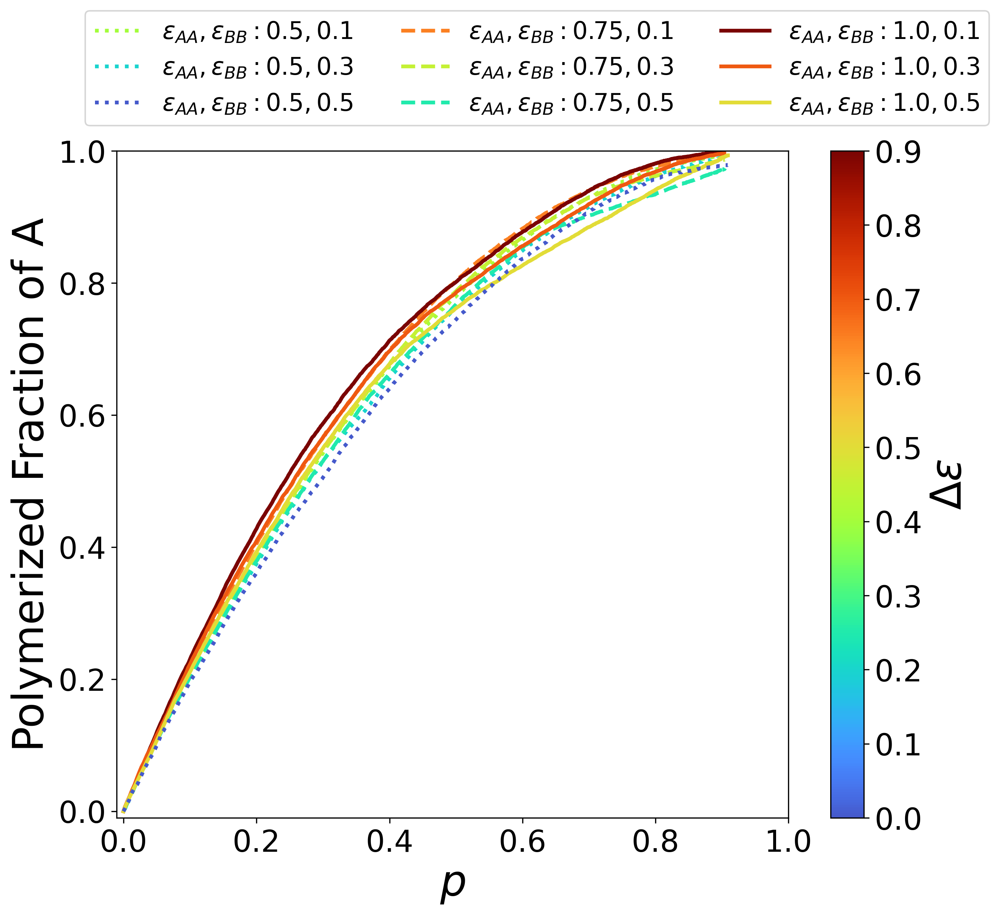

In [92]:
fig, host = plt.subplots(1,1,figsize = (10,8))

for i,sim in enumerate(sims):
    host.plot(sims[i][0],sims[i][10][1:],label=labels[i], color=cmap4(c_id4[i]), linestyle=epsAA_linestyles[i], linewidth=2.5)
    
host.set_xlabel('$p$')
host.set_ylabel('Polymerized Fraction of A')
host.set_xlim((-0.01,1.0))
host.set_ylim((-0.01,1.0))



host.legend(*([x[i] for i in [0,1,8,2,3,4,5,6,7]] for x in plt.gca().get_legend_handles_labels()),loc='lower left', ncol = 3, bbox_to_anchor=(-0.065,1.02), prop={'size':16});

plt.colorbar(sm4,ax=host,label=cb_labels[0]);

plt.show()

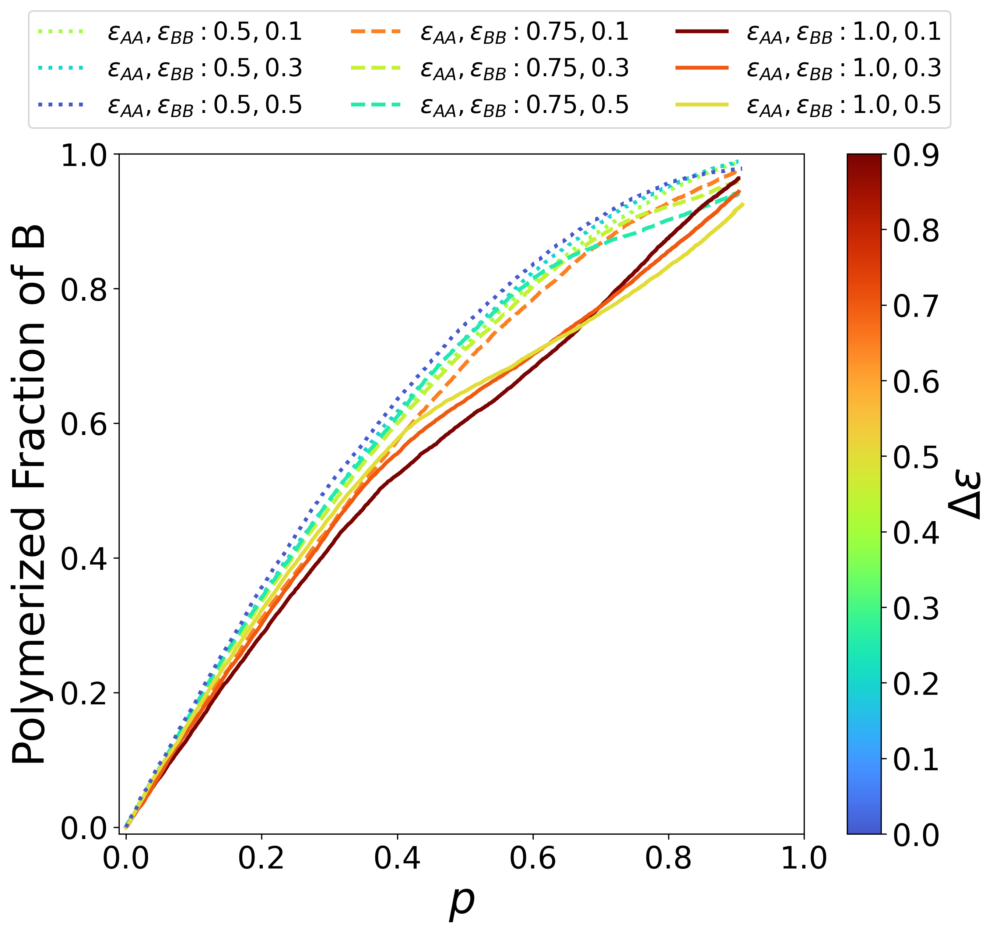

In [93]:
fig, host = plt.subplots(1,1,figsize = (10,8))

for i,sim in enumerate(sims):
    host.plot(sims[i][0],sims[i][11][1:],label=labels[i], color=cmap4(c_id4[i]), linestyle=epsAA_linestyles[i], linewidth=2.5)
    
host.set_xlabel('$p$')
host.set_ylabel('Polymerized Fraction of B')
host.set_xlim((-0.01,1.0))
host.set_ylim((-0.01,1.0))



host.legend(*([x[i] for i in [0,1,8,2,3,4,5,6,7]] for x in plt.gca().get_legend_handles_labels()),loc='lower left', ncol = 3, bbox_to_anchor=(-0.15,1.02), prop={'size':16});

plt.colorbar(sm4,ax=host,label=cb_labels[0]);

plt.show()

In [94]:
# # Plotting
# fig, host = plt.subplots(1,2,figsize = (24,8))
# #fig, host = plt.subplots(1,2,figsize = (20,8))
# host[0].set_xlabel('$p$')
# host[1].set_xlabel('$p$')
# host[0].set_ylabel('Polymerized Fraction of A')
# host[1].set_ylabel('Polymerized Fraction of B')
# host[0].set_xlim((-0.05,1.05))
# host[1].set_xlim((-0.05,1.05))
# host[0].set_ylim((-0.05,1.05))
# host[1].set_ylim((-0.05,1.05))



# for i,sim in enumerate(sims):
#     if i in [5,6,7,8]:
#         host[0].plot(sims[i][0],sims[i][10][1:],label=labels[i], color=cmap4(c_id4[i]), linestyle=epsAA_linestyles[i], linewidth=2.5)
#         host[1].plot(sims[i][0],sims[i][11][1:],label=labels[i], color=cmap4(c_id4[i]), linestyle=epsAA_linestyles[i], linewidth=2.5)
        
# host[1].legend(*([x[i] for i in [3,0,1,2]] for x in plt.gca().get_legend_handles_labels()),loc='lower left', ncol = 4, bbox_to_anchor=(-0.85,1.02), prop={'size':16});

# plt.colorbar(sm4,ax=host.ravel().tolist(),label=cb_labels[0]);

# plt.show()    

In [95]:
# # Plotting
# fig, host = plt.subplots(1,2,figsize = (24,8))
# #fig, host = plt.subplots(1,2,figsize = (20,8))
# host[0].set_xlabel('$p$')
# host[1].set_xlabel('$p$')
# host[0].set_ylabel('Polymerized Fraction of A')
# host[1].set_ylabel('Polymerized Fraction of B')
# host[0].set_xlim((-0.005,0.255))
# host[1].set_xlim((-0.005,0.255))
# host[0].set_ylim((-0.005,0.505))
# host[1].set_ylim((-0.005,0.505))



# for i,sim in enumerate(sims):
#     if i in [5,6,7,8]:
#         host[0].plot(sims[i][0],sims[i][10][1:],label=labels[i], color=cmap4(c_id4[i]), linestyle=epsAA_linestyles[i], linewidth=2.5)
#         host[1].plot(sims[i][0],sims[i][11][1:],label=labels[i], color=cmap4(c_id4[i]), linestyle=epsAA_linestyles[i], linewidth=2.5)
        
# host[1].legend(*([x[i] for i in [3,0,1,2]] for x in plt.gca().get_legend_handles_labels()),loc='lower left', ncol = 4, bbox_to_anchor=(-0.85,1.02), prop={'size':16});

# plt.colorbar(sm4,ax=host.ravel().tolist(),label=cb_labels[0]);

# plt.show()  

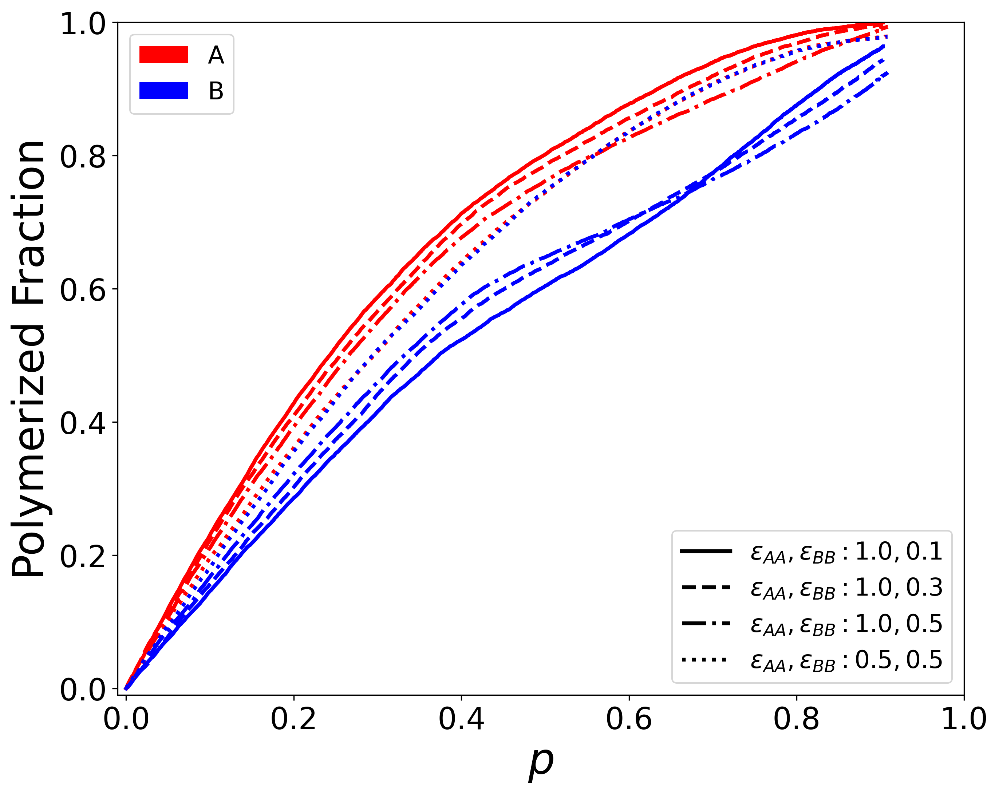

In [96]:
fig, host = plt.subplots(1,1,figsize = (10,8))

temp_linestyles = ['','','','','','-','--','-.',':']

for i,sim in enumerate(sims):
    if i in [5,6,7,8]:
        host.plot(sims[i][0],sims[i][10][1:],label=labels[i], color='red', linestyle=temp_linestyles[i], linewidth=2.5)
        host.plot(sims[i][0],sims[i][11][1:],label=labels[i], color='blue', linestyle=temp_linestyles[i], linewidth=2.5)
    
host.set_xlabel('$p$')
host.set_ylabel('Polymerized Fraction')
host.set_xlim((-0.01,1.0))
host.set_ylim((-0.01,1.0))


leg1 = host.bar([-10,-9],[-10,-9],color='r')
leg2 = host.bar([-10,-9],[-10,-9],color='b')
leg3, = host.plot([-1,-1],[-1,-1],'-k',linewidth=2.5)
leg4, = host.plot([-1,-1],[-1,-1],'--k',linewidth=2.5)
leg5, = host.plot([-1,-1],[-1,-1],'-.k',linewidth=2.5)
leg6, = host.plot([-1,-1],[-1,-1],':k',linewidth=2.5)

#legend1 = host.legend(handles=[leg3,leg4,leg5,leg6],labels=('$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.1$', '$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.3$', '$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.5$', '$\epsilon_{AA} , \epsilon_{BB} : 0.5 , 0.5$'),loc='lower left', ncol = 4, bbox_to_anchor=(-0.25,1.02), prop={'size':16});
legend1 = host.legend(handles=[leg3,leg4,leg5,leg6],labels=('$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.1$', '$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.3$', '$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.5$', '$\epsilon_{AA} , \epsilon_{BB} : 0.5 , 0.5$'),loc='lower right', ncol = 1, prop={'size':16});
plt.gca().add_artist(legend1)
legend2 = plt.legend(handles=[leg1,leg2],labels=('A','B',),loc='upper left', prop={'size':16});


plt.show()

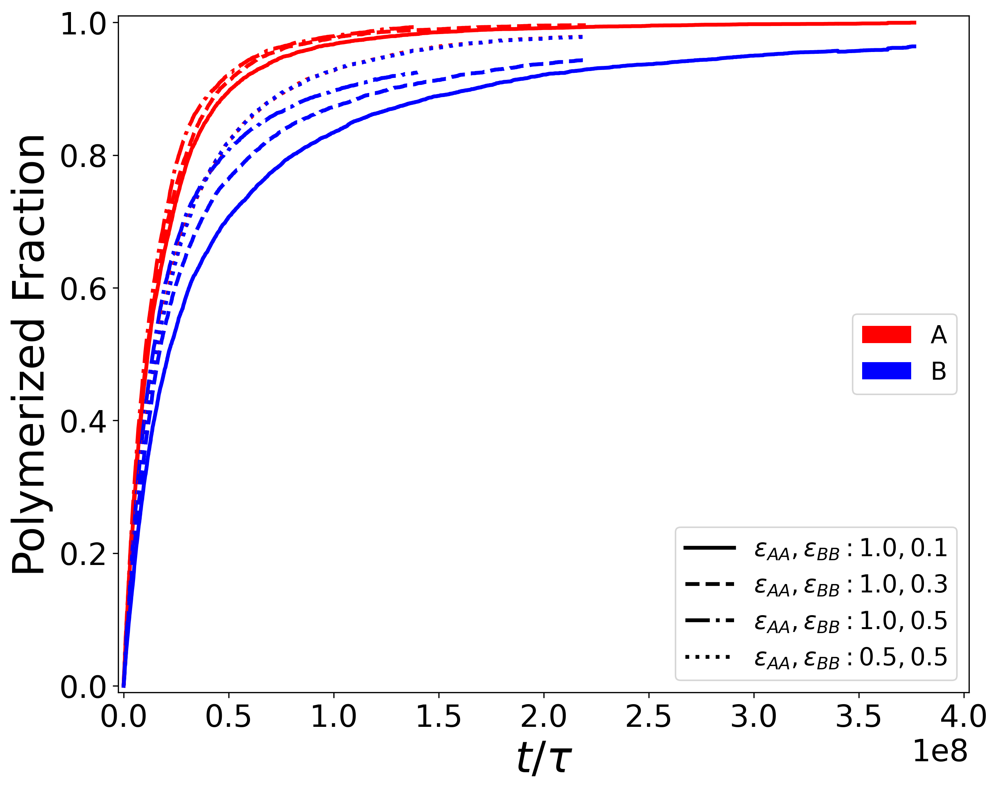

In [97]:
fig, host = plt.subplots(1,1,figsize = (10,8))

temp_linestyles = ['','','','','','-','--','-.',':']

for i,sim in enumerate(sims):
    if i in [5,6,7,8]:
        host.plot(sims[i][2],sims[i][10][1:],label=labels[i], color='red', linestyle=temp_linestyles[i], linewidth=2.5)
        host.plot(sims[i][2],sims[i][11][1:],label=labels[i], color='blue', linestyle=temp_linestyles[i], linewidth=2.5)
    
host.set_xlabel(r'$t/ \tau$')
host.set_ylabel('Polymerized Fraction')
host.set_xlim((-0.025e8,4.025e8))
host.set_ylim((-0.01,1.01))


leg1 = host.bar([-10,-9],[-10,-9],color='r')
leg2 = host.bar([-10,-9],[-10,-9],color='b')
leg3, = host.plot([-1,-1],[-1,-1],'-k',linewidth=2.5)
leg4, = host.plot([-1,-1],[-1,-1],'--k',linewidth=2.5)
leg5, = host.plot([-1,-1],[-1,-1],'-.k',linewidth=2.5)
leg6, = host.plot([-1,-1],[-1,-1],':k',linewidth=2.5)

#legend1 = host.legend(handles=[leg3,leg4,leg5,leg6],labels=('$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.1$', '$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.3$', '$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.5$', '$\epsilon_{AA} , \epsilon_{BB} : 0.5 , 0.5$'),loc='lower left', ncol = 4, bbox_to_anchor=(-0.25,1.02), prop={'size':16});
legend1 = host.legend(handles=[leg3,leg4,leg5,leg6],labels=('$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.1$', '$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.3$', '$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.5$', '$\epsilon_{AA} , \epsilon_{BB} : 0.5 , 0.5$'),loc='lower right', ncol = 1, prop={'size':16});
plt.gca().add_artist(legend1)
legend2 = plt.legend(handles=[leg1,leg2],labels=('A','B',),loc='center right', prop={'size':16});


plt.show()

In [98]:
# fig, host = plt.subplots(1,1,figsize = (10,8))

# temp_linestyles = ['','','','','','-','--','-.',':']

# for i,sim in enumerate(sims):
#     if i in [5,6,7]:
#         host.plot(sims[i][2],sims[i][0],label=labels[i], color='k', linestyle=temp_linestyles[i], linewidth=2.5)
#     elif i==8:
#         host.plot(sims[i][2],sims[i][0],label=labels[i], color='k', linestyle=':', linewidth=2.5)
    
# host.set_ylabel('$p$')
# host.set_xlabel(r'$t/\tau$')
# host.set_xlim((-0.025e8,4.025e8))
# host.set_ylim((-0.01,1.0))


# leg1 = host.bar([-10,-9],[-10,-9],color='r')
# leg2 = host.bar([-10,-9],[-10,-9],color='b')
# leg3, = host.plot([-1,-1],[-1,-1],'-k',linewidth=2.5)
# leg4, = host.plot([-1,-1],[-1,-1],'--k',linewidth=2.5)
# leg5, = host.plot([-1,-1],[-1,-1],'-.k',linewidth=2.5)
# leg6, = host.plot([-1,-1],[-1,-1],':k',linewidth=2.5)

# #legend1 = host.legend(handles=[leg3,leg4,leg5,leg6],labels=('$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.1$', '$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.3$', '$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.5$', '$\epsilon_{AA} , \epsilon_{BB} : 0.5 , 0.5$'),loc='lower left', ncol = 4, bbox_to_anchor=(-0.25,1.02), prop={'size':16});
# legend1 = host.legend(handles=[leg3,leg4,leg5,leg6],labels=('$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.1$', '$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.3$', '$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.5$', '$\epsilon_{AA} , \epsilon_{BB} : 0.5 , 0.5$'),loc='lower right', ncol = 1, prop={'size':16});
# plt.gca().add_artist(legend1)
# #legend2 = plt.legend(handles=[leg1,leg2],labels=('A','B',),loc='upper left', prop={'size':16});


# plt.show()

In [99]:
# fig, host = plt.subplots(1,1,figsize = (10,8))

# temp_linestyles = ['','','','','','-','--','-.',':']

# start_index = 5
# stop_index = -1


# for i,sim in enumerate(sims):
#     if i in [5,6,7,8]:
#         host.plot((1-sims[i][10][start_index:stop_index])/((1-sims[i][11][start_index:stop_index])+(1-sims[i][10][start_index:stop_index])),sims[i][10][start_index:stop_index]/(sims[i][10][start_index:stop_index]+sims[i][11][start_index:stop_index]),label=labels[i], color='k', linestyle=temp_linestyles[i], linewidth=2.5)

    
# host.set_xlabel('$f_{A}$')
# host.set_ylabel('$F_{A}$')
# host.set_xlim((-0.01,1.0))
# host.set_ylim((-0.01,1.0))






# #leg1 = host.bar([-10,-9],[-10,-9],color='r')
# #leg2 = host.bar([-10,-9],[-10,-9],color='b')
# leg3, = host.plot([-1,-1],[-1,-1],'-k',linewidth=2.5)
# leg4, = host.plot([-1,-1],[-1,-1],'--k',linewidth=2.5)
# leg5, = host.plot([-1,-1],[-1,-1],'-.k',linewidth=2.5)
# leg6, = host.plot([-1,-1],[-1,-1],':k',linewidth=2.5)

# #legend1 = host.legend(handles=[leg3,leg4,leg5,leg6],labels=('$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.1$', '$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.3$', '$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.5$', '$\epsilon_{AA} , \epsilon_{BB} : 0.5 , 0.5$'),loc='lower left', ncol = 4, bbox_to_anchor=(-0.25,1.02), prop={'size':16});
# legend1 = host.legend(handles=[leg3,leg4,leg5,leg6],labels=('$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.1$', '$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.3$', '$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.5$', '$\epsilon_{AA} , \epsilon_{BB} : 0.5 , 0.5$'),loc='lower right', ncol = 1, prop={'size':16});
# plt.gca().add_artist(legend1)
# #legend2 = plt.legend(handles=[leg1,leg2],labels=('A','B',),loc='upper left', prop={'size':16});


# plt.show()

In [100]:
# import matplotlib.animation as ani



# fig, host = plt.subplots(1,2,figsize = (24,8))

# temp_linestyles = ['','','','','','-','--','-.',':']

# start_index = 5
# fig.dpi = 200

# host[0].set_xlabel('$f_{A}$')
# host[0].set_ylabel('$F_{A}$')
# host[0].set_xlim((-0.01,1.0))
# host[0].set_ylim((-0.01,1.0))



# host[1].set_ylabel('$p$')
# host[1].set_xlabel(r'$t/\tau$')
# host[1].set_xlim((-0.025e8,4.025e8))
# host[1].set_ylim((-0.01,1.0))




# #leg1 = host[0].bar([-10,-9],[-10,-9],color='r')
# #leg2 = host[0].bar([-10,-9],[-10,-9],color='b')
# leg3, = host[0].plot([],[],'-k',linewidth=2.5)
# leg4, = host[0].plot([],[],'--k',linewidth=2.5)
# leg5, = host[0].plot([],[],'-.k',linewidth=2.5)
# leg6, = host[0].plot([],[],':k',linewidth=2.5)

# host[0].legend(handles=[leg3,leg4,leg5,leg6],labels=('$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.1$', '$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.3$', '$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.5$', '$\epsilon_{AA} , \epsilon_{BB} : 0.5 , 0.5$'),loc='lower right', ncol = 1, prop={'size':16});


# p1, = host[0].plot([],[], label=labels[5], color='k', linestyle=temp_linestyles[5], linewidth=2.5)
# p2, = host[0].plot([],[], label=labels[6], color='k', linestyle=temp_linestyles[6], linewidth=2.5)
# p3, = host[0].plot([],[], label=labels[7], color='k', linestyle=temp_linestyles[7], linewidth=2.5)
# p4, = host[0].plot([],[], label=labels[8], color='k', linestyle=temp_linestyles[8], linewidth=2.5)
# p5, = host[1].plot([],[], label=labels[5], color='k', linestyle=temp_linestyles[5], linewidth=2.5)
# p6, = host[1].plot([],[], label=labels[6], color='k', linestyle=temp_linestyles[6], linewidth=2.5)
# p7, = host[1].plot([],[], label=labels[7], color='k', linestyle=temp_linestyles[7], linewidth=2.5)
# p8, = host[1].plot([],[], label=labels[8], color='k', linestyle=temp_linestyles[8], linewidth=2.5)


# def animate_plot(i=int):

#     start_index = 5
#     p1.set_data((1-sims[5][10][start_index:i])/((1-sims[5][11][start_index:i])+(1-sims[5][10][start_index:i])),sims[5][10][start_index:i]/(sims[5][10][start_index:i]+sims[5][11][start_index:i]))
#     p2.set_data((1-sims[6][10][start_index:i])/((1-sims[6][11][start_index:i])+(1-sims[6][10][start_index:i])),sims[6][10][start_index:i]/(sims[6][10][start_index:i]+sims[6][11][start_index:i]))
#     p3.set_data((1-sims[7][10][start_index:i])/((1-sims[7][11][start_index:i])+(1-sims[7][10][start_index:i])),sims[7][10][start_index:i]/(sims[7][10][start_index:i]+sims[7][11][start_index:i]))
#     p4.set_data((1-sims[8][10][start_index:i])/((1-sims[8][11][start_index:i])+(1-sims[8][10][start_index:i])),sims[8][10][start_index:i]/(sims[8][10][start_index:i]+sims[8][11][start_index:i]))
#     p5.set_data(sims[5][2][start_index:i],sims[5][0][start_index:i])
#     p6.set_data(sims[6][2][start_index:i],sims[6][0][start_index:i])
#     p7.set_data(sims[7][2][start_index:i],sims[7][0][start_index:i])
#     p8.set_data(sims[8][2][start_index:i],sims[8][0][start_index:i])



# animator = ani.FuncAnimation(fig, animate_plot, save_count=len(sims[5][10][start_index:]), interval=25, blit=False) 
# animator.save('test_animation.mp4', dpi=200, codec="libx264")
# plt.show()



In [101]:
# fig, host = plt.subplots(1,1,figsize = (10,8))

# for i in [15,16,17]:
#     host.plot(extent_unavg[i],pA_unavg[i][1:], '-r', linewidth=2.5)
#     host.plot(extent_unavg[i],pB_unavg[i][1:], '-b', linewidth=2.5)

# host.set_xlabel('$p$')
# host.set_ylabel('Polymerized Fraction')
# host.set_xlim((-0.01,1.0))
# host.set_ylim((-0.01,1.0))


# leg1 = host.bar([-10,-9],[-10,-9],color='r')
# leg2 = host.bar([-10,-9],[-10,-9],color='b')
# leg3, = host.plot([-1,-1],[-1,-1],'-k',linewidth=2.5)
# leg4, = host.plot([-1,-1],[-1,-1],'--k',linewidth=2.5)
# leg5, = host.plot([-1,-1],[-1,-1],'-.k',linewidth=2.5)
# leg6, = host.plot([-1,-1],[-1,-1],':k',linewidth=2.5)

# #legend1 = host.legend(handles=[leg3,leg4,leg5,leg6],labels=('$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.1$', '$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.3$', '$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.5$', '$\epsilon_{AA} , \epsilon_{BB} : 0.5 , 0.5$'),loc='lower left', ncol = 4, bbox_to_anchor=(-0.25,1.02), prop={'size':16});
# legend1 = host.legend(handles=[leg3,leg4,leg5,leg6],labels=('$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.1$', '$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.3$', '$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.5$', '$\epsilon_{AA} , \epsilon_{BB} : 0.5 , 0.5$'),loc='lower right', ncol = 1, prop={'size':16});
# plt.gca().add_artist(legend1)
# legend2 = plt.legend(handles=[leg1,leg2],labels=('A','B',),loc='upper left', prop={'size':16});

# plt.show()

In [102]:
# fig, host = plt.subplots(1,1,figsize = (10,8))

# for i in [18,19,20]:
#     host.plot(extent_unavg[i],pA_unavg[i][1:], '--r', linewidth=2.5)
#     host.plot(extent_unavg[i],pB_unavg[i][1:], '--b', linewidth=2.5)

# host.set_xlabel('$p$')
# host.set_ylabel('Polymerized Fraction')
# host.set_xlim((-0.01,1.0))
# host.set_ylim((-0.01,1.0))


# leg1 = host.bar([-10,-9],[-10,-9],color='r')
# leg2 = host.bar([-10,-9],[-10,-9],color='b')
# leg3, = host.plot([-1,-1],[-1,-1],'-k',linewidth=2.5)
# leg4, = host.plot([-1,-1],[-1,-1],'--k',linewidth=2.5)
# leg5, = host.plot([-1,-1],[-1,-1],'-.k',linewidth=2.5)
# leg6, = host.plot([-1,-1],[-1,-1],':k',linewidth=2.5)

# #legend1 = host.legend(handles=[leg3,leg4,leg5,leg6],labels=('$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.1$', '$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.3$', '$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.5$', '$\epsilon_{AA} , \epsilon_{BB} : 0.5 , 0.5$'),loc='lower left', ncol = 4, bbox_to_anchor=(-0.25,1.02), prop={'size':16});
# legend1 = host.legend(handles=[leg3,leg4,leg5,leg6],labels=('$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.1$', '$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.3$', '$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.5$', '$\epsilon_{AA} , \epsilon_{BB} : 0.5 , 0.5$'),loc='lower right', ncol = 1, prop={'size':16});
# plt.gca().add_artist(legend1)
# legend2 = plt.legend(handles=[leg1,leg2],labels=('A','B',),loc='upper left', prop={'size':16});

# plt.show()

In [103]:
# fig, host = plt.subplots(1,1,figsize = (10,8))

# for i in [21,22,23]:
#     host.plot(extent_unavg[i],pA_unavg[i][1:], '-.r', linewidth=2.5)
#     host.plot(extent_unavg[i],pB_unavg[i][1:], '-.b', linewidth=2.5)

# host.set_xlabel('$p$')
# host.set_ylabel('Polymerized Fraction')
# host.set_xlim((-0.01,1.0))
# host.set_ylim((-0.01,1.0))


# leg1 = host.bar([-10,-9],[-10,-9],color='r')
# leg2 = host.bar([-10,-9],[-10,-9],color='b')
# leg3, = host.plot([-1,-1],[-1,-1],'-k',linewidth=2.5)
# leg4, = host.plot([-1,-1],[-1,-1],'--k',linewidth=2.5)
# leg5, = host.plot([-1,-1],[-1,-1],'-.k',linewidth=2.5)
# leg6, = host.plot([-1,-1],[-1,-1],':k',linewidth=2.5)

# #legend1 = host.legend(handles=[leg3,leg4,leg5,leg6],labels=('$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.1$', '$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.3$', '$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.5$', '$\epsilon_{AA} , \epsilon_{BB} : 0.5 , 0.5$'),loc='lower left', ncol = 4, bbox_to_anchor=(-0.25,1.02), prop={'size':16});
# legend1 = host.legend(handles=[leg3,leg4,leg5,leg6],labels=('$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.1$', '$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.3$', '$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.5$', '$\epsilon_{AA} , \epsilon_{BB} : 0.5 , 0.5$'),loc='lower right', ncol = 1, prop={'size':16});
# plt.gca().add_artist(legend1)
# legend2 = plt.legend(handles=[leg1,leg2],labels=('A','B',),loc='upper left', prop={'size':16});

# plt.show()

In [104]:
# fig, host = plt.subplots(1,1,figsize = (10,8))

# for i in [24,25,26]:
#     host.plot(extent_unavg[i],pA_unavg[i][1:], ':r', linewidth=2.5)
#     host.plot(extent_unavg[i],pB_unavg[i][1:], ':b', linewidth=2.5)

# host.set_xlabel('$p$')
# host.set_ylabel('Polymerized Fraction')
# host.set_xlim((-0.01,1.0))
# host.set_ylim((-0.01,1.0))


# leg1 = host.bar([-10,-9],[-10,-9],color='r')
# leg2 = host.bar([-10,-9],[-10,-9],color='b')
# leg3, = host.plot([-1,-1],[-1,-1],'-k',linewidth=2.5)
# leg4, = host.plot([-1,-1],[-1,-1],'--k',linewidth=2.5)
# leg5, = host.plot([-1,-1],[-1,-1],'-.k',linewidth=2.5)
# leg6, = host.plot([-1,-1],[-1,-1],':k',linewidth=2.5)

# #legend1 = host.legend(handles=[leg3,leg4,leg5,leg6],labels=('$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.1$', '$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.3$', '$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.5$', '$\epsilon_{AA} , \epsilon_{BB} : 0.5 , 0.5$'),loc='lower left', ncol = 4, bbox_to_anchor=(-0.25,1.02), prop={'size':16});
# legend1 = host.legend(handles=[leg3,leg4,leg5,leg6],labels=('$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.1$', '$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.3$', '$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.5$', '$\epsilon_{AA} , \epsilon_{BB} : 0.5 , 0.5$'),loc='lower right', ncol = 1, prop={'size':16});
# plt.gca().add_artist(legend1)
# legend2 = plt.legend(handles=[leg1,leg2],labels=('A','B',),loc='upper left', prop={'size':16});

# plt.show()

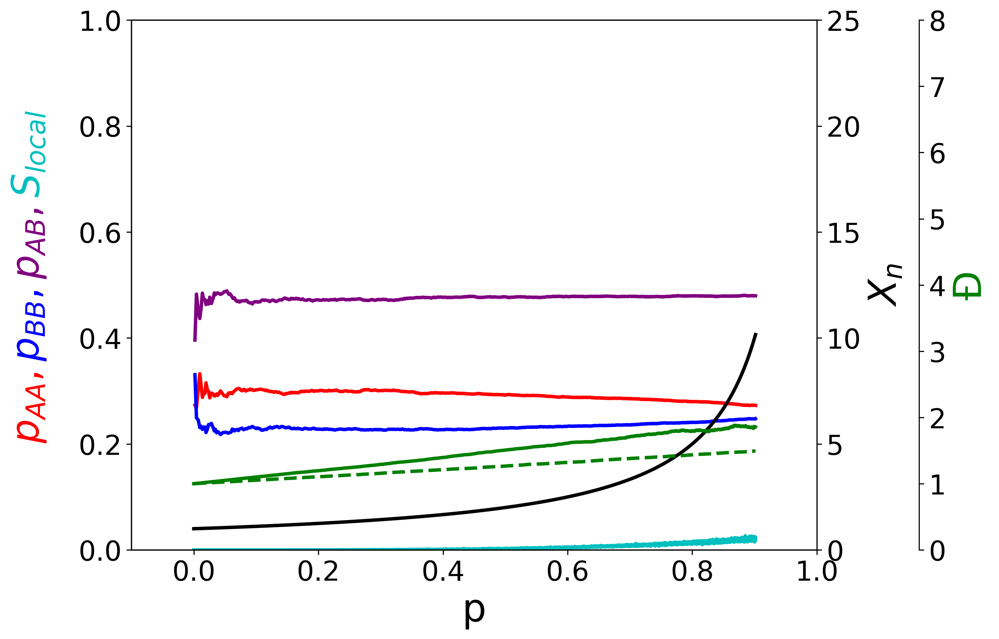

In [105]:
fig, host = plt.subplots(1,1,figsize=(9,7))
#fig.suptitle('$\epsilon_{AA} = 0.5 k_BT$, $\epsilon_{AB} = 0.2 k_BT$,  $\epsilon_{BB} = 0.1 k_BT$',fontsize=20)

par1 = host.twinx()
par2 = host.twinx()


host.set_xlim(-0.1, 1)
host.set_ylim(0, 1)
par1.set_ylim(0, 25)
par2.set_ylim(0, 8)

host.set_xlabel("p")
par1.set_ylabel(r"$X_n$")
par2.set_ylabel(u'\u0110')



# y-axis label
ybox1 = TextArea("$p_{AA}$,", textprops=dict(color="r", size=largesize ,rotation='vertical',ha='left',va='bottom'))
ybox2 = TextArea("$p_{BB}$,", textprops=dict(color="b", size=largesize,rotation='vertical',ha='left',va='bottom'))
ybox3 = TextArea("$p_{AB},$", textprops=dict(color="purple", size=largesize,rotation='vertical',ha='left',va='bottom'))
#ybox4 = TextArea("OligoRxn", textprops=dict(color="orange", size=15,rotation='vertical',ha='left',va='bottom'))
ybox5 = TextArea("$S_{local}$", textprops=dict(color="c", size=largesize,rotation='vertical',ha='left',va='bottom'))
ybox = VPacker(children= [ybox5, ybox3, ybox2, ybox1], align="center", pad=0, sep=8)


anchored_ybox = AnchoredOffsetbox(loc='center', child=ybox, pad=0., frameon=False,bbox_to_anchor=(-0.15, 0.5),bbox_transform=host.transAxes, borderpad=1.)



#sim index:
#    0         1          2         3         4            5          6          7                 8           9      10     11       12    13          14
#[extent_avg,order_avg,tstep_avg,probs_avg,blockAtotal,blockBtotal,chaindist,BlockA_PDI_avg,BlockB_PDI_avg,PDI_avg,pA_avg,pB_avg,seqs_all,Xn_avg,TotalBlock_PDI_avg]
# probs_avg index
#[pAA_avg,pAB_avg,pBB_avg]

for simid in [0]:
    sim = sims[simid]
    #sim = flexible_sims[simid]

    p1, = host.plot(sim[0], sim[3][0], label="pAA", color='r',linewidth=2.5)
    p2, = host.plot(sim[0], sim[3][2], label="pBB", color='b',linewidth=2.5)
    p_extra, = host.plot(sim[0], sim[3][1], label="pAB", color = 'purple',linewidth=2.5)
    p_extra3, = host.plot(sim[0], sim[1], label="$S_{local}$", color = 'c',linewidth=2.5)
    p3, = par1.plot(sim[0],sim[13] , label=r"X_n", color='k',linewidth=2.5) 
    p4, = par2.plot(sim[0], sim[9], label=u"\u0110", color='g',linewidth=2.5)
    p5, = par2.plot(sim[0],sim[14], label="Block PDI", color='g', linestyle='dashed',linewidth=2.5)
    lns = [p1, p2, p_extra, p_extra3, p3, p4, p5]







# right, left, top, bottom
par2.spines['right'].set_position(('outward', 75))

host.add_artist(anchored_ybox)
par1.yaxis.label.set_color(p3.get_color())
par2.yaxis.label.set_color(p4.get_color())
#host.legend(handles=lns, loc='best');

        
plt.show()

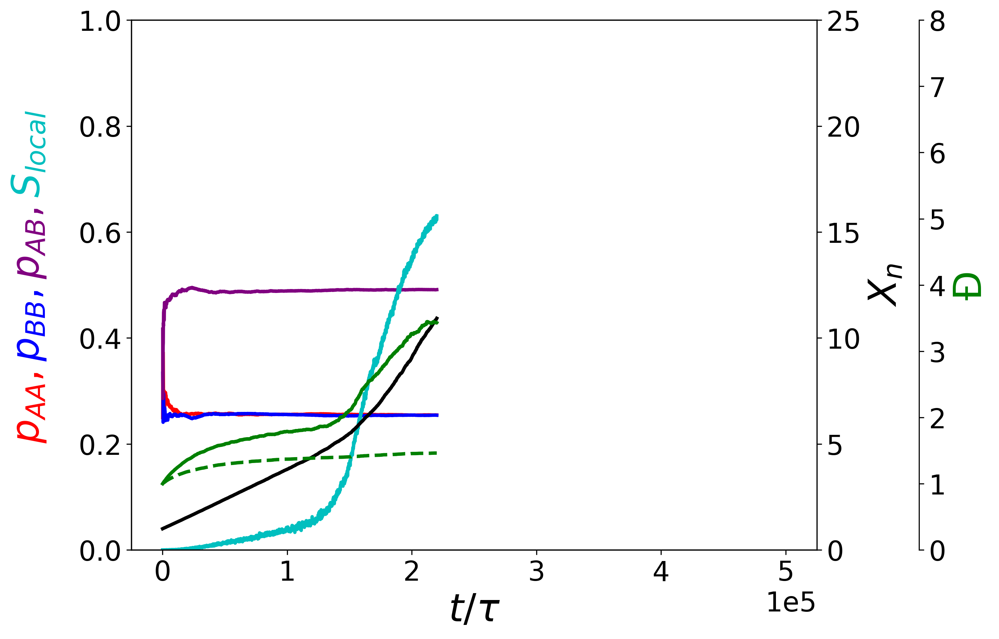

In [106]:
fig, host = plt.subplots(1,1,figsize=(9,7))
#fig.suptitle('$\epsilon_{AA} = 0.5 k_BT$, $\epsilon_{AB} = 0.2 k_BT$,  $\epsilon_{BB} = 0.1 k_BT$',fontsize=20)

par1 = host.twinx()
par2 = host.twinx()


host.set_xlim(-0.25e5, 5.25e5)
host.set_ylim(0, 1)
par1.set_ylim(0, 25)
par2.set_ylim(0, 8)

host.set_xlabel(r"$t/\tau$")
par1.set_ylabel(r"$X_n$")
par2.set_ylabel(u'\u0110')



# y-axis label
ybox1 = TextArea("$p_{AA}$,", textprops=dict(color="r", size=largesize ,rotation='vertical',ha='left',va='bottom'))
ybox2 = TextArea("$p_{BB}$,", textprops=dict(color="b", size=largesize,rotation='vertical',ha='left',va='bottom'))
ybox3 = TextArea("$p_{AB},$", textprops=dict(color="purple", size=largesize,rotation='vertical',ha='left',va='bottom'))
#ybox4 = TextArea("OligoRxn", textprops=dict(color="orange", size=15,rotation='vertical',ha='left',va='bottom'))
ybox5 = TextArea("$S_{local}$", textprops=dict(color="c", size=largesize,rotation='vertical',ha='left',va='bottom'))
ybox = VPacker(children= [ybox5, ybox3, ybox2, ybox1], align="center", pad=0, sep=8)


anchored_ybox = AnchoredOffsetbox(loc='center', child=ybox, pad=0., frameon=False,bbox_to_anchor=(-0.15, 0.5),bbox_transform=host.transAxes, borderpad=1.)



#sim index:
#    0         1          2         3         4            5          6          7                 8           9      10     11       12    13          14
#[extent_avg,order_avg,tstep_avg,probs_avg,blockAtotal,blockBtotal,chaindist,BlockA_PDI_avg,BlockB_PDI_avg,PDI_avg,pA_avg,pB_avg,seqs_all,Xn_avg,TotalBlock_PDI_avg]
# probs_avg index
#[pAA_avg,pAB_avg,pBB_avg]

for simid in [8]:
    sim = sims[simid]
    #sim = flexible_sims[simid]

    p1, = host.plot(0.001*sim[2], sim[3][0], label="pAA", color='r',linewidth=2.5)
    p2, = host.plot(0.001*sim[2], sim[3][2], label="pBB", color='b',linewidth=2.5)
    p_extra, = host.plot(0.001*sim[2], sim[3][1], label="pAB", color = 'purple',linewidth=2.5)
    p_extra3, = host.plot(0.001*sim[2], sim[1], label="$S_{local}$", color = 'c',linewidth=2.5)
    p3, = par1.plot(0.001*sim[2],sim[13] , label=r"X_n", color='k',linewidth=2.5) 
    p4, = par2.plot(0.001*sim[2], sim[9], label=u"\u0110", color='g',linewidth=2.5)
    p5, = par2.plot(0.001*sim[2],sim[14], label="Block PDI", color='g', linestyle='dashed',linewidth=2.5)
    lns = [p1, p2, p_extra, p_extra3, p3, p4, p5]





host.ticklabel_format(style='sci',scilimits=(3,0))

# right, left, top, bottom
par2.spines['right'].set_position(('outward', 75))

host.add_artist(anchored_ybox)
par1.yaxis.label.set_color(p3.get_color())
par2.yaxis.label.set_color(p4.get_color())
#host.legend(handles=lns, loc='best');

        
plt.show()

In [107]:


# fig, host = plt.subplots(1,1)
# #fig.suptitle('$\epsilon_{AA} = 0.5 k_BT$, $\epsilon_{AB} = 0.2 k_BT$,  $\epsilon_{BB} = 0.1 k_BT$',fontsize=20)

# #par1 = host.twinx()
# #par2 = host.twinx()


# host.set_xlim(-0.1, 1)
# host.set_ylim(0, 1)
# #par1.set_ylim(0, 25)
# #par2.set_ylim(0, 8)

# host.set_xlabel("p")
# #par1.set_ylabel(r"$X_n$")
# #par2.set_ylabel(u'\u0110')



# # y-axis label
# ybox1 = TextArea("$p_{AA}$,", textprops=dict(color="r", size=largesize ,rotation='vertical',ha='left',va='bottom'))
# ybox2 = TextArea("$p_{BB}$,", textprops=dict(color="b", size=largesize,rotation='vertical',ha='left',va='bottom'))
# ybox3 = TextArea("$p_{AB},$", textprops=dict(color="purple", size=largesize,rotation='vertical',ha='left',va='bottom'))
# #ybox4 = TextArea("OligoRxn", textprops=dict(color="orange", size=15,rotation='vertical',ha='left',va='bottom'))
# #ybox5 = TextArea("$S_{local}$", textprops=dict(color="c", size=largesize,rotation='vertical',ha='left',va='bottom'))
# ybox = VPacker(children= [ybox3, ybox2, ybox1], align="center", pad=0, sep=8)


# anchored_ybox = AnchoredOffsetbox(loc='center', child=ybox, pad=0., frameon=False,bbox_to_anchor=(-0.175, 0.4),bbox_transform=host.transAxes, borderpad=1.)



# #sim index:
# #    0         1          2         3         4            5          6          7                 8           9      10     11       12    13          14
# #[extent_avg,order_avg,tstep_avg,probs_avg,blockAtotal,blockBtotal,chaindist,BlockA_PDI_avg,BlockB_PDI_avg,PDI_avg,pA_avg,pB_avg,seqs_all,Xn_avg,TotalBlock_PDI_avg]
# # probs_avg index
# #[pAA_avg,pAB_avg,pBB_avg]

# for simid in [5,6,7]:
#     sim = sims[simid]
#     #sim = flexible_sims[simid]

#     p1, = host.plot(sim[0], sim[3][0], label="pAA", color='r')
#     p2, = host.plot(sim[0], sim[3][2], label="pBB", color='b')
#     p_extra, = host.plot(sim[0], sim[3][1], label="pAB", color = 'purple')
#     #p_extra3, = host.plot(sim[0], sim[1], label="$S_{local}$", color = 'c')
#     #p3, = par1.plot(sim[0],sim[13] , label=r"X_n", color='k') 
#     #p4, = par2.plot(sim[0], sim[9], label=u"\u0110", color='g')
#     #p5, = par2.plot(sim[0],sim[14], label="Block PDI", color='g', linestyle='dashed')
#     #lns = [p1, p2, p_extra, p_extra3, p3, p4, p5]







# # right, left, top, bottom
# #par2.spines['right'].set_position(('outward', 75))

# host.add_artist(anchored_ybox)
# #par1.yaxis.label.set_color(p3.get_color())
# #par2.yaxis.label.set_color(p4.get_color())
# #host.legend(handles=lns, loc='best');

        
# plt.show()

Flexible chains:

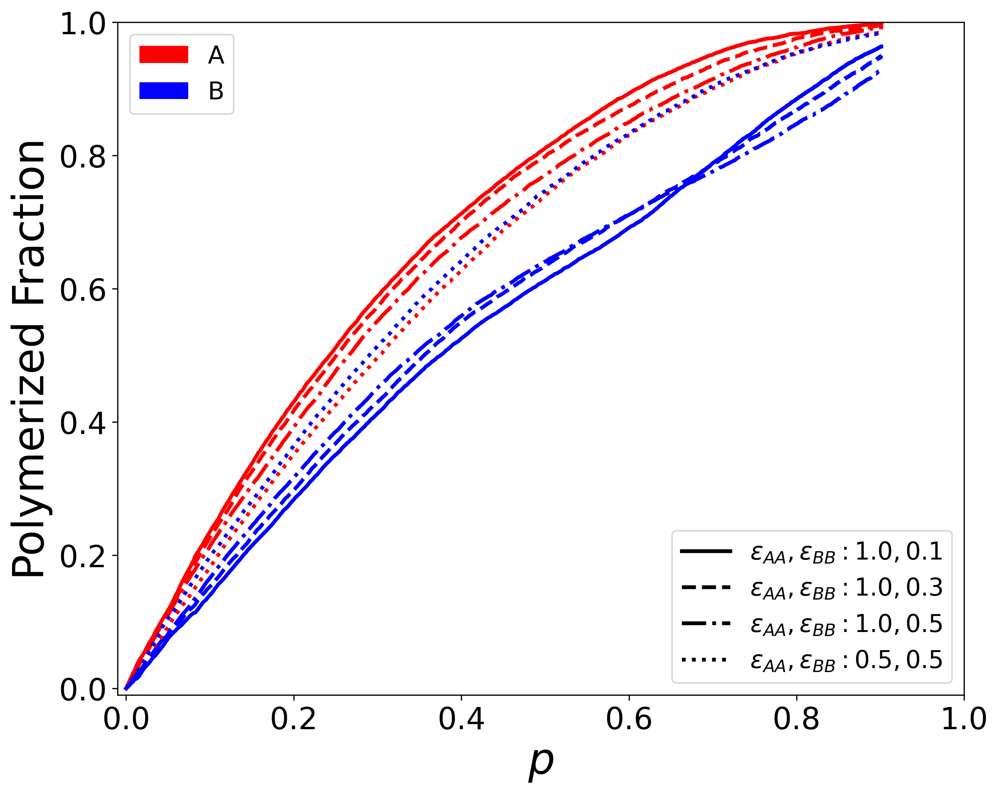

In [108]:
fig, host = plt.subplots(1,1,figsize = (10,8))

temp_linestyles = ['','','','','','-','--','-.',':']

for i in range(len(flexible_sims)):
    if i in [5,6,7]:
        host.plot(flexible_sims[i][0],flexible_sims[i][10][1:],label=labels[i], color='red', linestyle=temp_linestyles[i], linewidth=2.5)
        host.plot(flexible_sims[i][0],flexible_sims[i][11][1:],label=labels[i], color='blue', linestyle=temp_linestyles[i], linewidth=2.5)
    elif i==8:
        host.plot(flexible_sims[i][0],flexible_sims[i][10][1:],label=labels[i], color='red', linestyle=':', linewidth=2.5)
        host.plot(flexible_sims[i][0],flexible_sims[i][11][1:],label=labels[i], color='blue', linestyle=':', linewidth=2.5)
    
host.set_xlabel('$p$')
host.set_ylabel('Polymerized Fraction')
host.set_xlim((-0.01,1.0))
host.set_ylim((-0.01,1.0))


leg1 = host.bar([-10,-9],[-10,-9],color='r')
leg2 = host.bar([-10,-9],[-10,-9],color='b')
leg3, = host.plot([-1,-1],[-1,-1],'-k',linewidth=2.5)
leg4, = host.plot([-1,-1],[-1,-1],'--k',linewidth=2.5)
leg5, = host.plot([-1,-1],[-1,-1],'-.k',linewidth=2.5)
leg6, = host.plot([-1,-1],[-1,-1],':k',linewidth=2.5)

#legend1 = host.legend(handles=[leg3,leg4,leg5,leg6],labels=('$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.1$', '$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.3$', '$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.5$', '$\epsilon_{AA} , \epsilon_{BB} : 0.5 , 0.5$'),loc='lower left', ncol = 4, bbox_to_anchor=(-0.25,1.02), prop={'size':16});
legend1 = host.legend(handles=[leg3,leg4,leg5,leg6],labels=('$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.1$', '$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.3$', '$\epsilon_{AA} , \epsilon_{BB} : 1.0 , 0.5$', '$\epsilon_{AA} , \epsilon_{BB} : 0.5 , 0.5$'),loc='lower right', ncol = 1, prop={'size':16});
plt.gca().add_artist(legend1)
legend2 = plt.legend(handles=[leg1,leg2],labels=('A','B',),loc='upper left', prop={'size':16});


plt.show()

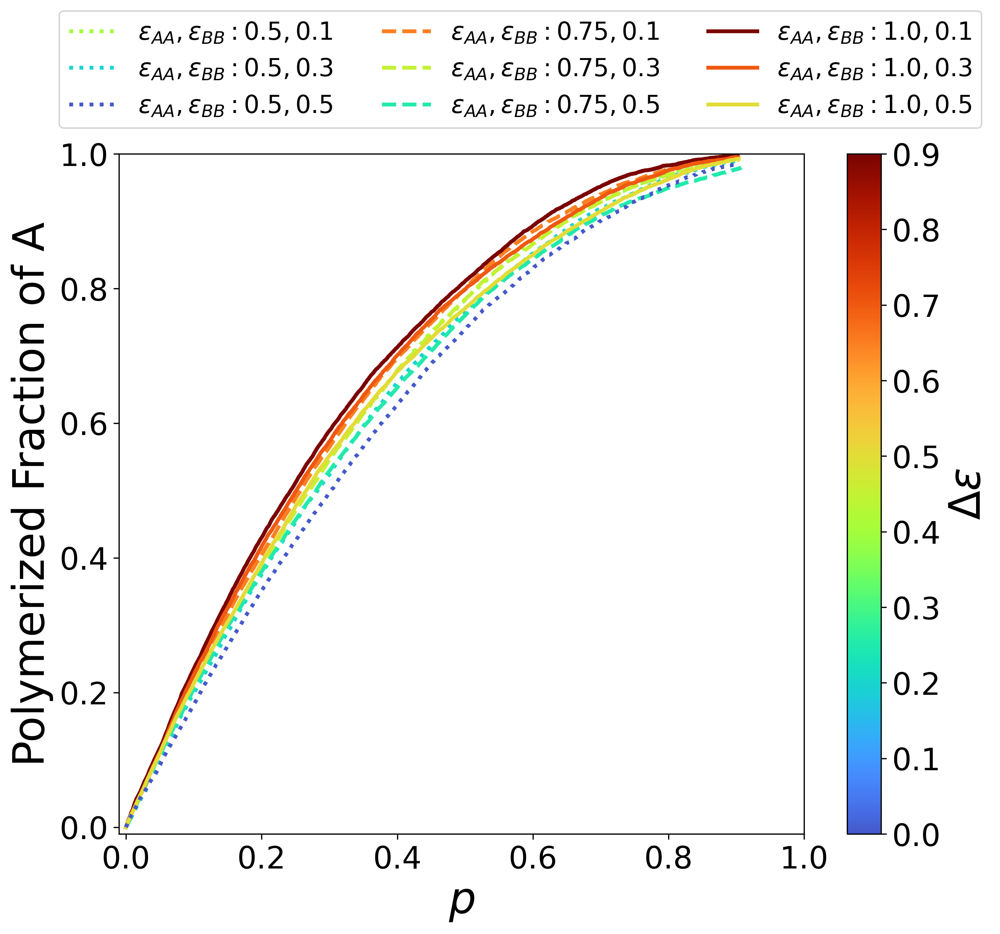

In [109]:
fig, host = plt.subplots(1,1,figsize = (10,8))

for i,sim in enumerate(sims):
    host.plot(flexible_sims[i][0],flexible_sims[i][10][1:],label=labels[i], color=cmap4(c_id4[i]), linestyle=epsAA_linestyles[i], linewidth=2.5)
    
host.set_xlabel('$p$')
host.set_ylabel('Polymerized Fraction of A')
host.set_xlim((-0.01,1.0))
host.set_ylim((-0.01,1.0))



host.legend(*([x[i] for i in [0,1,8,2,3,4,5,6,7]] for x in plt.gca().get_legend_handles_labels()),loc='lower left', ncol = 3, bbox_to_anchor=(-0.105,1.02), prop={'size':16});

plt.colorbar(sm4,ax=host,label=cb_labels[0]);

plt.show()

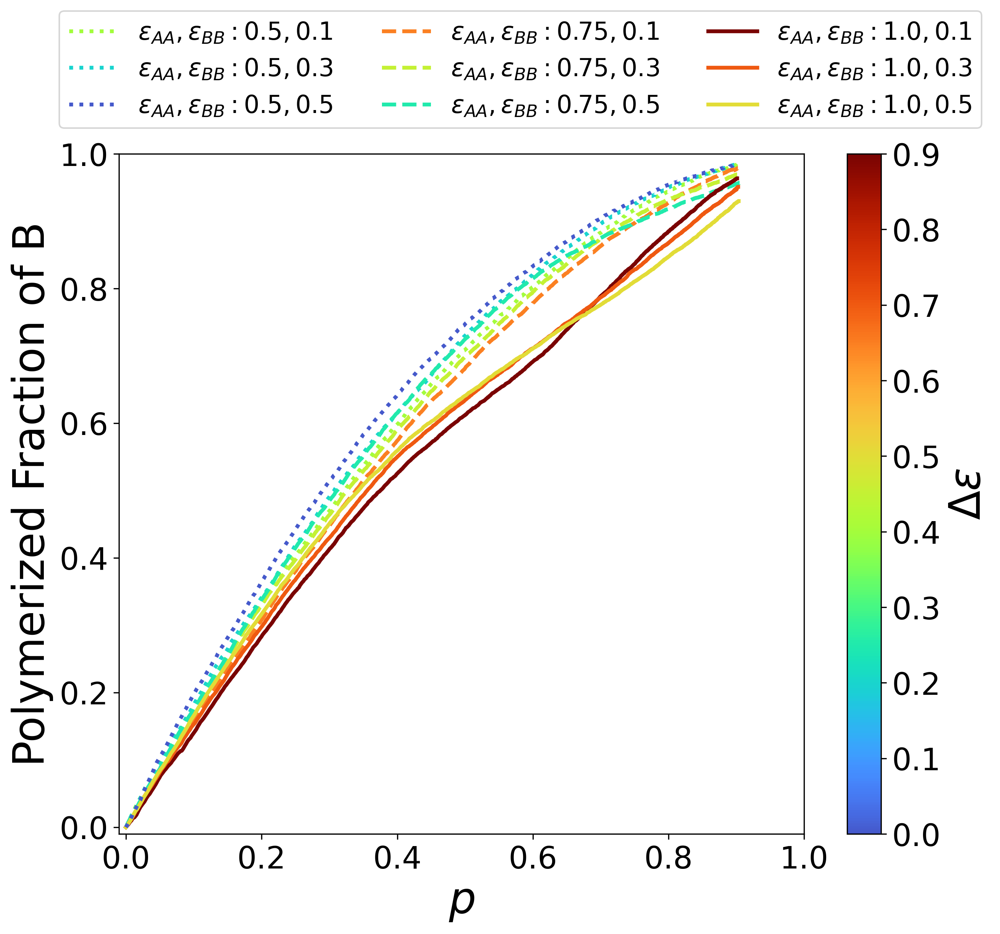

In [110]:
fig, host = plt.subplots(1,1,figsize = (10,8))

for i,sim in enumerate(sims):
    host.plot(flexible_sims[i][0],flexible_sims[i][11][1:],label=labels[i], color=cmap4(c_id4[i]), linestyle=epsAA_linestyles[i], linewidth=2.5)
    
host.set_xlabel('$p$')
host.set_ylabel('Polymerized Fraction of B')
host.set_xlim((-0.01,1.0))
host.set_ylim((-0.01,1.0))



host.legend(*([x[i] for i in [0,1,8,2,3,4,5,6,7]] for x in plt.gca().get_legend_handles_labels()),loc='lower left', ncol = 3, bbox_to_anchor=(-0.105,1.02), prop={'size':16});

plt.colorbar(sm4,ax=host,label=cb_labels[0]);

plt.show()

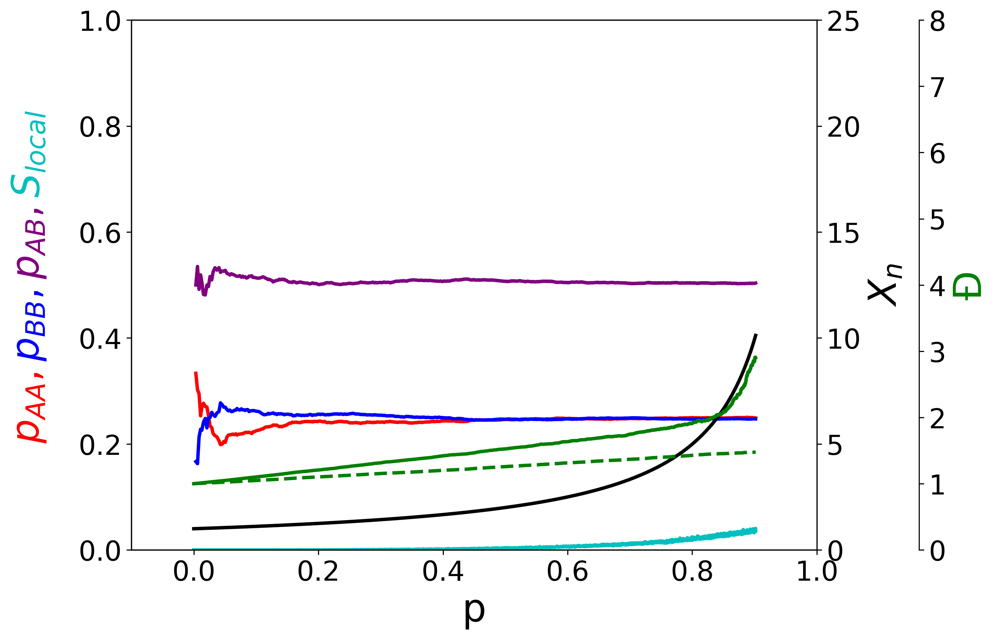

In [111]:


fig, host = plt.subplots(1,1,figsize=(9,7))
#fig.suptitle('$\epsilon_{AA} = 0.5 k_BT$, $\epsilon_{AB} = 0.2 k_BT$,  $\epsilon_{BB} = 0.1 k_BT$',fontsize=20)

par1 = host.twinx()
par2 = host.twinx()


host.set_xlim(-0.1, 1)
host.set_ylim(0, 1)
par1.set_ylim(0, 25)
par2.set_ylim(0, 8)

host.set_xlabel("p")
par1.set_ylabel(r"$X_n$")
par2.set_ylabel(u'\u0110')



# y-axis label
ybox1 = TextArea("$p_{AA}$,", textprops=dict(color="r", size=largesize ,rotation='vertical',ha='left',va='bottom'))
ybox2 = TextArea("$p_{BB}$,", textprops=dict(color="b", size=largesize,rotation='vertical',ha='left',va='bottom'))
ybox3 = TextArea("$p_{AB},$", textprops=dict(color="purple", size=largesize,rotation='vertical',ha='left',va='bottom'))
#ybox4 = TextArea("OligoRxn", textprops=dict(color="orange", size=15,rotation='vertical',ha='left',va='bottom'))
ybox5 = TextArea("$S_{local}$", textprops=dict(color="c", size=largesize,rotation='vertical',ha='left',va='bottom'))
ybox = VPacker(children= [ybox5, ybox3, ybox2, ybox1], align="center", pad=0, sep=8)


anchored_ybox = AnchoredOffsetbox(loc='center', child=ybox, pad=0., frameon=False,bbox_to_anchor=(-0.15, 0.5),bbox_transform=host.transAxes, borderpad=1.)



#sim index:
#    0         1          2         3         4            5          6          7                 8           9      10     11       12    13          14
#[extent_avg,order_avg,tstep_avg,probs_avg,blockAtotal,blockBtotal,chaindist,BlockA_PDI_avg,BlockB_PDI_avg,PDI_avg,pA_avg,pB_avg,seqs_all,Xn_avg,TotalBlock_PDI_avg]
# probs_avg index
#[pAA_avg,pAB_avg,pBB_avg]

for simid in [8]:
    #sim = sims[simid]
    sim = flexible_sims[simid]

    p1, = host.plot(sim[0], sim[3][0], label="pAA", color='r',linewidth=2.5)
    p2, = host.plot(sim[0], sim[3][2], label="pBB", color='b',linewidth=2.5)
    p_extra, = host.plot(sim[0], sim[3][1], label="pAB", color = 'purple',linewidth=2.5)
    p_extra3, = host.plot(sim[0], sim[1], label="$S_{local}$", color = 'c',linewidth=2.5)
    p3, = par1.plot(sim[0],sim[13] , label=r"X_n", color='k',linewidth=2.5) 
    p4, = par2.plot(sim[0], sim[9], label=u"\u0110", color='g',linewidth=2.5)
    p5, = par2.plot(sim[0],sim[14], label="Block PDI", color='g', linestyle='dashed',linewidth=2.5)
    lns = [p1, p2, p_extra, p_extra3, p3, p4, p5]







# right, left, top, bottom
par2.spines['right'].set_position(('outward', 75))

host.add_artist(anchored_ybox)
par1.yaxis.label.set_color(p3.get_color())
par2.yaxis.label.set_color(p4.get_color())
#host.legend(handles=lns, loc='best');

        
plt.show()

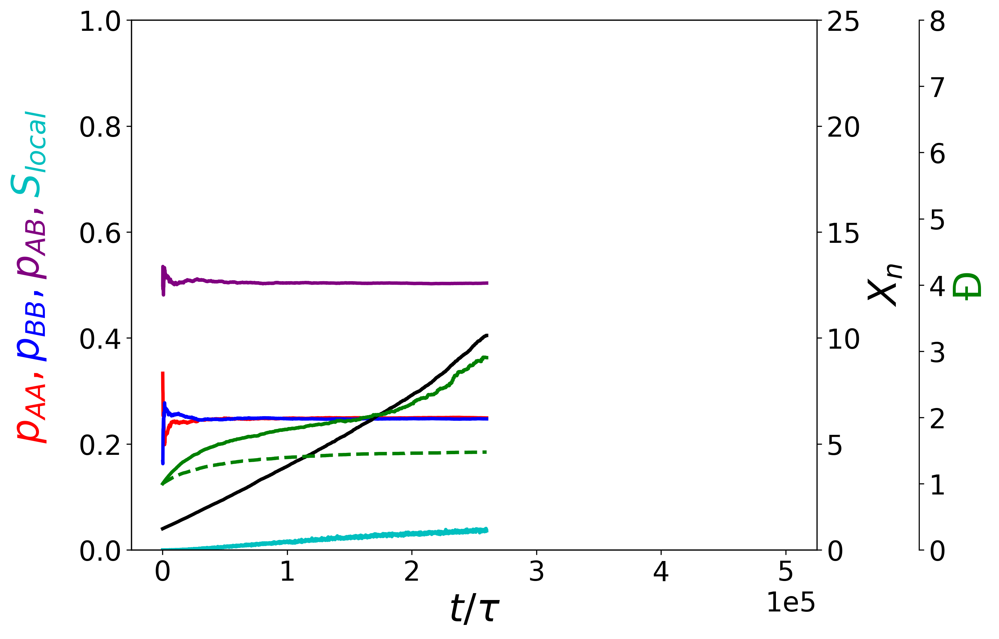

In [112]:
fig, host = plt.subplots(1,1,figsize=(9,7))
#fig.suptitle('$\epsilon_{AA} = 0.5 k_BT$, $\epsilon_{AB} = 0.2 k_BT$,  $\epsilon_{BB} = 0.1 k_BT$',fontsize=20)

par1 = host.twinx()
par2 = host.twinx()


host.set_xlim(-0.25e5, 5.25e5)
host.set_ylim(0, 1)
par1.set_ylim(0, 25)
par2.set_ylim(0, 8)

host.set_xlabel(r"$t/\tau$")
par1.set_ylabel(r"$X_n$")
par2.set_ylabel(u'\u0110')



# y-axis label
ybox1 = TextArea("$p_{AA}$,", textprops=dict(color="r", size=largesize ,rotation='vertical',ha='left',va='bottom'))
ybox2 = TextArea("$p_{BB}$,", textprops=dict(color="b", size=largesize,rotation='vertical',ha='left',va='bottom'))
ybox3 = TextArea("$p_{AB},$", textprops=dict(color="purple", size=largesize,rotation='vertical',ha='left',va='bottom'))
#ybox4 = TextArea("OligoRxn", textprops=dict(color="orange", size=15,rotation='vertical',ha='left',va='bottom'))
ybox5 = TextArea("$S_{local}$", textprops=dict(color="c", size=largesize,rotation='vertical',ha='left',va='bottom'))
ybox = VPacker(children= [ybox5, ybox3, ybox2, ybox1], align="center", pad=0, sep=8)


anchored_ybox = AnchoredOffsetbox(loc='center', child=ybox, pad=0., frameon=False,bbox_to_anchor=(-0.15, 0.5),bbox_transform=host.transAxes, borderpad=1.)



#sim index:
#    0         1          2         3         4            5          6          7                 8           9      10     11       12    13          14
#[extent_avg,order_avg,tstep_avg,probs_avg,blockAtotal,blockBtotal,chaindist,BlockA_PDI_avg,BlockB_PDI_avg,PDI_avg,pA_avg,pB_avg,seqs_all,Xn_avg,TotalBlock_PDI_avg]
# probs_avg index
#[pAA_avg,pAB_avg,pBB_avg]

for simid in [8]:
    #sim = sims[simid]
    sim = flexible_sims[simid]

    p1, = host.plot(0.001*sim[2], sim[3][0], label="pAA", color='r',linewidth=2.5)
    p2, = host.plot(0.001*sim[2], sim[3][2], label="pBB", color='b',linewidth=2.5)
    p_extra, = host.plot(0.001*sim[2], sim[3][1], label="pAB", color = 'purple',linewidth=2.5)
    p_extra3, = host.plot(0.001*sim[2], sim[1], label="$S_{local}$", color = 'c',linewidth=2.5)
    p3, = par1.plot(0.001*sim[2],sim[13] , label=r"X_n", color='k',linewidth=2.5) 
    p4, = par2.plot(0.001*sim[2], sim[9], label=u"\u0110", color='g',linewidth=2.5)
    p5, = par2.plot(0.001*sim[2],sim[14], label="Block PDI", color='g', linestyle='dashed',linewidth=2.5)
    lns = [p1, p2, p_extra, p_extra3, p3, p4, p5]






host.ticklabel_format(style='sci',scilimits=(3,0))
# right, left, top, bottom
par2.spines['right'].set_position(('outward', 75))

host.add_artist(anchored_ybox)
par1.yaxis.label.set_color(p3.get_color())
par2.yaxis.label.set_color(p4.get_color())
#host.legend(handles=lns, loc='best');

        
plt.show()

In [113]:


# fig, host = plt.subplots(1,1)
# #fig.suptitle('$\epsilon_{AA} = 0.5 k_BT$, $\epsilon_{AB} = 0.2 k_BT$,  $\epsilon_{BB} = 0.1 k_BT$',fontsize=20)

# #par1 = host.twinx()
# #par2 = host.twinx()


# host.set_xlim(-0.1, 1)
# host.set_ylim(0, 1)
# #par1.set_ylim(0, 25)
# #par2.set_ylim(0, 8)

# host.set_xlabel("p")
# #par1.set_ylabel(r"$X_n$")
# #par2.set_ylabel(u'\u0110')



# # y-axis label
# ybox1 = TextArea("$p_{AA}$,", textprops=dict(color="r", size=largesize ,rotation='vertical',ha='left',va='bottom'))
# ybox2 = TextArea("$p_{BB}$,", textprops=dict(color="b", size=largesize,rotation='vertical',ha='left',va='bottom'))
# ybox3 = TextArea("$p_{AB},$", textprops=dict(color="purple", size=largesize,rotation='vertical',ha='left',va='bottom'))
# #ybox4 = TextArea("OligoRxn", textprops=dict(color="orange", size=15,rotation='vertical',ha='left',va='bottom'))
# #ybox5 = TextArea("$S_{local}$", textprops=dict(color="c", size=largesize,rotation='vertical',ha='left',va='bottom'))
# ybox = VPacker(children= [ybox3, ybox2, ybox1], align="center", pad=0, sep=8)


# anchored_ybox = AnchoredOffsetbox(loc='center', child=ybox, pad=0., frameon=False,bbox_to_anchor=(-0.175, 0.4),bbox_transform=host.transAxes, borderpad=1.)



# #sim index:
# #    0         1          2         3         4            5          6          7                 8           9      10     11       12    13          14
# #[extent_avg,order_avg,tstep_avg,probs_avg,blockAtotal,blockBtotal,chaindist,BlockA_PDI_avg,BlockB_PDI_avg,PDI_avg,pA_avg,pB_avg,seqs_all,Xn_avg,TotalBlock_PDI_avg]
# # probs_avg index
# #[pAA_avg,pAB_avg,pBB_avg]

# for simid in [5,6,7]:
#     #sim = sims[simid]
#     sim = flexible_sims[simid]

#     p1, = host.plot(sim[0], sim[3][0], label="pAA", color='r')
#     p2, = host.plot(sim[0], sim[3][2], label="pBB", color='b')
#     p_extra, = host.plot(sim[0], sim[3][1], label="pAB", color = 'purple')
#     #p_extra3, = host.plot(sim[0], sim[1], label="$S_{local}$", color = 'c')
#     #p3, = par1.plot(sim[0],sim[13] , label=r"X_n", color='k') 
#     #p4, = par2.plot(sim[0], sim[9], label=u"\u0110", color='g')
#     #p5, = par2.plot(sim[0],sim[14], label="Block PDI", color='g', linestyle='dashed')
#     #lns = [p1, p2, p_extra, p_extra3, p3, p4, p5]







# # right, left, top, bottom
# #par2.spines['right'].set_position(('outward', 75))

# host.add_artist(anchored_ybox)
# #par1.yaxis.label.set_color(p3.get_color())
# #par2.yaxis.label.set_color(p4.get_color())
# #host.legend(handles=lns, loc='best');

        
# plt.show()